In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from math import log
import zipfile
import os
from pathlib import Path
import keras.utils as image
from sklearn.utils import shuffle
import random
import warnings
from PIL import Image
from sklearn import metrics
from sklearn.metrics import classification_report
from matplotlib import cm
import matplotlib.pyplot as plt
random.seed(42)

In [2]:
#with google colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
train = "/content/drive/MyDrive/Fall'22/BBM409/ass-4/Vegetable Images/train"
test =  "/content/drive/MyDrive/Fall'22/BBM409/ass-4/Vegetable Images/test"
validation = "/content/drive/MyDrive/Fall'22/BBM409/ass-4/Vegetable Images/validation"

In [4]:
def image_pros(path):
  X_ = []
  Y_ = []
  p = Path(path)
  dirs = p.glob("*")

  counter=0
  for i in dirs:
    label=str(i).split("/")[-1]
    count=0
      
    for j in i.glob("*.jpg"):
      img = image.load_img(j, color_mode = "grayscale" ,target_size=(60,60))
      img_array = image.img_to_array(img)
      X_.append(img_array.flatten())
      Y_.append([0 for i in range(15)])
      Y_[-1][counter] = 1
      count +=1
    
    counter +=1
  return X_, Y_


X_train, Y_train = image_pros(train)
X_test, Y_test = image_pros(test)
X_val, Y_val = image_pros(validation)

In [5]:
import numpy as np
import matplotlib.pyplot as plt
X_train = np.array(X_train)
Y_train = np.array(Y_train)
X_test = np.array(X_test)
Y_test = np.array(Y_test)
X_val = np.array(X_val)
Y_val = np.array(Y_val)

In [6]:
#Shuffle our data
X_train, Y_train = shuffle(X_train, Y_train,random_state=42)

#Normalisation
X_train = X_train/255.0
X_test = X_test/255.0
X_val = X_val/255.0

In [7]:
class Neural_Network:

  def __init__(self, hiden_layers, node_sizes, LR, batch_size, activ_func, epoch):
    self.hiden_layers = hiden_layers
    self.node_sizes = node_sizes
    self.LR = LR
    self.batch_size = batch_size
    self.activ_func = activ_func
    self.activ_outputs=0
    self.epoch = epoch

    weight_matrices = []
    biases = []

    for i in range(hiden_layers + 1):
      weight_matrices.append(np.random.randn(node_sizes[i+1], node_sizes[i])*0.1)
      biases.append(np.zeros((node_sizes[i+1],1)))

    self.weight_matrices = weight_matrices
    self.biases = biases


  def train(self, X_train, Y_train, X_val, Y_val, early_stopping):
    
    for i in range(self.epoch): # Epoch

      j= 0
      while j + self.batch_size < len(X_train):
        
        self.forward(X_train[j:j+self.batch_size])
        self.backward(X_train[j:j+self.batch_size], Y_train[j:j+self.batch_size])
        j += self.batch_size

      
      Y_predict = self.forward(X_train)
      

      a_out=np.argmax(Y_predict,0)
      y_out=np.argmax(Y_train.T,0)
      acc=np.mean(y_out==a_out)*100
      train_cost = self.compute_loss(Y_train.T, Y_predict)  #cost
      

      Y_predict = self.forward(X_val)
      
      a_out=np.argmax(Y_predict,0)
      y_val_out=np.argmax(Y_val.T,0)
      acc2=np.mean(y_val_out==a_out)*100

      val_cost = self.compute_loss(Y_val.T, Y_predict)   # cost

      
      
      print("Epoch {}: training cost = {}, validation cost = {}".format(i+1 ,train_cost, val_cost))
      print("Train Accuracy:",acc,"Validation Accuracy:",acc2)

      if early_stopping and i % 5 == 0 and val_cost > train_cost:
        break
  
  def predict(self, X_test):
    return self.forward(X_test)
        

  def compute_loss(self, Y, Y_predict):
        
    m=Y.shape[1]
    cost=-(1/m)*np.sum(Y*np.log(Y_predict))

    cost=np.squeeze(cost)

    return cost

  def forward(self, x):
    activ_outputs = [[] for i in range(len(self.weight_matrices) + 1)]
    activ_outputs[0] = x.T

    for i in range(len(self.weight_matrices)):
      self.z = np.dot(self.weight_matrices[i], activ_outputs[i]) + self.biases[i]     
      activation_func = self.activ_func[i]
      activ_outputs[i+1] = eval("self." + activation_func + "()")

    self.activ_outputs=activ_outputs

    return activ_outputs[-1]

  def backward(self, x, y):

    m = x.shape[0]

    cache = self.weight_matrices
    cache_bias = self.biases

    delta = self.activ_outputs[-1] - y.T
    wn = (1/m) * np.dot(delta, self.activ_outputs[-2].T)
    bn = (1/m) * (np.sum(delta, axis=1,keepdims=True))


    cache[-1] -= self.LR * wn
    cache_bias[-1] -= self.LR * bn

    

    for i in range(len(self.weight_matrices)-1, 0, -1):
      self.out = self.activ_outputs[i]
      activ_func = self.activ_func[i-1]

      delta = np.dot(self.weight_matrices[i].T, delta) * eval("self.derivative_{}{}".format(activ_func, "()" ))
      wn = (1/m) *(np.dot(delta, self.activ_outputs[i-1].T))
      bn = (1/m) *(np.sum(delta, axis=1,keepdims=True))

      cache[i-1] -= self.LR * wn
      cache_bias[i-1] -= self.LR * bn

    self.weight_matrices = cache
    self.biases = cache_bias

  def relu(self):
    return np.maximum(0, self.z)


  def softmax(self):
    
    expZ = np.exp(self.z)
    return expZ/(np.sum(expZ, 0))

  def sigmoid(self):
    warnings.filterwarnings('ignore')
    return np.divide(1, np.add(1, np.exp(-self.z)))

  def tanh(self):
    # t=(np.exp(self.z)-np.exp(-self.z))/(np.exp(self.z)+np.exp(-self.z))
    # return t
    return np.tanh(self.z)

  def derivative_relu(self):

    y = np.zeros_like(self.out)
    y[self.out> 0] = 1

    return y

  def derivative_tanh(self):
    return (1 - np.power(self.out, 2))

  def derivative_sigmoid(self):
    return (1 - np.power(self.out, 2))

  def confusion_m(self, x, y):
    pred = self.predict(x)

    a_out=np.argmax(pred,0)
    y_out=np.argmax(y.T,0)

    acc=np.mean(y_out==a_out)*100

    confusion_matrix = metrics.confusion_matrix(y_out, a_out)

    print(classification_report(y_out, a_out, digits=3))
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [
    'Bean',
    'Bitter_Gourd',
    'Bottle_Gourd',
    'Brinjal',
    'Broccoli',
    'Cabbage',
    'Capsicum',
    'Carrot',
    'Cauliflower',
    'Cucumber',
    'Papaya',
    'Potato',
    'Pumpkin',
    'Radish',
    'Tomato'])

    fig, ax = plt.subplots(figsize=(18,18))
    cm_display.plot(ax=ax) 
    plt.show()


  def visualize_weights(self,n):


    display_labels = [
        'Bean',
        'Bitter_Gourd',
        'Bottle_Gourd',
        'Brinjal',
        'Broccoli',
        'Cabbage',
        'Capsicum',
        'Carrot',
        'Cauliflower',
        'Cucumber',
        'Papaya',
        'Potato',
        'Pumpkin',
        'Radish',
        'Tomato']
    counter = 0
    for i in self.weight_matrices[-1]:
      array =  i.reshape(n,n)
      array -= array.min()
      array *= 255.0/ array.max()
    
      im = Image.fromarray(array)
      plt.figure(figsize = (5,5))
      print(display_labels[counter])
      counter +=1
      plt.imshow(im)
      plt.show()

  def save_mode(self):
    np.save("weight_matrix", self.weight_matrices[-1])


# **REPORT**


In this Assignment, We developed a Multi-Layer Perceptron (MLP) neural network to classify 15 different types of vegetable images. The network was trained on a dataset containing 15000 training data, 3000 validation data and 3000 test data. We experimented with various parameters such as **Learning Rate, Batch Size, Activation Functions and number of Hidden Layers** and evaluated the performance of the model based on the train, validation and test accuracy and cost values.

## **Description of MLP Neural Network:**

An MLP neural network is a type of artificial neural network that consists of multiple layers and multiple hidden units. It processes the input data in a sequential manner and produces a classification or prediction as output. In our model, the MLP neural network had the capability to classify 15 different types of vegetables and could be composed of 0, 1 or 2 hidden layers.

### Dataset:

The dataset used for training and evaluating the performance of the model contained 15000 training samples, 3000 validation samples and 3000 test samples. These samples were representative of 15 different types of vegetables. The model was trained on this dataset and attempted to classify or predict the type of vegetable based on the input data.

### Forward Propagation:

In the process of forward propagation, the input data is fed through the hidden layers of the neural network towards the output layer. At each hidden layer, the data is processed by the hidden units. This process continues until the output layer is reached and a result is produced.

### Backward Propagation:

Backward propagation is a method used in the training process of a neural network. It helps to understand how the predictions of the network are compared to the actual values and how the accuracy of these predictions can be improved. The process starts by comparing the predictions at the output layer of the network to the actual values. The error resulting from this comparison is then propagated back through the remaining layers of the network, updating the weights and bias values of the hidden units. In this way, the predictions of the network are iteratively corrected in an attempt to increase the accuracy value.

### Early Stopping:
Early stopping is a method used to prevent overfitting in machine learning models by stopping the training process before the model's validation error reaches its minimum. We added early stopping to our code, but since our validation cost is always lower than traning, it was meaningless to use it in our tests.

**Gradient Descent Formulas for Derivated Sigmoid Function:**
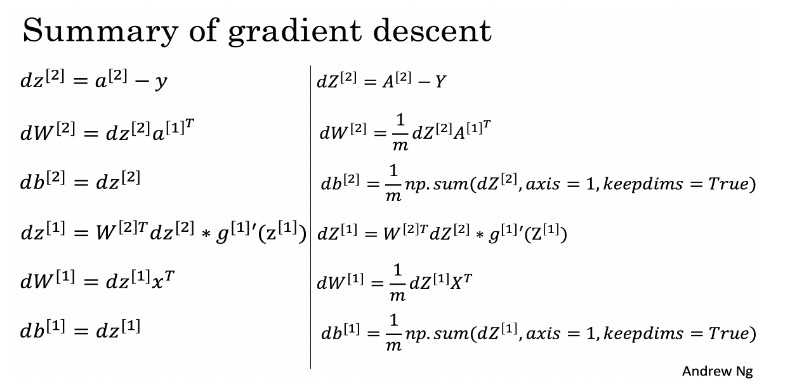


**Derivated Tanh function:**

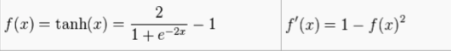


```
def derivative_tanh(self):
  return (1 - np.power(self.out, 2))
```

**Derivated ReLu Function:**
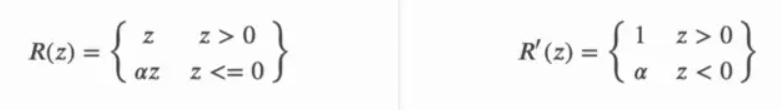




```
def derivative_relu(self):

  y = np.zeros_like(self.out)
  y[self.out> 0] = 1

  return y
```



**Loss Function - Negative Log Likelihood**

  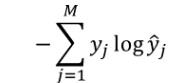


```
def compute_loss(self, Y, Y_predict):
      
  m=Y.shape[1]
  cost=-(1/m)*np.sum(Y*np.log(Y_predict))
  cost=np.squeeze(cost)

  return cost
```




## **Experimentation with Parameters:**

We experimented with various parameters in order to improve the performance of the model. The following are the results of our experimentation:

### **Learning rate:** 
As the learning rate increased, the train, validation and test accuracy values also increased. However, a very high learning rate could degrade the performance of the model.
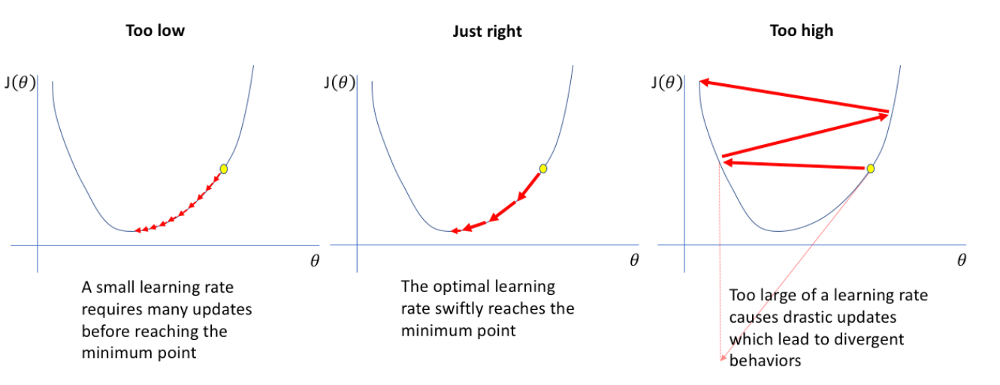

### **Batch size:** 
The smaller the batch size, the more backward operations are performed. So, As the batch size increased, the train and validation accuracy values decreased. 

### **Activation functions:** 
Among the activation functions tested (sigmoid, tanh, relu), the model performed the best with the tanh activation function in terms of accuracy. The lowest accuracy was achieved with the relu activation function.

One potential problem with using the ReLU activation function is that it can sometimes produce **"exploding gradients."** This occurs when the gradients of the parameters with respect to the loss function become very large, resulting in unstable or divergent learning. This can be caused by a number of factors, including having too large of learning rates, too deep of neural networks, or having poorly initialized weights. We think this problem is located in our Relu function. Because when we use other activation functions, we never got nan cost results like here.


### **Number of hidden layers:** 
The model performed the best with 1 hidden layer in terms of accuracy, followed by 2 hidden layers and then 0 hidden layers.

## **Conclusion:**

Based on the results of our experimentation, we can conclude that the MLP neural network was able to classify 15 different types of vegetables with a certain degree of accuracy. The model performed the best with a moderate learning rate, small batch size, tanh activation function and 1 hidden layer. 

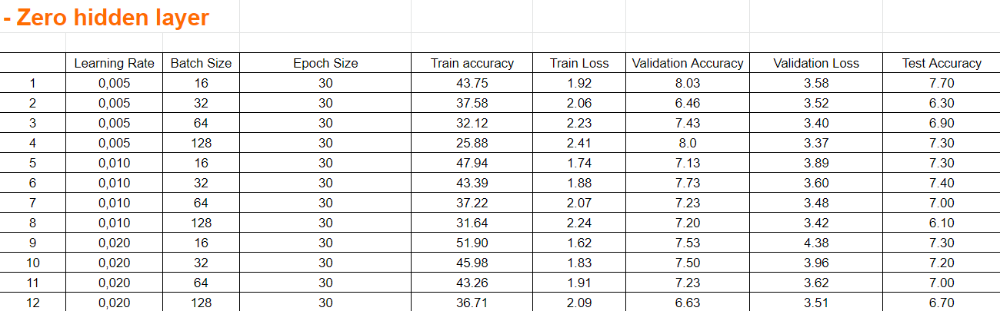

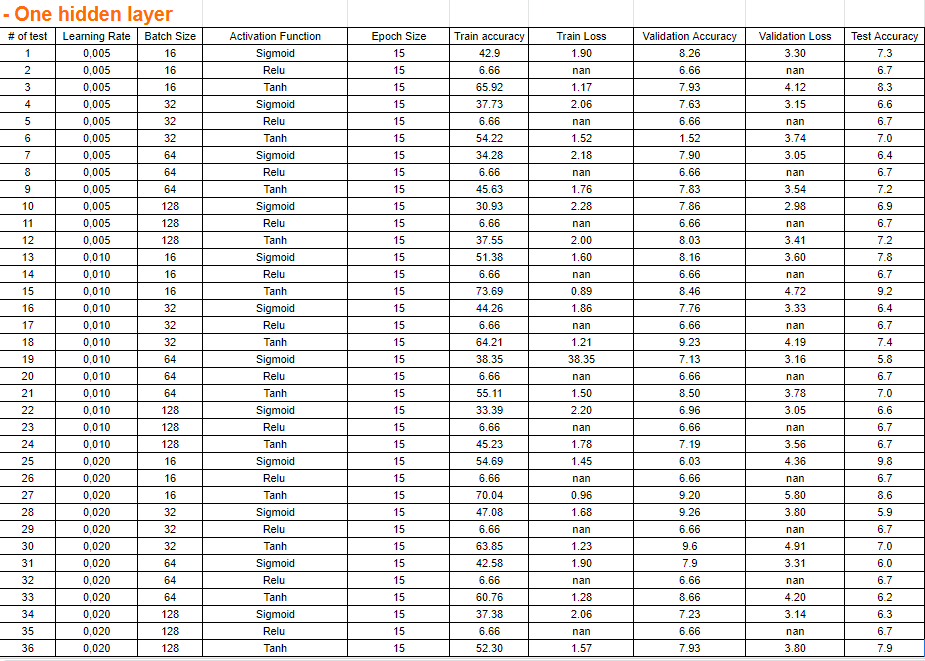

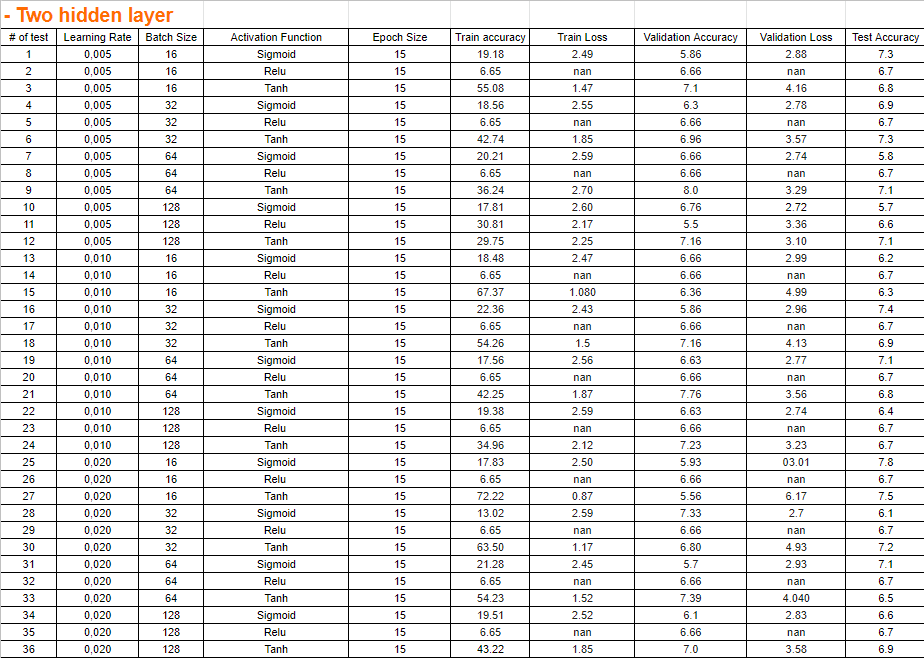

## **Description of CNN(VGG-19):**

VGG-19 is a convolutional neural network model trained on the ImageNet dataset. It was developed by the Visual Geometry Group (VGG) at the University of Oxford. The model is trained to classify images into one of 1000 classes, such as "dog," "cat," or "car."

The VGG-19 model is a 19-layer deep convolutional neural network that uses small 3x3 filters in all of its convolutional layers. The model is composed of a series of convolutional and max pooling layers, followed by a few fully connected (dense) layers. The input to the model is a 224x224x3 image, and the output is a 1000-dimensional vector of class probabilities.

One of the key features of the VGG-19 model is its use of very small filters (3x3) in all of its convolutional layers. This is in contrast to other models that may use larger filters in some layers and smaller filters in others. The use of small filters allows the model to learn more fine-grained features, at the expense of a larger number of parameters.

###**Model Evaluations**
We created 4 different groups for model trainings and tests. 

####**Include the weights of all layers without early stopping**:

Our model approached 100% accuracy, but it started to become overfit at 90% accuracy. 

Loss showed overfit after 0.4 loss.

In other words, there is an overfit condition observed after the 6th epoch

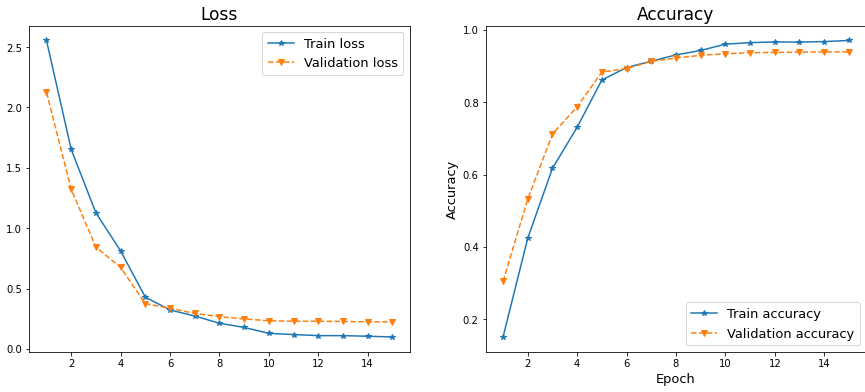



The model performed best on the 7th class. but overall it achieved precision recall f1 score and accuracy over 90%. This shows that overfitting is still not much.

The **best** class is **carrot**. F1 score -> 0.987

The **worst** class is **cabbage**. F1 score -> 0.888

The accuracy is lower than train accuracy and same as validation accuracy.





```
Confusion Matrix:

[[181   0   1   3   0   5   0   0   2   6   0   1   0   0   1]
 [  0 192   0   0   1   0   0   0   0   1   0   0   6   0   0]
 [  0   0 198   0   0   0   1   0   0   0   1   0   0   0   0]
 [  2   0   0 184   0   2   0   0   0   6   3   0   1   0   2]
 [  0   0   0   1 192   4   0   0   3   0   0   0   0   0   0]
 [  4   0   0   1   1 183   0   0   7   3   0   0   1   0   0]
 [  1   0   3   0   0   0 193   0   0   0   3   0   0   0   0]
 [  0   0   0   0   0   0   1 196   0   0   0   3   0   0   0]
 [  1   0   0   0   1   4   0   0 187   4   0   1   1   0   1]
 [  2   3   2   8   0   3   0   0   0 179   1   0   2   0   0]
 [  0   0   3   1   0   0   1   0   0   1 192   0   1   0   1]
 [  0   0   0   0   0   0   1   0   0   0   0 199   0   0   0]
 [  0   5   0   2   7   7   0   0   2   2   0   0 173   0   2]
 [  2   0   0   0   0   0   1   0   0   0   0   0   1 195   1]
 [  3   0   0   5   0   4   2   1   1   0   1   1   3   4 175]]

              precision    recall  f1-score   support

           0      0.923     0.905     0.914       200
           1      0.960     0.960     0.960       200
           2      0.957     0.990     0.973       200
           3      0.898     0.920     0.909       200
           4      0.950     0.960     0.955       200
           5      0.863     0.915     0.888       200
           6      0.965     0.965     0.965       200
           7      0.995     0.980     0.987       200
           8      0.926     0.935     0.930       200
           9      0.886     0.895     0.891       200
          10      0.955     0.960     0.958       200
          11      0.971     0.995     0.983       200
          12      0.915     0.865     0.889       200
          13      0.980     0.975     0.977       200
          14      0.956     0.875     0.914       200

    accuracy                          0.940      3000
   macro avg      0.940     0.940     0.940      3000
weighted avg      0.940     0.940     0.940      3000
```


####**Include the weights of all layers with early stopping**:

Overfitting was observed after the 7th epoch. Our Early stopping system checks for overfitting every 3 epochs. Here, in the 9th epoch, education was stopped.

The reason for the difference in the loss and accuracy values compared to the previous model is completely related to the different mixing of the train dataset.

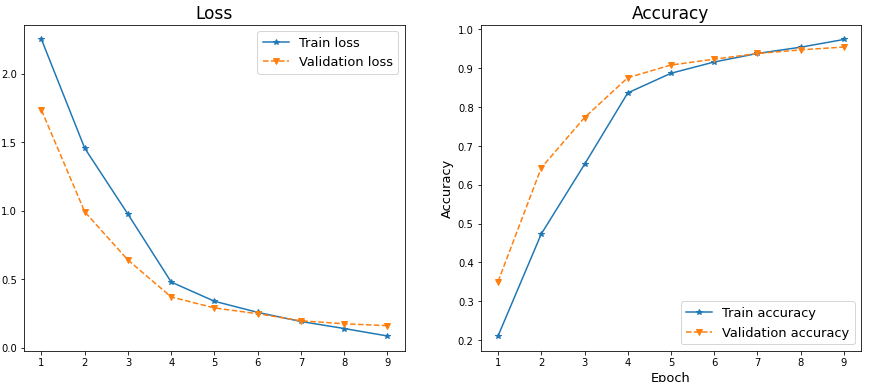

The model performed best on the 7th class. but overall it achieved precision recall f1 score and accuracy over 93%. This shows that overfitting is still not much.

The **best** class is **carrot**. F1 score -> 0.993

The **worst** class is **pumpkin**. F1 score -> 0.912

In here accuray is higher than validation accuracy however lower than training accuracy. If we compare this accuracy with "Without early stopping" model accuracy this one is better.



```
Confusion Matrix:

[[196   0   0   1   0   3   0   0   0   0   0   0   0   0   0]
 [  0 197   0   0   1   0   0   0   1   0   0   0   0   1   0]
 [  0   0 197   0   0   0   0   0   0   0   3   0   0   0   0]
 [  2   0   2 188   0   1   0   0   0   5   2   0   0   0   0]
 [  1   1   0   2 187   6   0   0   2   0   0   0   1   0   0]
 [  0   0   0   0   0 196   0   0   1   0   0   0   3   0   0]
 [  0   0   1   1   0   0 194   2   0   0   2   0   0   0   0]
 [  0   0   0   0   0   0   0 200   0   0   0   0   0   0   0]
 [  1   1   0   0   0   1   0   0 182   0   0   1   9   2   3]
 [  5   0   0   7   0   1   0   0   1 185   0   0   1   0   0]
 [  0   0   1   1   0   0   1   0   0   0 196   0   0   0   1]
 [  0   0   0   0   0   0   0   0   0   0   0 197   0   3   0]
 [  0   2   0   1   4   1   2   0   6   0   0   0 181   0   3]
 [  0   0   0   0   0   0   0   0   1   0   0   5   0 194   0]
 [  1   0   2   5   0   0   5   1   3   0   0   0   2   1 180]]

              precision    recall  f1-score   support

           0      0.951     0.980     0.966       200
           1      0.980     0.985     0.983       200
           2      0.970     0.985     0.978       200
           3      0.913     0.940     0.926       200
           4      0.974     0.935     0.954       200
           5      0.938     0.980     0.958       200
           6      0.960     0.970     0.965       200
           7      0.985     1.000     0.993       200
           8      0.924     0.910     0.917       200
           9      0.974     0.925     0.949       200
          10      0.966     0.980     0.973       200
          11      0.970     0.985     0.978       200
          12      0.919     0.905     0.912       200
          13      0.965     0.970     0.968       200
          14      0.963     0.900     0.930       200

    accuracy                          0.957      3000
   macro avg      0.957     0.957     0.957      3000
weighted avg      0.957     0.957     0.957      3000
```





####**Only Fully Connected layers without early stopping**:


Loss and accuracy are very high. In addition, when we compare the validation accuracy with the Trainin accuracy, there is no overfitting situation. In addition, these models, which include only fully connected, worked better than our first two models, that is, trainings involving all layers.  


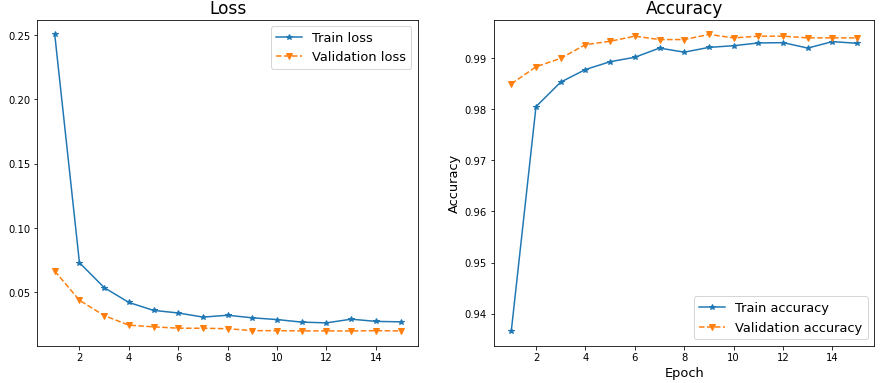


Looking at the test evaluation, it achieved better accuracy than Train and Validation accuracy. So our model works really well. We get almost 100% accuracy.
Besides these, there are values ​​with **f1 score of 1**. They were predicted 100% correctly on the test set.

These:
**Bottle_Gourd, Carrot, Potato, Radish** are classes.

The worst are **Brinjal and Papaya** classes with an **F1 score of 0.99**. But of course, it would be very wrong to call the value of 99% bad. The bad among the good.


```
Confusion Matrix:

[[200   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 198   0   0   0   0   0   0   0   1   0   0   1   0   0]
 [  0   0 200   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0 198   0   0   0   0   0   1   1   0   0   0   0]
 [  0   0   0   0 198   1   0   0   1   0   0   0   0   0   0]
 [  0   0   0   1   0 198   0   0   1   0   0   0   0   0   0]
 [  0   0   0   0   0   0 200   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0 200   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0 200   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   1 199   0   0   0   0   0]
 [  0   0   0   0   0   0   1   0   0   0 199   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0 200   0   0   0]
 [  0   0   0   1   0   0   1   0   1   0   0   0 197   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0 200   0]
 [  1   0   0   0   0   0   0   0   0   0   0   0   0   0 199]]

              precision    recall  f1-score   support

           0      0.995     1.000     0.998       200
           1      1.000     0.990     0.995       200
           2      1.000     1.000     1.000       200
           3      0.990     0.990     0.990       200
           4      1.000     0.990     0.995       200
           5      0.995     0.990     0.992       200
           6      0.990     1.000     0.995       200
           7      1.000     1.000     1.000       200
           8      0.980     1.000     0.990       200
           9      0.990     0.995     0.993       200
          10      0.995     0.995     0.995       200
          11      1.000     1.000     1.000       200
          12      0.995     0.985     0.990       200
          13      1.000     1.000     1.000       200
          14      1.000     0.995     0.997       200

    accuracy                          0.995      3000
   macro avg      0.995     0.995     0.995      3000
weighted avg      0.995     0.995     0.995      3000
```

####**Only Fully Connected layers with early stopping**:


This model is the same as the previous model. Compared to the previous model, we only added early stopping here, but since the model did not need early stopping, it completed 15 epochs and got a similar output. Although there is a difference, this is due to the shuffle of the train and validation dataset.

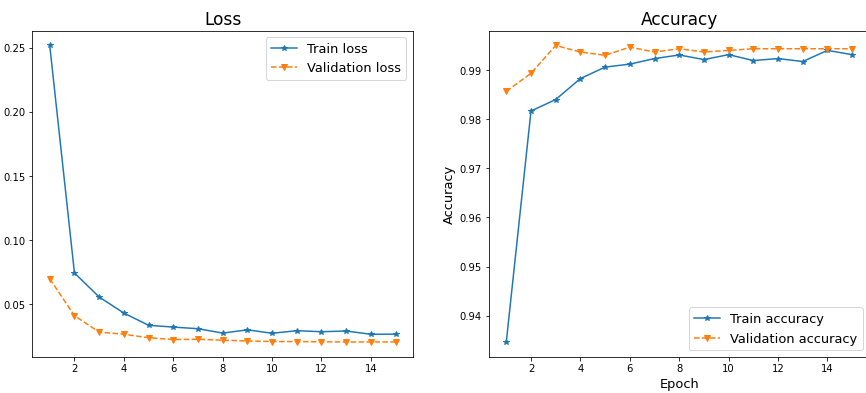

The comment to be made here is very similar to the previous one. Again, the model's accuracy value is better than train and validation. **Those with an F1 score of 1 are still the same classes.**

These:

**Bottle_Gourd, Carrot, Potato, Radish **are classes.

In the bad ones,** Brinjalin** f1 score decreased very little.** Papaya'**s remained the same.


```
Confusion Matrix:

[[200   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 198   0   0   0   0   0   0   0   1   0   0   1   0   0]
 [  0   0 200   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0 197   0   0   0   0   0   2   1   0   0   0   0]
 [  0   0   0   0 199   1   0   0   0   0   0   0   0   0   0]
 [  0   0   0   1   0 198   0   0   1   0   0   0   0   0   0]
 [  0   0   0   0   0   0 200   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0 200   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0 200   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   1 198   1   0   0   0   0]
 [  0   0   0   0   0   0   1   0   0   0 199   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0 200   0   0   0]
 [  0   0   0   1   0   0   1   0   1   0   0   0 197   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0 200   0]
 [  1   0   0   0   0   0   0   0   0   0   0   0   0   0 199]]

              precision    recall  f1-score   support

           0      0.995     1.000     0.998       200
           1      1.000     0.990     0.995       200
           2      1.000     1.000     1.000       200
           3      0.990     0.985     0.987       200
           4      1.000     0.995     0.997       200
           5      0.995     0.990     0.992       200
           6      0.990     1.000     0.995       200
           7      1.000     1.000     1.000       200
           8      0.985     1.000     0.993       200
           9      0.985     0.990     0.988       200
          10      0.990     0.995     0.993       200
          11      1.000     1.000     1.000       200
          12      0.995     0.985     0.990       200
          13      1.000     1.000     1.000       200
          14      1.000     0.995     0.997       200

    accuracy                          0.995      3000
   macro avg      0.995     0.995     0.995      3000
weighted avg      0.995     0.995     0.995      3000
```



## **Compare Part-1 with Part-2:**

To compare the results of part1 with two hidden layers here, we have chosen the best accuracy in part1.

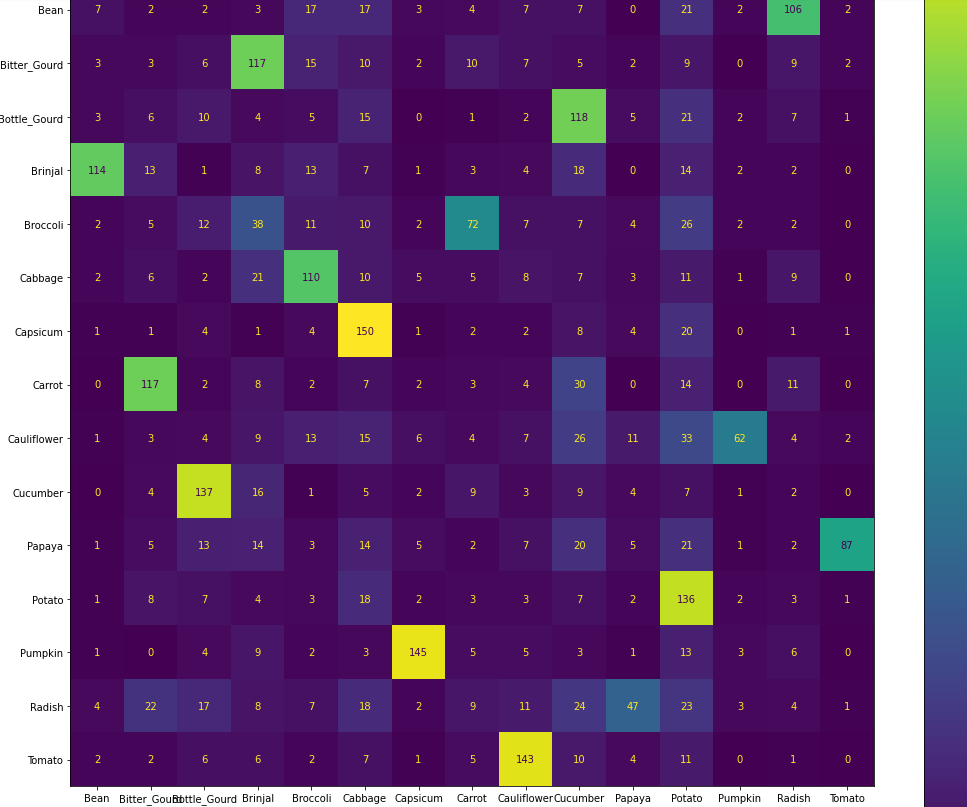

MLP model metrics:


```
              precision    recall  f1-score   support

           0      0.049     0.035     0.041       200
           1      0.015     0.015     0.015       200
           2      0.044     0.050     0.047       200
           3      0.030     0.040     0.034       200
           4      0.053     0.055     0.054       200
           5      0.033     0.050     0.040       200
           6      0.006     0.005     0.005       200
           7      0.022     0.015     0.018       200
           8      0.032     0.035     0.033       200
           9      0.030     0.045     0.036       200
          10      0.054     0.025     0.034       200
          11      0.358     0.680     0.469       200
          12      0.037     0.015     0.021       200
          13      0.024     0.020     0.022       200
          14      0.000     0.000     0.000       200

    accuracy                          0.072      3000
   macro avg      0.052     0.072     0.058      3000
weighted avg      0.052     0.072     0.058      3000

```

The confusion matrix seen above is the output of the model trained with 0.02 learning rate 16 batch size tanh+tanh activation functions. The result from all the model trained in VGG-19 are better than this one. This is because VGG-19 is a pretrained model. Also, our mlp model didn't perform well on validation and test data.

# Zero Hiden Layer

In [ ]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.005, batch_size = 16, activ_func = ["softmax"] , epoch =30)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.713086191985648, validation cost = 3.3882635747588945
Train Accuracy: 17.326666666666668 Validation Accuracy: 7.133333333333333
Epoch 2: training cost = 2.568254783248677, validation cost = 3.4167345798898423
Train Accuracy: 21.153333333333332 Validation Accuracy: 7.3
Epoch 3: training cost = 2.4789790091116046, validation cost = 3.428638460883331
Train Accuracy: 23.906666666666666 Validation Accuracy: 7.3999999999999995
Epoch 4: training cost = 2.4139582486679827, validation cost = 3.4385455248878096
Train Accuracy: 26.07333333333333 Validation Accuracy: 7.5
Epoch 5: training cost = 2.362577790372831, validation cost = 3.4478949439945534
Train Accuracy: 27.913333333333334 Validation Accuracy: 7.7
Epoch 6: training cost = 2.3198718604629525, validation cost = 3.456700895232357
Train Accuracy: 29.366666666666667 Validation Accuracy: 7.666666666666666
Epoch 7: training cost = 2.2831536890326167, validation cost = 3.464976025252815
Train Accuracy: 30.37333333333

              precision    recall  f1-score   support

           0      0.516     0.330     0.402       200
           1      0.039     0.035     0.037       200
           2      0.060     0.090     0.072       200
           3      0.007     0.005     0.006       200
           4      0.433     0.195     0.269       200
           5      0.035     0.045     0.039       200
           6      0.043     0.090     0.058       200
           7      0.024     0.020     0.022       200
           8      0.036     0.040     0.038       200
           9      0.068     0.040     0.050       200
          10      0.060     0.050     0.054       200
          11      0.021     0.035     0.026       200
          12      0.000     0.000     0.000       200
          13      0.018     0.015     0.016       200
          14      0.066     0.055     0.060       200

    accuracy                          0.070      3000
   macro avg      0.095     0.070     0.077      3000
weighted avg      0.095   

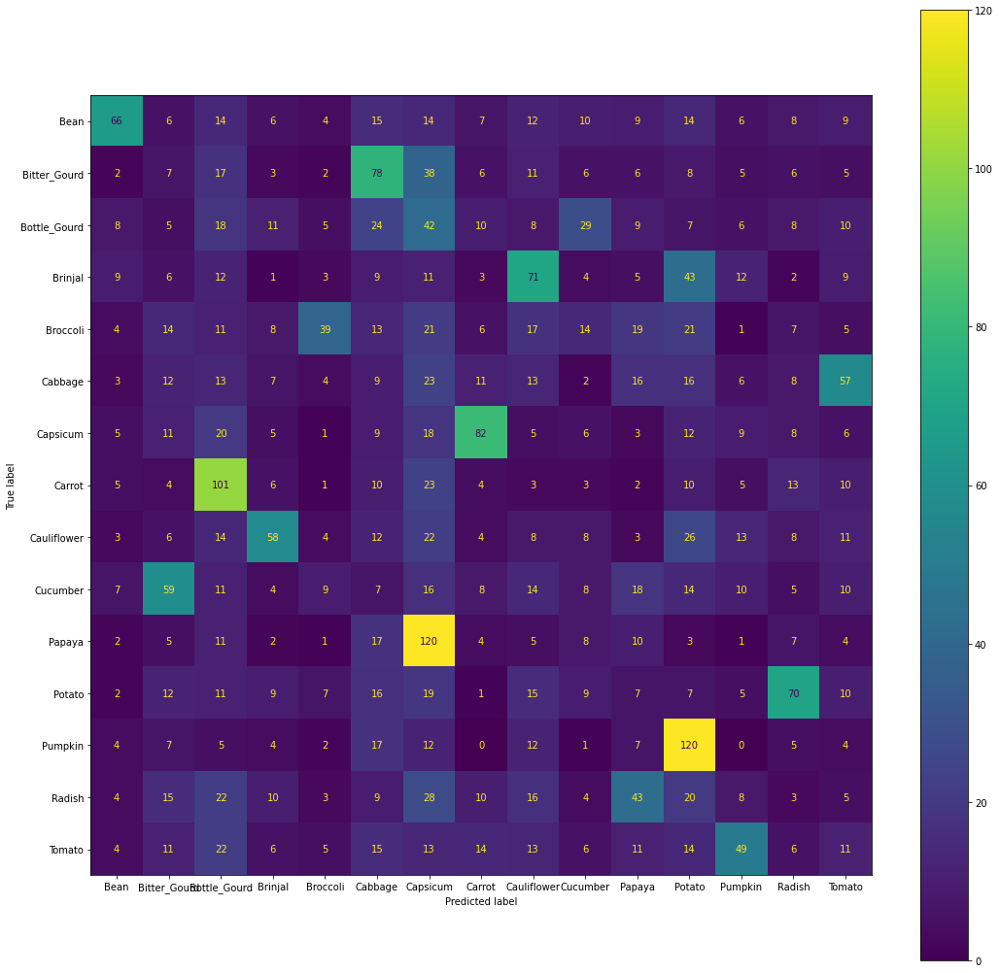

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


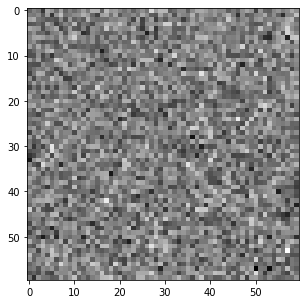

Bitter_Gourd


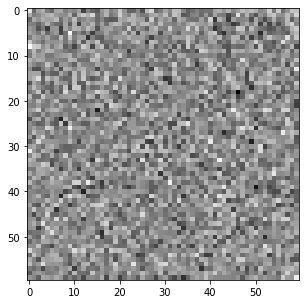

Bottle_Gourd


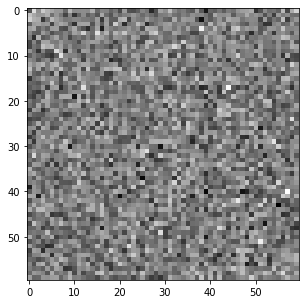

Brinjal


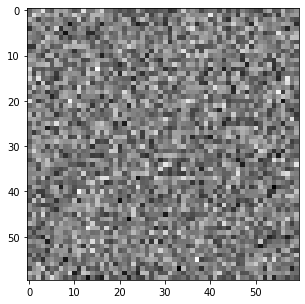

Broccoli


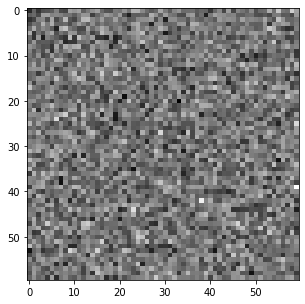

Cabbage


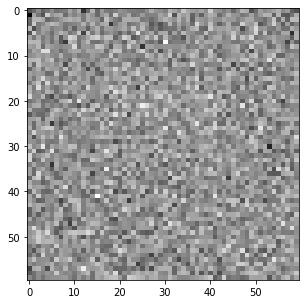

Capsicum


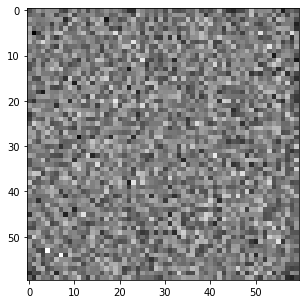

Carrot


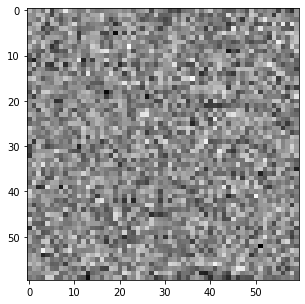

Cauliflower


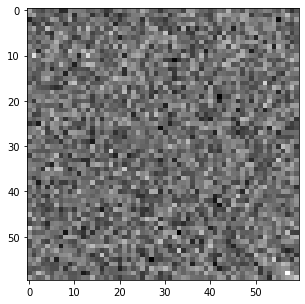

Cucumber


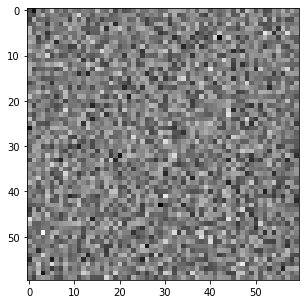

Papaya


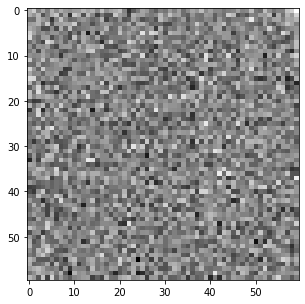

Potato


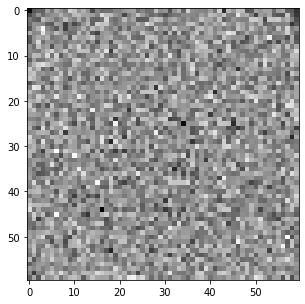

Pumpkin


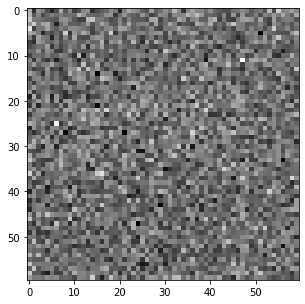

Radish


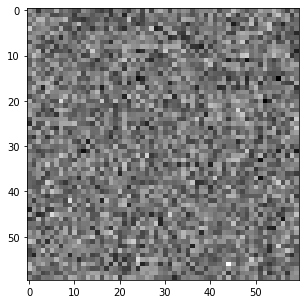

Tomato


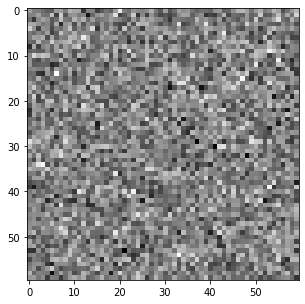

In [ ]:
model.visualize_weights(60)

In [ ]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.005, batch_size = 32, activ_func = ["softmax"] , epoch =30)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.865136437847245, validation cost = 3.3910410500833046
Train Accuracy: 13.453333333333333 Validation Accuracy: 6.666666666666667
Epoch 2: training cost = 2.718486592818752, validation cost = 3.423154174954183
Train Accuracy: 16.233333333333334 Validation Accuracy: 6.866666666666667
Epoch 3: training cost = 2.626730076699686, validation cost = 3.4376077433387424
Train Accuracy: 18.793333333333333 Validation Accuracy: 7.366666666666667
Epoch 4: training cost = 2.5596418121569355, validation cost = 3.4446215285069566
Train Accuracy: 21.246666666666666 Validation Accuracy: 7.1
Epoch 5: training cost = 2.5070948877500796, validation cost = 3.449110152901055
Train Accuracy: 22.853333333333335 Validation Accuracy: 7.033333333333333
Epoch 6: training cost = 2.4641059052793923, validation cost = 3.452856003942754
Train Accuracy: 24.273333333333333 Validation Accuracy: 7.033333333333333
Epoch 7: training cost = 2.4278043863133765, validation cost = 3.4564339052051842
Tr

              precision    recall  f1-score   support

           0      0.419     0.270     0.328       200
           1      0.036     0.030     0.033       200
           2      0.074     0.075     0.074       200
           3      0.026     0.025     0.025       200
           4      0.392     0.145     0.212       200
           5      0.048     0.065     0.055       200
           6      0.033     0.045     0.038       200
           7      0.025     0.035     0.029       200
           8      0.033     0.045     0.038       200
           9      0.044     0.035     0.039       200
          10      0.066     0.085     0.074       200
          11      0.032     0.040     0.036       200
          12      0.012     0.010     0.011       200
          13      0.015     0.010     0.012       200
          14      0.040     0.035     0.038       200

    accuracy                          0.063      3000
   macro avg      0.086     0.063     0.069      3000
weighted avg      0.086   

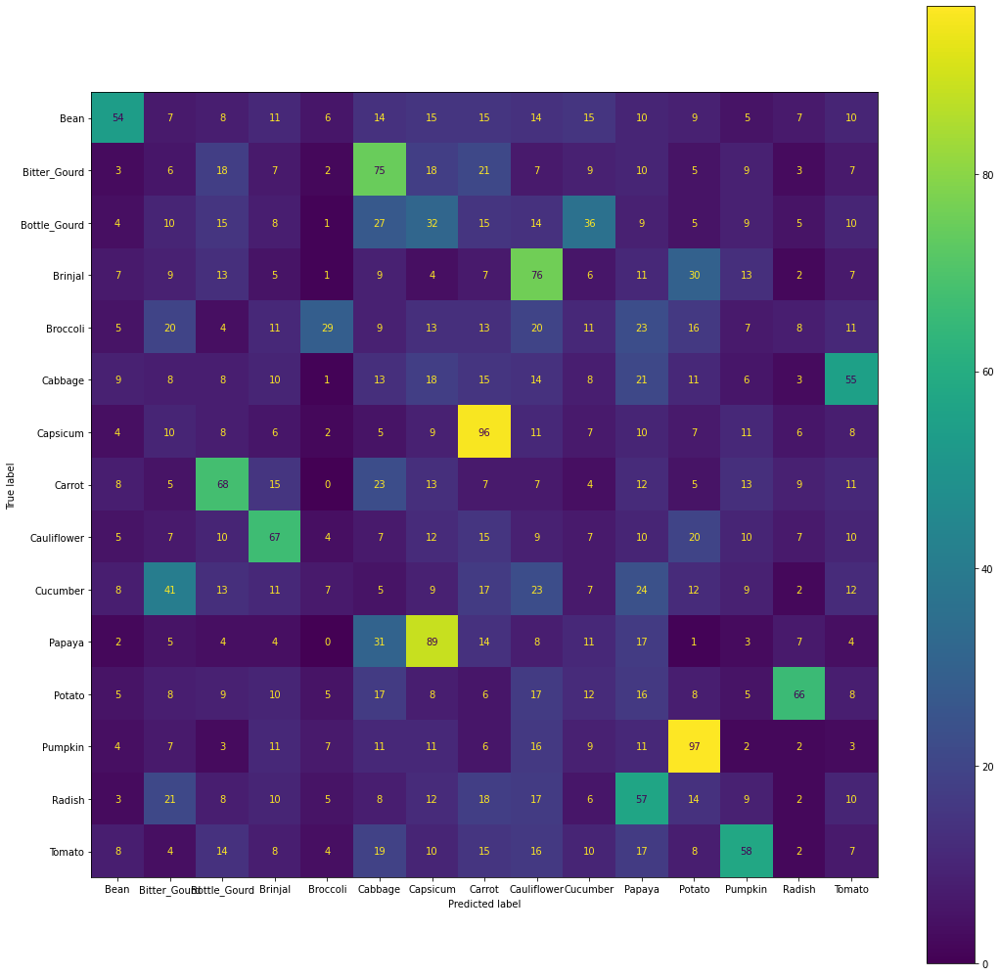

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


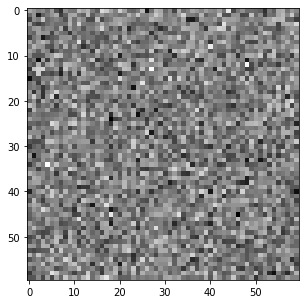

Bitter_Gourd


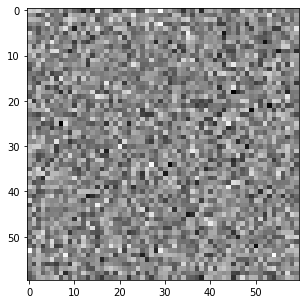

Bottle_Gourd


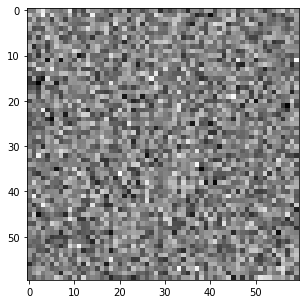

Brinjal


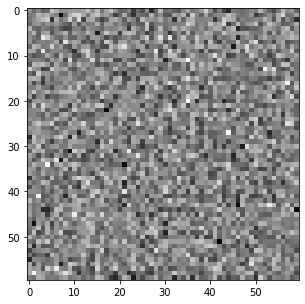

Broccoli


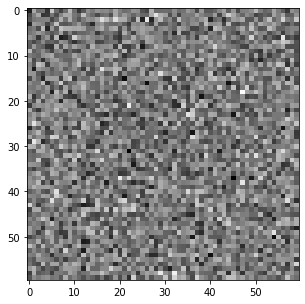

Cabbage


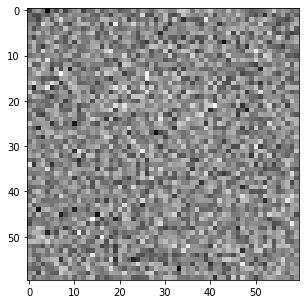

Capsicum


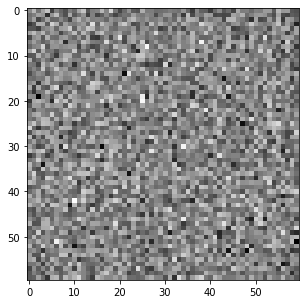

Carrot


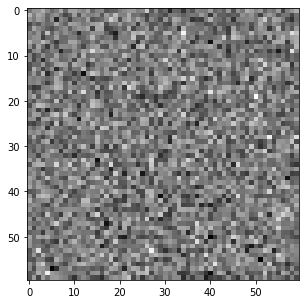

Cauliflower


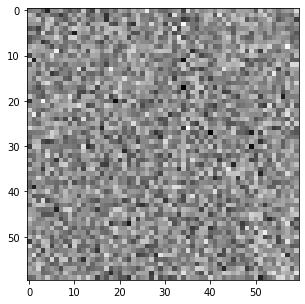

Cucumber


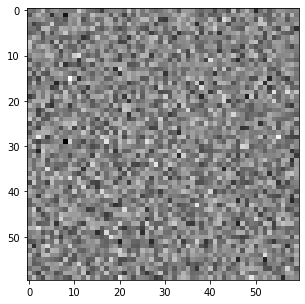

Papaya


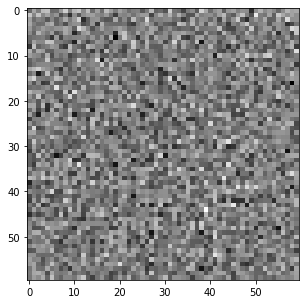

Potato


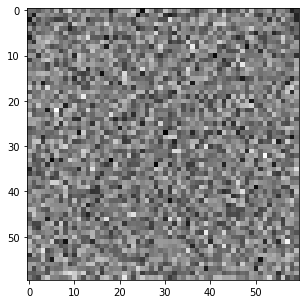

Pumpkin


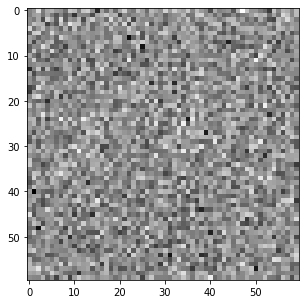

Radish


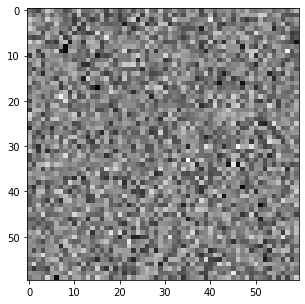

Tomato


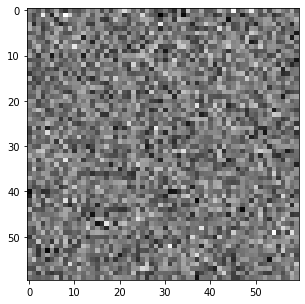

In [ ]:
model.visualize_weights(60)

In [ ]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.005, batch_size = 64, activ_func = ["softmax"] , epoch =30)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.9628047698091016, validation cost = 3.269837598690087
Train Accuracy: 10.846666666666668 Validation Accuracy: 7.2666666666666675
Epoch 2: training cost = 2.8189647375126046, validation cost = 3.2866439060687362
Train Accuracy: 13.526666666666667 Validation Accuracy: 7.633333333333334
Epoch 3: training cost = 2.7350390438348855, validation cost = 3.307688728108882
Train Accuracy: 15.826666666666666 Validation Accuracy: 7.7
Epoch 4: training cost = 2.6759052195917654, validation cost = 3.3240608900268853
Train Accuracy: 17.62 Validation Accuracy: 7.6
Epoch 5: training cost = 2.6298147561340857, validation cost = 3.335848474337075
Train Accuracy: 19.113333333333333 Validation Accuracy: 7.233333333333333
Epoch 6: training cost = 2.5917812188733973, validation cost = 3.3443186864091015
Train Accuracy: 20.36 Validation Accuracy: 7.333333333333333
Epoch 7: training cost = 2.5592813210923677, validation cost = 3.350581917525276
Train Accuracy: 21.36 Validation Accura

              precision    recall  f1-score   support

           0      0.403     0.250     0.309       200
           1      0.051     0.045     0.048       200
           2      0.062     0.070     0.066       200
           3      0.058     0.060     0.059       200
           4      0.169     0.105     0.130       200
           5      0.088     0.120     0.102       200
           6      0.050     0.070     0.058       200
           7      0.018     0.020     0.019       200
           8      0.020     0.025     0.022       200
           9      0.049     0.040     0.044       200
          10      0.076     0.090     0.082       200
          11      0.047     0.065     0.055       200
          12      0.021     0.015     0.018       200
          13      0.032     0.025     0.028       200
          14      0.054     0.040     0.046       200

    accuracy                          0.069      3000
   macro avg      0.080     0.069     0.072      3000
weighted avg      0.080   

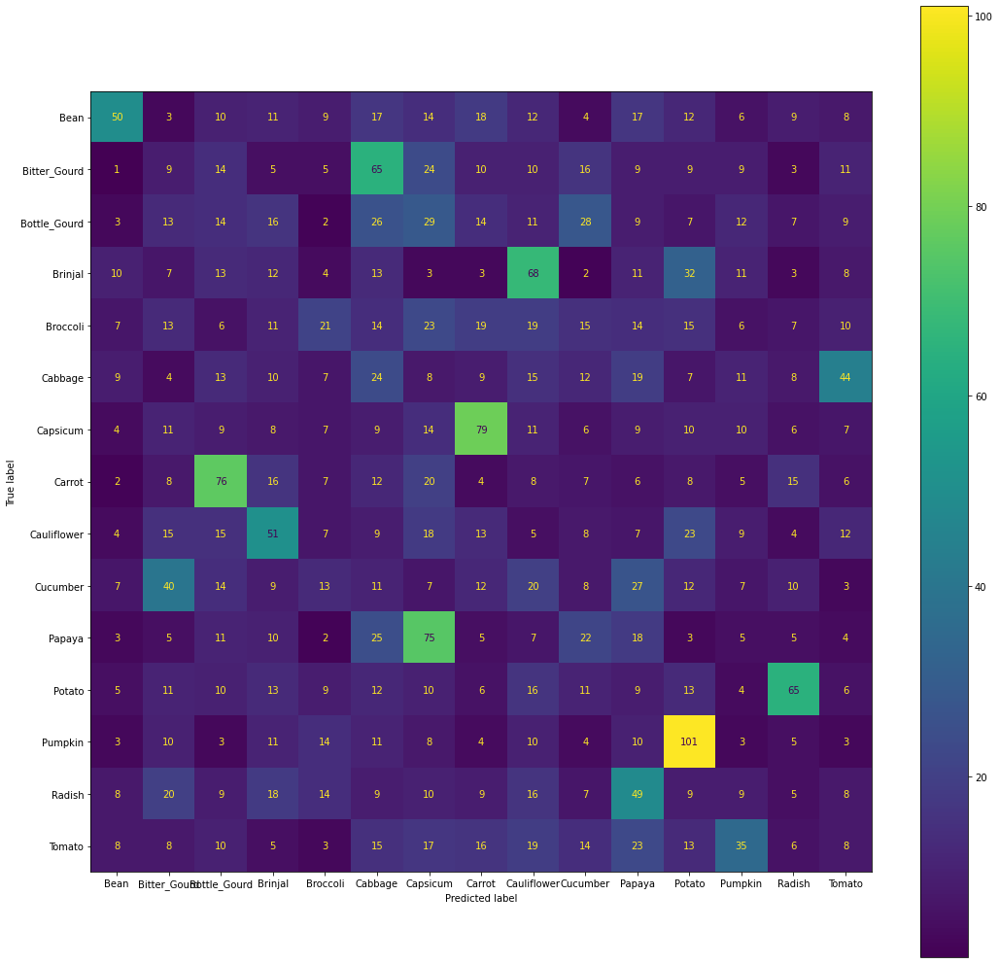

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


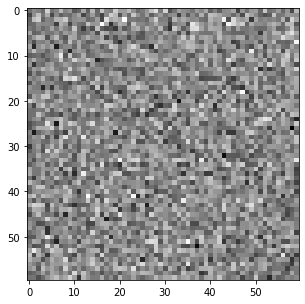

Bitter_Gourd


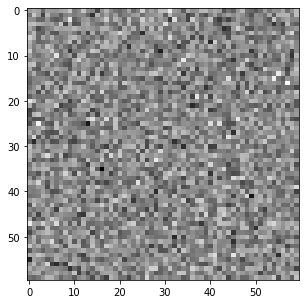

Bottle_Gourd


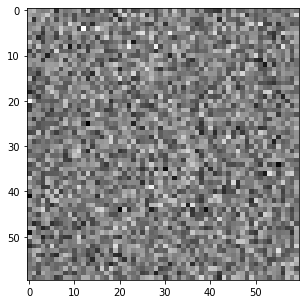

Brinjal


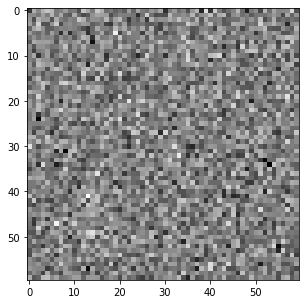

Broccoli


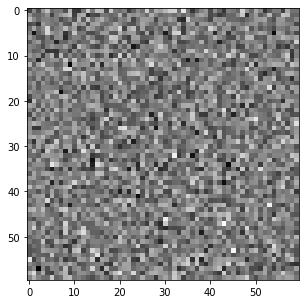

Cabbage


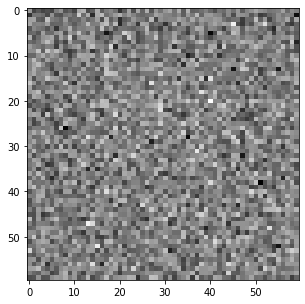

Capsicum


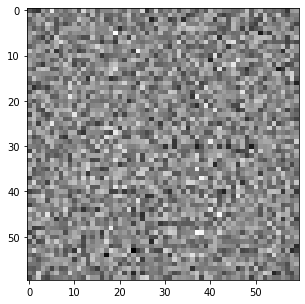

Carrot


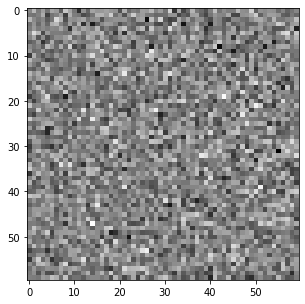

Cauliflower


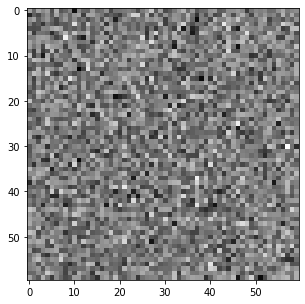

Cucumber


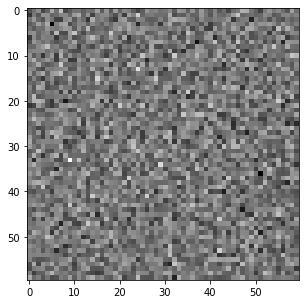

Papaya


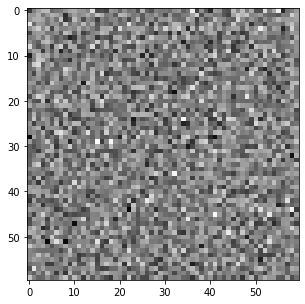

Potato


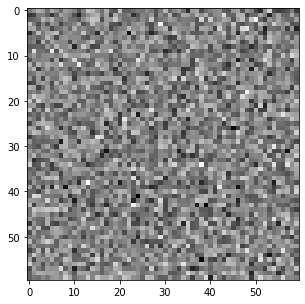

Pumpkin


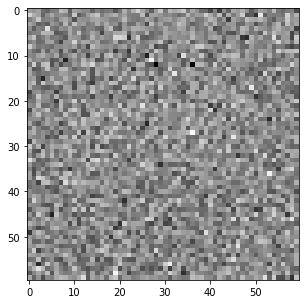

Radish


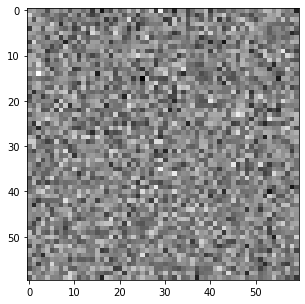

Tomato


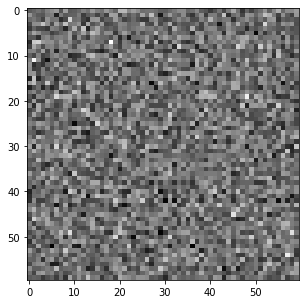

In [ ]:
model.visualize_weights(60)

In [ ]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.005, batch_size = 128, activ_func = ["softmax"] , epoch =30)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 3.1281041979555617, validation cost = 3.309057784288431
Train Accuracy: 9.066666666666666 Validation Accuracy: 6.766666666666667
Epoch 2: training cost = 2.9958147169957914, validation cost = 3.297319171159562
Train Accuracy: 11.073333333333334 Validation Accuracy: 7.066666666666667
Epoch 3: training cost = 2.912089503036687, validation cost = 3.301696956208211
Train Accuracy: 12.353333333333333 Validation Accuracy: 7.233333333333333
Epoch 4: training cost = 2.852886298870444, validation cost = 3.310811239824629
Train Accuracy: 13.573333333333334 Validation Accuracy: 7.333333333333333
Epoch 5: training cost = 2.8071446069893287, validation cost = 3.3203292110348035
Train Accuracy: 14.393333333333333 Validation Accuracy: 7.5
Epoch 6: training cost = 2.7696063374377506, validation cost = 3.328808102182797
Train Accuracy: 15.366666666666667 Validation Accuracy: 7.533333333333333
Epoch 7: training cost = 2.737552907381614, validation cost = 3.3359135957478077
Train

              precision    recall  f1-score   support

           0      0.357     0.230     0.280       200
           1      0.046     0.040     0.043       200
           2      0.072     0.065     0.068       200
           3      0.069     0.075     0.072       200
           4      0.129     0.090     0.106       200
           5      0.101     0.145     0.119       200
           6      0.066     0.080     0.072       200
           7      0.034     0.035     0.035       200
           8      0.033     0.035     0.034       200
           9      0.036     0.035     0.036       200
          10      0.057     0.065     0.061       200
          11      0.026     0.040     0.031       200
          12      0.058     0.045     0.051       200
          13      0.045     0.035     0.039       200
          14      0.098     0.085     0.091       200

    accuracy                          0.073      3000
   macro avg      0.082     0.073     0.076      3000
weighted avg      0.082   

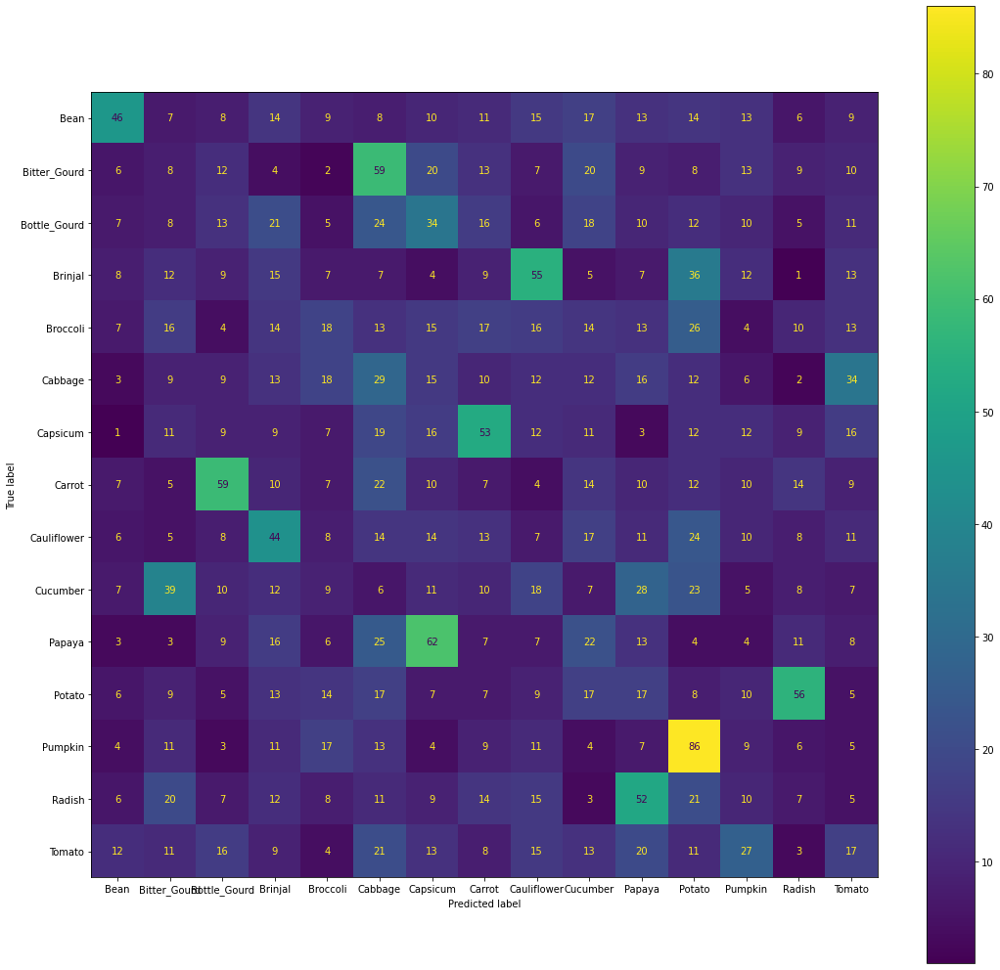

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


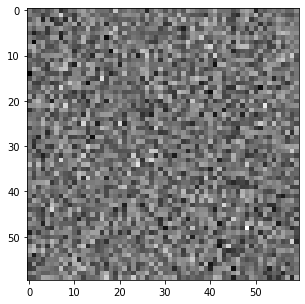

Bitter_Gourd


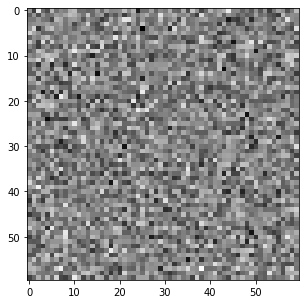

Bottle_Gourd


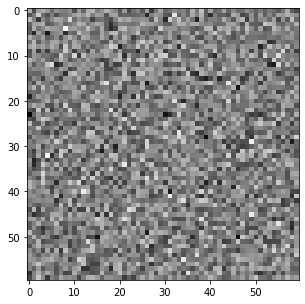

Brinjal


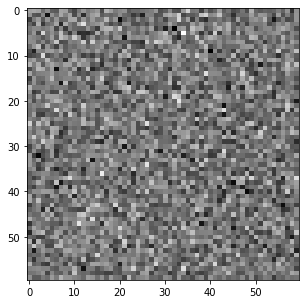

Broccoli


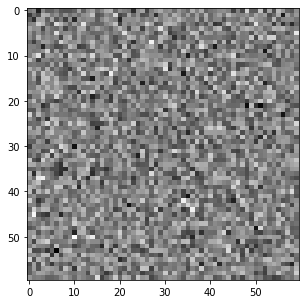

Cabbage


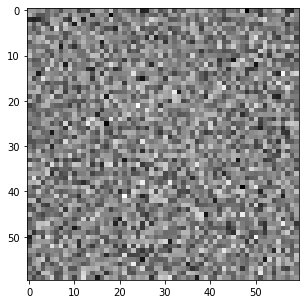

Capsicum


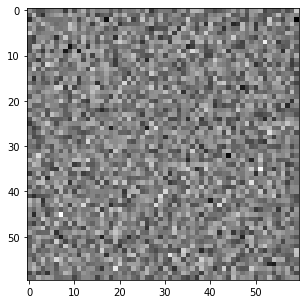

Carrot


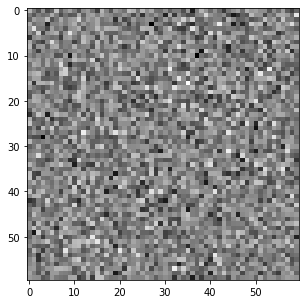

Cauliflower


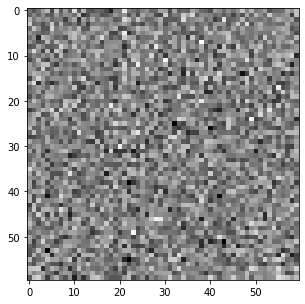

Cucumber


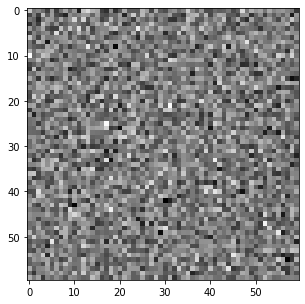

Papaya


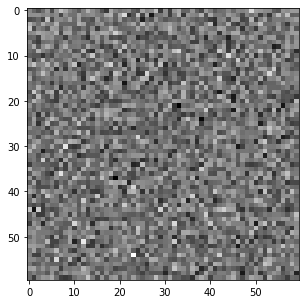

Potato


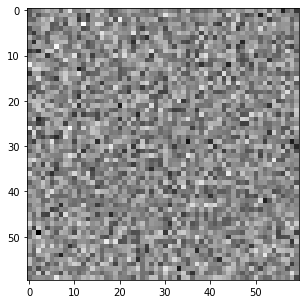

Pumpkin


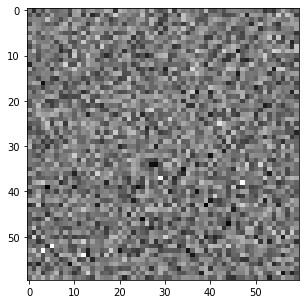

Radish


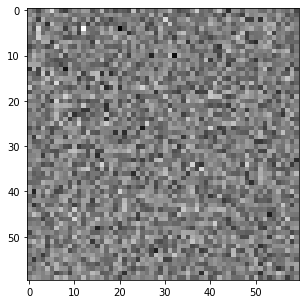

Tomato


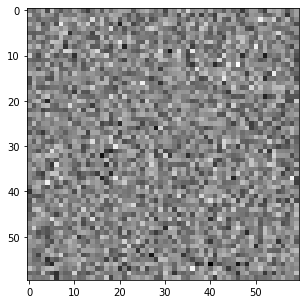

In [ ]:
model.visualize_weights(60)

In [ ]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.01, batch_size = 16, activ_func = ["softmax"] , epoch =30)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.635586851191568, validation cost = 3.5545893579272154
Train Accuracy: 20.560000000000002 Validation Accuracy: 7.566666666666666
Epoch 2: training cost = 2.477219273490218, validation cost = 3.578891605506748
Train Accuracy: 25.553333333333335 Validation Accuracy: 7.533333333333333
Epoch 3: training cost = 2.3822999179214004, validation cost = 3.5996221871566565
Train Accuracy: 28.066666666666666 Validation Accuracy: 7.6
Epoch 4: training cost = 2.3138185915832428, validation cost = 3.6183521477565694
Train Accuracy: 30.21333333333333 Validation Accuracy: 7.533333333333333
Epoch 5: training cost = 2.259808767738611, validation cost = 3.6356618750338687
Train Accuracy: 31.966666666666665 Validation Accuracy: 7.633333333333334
Epoch 6: training cost = 2.2149204377372533, validation cost = 3.6519350989610584
Train Accuracy: 33.026666666666664 Validation Accuracy: 7.666666666666666
Epoch 7: training cost = 2.1762828004264185, validation cost = 3.6673298096051377
T

              precision    recall  f1-score   support

           0      0.512     0.320     0.394       200
           1      0.012     0.010     0.011       200
           2      0.053     0.120     0.073       200
           3      0.037     0.015     0.021       200
           4      0.524     0.220     0.310       200
           5      0.032     0.035     0.033       200
           6      0.040     0.120     0.060       200
           7      0.007     0.005     0.006       200
           8      0.031     0.030     0.030       200
           9      0.033     0.010     0.015       200
          10      0.059     0.025     0.035       200
          11      0.029     0.060     0.039       200
          12      0.000     0.000     0.000       200
          13      0.019     0.015     0.017       200
          14      0.073     0.045     0.056       200

    accuracy                          0.069      3000
   macro avg      0.097     0.069     0.073      3000
weighted avg      0.097   

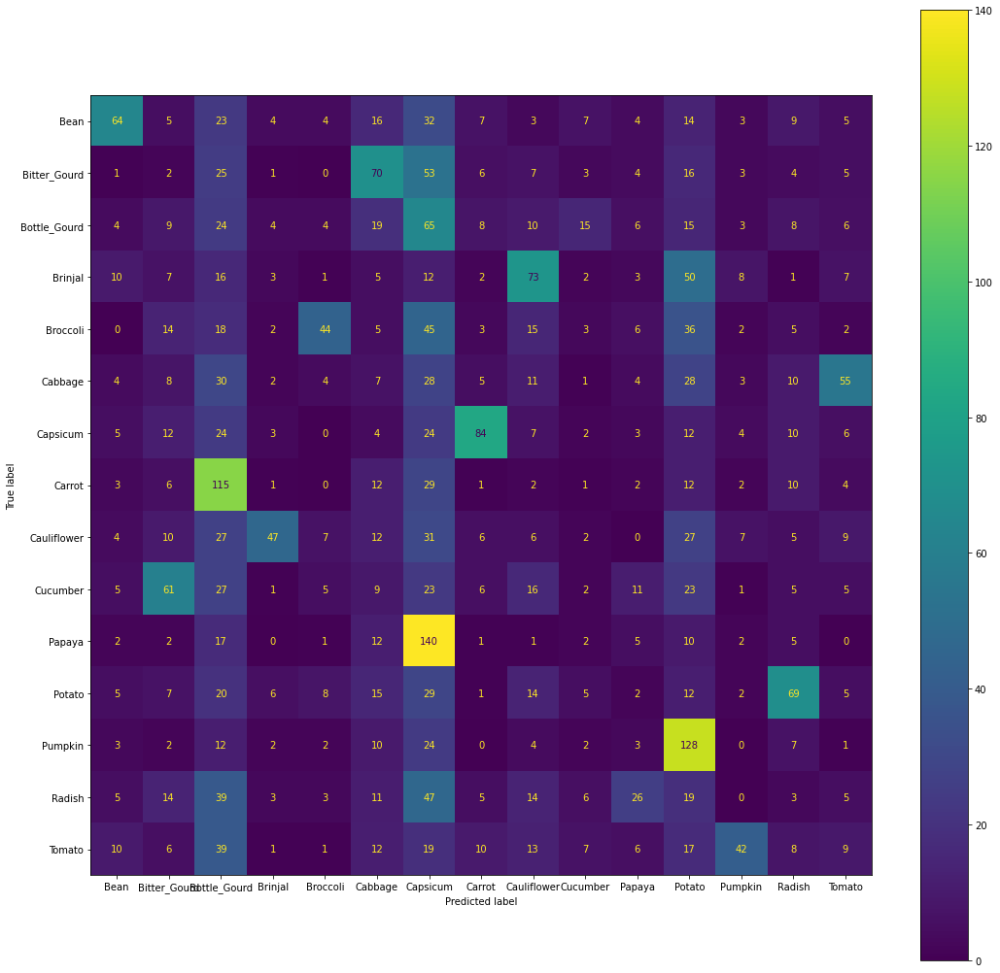

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


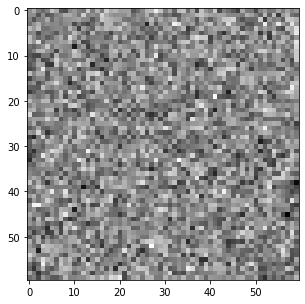

Bitter_Gourd


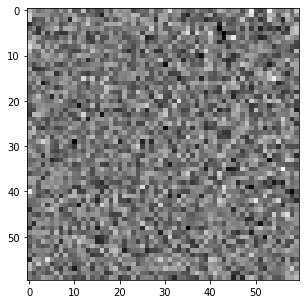

Bottle_Gourd


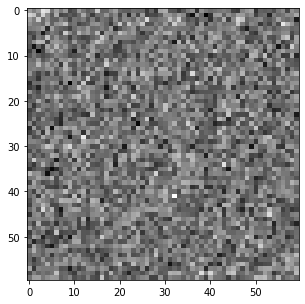

Brinjal


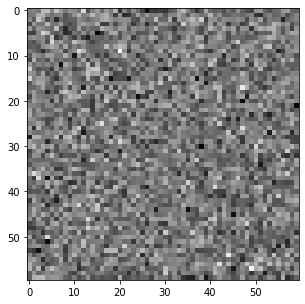

Broccoli


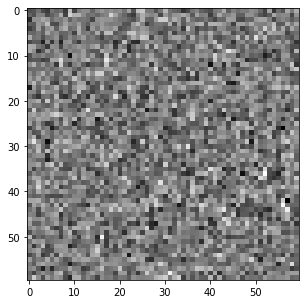

Cabbage


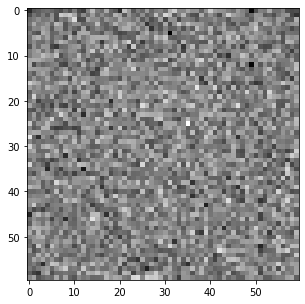

Capsicum


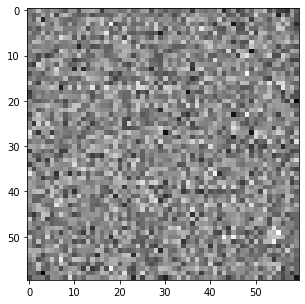

Carrot


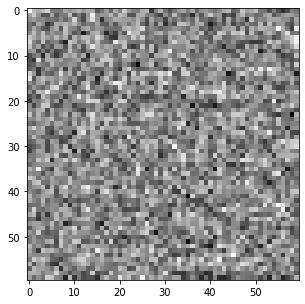

Cauliflower


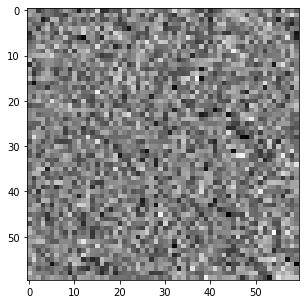

Cucumber


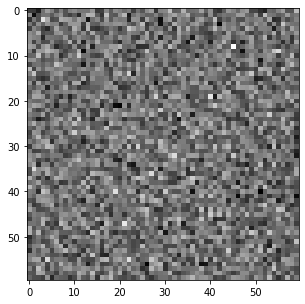

Papaya


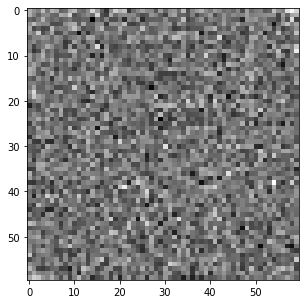

Potato


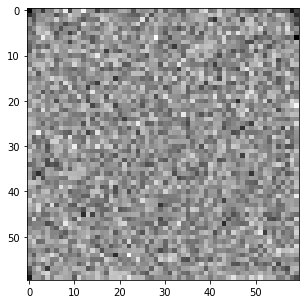

Pumpkin


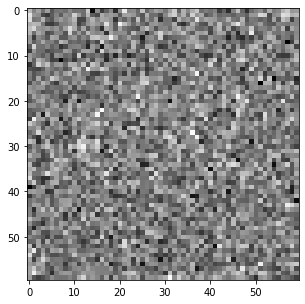

Radish


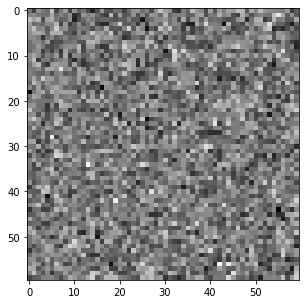

Tomato


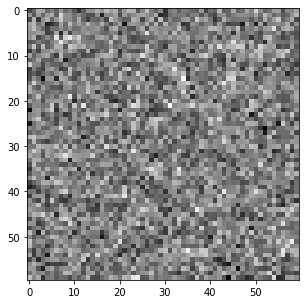

In [ ]:
model.visualize_weights(60)

In [ ]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.01, batch_size = 32, activ_func = ["softmax"] , epoch =30)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.7118222261033345, validation cost = 3.436993612208247
Train Accuracy: 16.86 Validation Accuracy: 7.000000000000001
Epoch 2: training cost = 2.5603385691090987, validation cost = 3.454123919152043
Train Accuracy: 21.48 Validation Accuracy: 7.433333333333334
Epoch 3: training cost = 2.470094701289865, validation cost = 3.4616850877233425
Train Accuracy: 24.253333333333334 Validation Accuracy: 7.533333333333333
Epoch 4: training cost = 2.4055176185624587, validation cost = 3.468835233012053
Train Accuracy: 26.24666666666667 Validation Accuracy: 7.433333333333334
Epoch 5: training cost = 2.3548266722105184, validation cost = 3.4759112337999243
Train Accuracy: 27.833333333333332 Validation Accuracy: 7.633333333333334
Epoch 6: training cost = 2.3127596472794894, validation cost = 3.482702896115442
Train Accuracy: 29.25333333333333 Validation Accuracy: 7.766666666666666
Epoch 7: training cost = 2.2765699866969467, validation cost = 3.4891736906709503
Train Accuracy:

              precision    recall  f1-score   support

           0      0.551     0.295     0.384       200
           1      0.041     0.040     0.041       200
           2      0.046     0.075     0.057       200
           3      0.036     0.040     0.038       200
           4      0.480     0.180     0.262       200
           5      0.022     0.020     0.021       200
           6      0.045     0.065     0.053       200
           7      0.017     0.020     0.019       200
           8      0.022     0.030     0.025       200
           9      0.055     0.045     0.049       200
          10      0.060     0.065     0.063       200
          11      0.019     0.025     0.021       200
          12      0.007     0.005     0.006       200
          13      0.018     0.010     0.013       200
          14      0.060     0.060     0.060       200

    accuracy                          0.065      3000
   macro avg      0.099     0.065     0.074      3000
weighted avg      0.099   

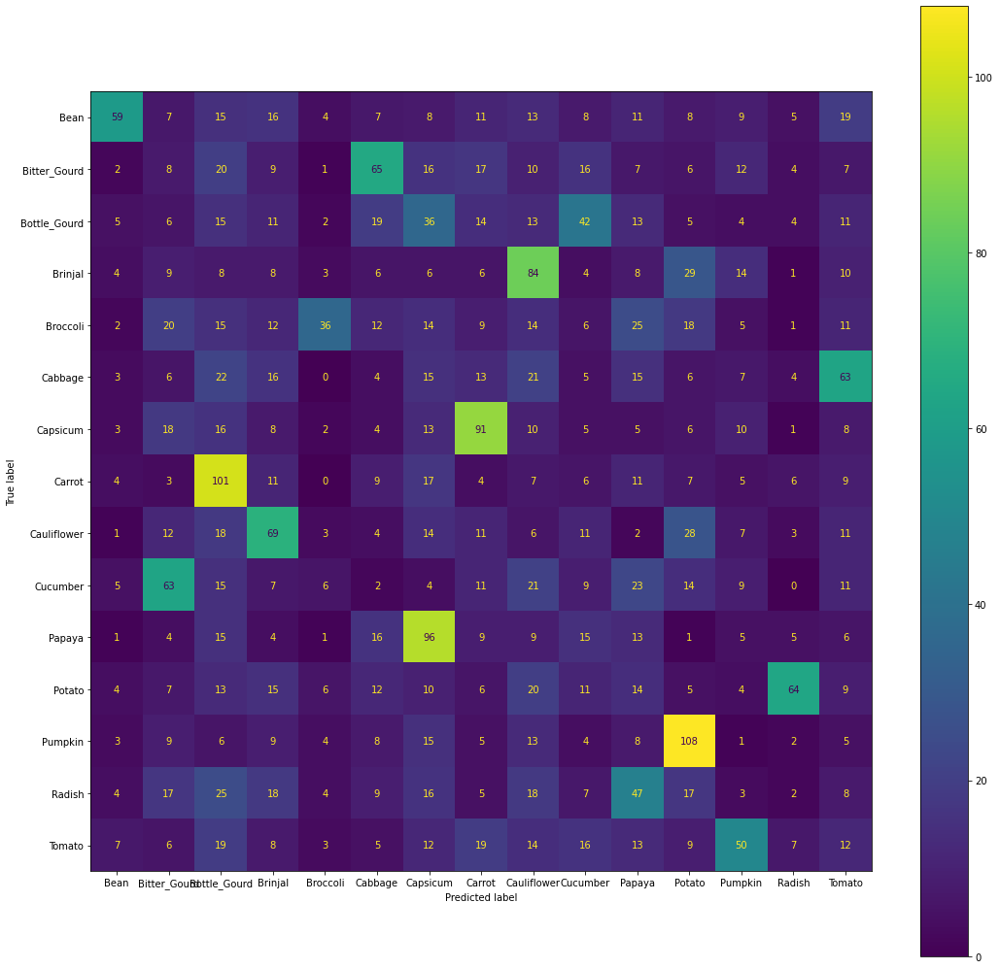

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


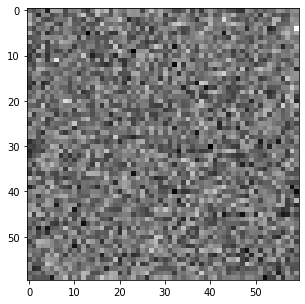

Bitter_Gourd


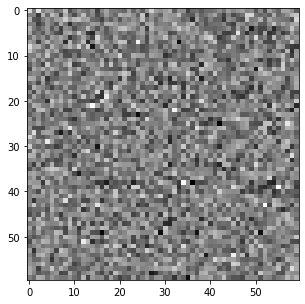

Bottle_Gourd


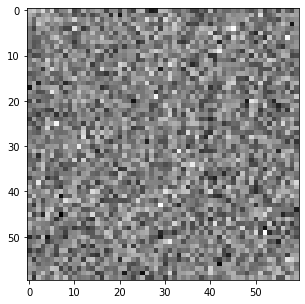

Brinjal


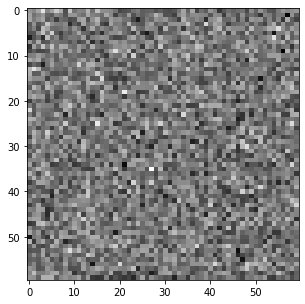

Broccoli


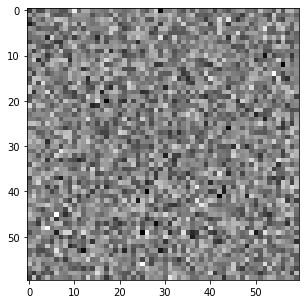

Cabbage


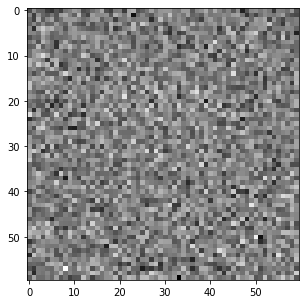

Capsicum


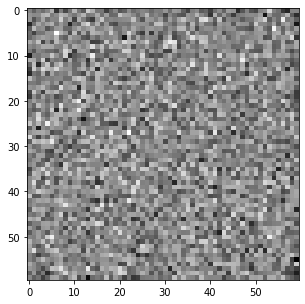

Carrot


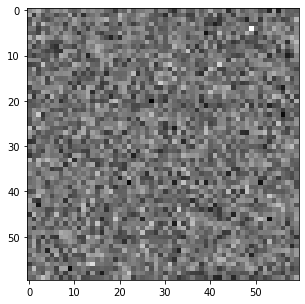

Cauliflower


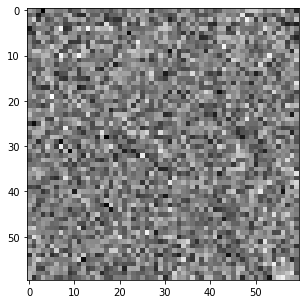

Cucumber


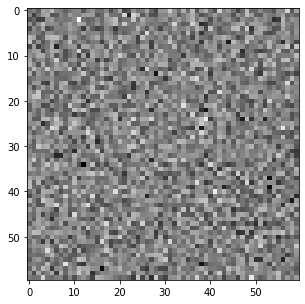

Papaya


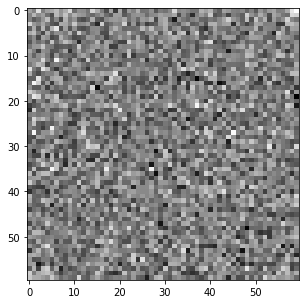

Potato


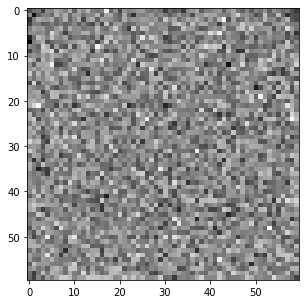

Pumpkin


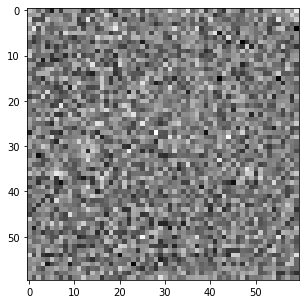

Radish


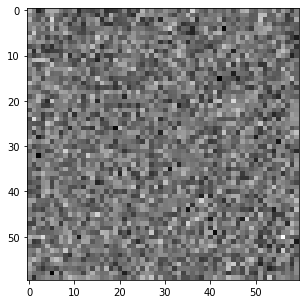

Tomato


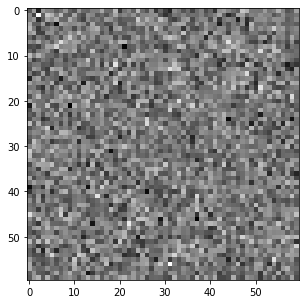

In [ ]:
model.visualize_weights(60)

In [ ]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.01, batch_size = 64, activ_func = ["softmax"] , epoch =30)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.826459596211376, validation cost = 3.289016802253079
Train Accuracy: 14.066666666666666 Validation Accuracy: 7.166666666666667
Epoch 2: training cost = 2.688545945496751, validation cost = 3.3328231284137835
Train Accuracy: 17.246666666666666 Validation Accuracy: 7.333333333333333
Epoch 3: training cost = 2.6050320956177266, validation cost = 3.353419409611636
Train Accuracy: 19.726666666666667 Validation Accuracy: 7.833333333333334
Epoch 4: training cost = 2.54438217618148, validation cost = 3.3652071658333846
Train Accuracy: 21.686666666666667 Validation Accuracy: 8.133333333333333
Epoch 5: training cost = 2.496737272094726, validation cost = 3.373929679514781
Train Accuracy: 23.166666666666664 Validation Accuracy: 8.0
Epoch 6: training cost = 2.457476163465901, validation cost = 3.38149950953483
Train Accuracy: 24.593333333333334 Validation Accuracy: 7.9
Epoch 7: training cost = 2.4240326052840966, validation cost = 3.388520067075938
Train Accuracy: 25.733

              precision    recall  f1-score   support

           0      0.404     0.230     0.293       200
           1      0.030     0.025     0.027       200
           2      0.051     0.055     0.053       200
           3      0.057     0.065     0.061       200
           4      0.455     0.125     0.196       200
           5      0.060     0.080     0.069       200
           6      0.054     0.070     0.061       200
           7      0.019     0.020     0.019       200
           8      0.038     0.055     0.045       200
           9      0.083     0.065     0.073       200
          10      0.065     0.100     0.079       200
          11      0.030     0.035     0.032       200
          12      0.018     0.015     0.016       200
          13      0.021     0.015     0.017       200
          14      0.098     0.090     0.094       200

    accuracy                          0.070      3000
   macro avg      0.099     0.070     0.076      3000
weighted avg      0.099   

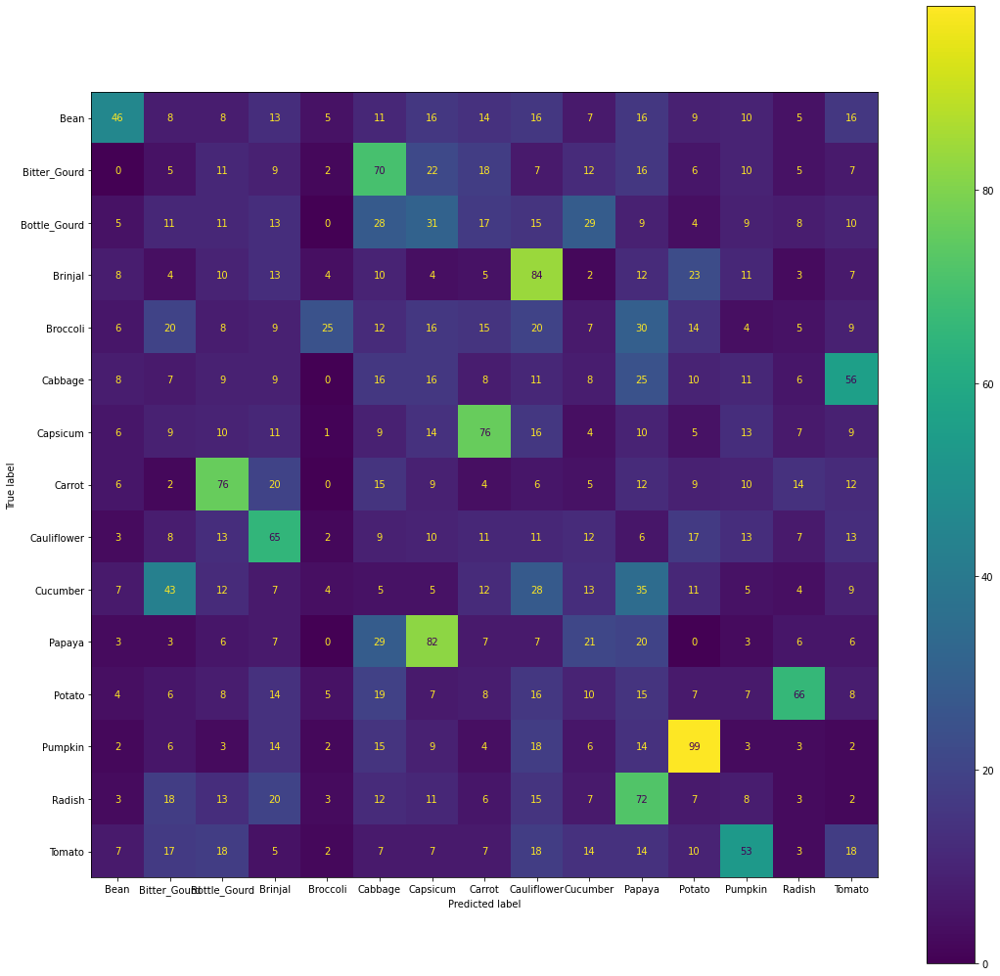

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


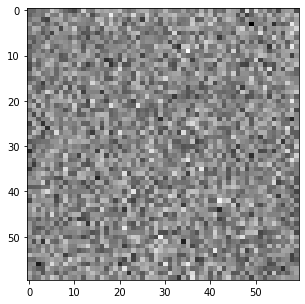

Bitter_Gourd


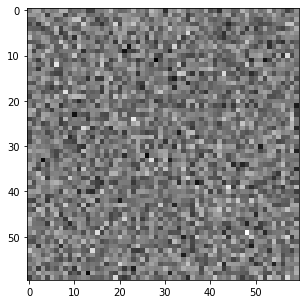

Bottle_Gourd


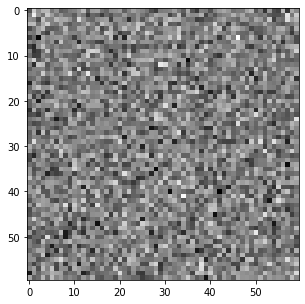

Brinjal


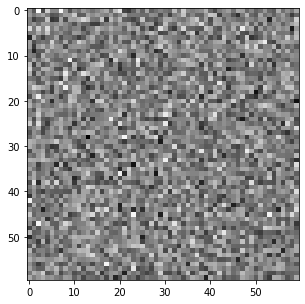

Broccoli


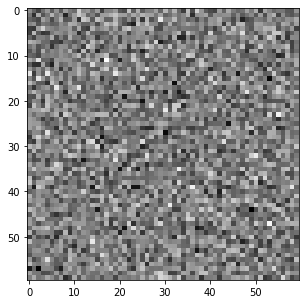

Cabbage


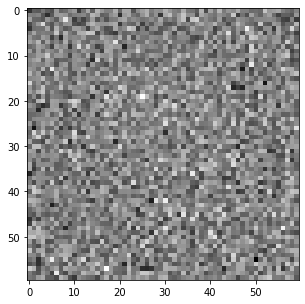

Capsicum


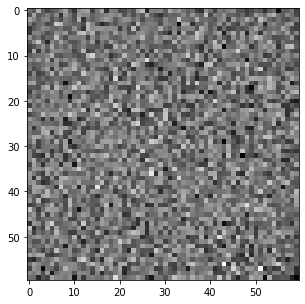

Carrot


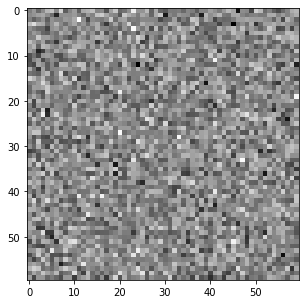

Cauliflower


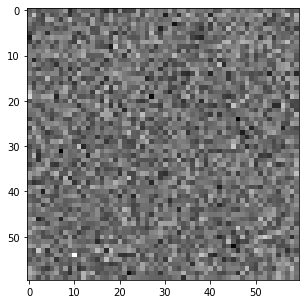

Cucumber


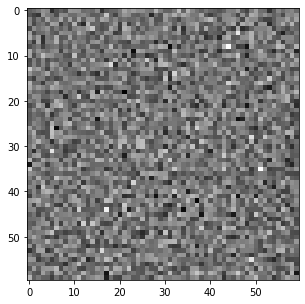

Papaya


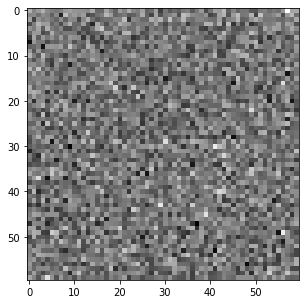

Potato


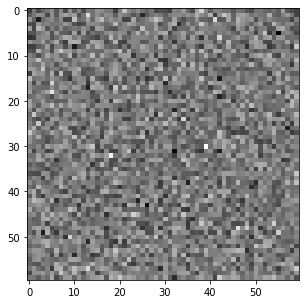

Pumpkin


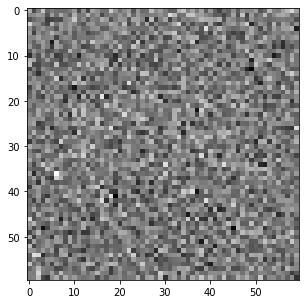

Radish


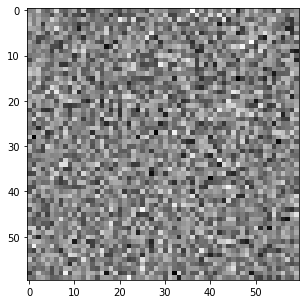

Tomato


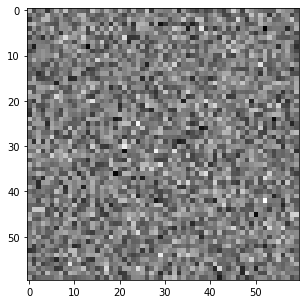

In [ ]:
model.visualize_weights(60)

In [ ]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.01, batch_size = 128, activ_func = ["softmax"] , epoch =30)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.992253331840994, validation cost = 3.3351239768190144
Train Accuracy: 10.72 Validation Accuracy: 6.9
Epoch 2: training cost = 2.8516721247306958, validation cost = 3.351463895869237
Train Accuracy: 13.693333333333332 Validation Accuracy: 6.766666666666667
Epoch 3: training cost = 2.7670304110656305, validation cost = 3.368085982979354
Train Accuracy: 15.76 Validation Accuracy: 7.033333333333333
Epoch 4: training cost = 2.7061321410068113, validation cost = 3.379607362936342
Train Accuracy: 17.186666666666667 Validation Accuracy: 7.166666666666667
Epoch 5: training cost = 2.6581639976624487, validation cost = 3.38703076766074
Train Accuracy: 18.26 Validation Accuracy: 7.3
Epoch 6: training cost = 2.6183913506003464, validation cost = 3.391750898909571
Train Accuracy: 19.333333333333332 Validation Accuracy: 7.199999999999999
Epoch 7: training cost = 2.5843383637220616, validation cost = 3.3948135511748396
Train Accuracy: 20.393333333333334 Validation Accuracy: 

              precision    recall  f1-score   support

           0      0.322     0.245     0.278       200
           1      0.051     0.040     0.045       200
           2      0.051     0.045     0.048       200
           3      0.056     0.065     0.060       200
           4      0.228     0.130     0.166       200
           5      0.046     0.065     0.054       200
           6      0.025     0.035     0.029       200
           7      0.026     0.025     0.025       200
           8      0.031     0.040     0.035       200
           9      0.042     0.035     0.038       200
          10      0.043     0.050     0.047       200
          11      0.020     0.025     0.022       200
          12      0.018     0.015     0.016       200
          13      0.051     0.045     0.048       200
          14      0.058     0.050     0.054       200

    accuracy                          0.061      3000
   macro avg      0.071     0.061     0.064      3000
weighted avg      0.071   

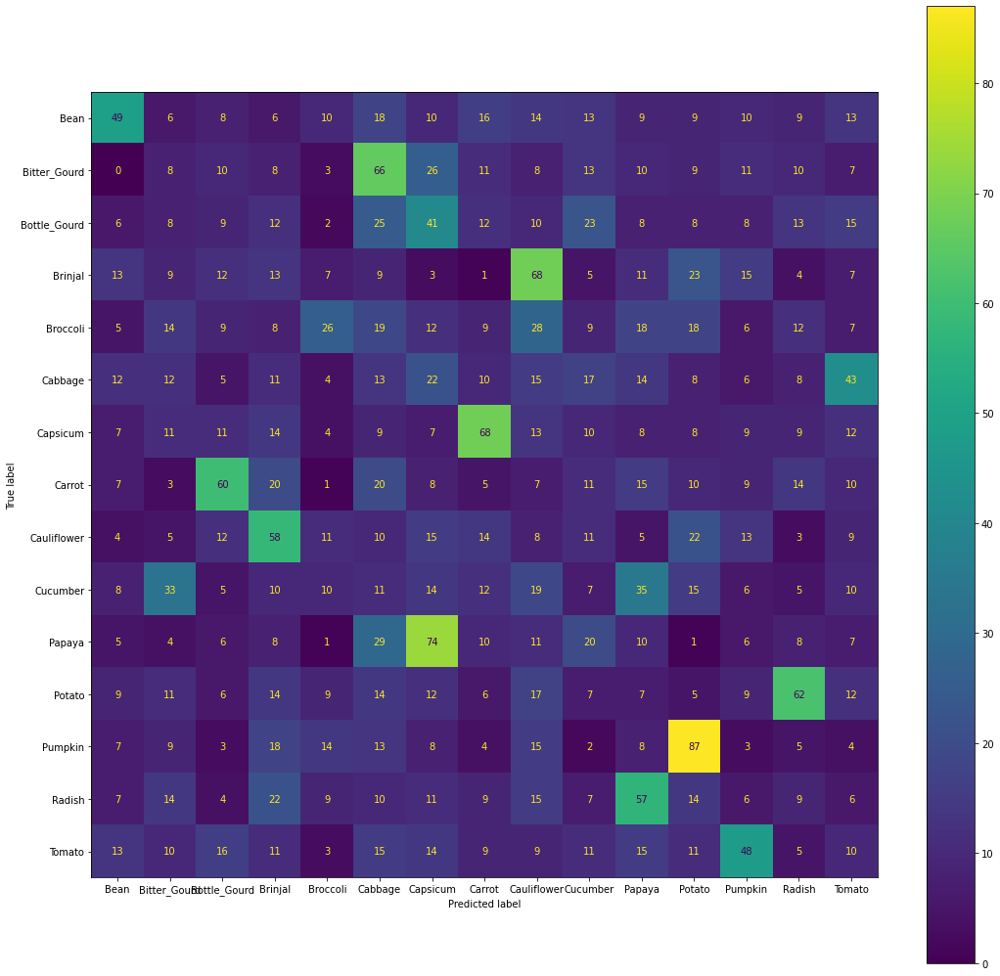

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


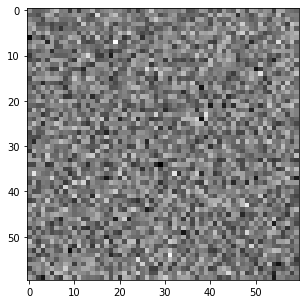

Bitter_Gourd


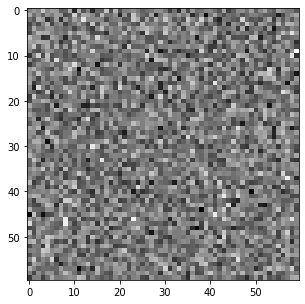

Bottle_Gourd


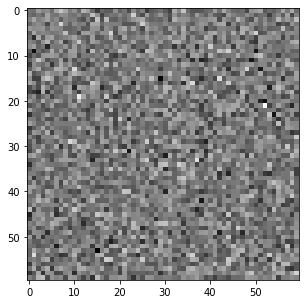

Brinjal


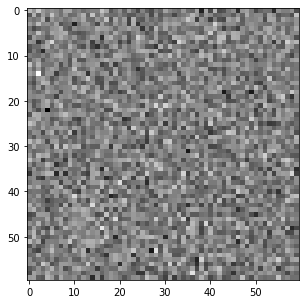

Broccoli


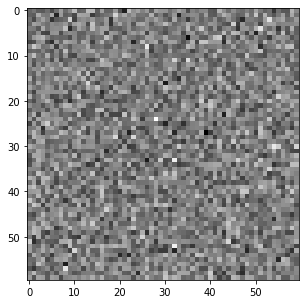

Cabbage


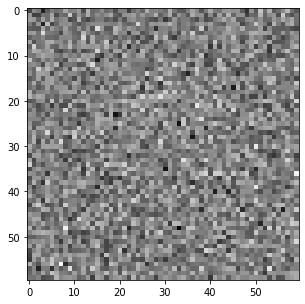

Capsicum


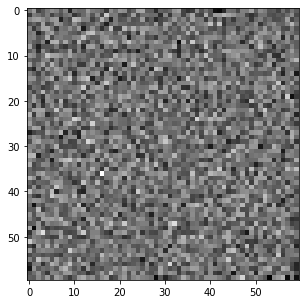

Carrot


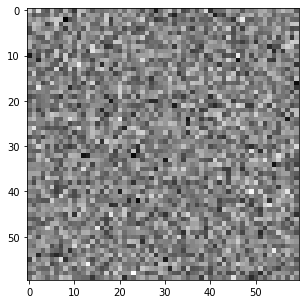

Cauliflower


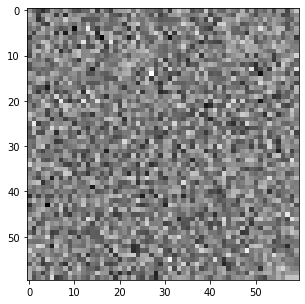

Cucumber


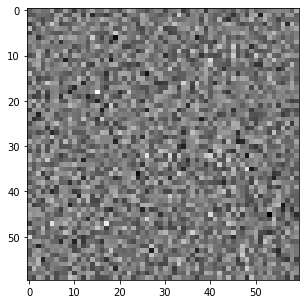

Papaya


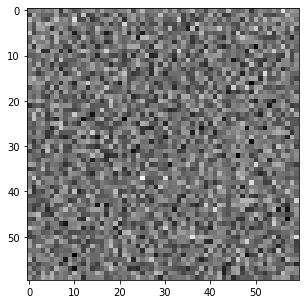

Potato


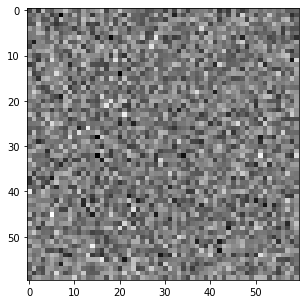

Pumpkin


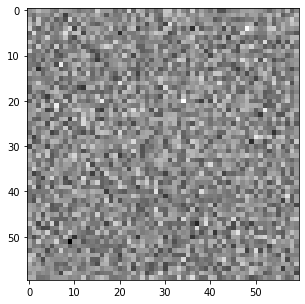

Radish


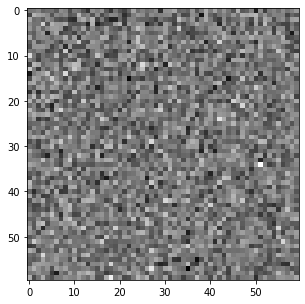

Tomato


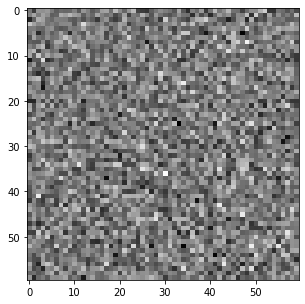

In [ ]:
model.visualize_weights(60)

In [ ]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.02, batch_size = 16, activ_func = ["softmax"] , epoch =30)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.7614482052858076, validation cost = 4.008809330511467
Train Accuracy: 21.693333333333335 Validation Accuracy: 6.9
Epoch 2: training cost = 2.5523872167802253, validation cost = 4.012262623063585
Train Accuracy: 26.313333333333333 Validation Accuracy: 6.9
Epoch 3: training cost = 2.4309597740766375, validation cost = 4.026377513754988
Train Accuracy: 29.26666666666667 Validation Accuracy: 7.199999999999999
Epoch 4: training cost = 2.3448067128120718, validation cost = 4.045117320356794
Train Accuracy: 31.346666666666668 Validation Accuracy: 7.666666666666666
Epoch 5: training cost = 2.2755643016654905, validation cost = 4.0634835613574
Train Accuracy: 33.193333333333335 Validation Accuracy: 7.733333333333333
Epoch 6: training cost = 2.2165780606532026, validation cost = 4.080626831151985
Train Accuracy: 34.62 Validation Accuracy: 7.7
Epoch 7: training cost = 2.1648645069794874, validation cost = 4.096747270546364
Train Accuracy: 35.96 Validation Accuracy: 7.6


              precision    recall  f1-score   support

           0      0.523     0.345     0.416       200
           1      0.010     0.010     0.010       200
           2      0.040     0.070     0.051       200
           3      0.000     0.000     0.000       200
           4      0.488     0.200     0.284       200
           5      0.043     0.060     0.050       200
           6      0.053     0.180     0.081       200
           7      0.007     0.005     0.006       200
           8      0.026     0.030     0.028       200
           9      0.049     0.010     0.017       200
          10      0.049     0.010     0.017       200
          11      0.035     0.055     0.043       200
          12      0.000     0.000     0.000       200
          13      0.024     0.030     0.027       200
          14      0.083     0.050     0.062       200

    accuracy                          0.070      3000
   macro avg      0.095     0.070     0.073      3000
weighted avg      0.095   

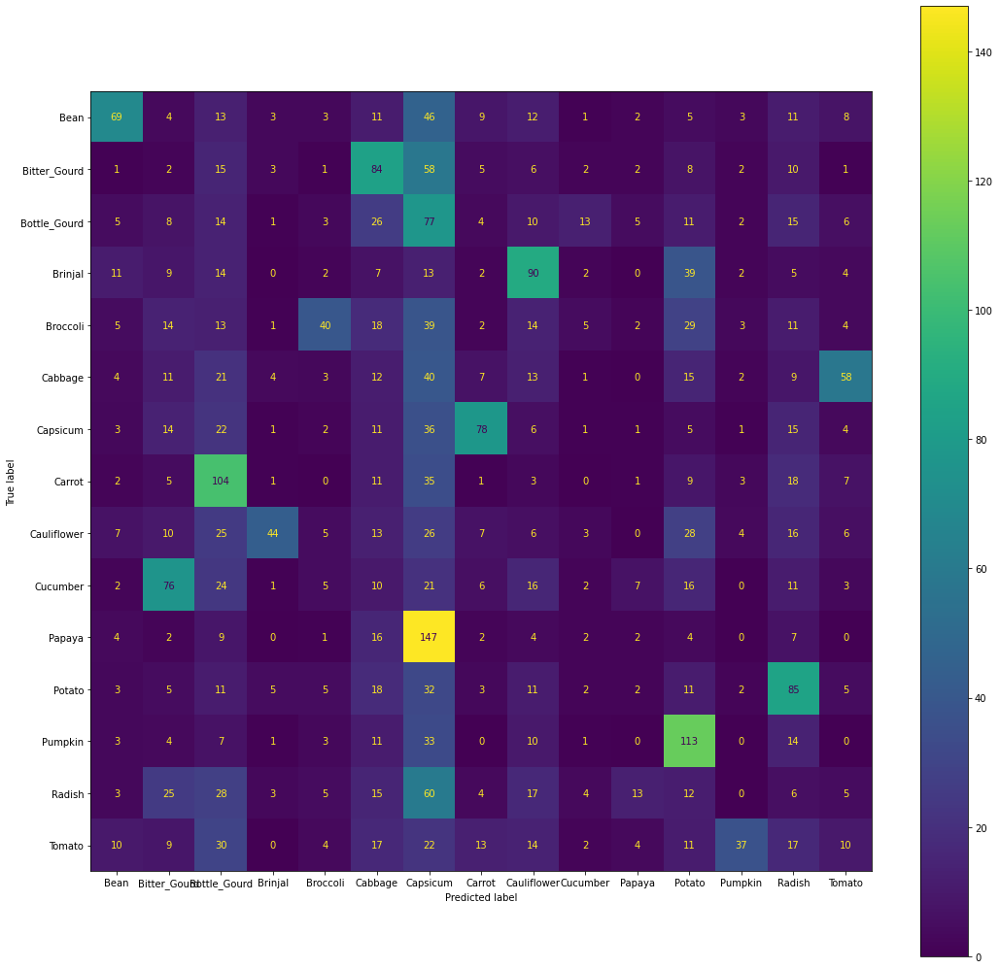

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


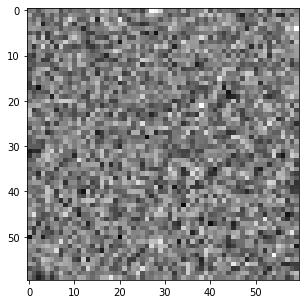

Bitter_Gourd


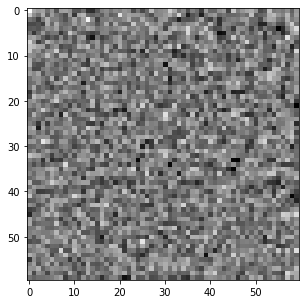

Bottle_Gourd


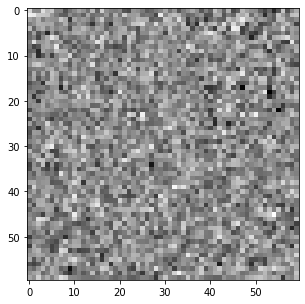

Brinjal


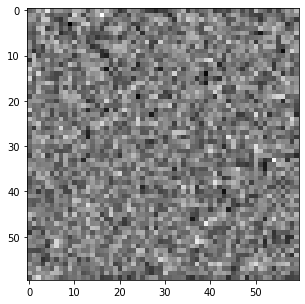

Broccoli


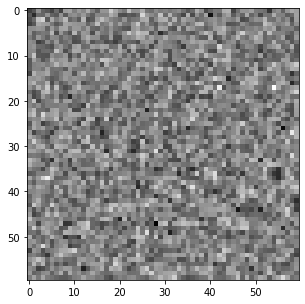

Cabbage


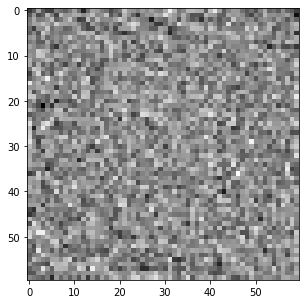

Capsicum


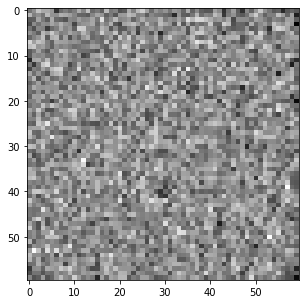

Carrot


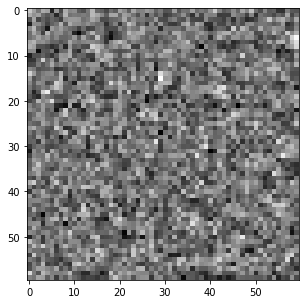

Cauliflower


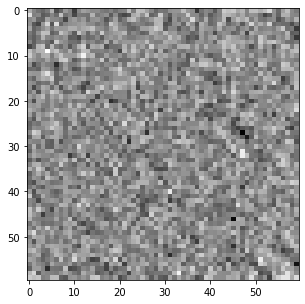

Cucumber


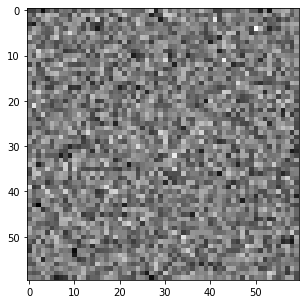

Papaya


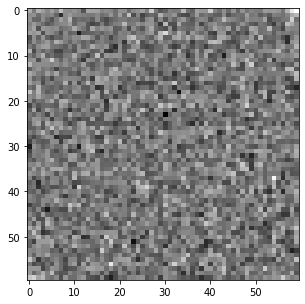

Potato


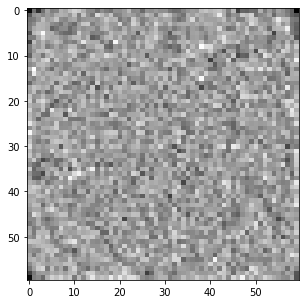

Pumpkin


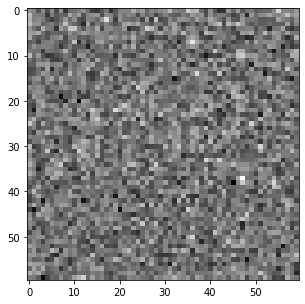

Radish


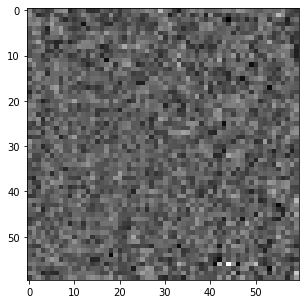

Tomato


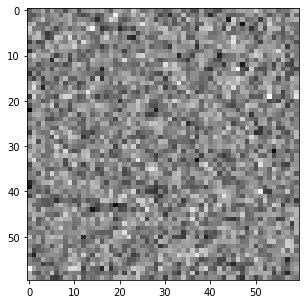

In [ ]:
model.visualize_weights(60)

In [ ]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.02, batch_size = 32, activ_func = ["softmax"] , epoch =30)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.990930595410459, validation cost = 3.849327709956224
Train Accuracy: 19.1 Validation Accuracy: 8.333333333333332
Epoch 2: training cost = 2.8010268210031635, validation cost = 3.852642530199179
Train Accuracy: 22.82 Validation Accuracy: 7.7
Epoch 3: training cost = 2.6900121271510757, validation cost = 3.8620861205655443
Train Accuracy: 25.679999999999996 Validation Accuracy: 7.933333333333334
Epoch 4: training cost = 2.608221326056164, validation cost = 3.870573489481297
Train Accuracy: 27.786666666666665 Validation Accuracy: 8.200000000000001
Epoch 5: training cost = 2.5416239714542117, validation cost = 3.8775551865246314
Train Accuracy: 29.46666666666667 Validation Accuracy: 8.066666666666666
Epoch 6: training cost = 2.4845549174549033, validation cost = 3.883429004425158
Train Accuracy: 30.766666666666666 Validation Accuracy: 8.066666666666666
Epoch 7: training cost = 2.4341098055551256, validation cost = 3.888498580798903
Train Accuracy: 31.919999999999

              precision    recall  f1-score   support

           0      0.697     0.265     0.384       200
           1      0.049     0.085     0.062       200
           2      0.065     0.180     0.096       200
           3      0.032     0.035     0.034       200
           4      0.632     0.180     0.280       200
           5      0.019     0.010     0.013       200
           6      0.031     0.035     0.033       200
           7      0.018     0.020     0.019       200
           8      0.019     0.020     0.019       200
           9      0.037     0.045     0.041       200
          10      0.000     0.000     0.000       200
          11      0.040     0.090     0.056       200
          12      0.000     0.000     0.000       200
          13      0.014     0.005     0.007       200
          14      0.056     0.030     0.039       200

    accuracy                          0.067      3000
   macro avg      0.114     0.067     0.072      3000
weighted avg      0.114   

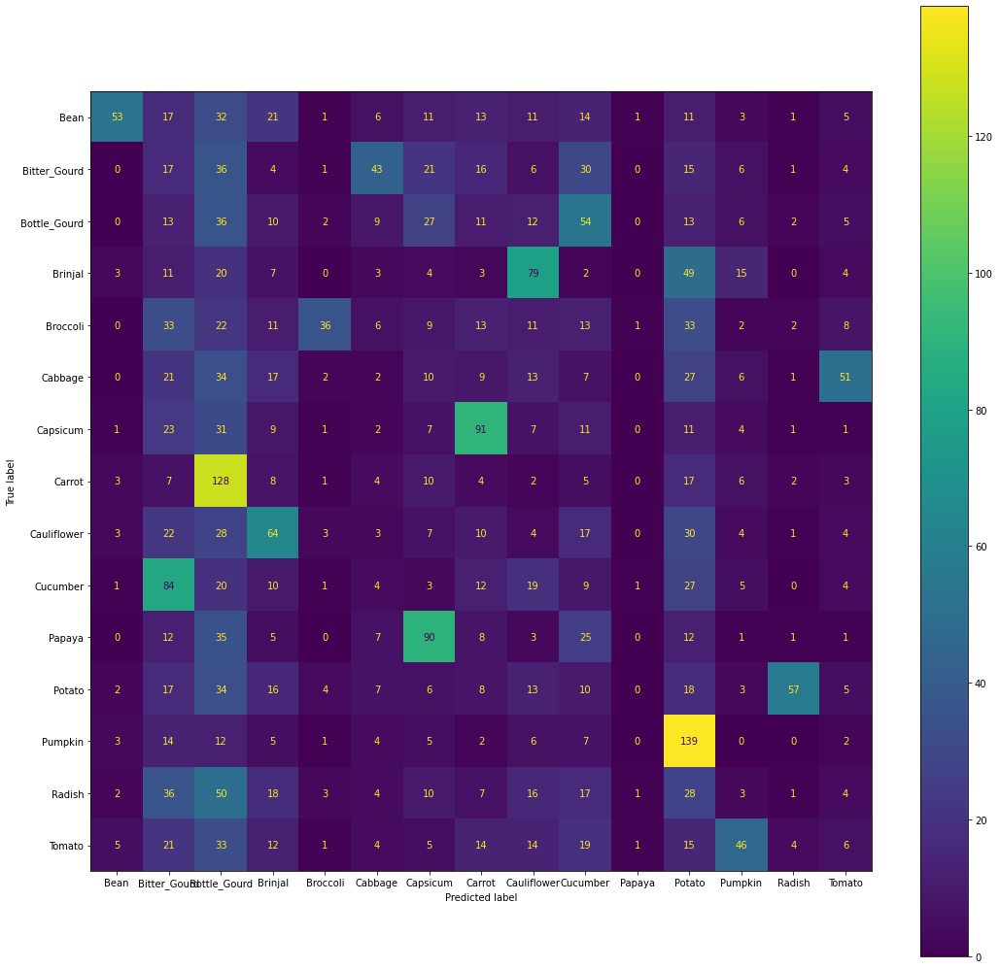

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


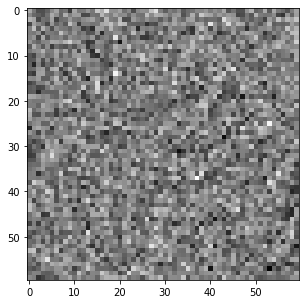

Bitter_Gourd


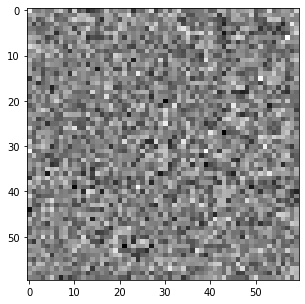

Bottle_Gourd


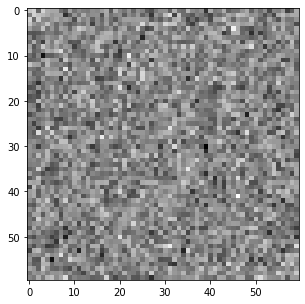

Brinjal


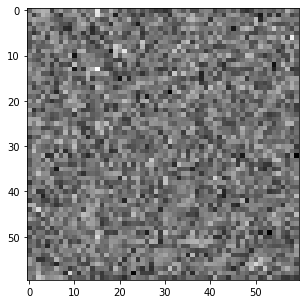

Broccoli


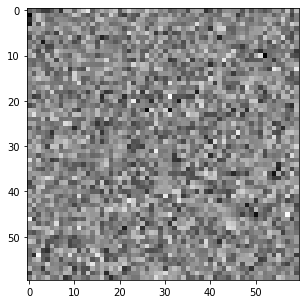

Cabbage


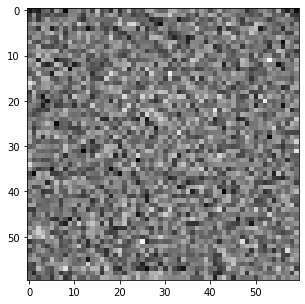

Capsicum


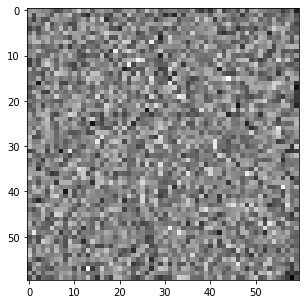

Carrot


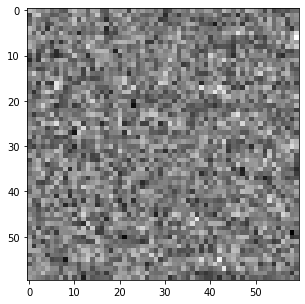

Cauliflower


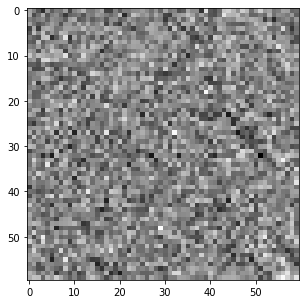

Cucumber


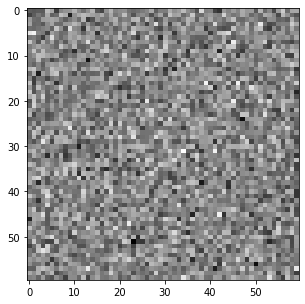

Papaya


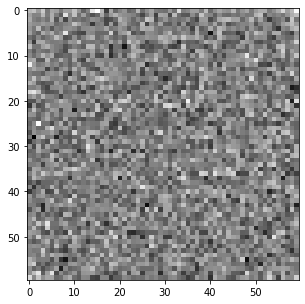

Potato


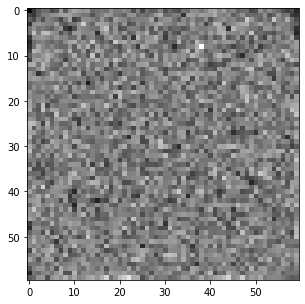

Pumpkin


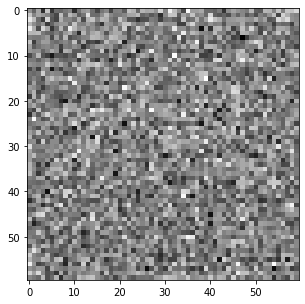

Radish


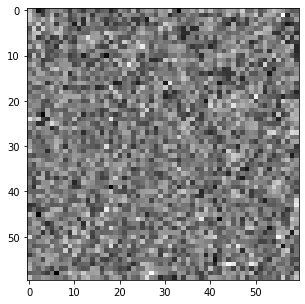

Tomato


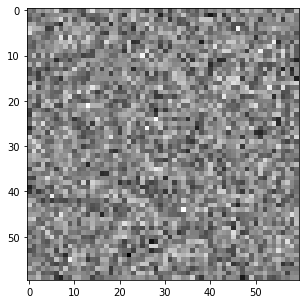

In [ ]:
model.visualize_weights(60)

In [ ]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.02, batch_size = 64, activ_func = ["softmax"] , epoch =30)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.7657500003665993, validation cost = 3.444266127690491
Train Accuracy: 16.673333333333336 Validation Accuracy: 6.7
Epoch 2: training cost = 2.6135013739044415, validation cost = 3.459512167732288
Train Accuracy: 21.126666666666665 Validation Accuracy: 7.3
Epoch 3: training cost = 2.521232563570442, validation cost = 3.4706932841102556
Train Accuracy: 23.98 Validation Accuracy: 7.2666666666666675
Epoch 4: training cost = 2.455145253601958, validation cost = 3.4809376905966887
Train Accuracy: 25.833333333333336 Validation Accuracy: 7.066666666666667
Epoch 5: training cost = 2.403281241876685, validation cost = 3.4903255055014024
Train Accuracy: 27.213333333333335 Validation Accuracy: 6.9
Epoch 6: training cost = 2.3602267654107165, validation cost = 3.498865553290674
Train Accuracy: 28.82 Validation Accuracy: 6.866666666666667
Epoch 7: training cost = 2.323142653047767, validation cost = 3.5066842443548762
Train Accuracy: 29.893333333333334 Validation Accuracy: 

              precision    recall  f1-score   support

           0      0.593     0.240     0.342       200
           1      0.042     0.030     0.035       200
           2      0.042     0.055     0.048       200
           3      0.056     0.065     0.060       200
           4      0.587     0.135     0.220       200
           5      0.034     0.040     0.037       200
           6      0.028     0.030     0.029       200
           7      0.027     0.040     0.033       200
           8      0.035     0.045     0.039       200
           9      0.047     0.040     0.043       200
          10      0.063     0.140     0.087       200
          11      0.023     0.030     0.026       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.066     0.045     0.053       200

    accuracy                          0.062      3000
   macro avg      0.109     0.062     0.070      3000
weighted avg      0.109   

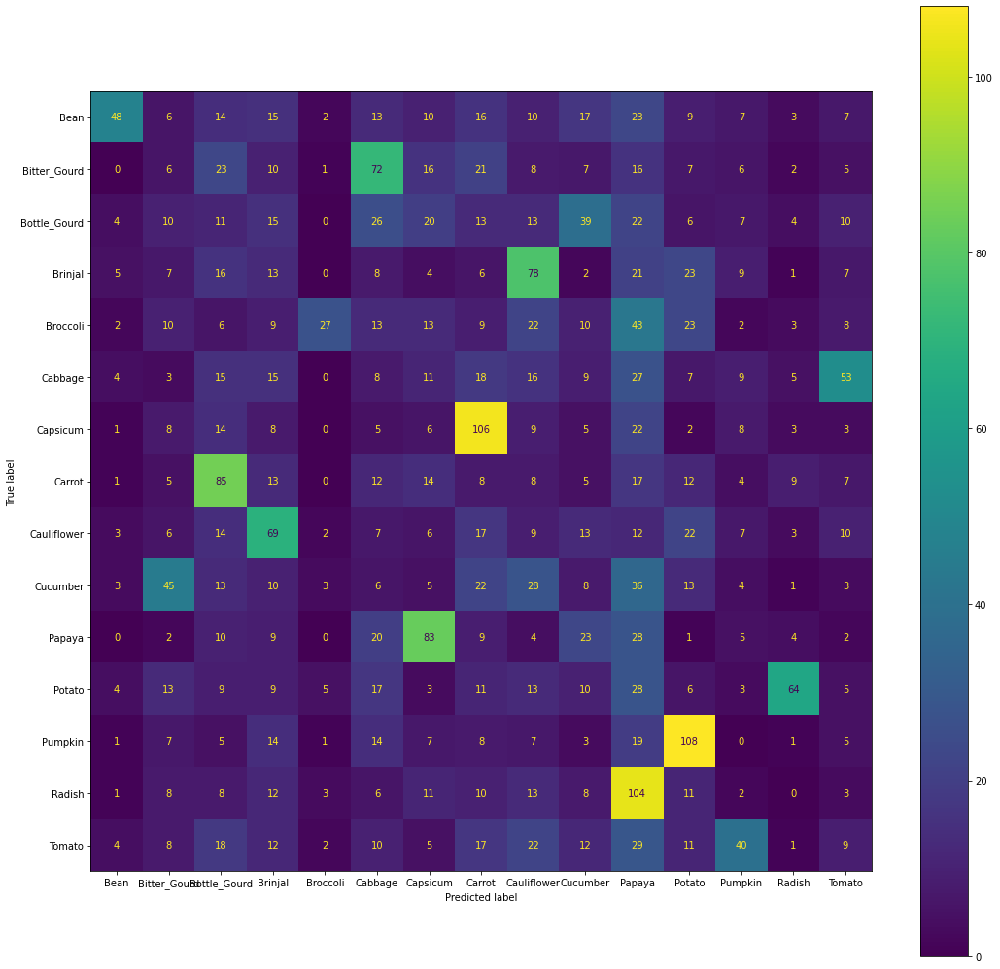

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


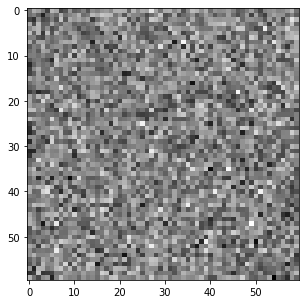

Bitter_Gourd


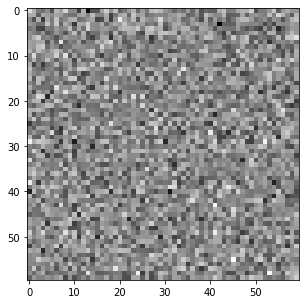

Bottle_Gourd


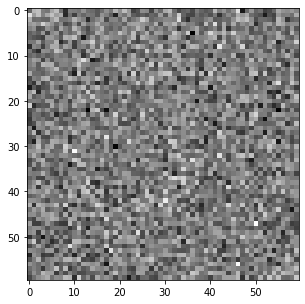

Brinjal


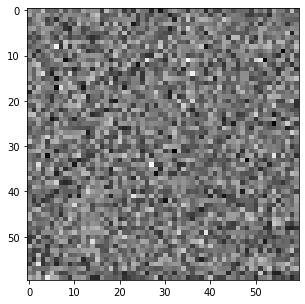

Broccoli


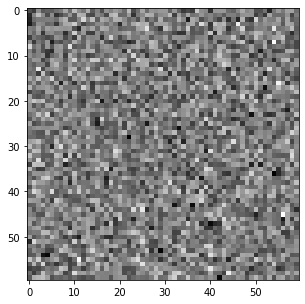

Cabbage


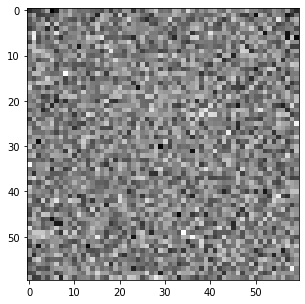

Capsicum


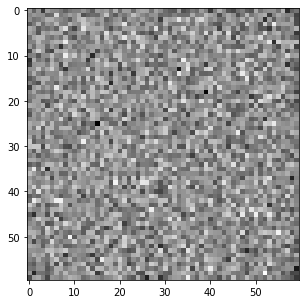

Carrot


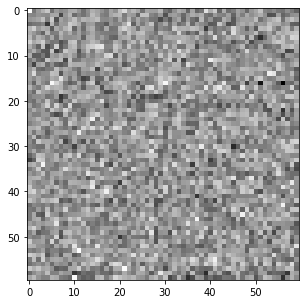

Cauliflower


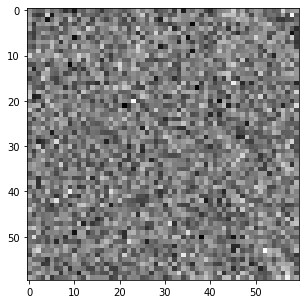

Cucumber


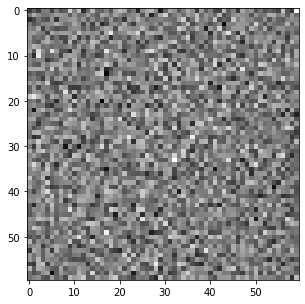

Papaya


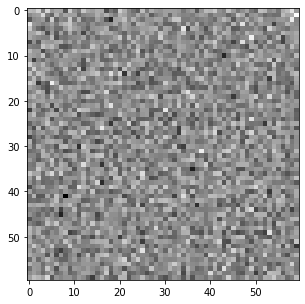

Potato


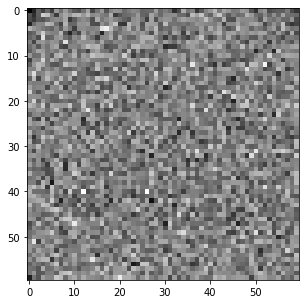

Pumpkin


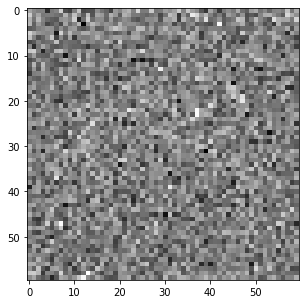

Radish


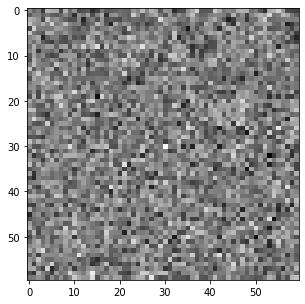

Tomato


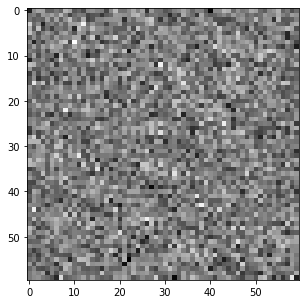

In [ ]:
model.visualize_weights(60)

In [ ]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.02, batch_size = 128, activ_func = ["softmax"] , epoch =30)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.8532062471663417, validation cost = 3.3573133924867644
Train Accuracy: 13.946666666666665 Validation Accuracy: 5.966666666666667
Epoch 2: training cost = 2.720208114001416, validation cost = 3.3980804974457834
Train Accuracy: 17.0 Validation Accuracy: 6.366666666666666
Epoch 3: training cost = 2.6378390335166877, validation cost = 3.4183825084870483
Train Accuracy: 19.21333333333333 Validation Accuracy: 6.266666666666667
Epoch 4: training cost = 2.576676770340685, validation cost = 3.4289879224244997
Train Accuracy: 20.919999999999998 Validation Accuracy: 6.633333333333333
Epoch 5: training cost = 2.527791951516081, validation cost = 3.4355842431330714
Train Accuracy: 22.54 Validation Accuracy: 6.5
Epoch 6: training cost = 2.487044301042175, validation cost = 3.4405253447935626
Train Accuracy: 24.05333333333333 Validation Accuracy: 6.633333333333333
Epoch 7: training cost = 2.4520930668198426, validation cost = 3.444749557681515
Train Accuracy: 25.13333333333

              precision    recall  f1-score   support

           0      0.482     0.265     0.342       200
           1      0.023     0.010     0.014       200
           2      0.056     0.055     0.056       200
           3      0.045     0.045     0.045       200
           4      0.351     0.130     0.190       200
           5      0.077     0.130     0.096       200
           6      0.030     0.045     0.036       200
           7      0.025     0.030     0.027       200
           8      0.026     0.055     0.035       200
           9      0.058     0.040     0.047       200
          10      0.055     0.090     0.069       200
          11      0.030     0.020     0.024       200
          12      0.019     0.015     0.017       200
          13      0.028     0.020     0.023       200
          14      0.085     0.060     0.070       200

    accuracy                          0.067      3000
   macro avg      0.093     0.067     0.073      3000
weighted avg      0.093   

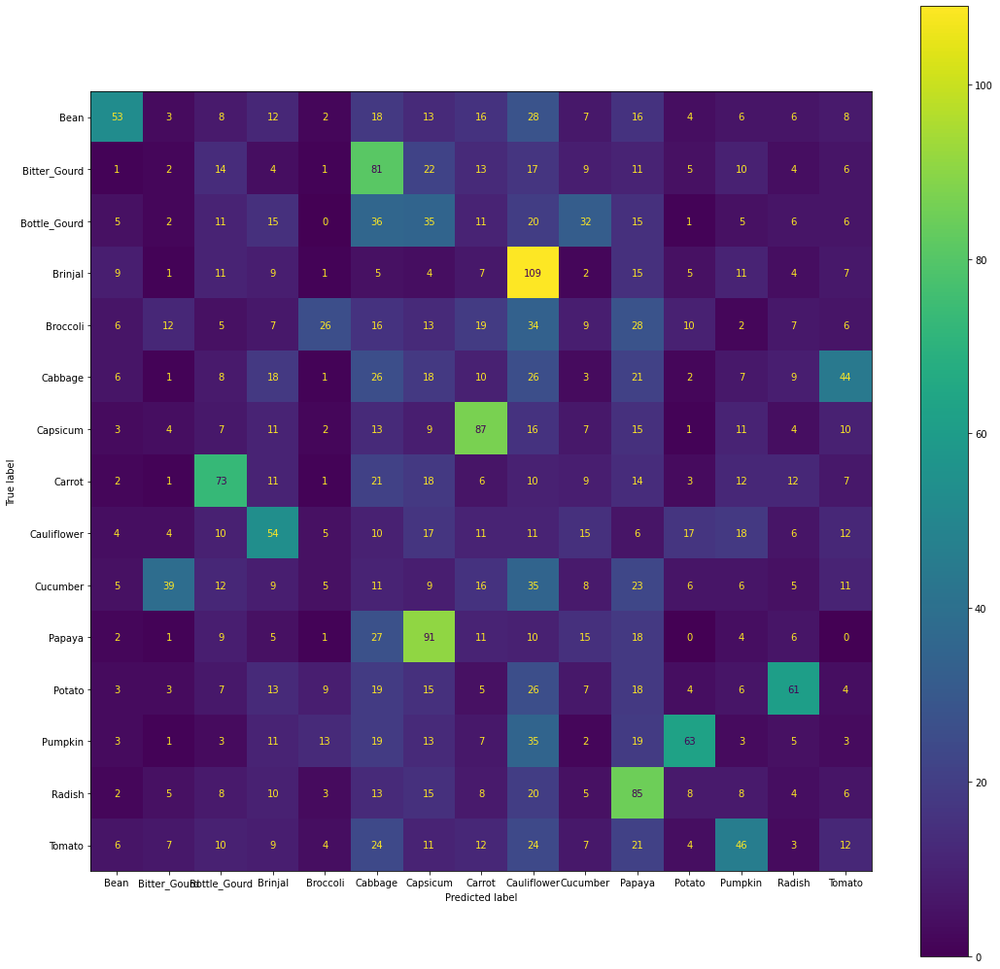

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


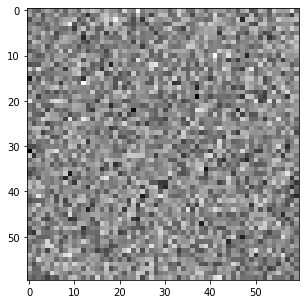

Bitter_Gourd


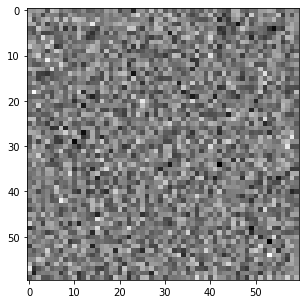

Bottle_Gourd


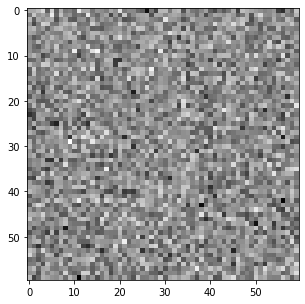

Brinjal


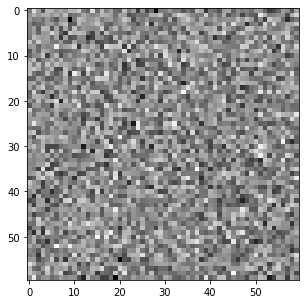

Broccoli


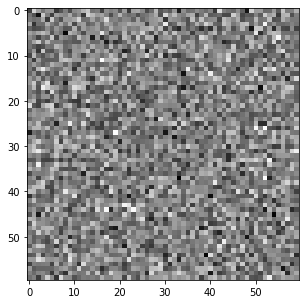

Cabbage


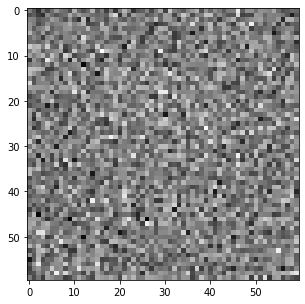

Capsicum


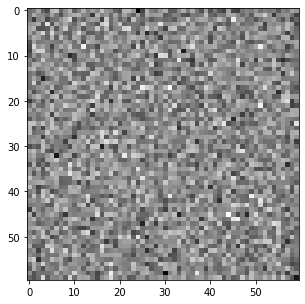

Carrot


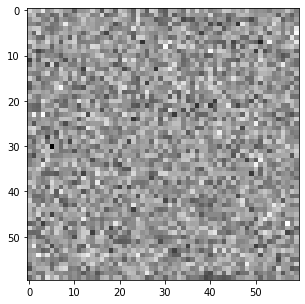

Cauliflower


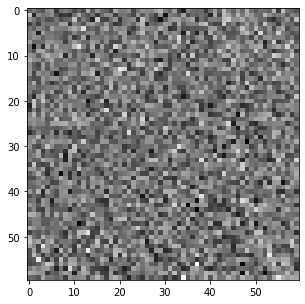

Cucumber


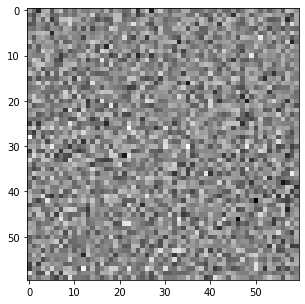

Papaya


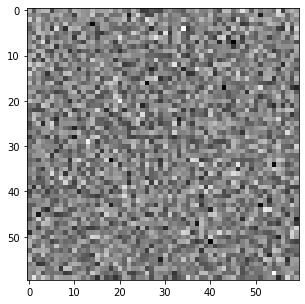

Potato


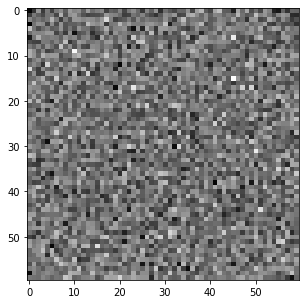

Pumpkin


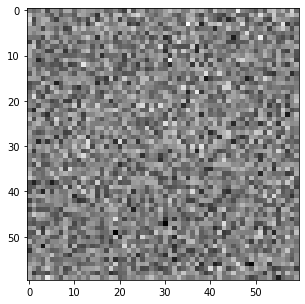

Radish


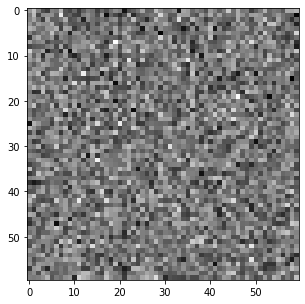

Tomato


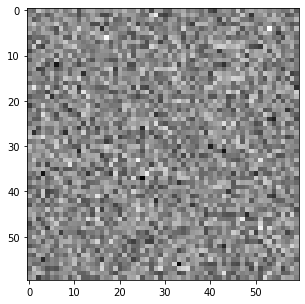

In [ ]:
model.visualize_weights(60)

# One hiden layer

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.005, batch_size = 16, activ_func = ["sigmoid", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.358212679413441, validation cost = 3.0064616816869303
Train Accuracy: 26.426666666666666 Validation Accuracy: 7.866666666666666
Epoch 2: training cost = 2.281748437079554, validation cost = 3.022355487990342
Train Accuracy: 29.96666666666667 Validation Accuracy: 7.9
Epoch 3: training cost = 2.239228147861517, validation cost = 3.0547702634132414
Train Accuracy: 31.486666666666668 Validation Accuracy: 8.166666666666666
Epoch 4: training cost = 2.200231678382436, validation cost = 3.0881925974869087
Train Accuracy: 32.79333333333334 Validation Accuracy: 8.1
Epoch 5: training cost = 2.1640639128104637, validation cost = 3.1144408365035336
Train Accuracy: 34.32 Validation Accuracy: 8.266666666666666
Epoch 6: training cost = 2.1299275040842334, validation cost = 3.136015020157106
Train Accuracy: 35.29333333333333 Validation Accuracy: 8.433333333333334
Epoch 7: training cost = 2.097430662854791, validation cost = 3.1609363514088447
Train Accuracy: 36.32 Validation 

              precision    recall  f1-score   support

           0      0.484     0.375     0.423       200
           1      0.023     0.025     0.024       200
           2      0.035     0.045     0.040       200
           3      0.040     0.030     0.034       200
           4      0.484     0.075     0.130       200
           5      0.075     0.100     0.086       200
           6      0.049     0.095     0.065       200
           7      0.021     0.020     0.020       200
           8      0.039     0.040     0.039       200
           9      0.037     0.015     0.021       200
          10      0.091     0.110     0.100       200
          11      0.037     0.080     0.050       200
          12      0.000     0.000     0.000       200
          13      0.006     0.005     0.006       200
          14      0.089     0.040     0.055       200

    accuracy                          0.070      3000
   macro avg      0.101     0.070     0.073      3000
weighted avg      0.101   

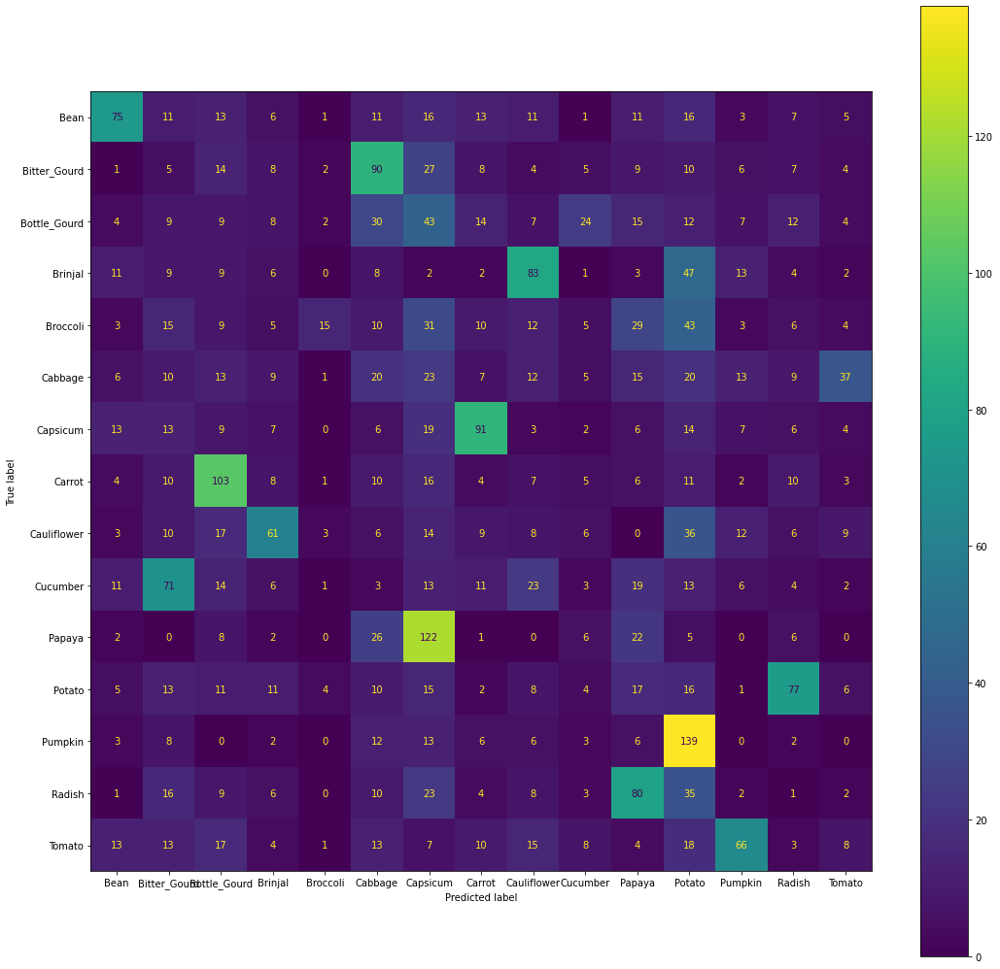

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


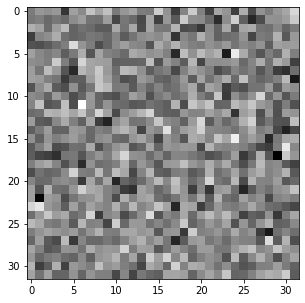

Bitter_Gourd


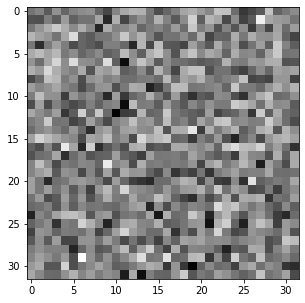

Bottle_Gourd


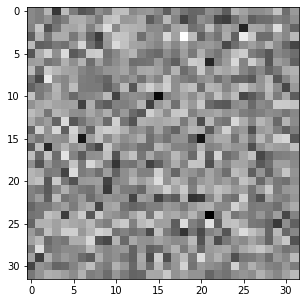

Brinjal


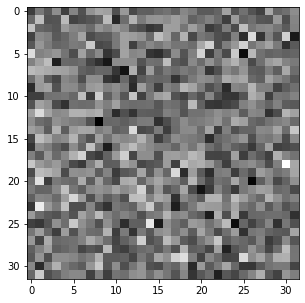

Broccoli


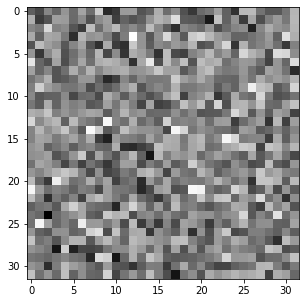

Cabbage


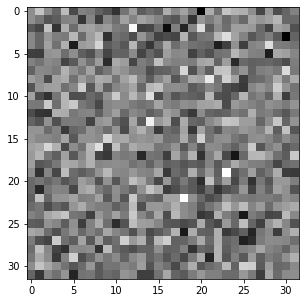

Capsicum


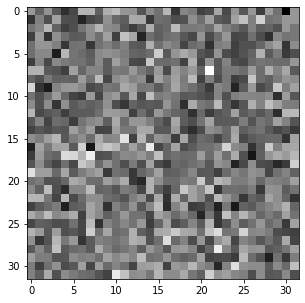

Carrot


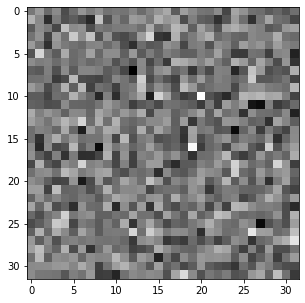

Cauliflower


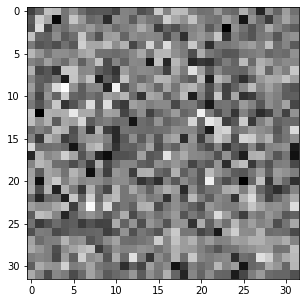

Cucumber


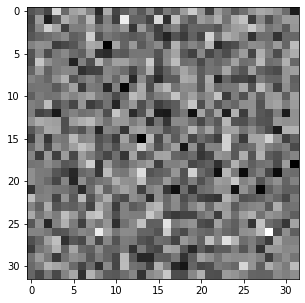

Papaya


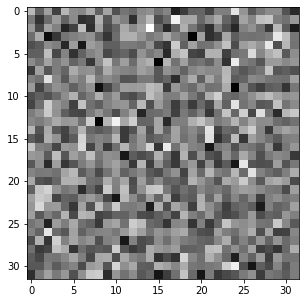

Potato


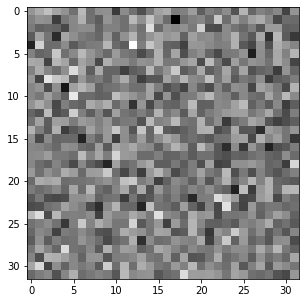

Pumpkin


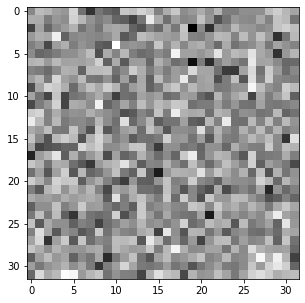

Radish


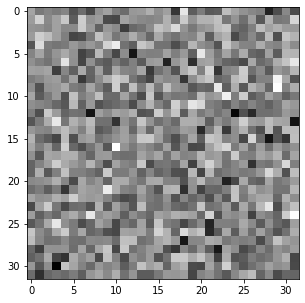

Tomato


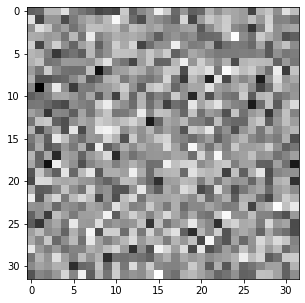

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.005, batch_size = 16, activ_func = ["relu", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 2: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 3: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 4: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 5: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 6: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 7: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 8: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667


              precision    recall  f1-score   support

           0      0.067     1.000     0.125       200
           1      0.000     0.000     0.000       200
           2      0.000     0.000     0.000       200
           3      0.000     0.000     0.000       200
           4      0.000     0.000     0.000       200
           5      0.000     0.000     0.000       200
           6      0.000     0.000     0.000       200
           7      0.000     0.000     0.000       200
           8      0.000     0.000     0.000       200
           9      0.000     0.000     0.000       200
          10      0.000     0.000     0.000       200
          11      0.000     0.000     0.000       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.000     0.000     0.000       200

    accuracy                          0.067      3000
   macro avg      0.004     0.067     0.008      3000
weighted avg      0.004   

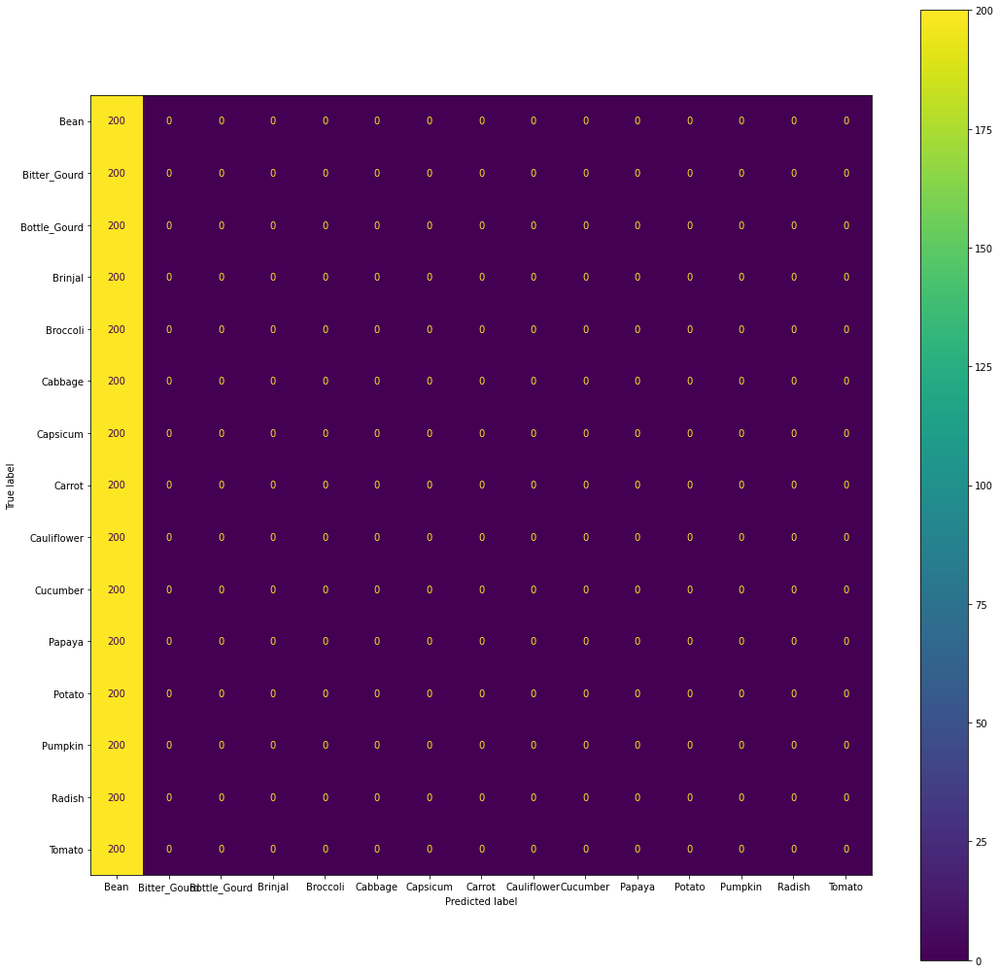

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


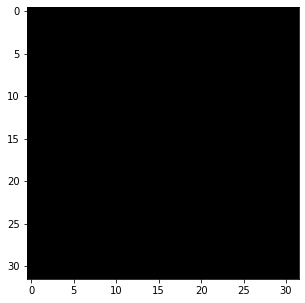

Bitter_Gourd


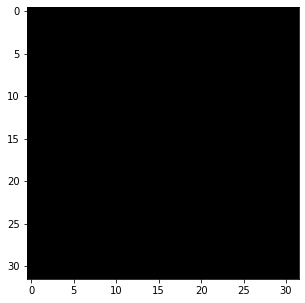

Bottle_Gourd


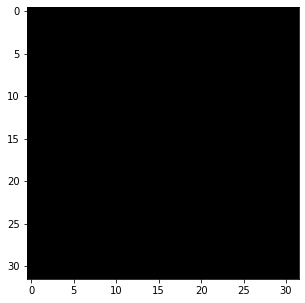

Brinjal


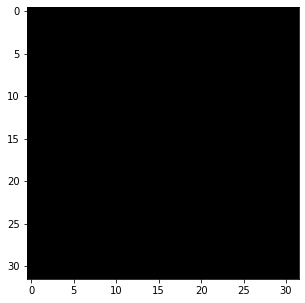

Broccoli


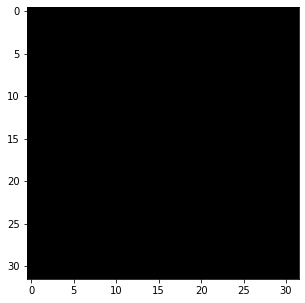

Cabbage


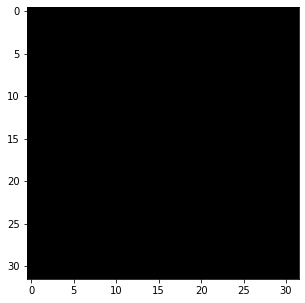

Capsicum


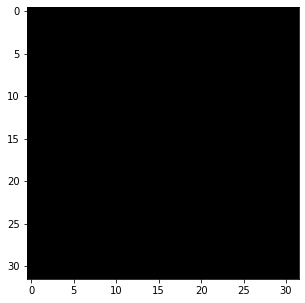

Carrot


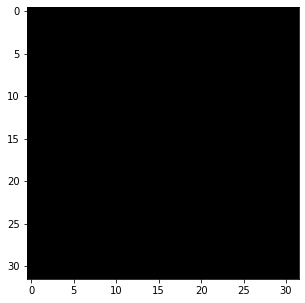

Cauliflower


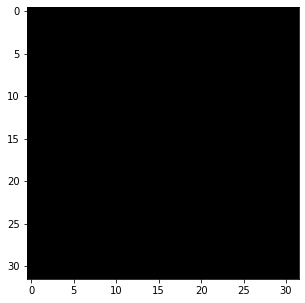

Cucumber


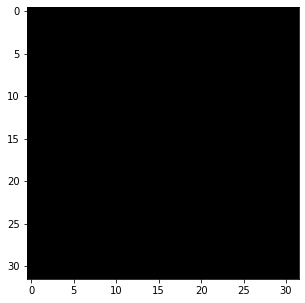

Papaya


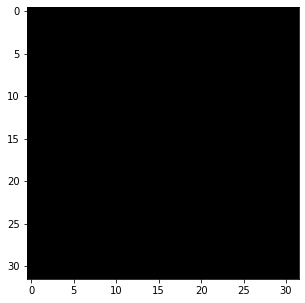

Potato


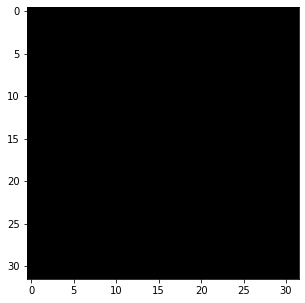

Pumpkin


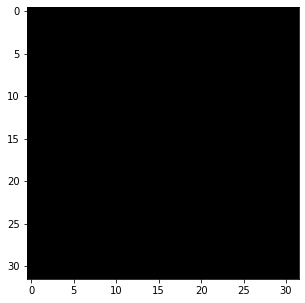

Radish


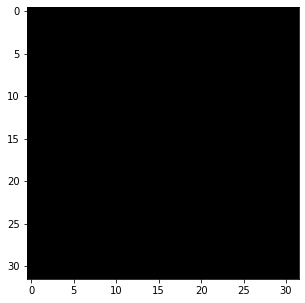

Tomato


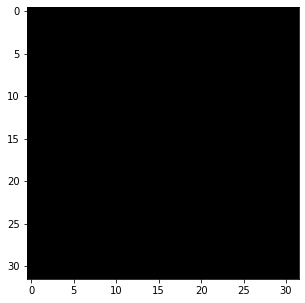

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.005, batch_size = 16, activ_func = ["tanh", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.2340891905651317, validation cost = 3.356778805803703
Train Accuracy: 30.653333333333332 Validation Accuracy: 7.633333333333334
Epoch 2: training cost = 2.041102750411876, validation cost = 3.435330534441576
Train Accuracy: 36.4 Validation Accuracy: 7.933333333333334
Epoch 3: training cost = 1.9128990953920308, validation cost = 3.5071222717089747
Train Accuracy: 40.44 Validation Accuracy: 8.066666666666666
Epoch 4: training cost = 1.8114253848941808, validation cost = 3.573586831879517
Train Accuracy: 44.080000000000005 Validation Accuracy: 8.133333333333333
Epoch 5: training cost = 1.7260573041261704, validation cost = 3.6358197288381477
Train Accuracy: 46.96 Validation Accuracy: 8.133333333333333
Epoch 6: training cost = 1.6509427970348745, validation cost = 3.6948715528241953
Train Accuracy: 49.74 Validation Accuracy: 8.033333333333333
Epoch 7: training cost = 1.5832007632090703, validation cost = 3.7501327157568096
Train Accuracy: 51.953333333333326 Vali

              precision    recall  f1-score   support

           0      0.533     0.450     0.488       200
           1      0.040     0.045     0.042       200
           2      0.050     0.065     0.056       200
           3      0.028     0.025     0.027       200
           4      0.497     0.375     0.427       200
           5      0.049     0.050     0.049       200
           6      0.039     0.065     0.049       200
           7      0.000     0.000     0.000       200
           8      0.027     0.035     0.031       200
           9      0.034     0.020     0.025       200
          10      0.020     0.020     0.020       200
          11      0.035     0.050     0.041       200
          12      0.005     0.005     0.005       200
          13      0.048     0.035     0.040       200
          14      0.007     0.005     0.006       200

    accuracy                          0.083      3000
   macro avg      0.094     0.083     0.087      3000
weighted avg      0.094   

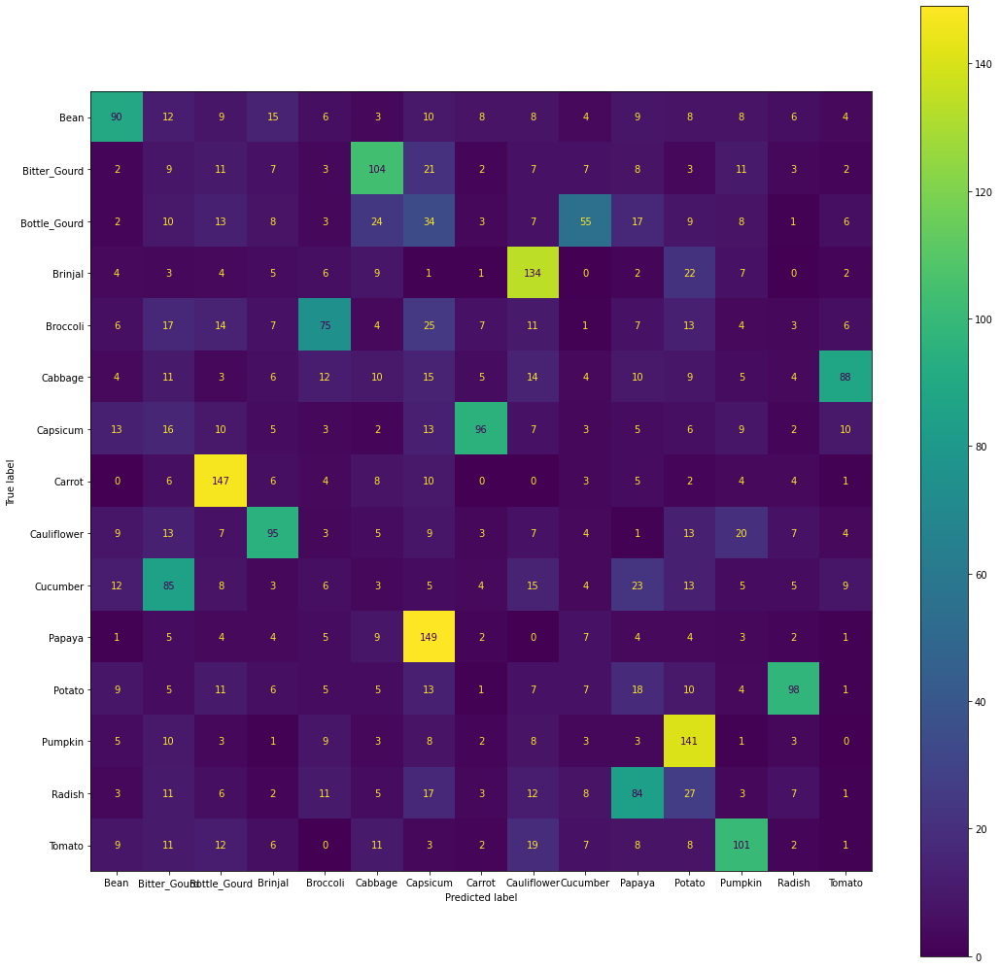

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


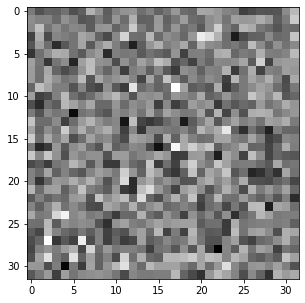

Bitter_Gourd


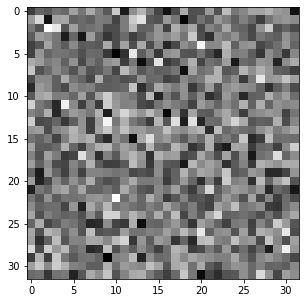

Bottle_Gourd


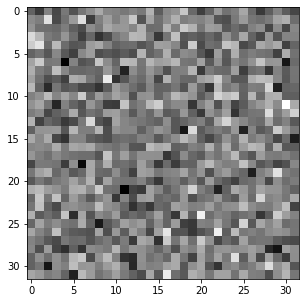

Brinjal


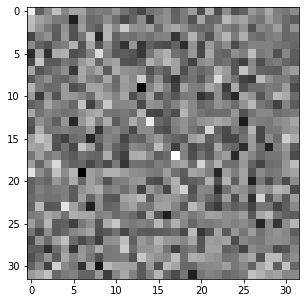

Broccoli


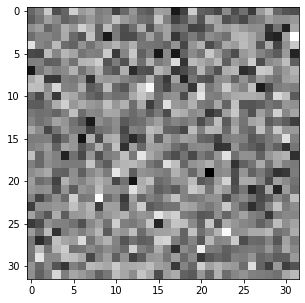

Cabbage


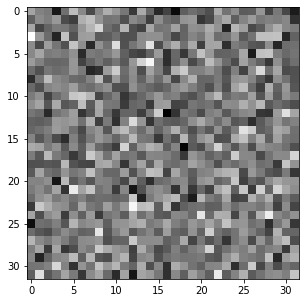

Capsicum


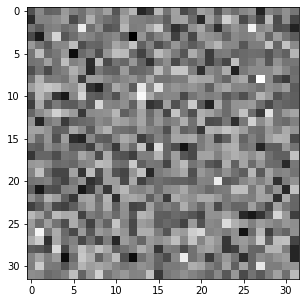

Carrot


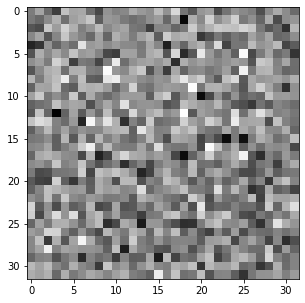

Cauliflower


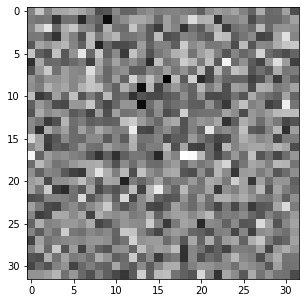

Cucumber


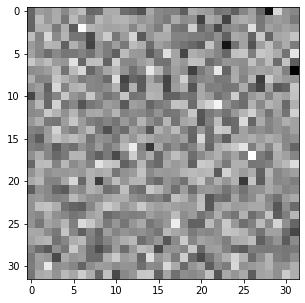

Papaya


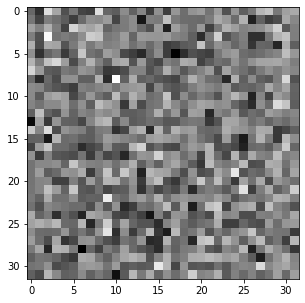

Potato


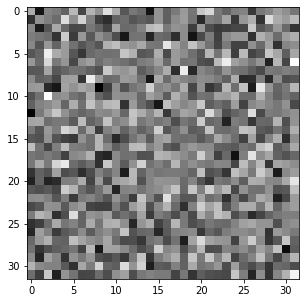

Pumpkin


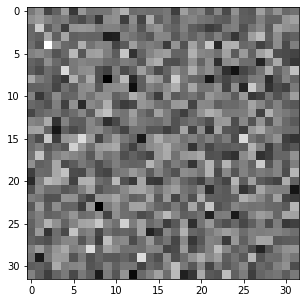

Radish


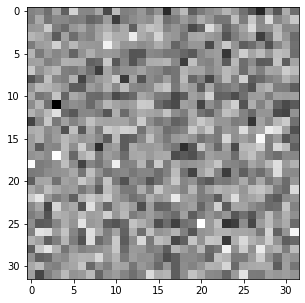

Tomato


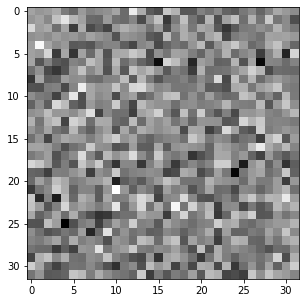

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.005, batch_size = 32, activ_func = ["sigmoid", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.46491142262308, validation cost = 2.944585430135109
Train Accuracy: 21.006666666666668 Validation Accuracy: 7.566666666666666
Epoch 2: training cost = 2.3556230276330794, validation cost = 2.9956233567255524
Train Accuracy: 26.666666666666668 Validation Accuracy: 7.433333333333334
Epoch 3: training cost = 2.2995257442674384, validation cost = 3.0165677955681165
Train Accuracy: 29.39333333333333 Validation Accuracy: 7.199999999999999
Epoch 4: training cost = 2.261440183811239, validation cost = 3.0316508819726415
Train Accuracy: 30.880000000000003 Validation Accuracy: 7.333333333333333
Epoch 5: training cost = 2.232866384965225, validation cost = 3.0459985919680705
Train Accuracy: 32.10666666666667 Validation Accuracy: 7.433333333333334
Epoch 6: training cost = 2.209458136791336, validation cost = 3.0609524793310277
Train Accuracy: 33.03333333333333 Validation Accuracy: 7.6
Epoch 7: training cost = 2.187914325780473, validation cost = 3.075793106633571
Train A

              precision    recall  f1-score   support

           0      0.463     0.285     0.353       200
           1      0.021     0.020     0.020       200
           2      0.050     0.050     0.050       200
           3      0.056     0.060     0.058       200
           4      0.270     0.050     0.084       200
           5      0.082     0.125     0.099       200
           6      0.031     0.040     0.035       200
           7      0.056     0.075     0.064       200
           8      0.037     0.045     0.040       200
           9      0.037     0.025     0.030       200
          10      0.080     0.125     0.097       200
          11      0.021     0.030     0.025       200
          12      0.011     0.010     0.011       200
          13      0.014     0.010     0.012       200
          14      0.082     0.040     0.054       200

    accuracy                          0.066      3000
   macro avg      0.087     0.066     0.069      3000
weighted avg      0.087   

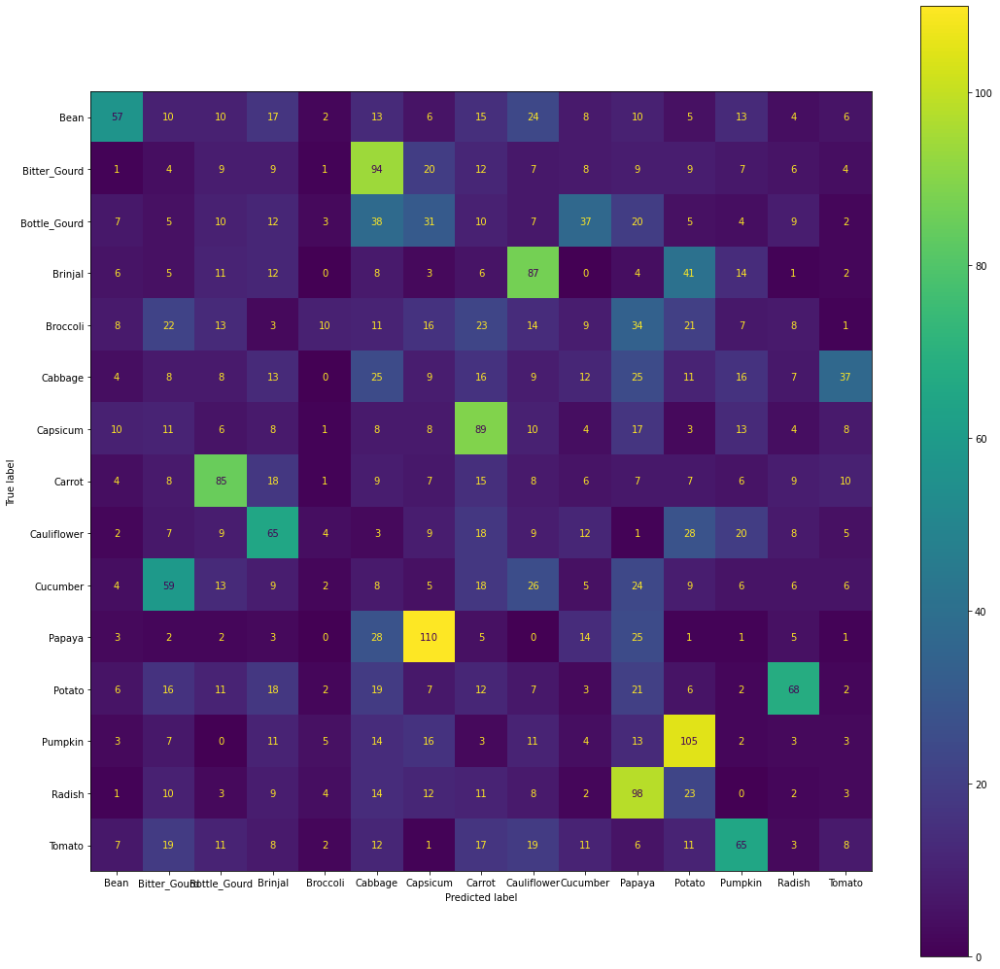

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


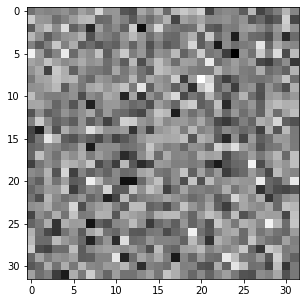

Bitter_Gourd


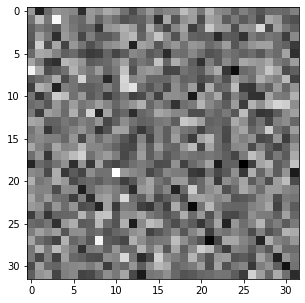

Bottle_Gourd


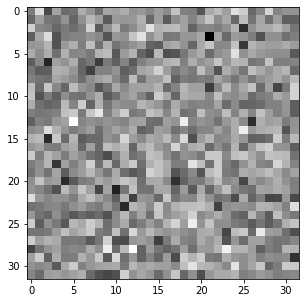

Brinjal


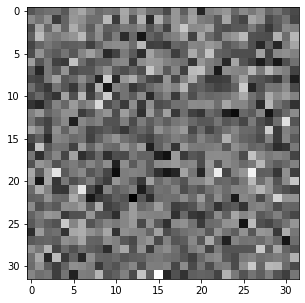

Broccoli


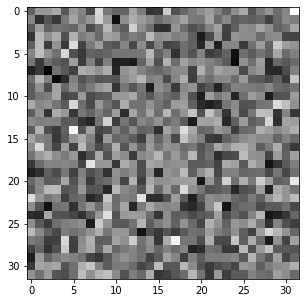

Cabbage


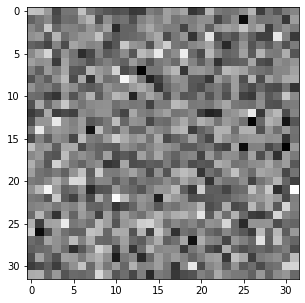

Capsicum


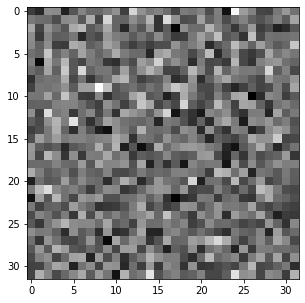

Carrot


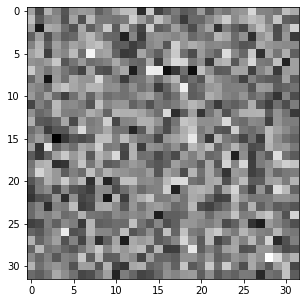

Cauliflower


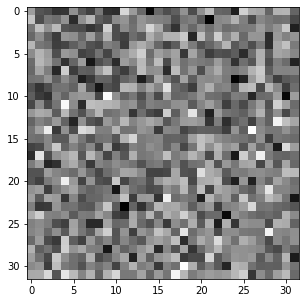

Cucumber


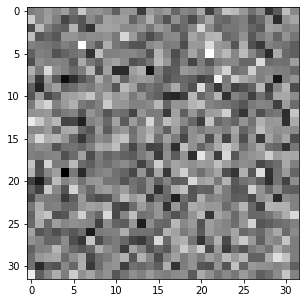

Papaya


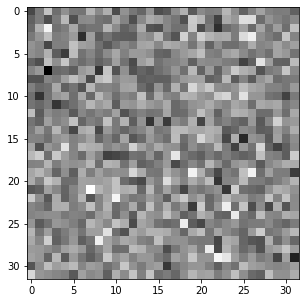

Potato


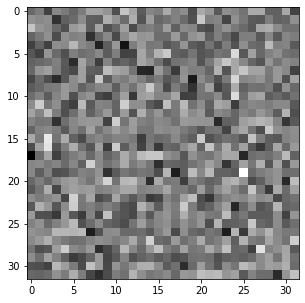

Pumpkin


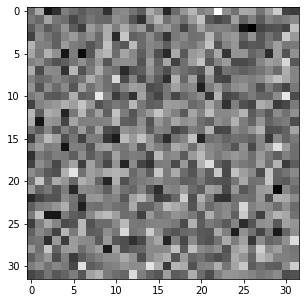

Radish


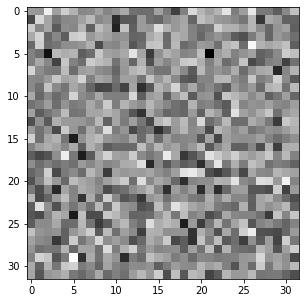

Tomato


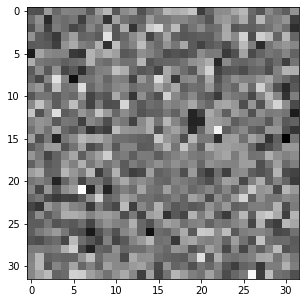

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.005, batch_size = 32, activ_func = ["relu", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 2: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 3: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 4: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 5: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 6: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 7: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 8: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667


              precision    recall  f1-score   support

           0      0.067     1.000     0.125       200
           1      0.000     0.000     0.000       200
           2      0.000     0.000     0.000       200
           3      0.000     0.000     0.000       200
           4      0.000     0.000     0.000       200
           5      0.000     0.000     0.000       200
           6      0.000     0.000     0.000       200
           7      0.000     0.000     0.000       200
           8      0.000     0.000     0.000       200
           9      0.000     0.000     0.000       200
          10      0.000     0.000     0.000       200
          11      0.000     0.000     0.000       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.000     0.000     0.000       200

    accuracy                          0.067      3000
   macro avg      0.004     0.067     0.008      3000
weighted avg      0.004   

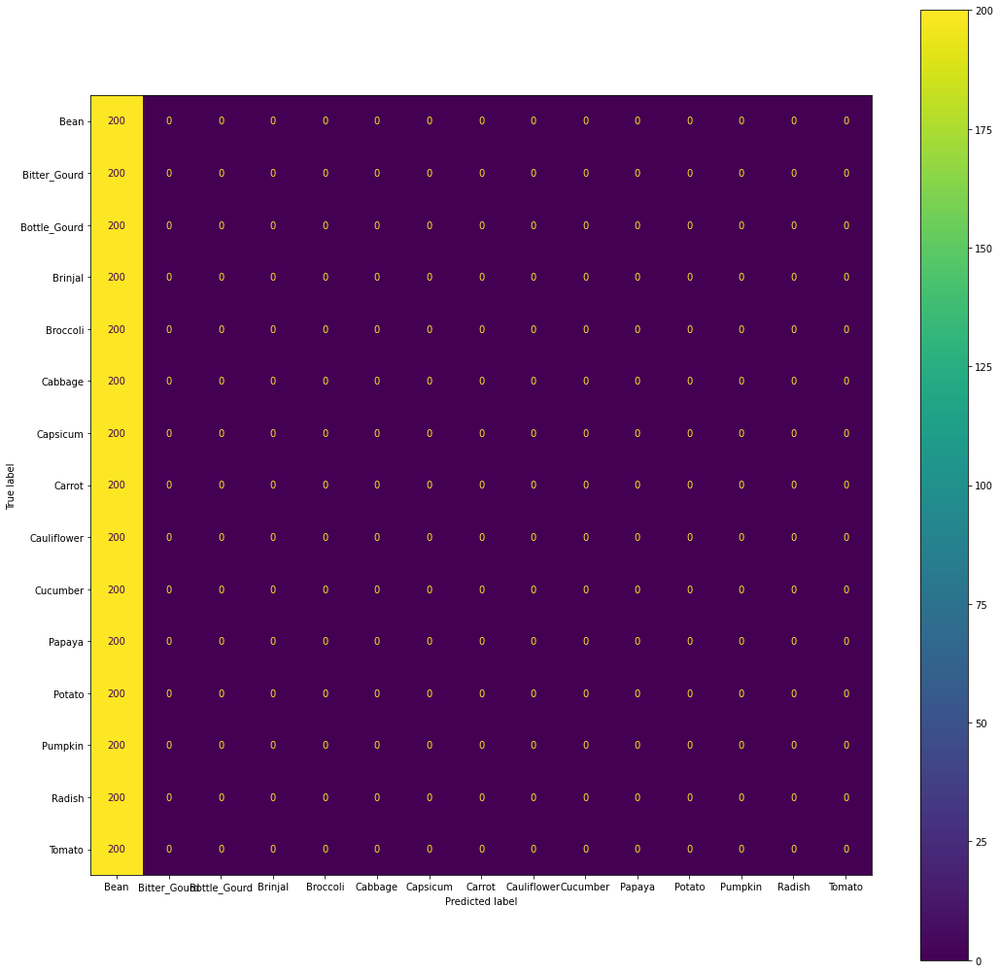

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


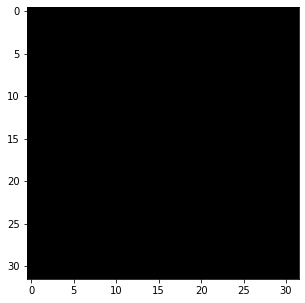

Bitter_Gourd


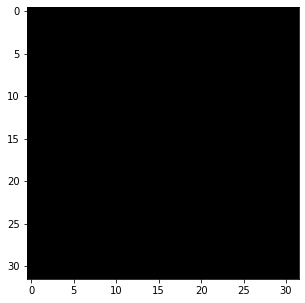

Bottle_Gourd


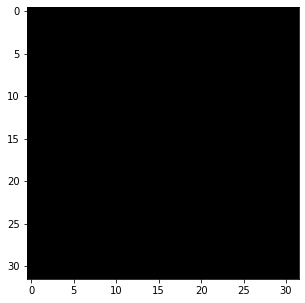

Brinjal


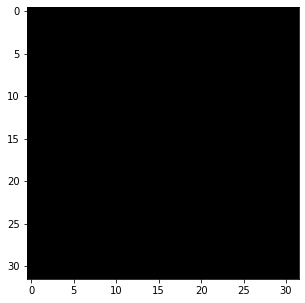

Broccoli


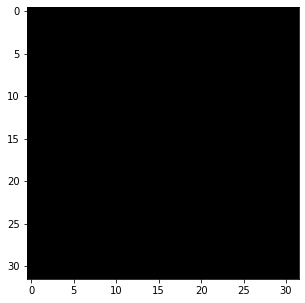

Cabbage


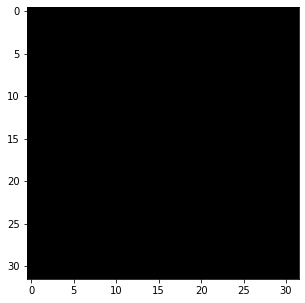

Capsicum


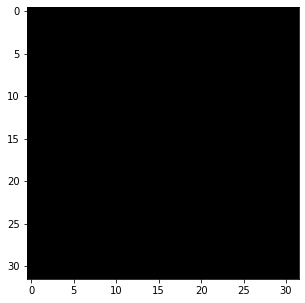

Carrot


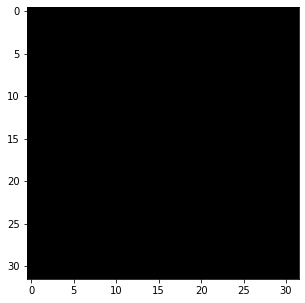

Cauliflower


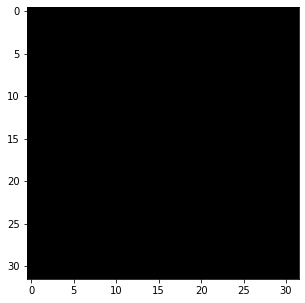

Cucumber


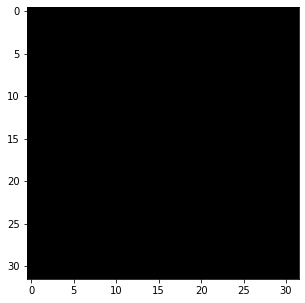

Papaya


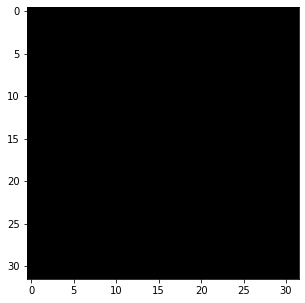

Potato


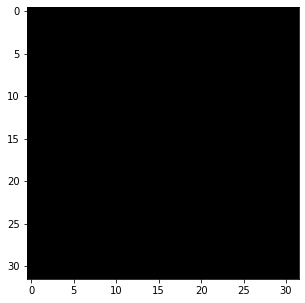

Pumpkin


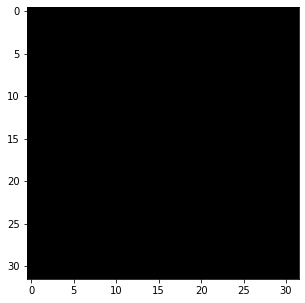

Radish


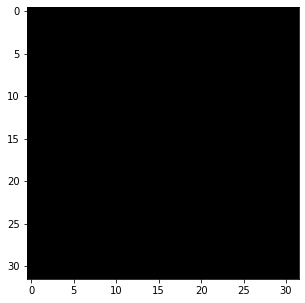

Tomato


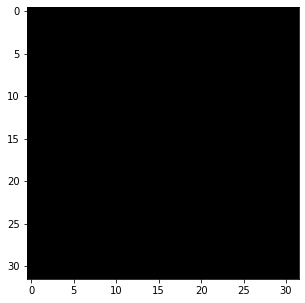

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.005, batch_size = 32, activ_func = ["tanh", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.4078565567563275, validation cost = 3.328159391171211
Train Accuracy: 24.673333333333332 Validation Accuracy: 7.1
Epoch 2: training cost = 2.222831067676724, validation cost = 3.3497956009771754
Train Accuracy: 30.34 Validation Accuracy: 7.233333333333333
Epoch 3: training cost = 2.1128591737293885, validation cost = 3.386867601677143
Train Accuracy: 33.95333333333333 Validation Accuracy: 7.866666666666666
Epoch 4: training cost = 2.0294462363996444, validation cost = 3.426698898179214
Train Accuracy: 36.78666666666667 Validation Accuracy: 7.933333333333334
Epoch 5: training cost = 1.9592864346018755, validation cost = 3.4661757010334107
Train Accuracy: 39.14 Validation Accuracy: 7.9
Epoch 6: training cost = 1.897800180399721, validation cost = 3.5039425323677023
Train Accuracy: 41.17333333333333 Validation Accuracy: 7.833333333333334
Epoch 7: training cost = 1.8427666337619806, validation cost = 3.539303606594849
Train Accuracy: 43.14 Validation Accuracy: 7.

              precision    recall  f1-score   support

           0      0.559     0.330     0.415       200
           1      0.021     0.025     0.023       200
           2      0.065     0.075     0.070       200
           3      0.056     0.060     0.058       200
           4      0.494     0.190     0.274       200
           5      0.057     0.055     0.056       200
           6      0.037     0.040     0.039       200
           7      0.029     0.040     0.034       200
           8      0.029     0.035     0.032       200
           9      0.034     0.030     0.032       200
          10      0.059     0.080     0.068       200
          11      0.034     0.045     0.039       200
          12      0.005     0.005     0.005       200
          13      0.008     0.005     0.006       200
          14      0.044     0.040     0.042       200

    accuracy                          0.070      3000
   macro avg      0.102     0.070     0.079      3000
weighted avg      0.102   

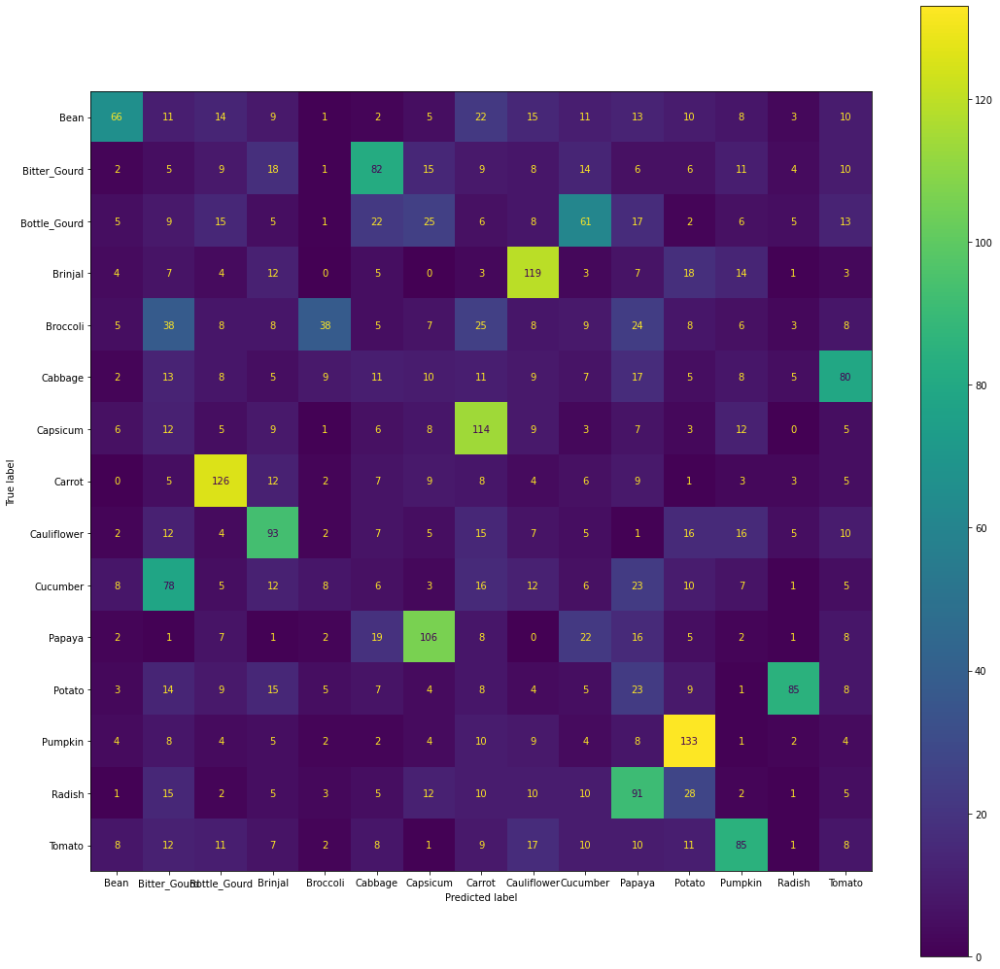

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


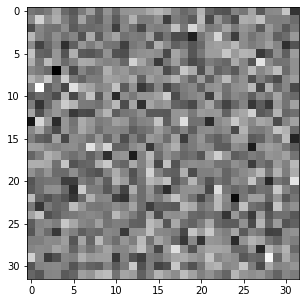

Bitter_Gourd


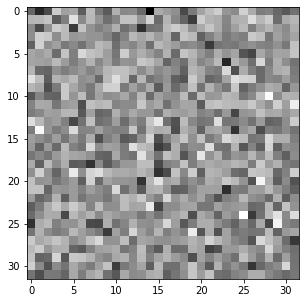

Bottle_Gourd


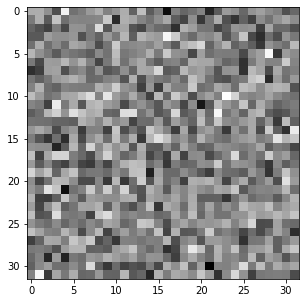

Brinjal


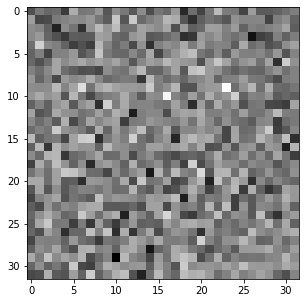

Broccoli


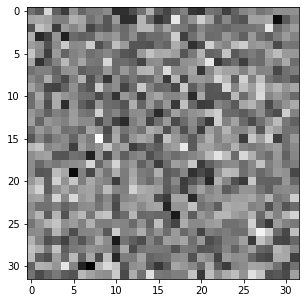

Cabbage


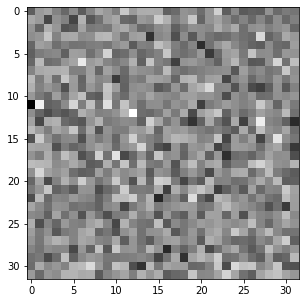

Capsicum


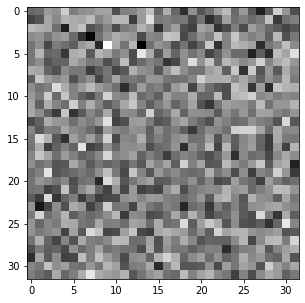

Carrot


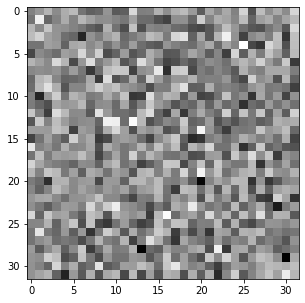

Cauliflower


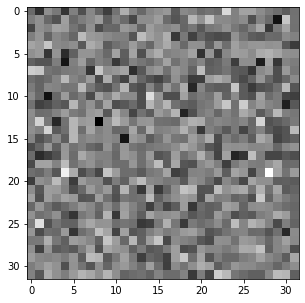

Cucumber


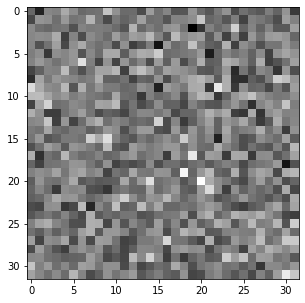

Papaya


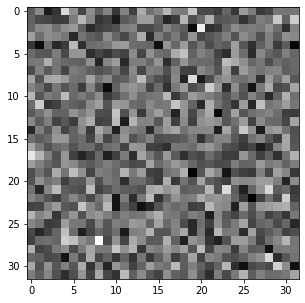

Potato


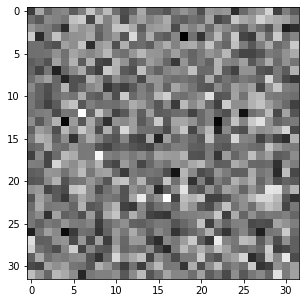

Pumpkin


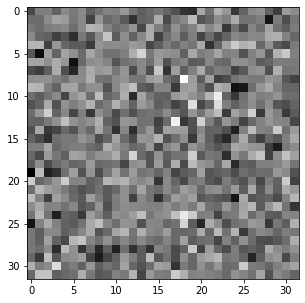

Radish


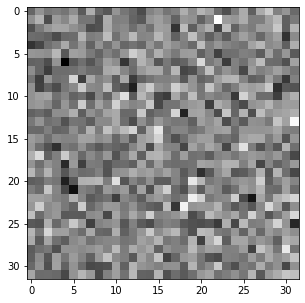

Tomato


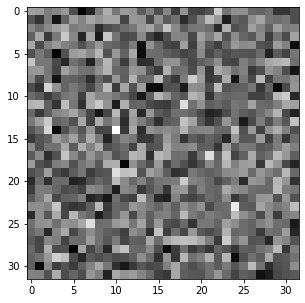

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.005, batch_size = 64, activ_func = ["sigmoid", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.545221534113707, validation cost = 2.8906039649384887
Train Accuracy: 17.773333333333333 Validation Accuracy: 6.233333333333333
Epoch 2: training cost = 2.4428110639558156, validation cost = 2.9285133854552203
Train Accuracy: 22.720000000000002 Validation Accuracy: 6.5
Epoch 3: training cost = 2.386395844782774, validation cost = 2.9493824423169013
Train Accuracy: 25.293333333333333 Validation Accuracy: 7.166666666666667
Epoch 4: training cost = 2.3501414634122635, validation cost = 2.9628959517777584
Train Accuracy: 27.0 Validation Accuracy: 7.166666666666667
Epoch 5: training cost = 2.3241918392008314, validation cost = 2.973284660535096
Train Accuracy: 28.146666666666665 Validation Accuracy: 7.3
Epoch 6: training cost = 2.3035663544855485, validation cost = 2.9820357154330255
Train Accuracy: 29.273333333333333 Validation Accuracy: 7.3
Epoch 7: training cost = 2.285766160906638, validation cost = 2.9902869090531894
Train Accuracy: 30.173333333333336 Validat

              precision    recall  f1-score   support

           0      0.410     0.285     0.336       200
           1      0.035     0.025     0.029       200
           2      0.045     0.040     0.043       200
           3      0.020     0.025     0.022       200
           4      0.292     0.035     0.063       200
           5      0.085     0.135     0.104       200
           6      0.047     0.065     0.054       200
           7      0.034     0.040     0.037       200
           8      0.027     0.030     0.028       200
           9      0.075     0.040     0.052       200
          10      0.092     0.120     0.104       200
          11      0.009     0.015     0.011       200
          12      0.005     0.005     0.005       200
          13      0.017     0.015     0.016       200
          14      0.120     0.090     0.103       200

    accuracy                          0.064      3000
   macro avg      0.088     0.064     0.067      3000
weighted avg      0.088   

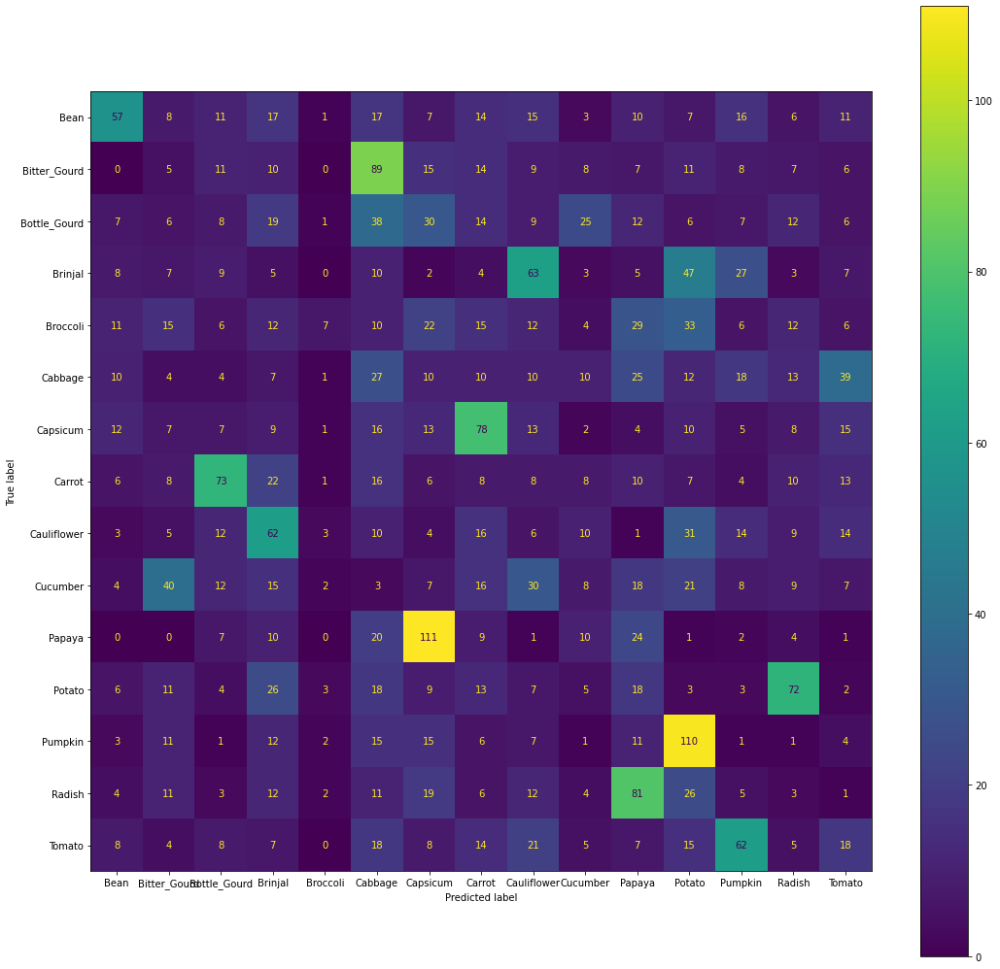

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


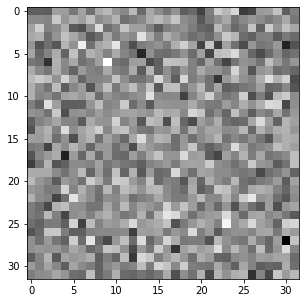

Bitter_Gourd


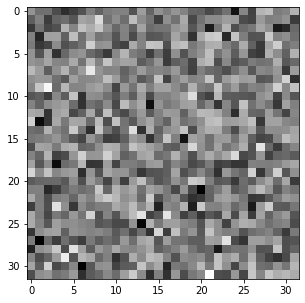

Bottle_Gourd


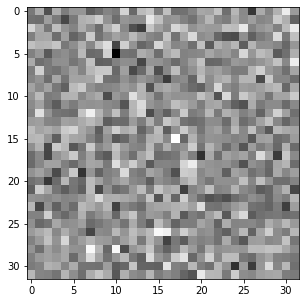

Brinjal


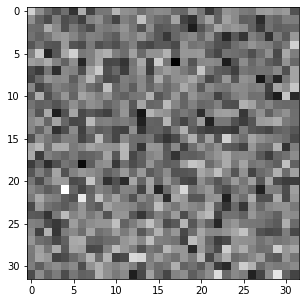

Broccoli


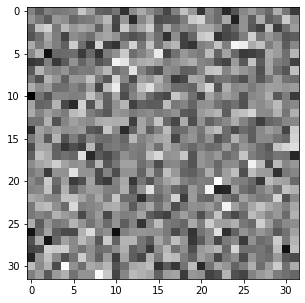

Cabbage


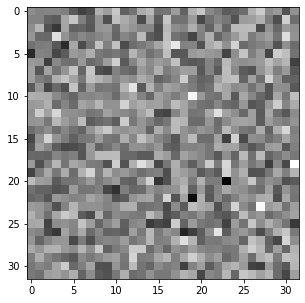

Capsicum


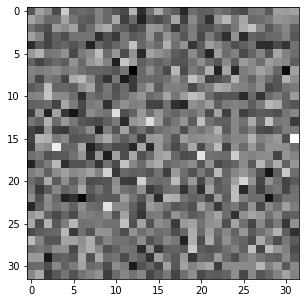

Carrot


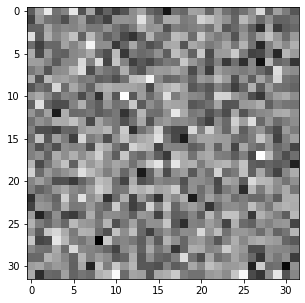

Cauliflower


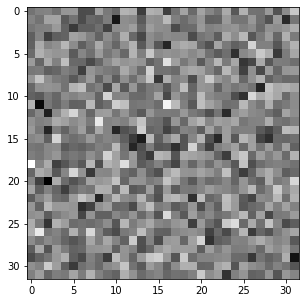

Cucumber


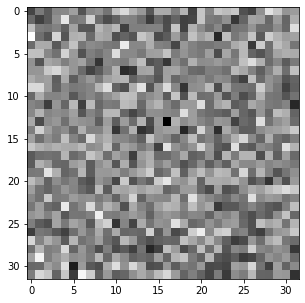

Papaya


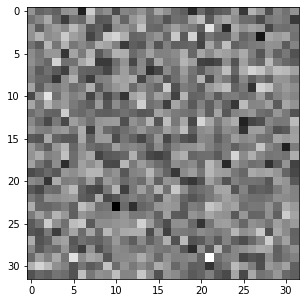

Potato


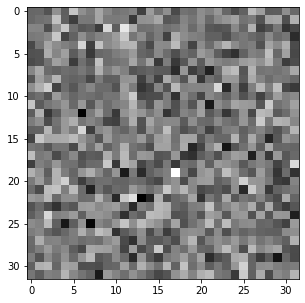

Pumpkin


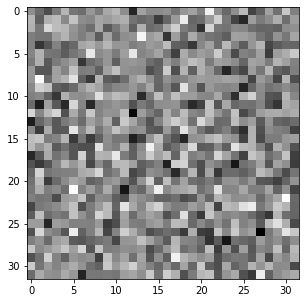

Radish


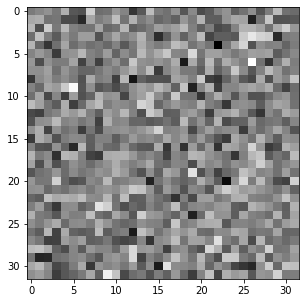

Tomato


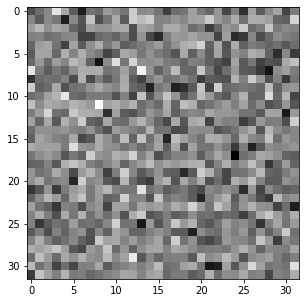

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.005, batch_size = 64, activ_func = ["relu", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 4.136507240460681, validation cost = 5.3223724462677815
Train Accuracy: 14.96 Validation Accuracy: 8.566666666666666
Epoch 2: training cost = 14.339340414215927, validation cost = 17.022484253422384
Train Accuracy: 12.293333333333333 Validation Accuracy: 6.833333333333333
Epoch 3: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 4: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 5: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 6: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 7: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 8: training cost = nan, validation cost = nan
Train Accuracy: 6.6666666

              precision    recall  f1-score   support

           0      0.067     1.000     0.125       200
           1      0.000     0.000     0.000       200
           2      0.000     0.000     0.000       200
           3      0.000     0.000     0.000       200
           4      0.000     0.000     0.000       200
           5      0.000     0.000     0.000       200
           6      0.000     0.000     0.000       200
           7      0.000     0.000     0.000       200
           8      0.000     0.000     0.000       200
           9      0.000     0.000     0.000       200
          10      0.000     0.000     0.000       200
          11      0.000     0.000     0.000       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.000     0.000     0.000       200

    accuracy                          0.067      3000
   macro avg      0.004     0.067     0.008      3000
weighted avg      0.004   

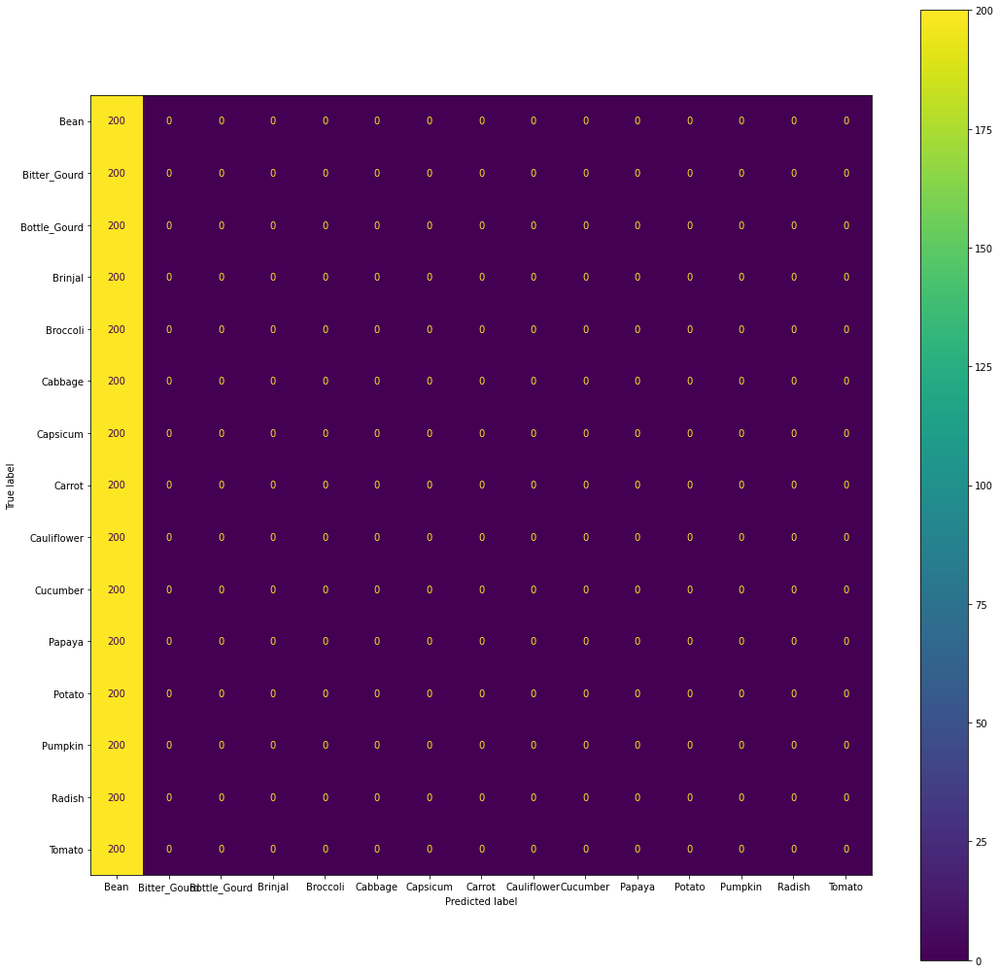

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


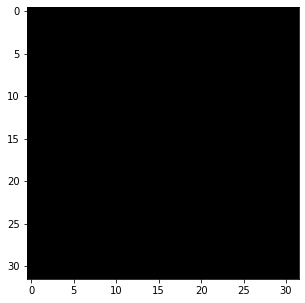

Bitter_Gourd


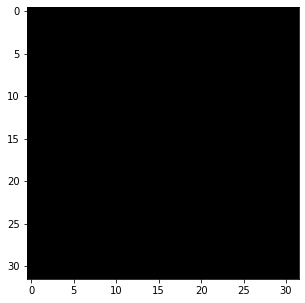

Bottle_Gourd


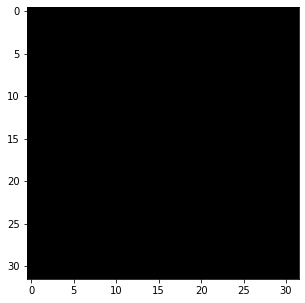

Brinjal


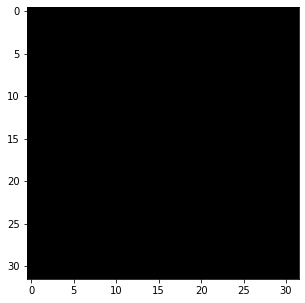

Broccoli


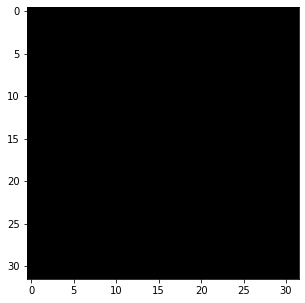

Cabbage


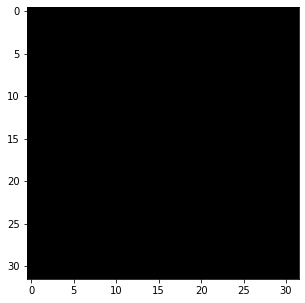

Capsicum


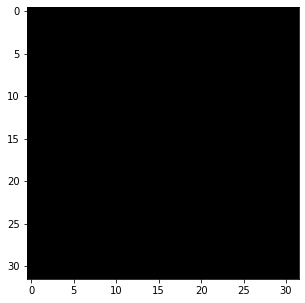

Carrot


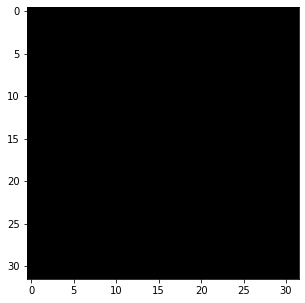

Cauliflower


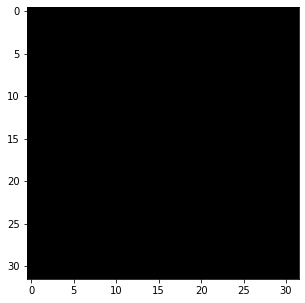

Cucumber


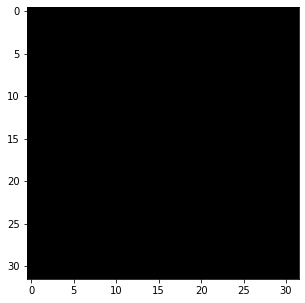

Papaya


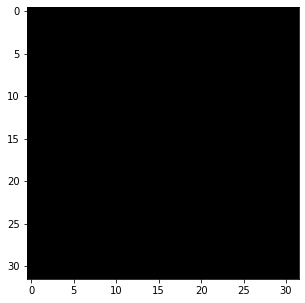

Potato


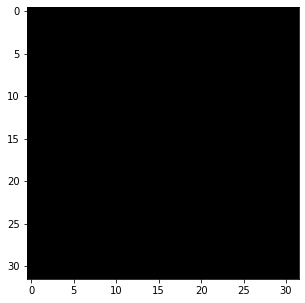

Pumpkin


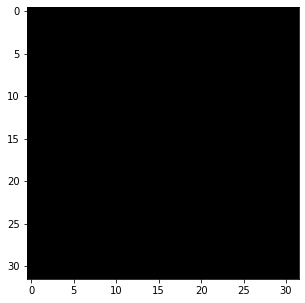

Radish


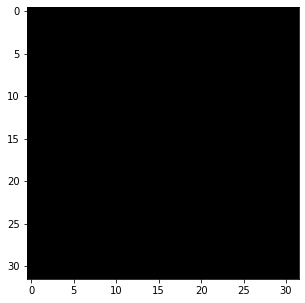

Tomato


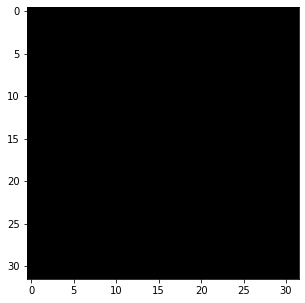

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.005, batch_size = 64, activ_func = ["tanh", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.6329938022633153, validation cost = 3.3447781752850756
Train Accuracy: 19.466666666666665 Validation Accuracy: 7.9
Epoch 2: training cost = 2.4010782755900637, validation cost = 3.327035306186323
Train Accuracy: 25.66 Validation Accuracy: 7.766666666666666
Epoch 3: training cost = 2.2756292716250313, validation cost = 3.332222408153042
Train Accuracy: 29.086666666666666 Validation Accuracy: 7.633333333333334
Epoch 4: training cost = 2.190855566694086, validation cost = 3.3441608148790034
Train Accuracy: 31.78666666666667 Validation Accuracy: 7.533333333333333
Epoch 5: training cost = 2.1257555299832793, validation cost = 3.3601629739721948
Train Accuracy: 33.733333333333334 Validation Accuracy: 7.766666666666666
Epoch 6: training cost = 2.072278637360081, validation cost = 3.378401266622073
Train Accuracy: 35.513333333333335 Validation Accuracy: 7.7
Epoch 7: training cost = 2.0261836274286096, validation cost = 3.3974872977959936
Train Accuracy: 36.9466666666

              precision    recall  f1-score   support

           0      0.443     0.330     0.378       200
           1      0.039     0.050     0.044       200
           2      0.029     0.025     0.027       200
           3      0.048     0.040     0.044       200
           4      0.303     0.115     0.167       200
           5      0.088     0.100     0.094       200
           6      0.046     0.055     0.050       200
           7      0.035     0.045     0.039       200
           8      0.053     0.065     0.059       200
           9      0.036     0.030     0.033       200
          10      0.073     0.105     0.086       200
          11      0.024     0.030     0.027       200
          12      0.005     0.005     0.005       200
          13      0.025     0.020     0.022       200
          14      0.079     0.065     0.071       200

    accuracy                          0.072      3000
   macro avg      0.088     0.072     0.076      3000
weighted avg      0.088   

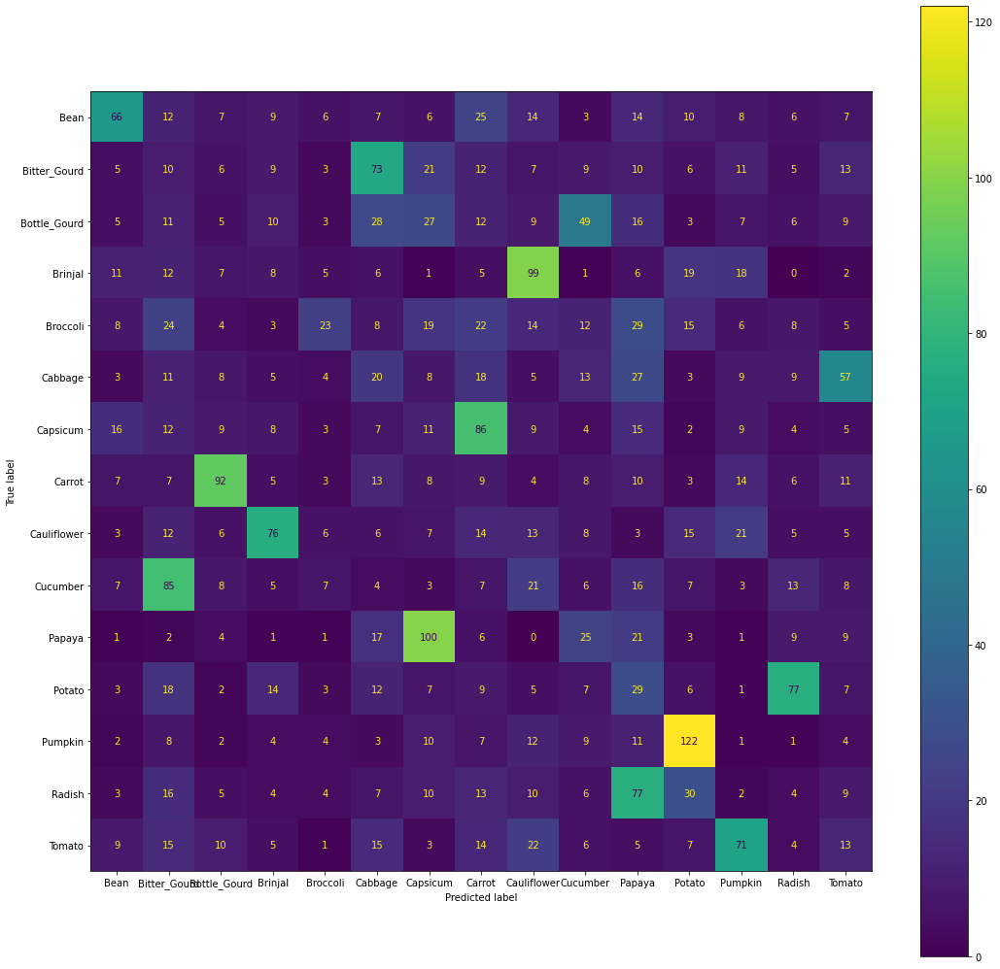

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


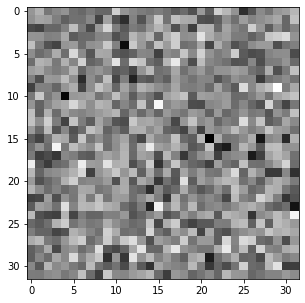

Bitter_Gourd


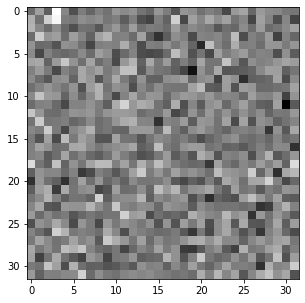

Bottle_Gourd


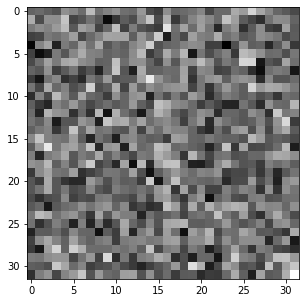

Brinjal


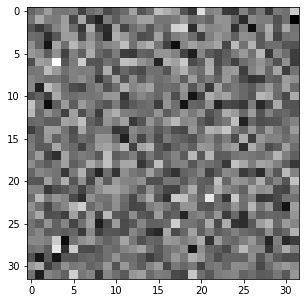

Broccoli


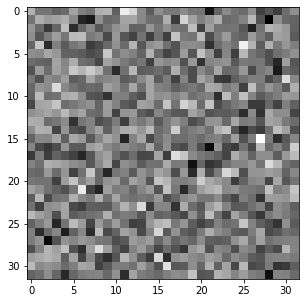

Cabbage


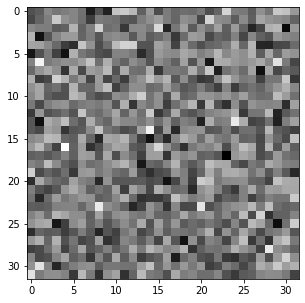

Capsicum


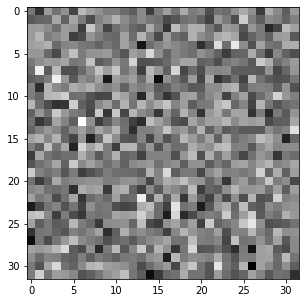

Carrot


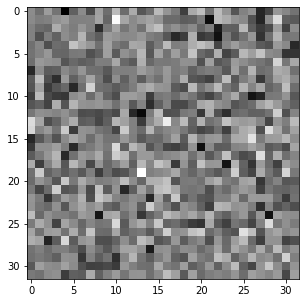

Cauliflower


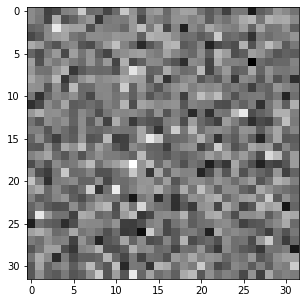

Cucumber


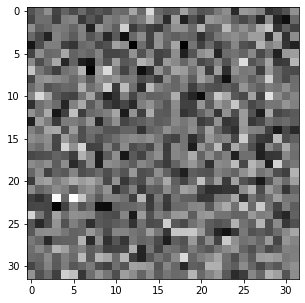

Papaya


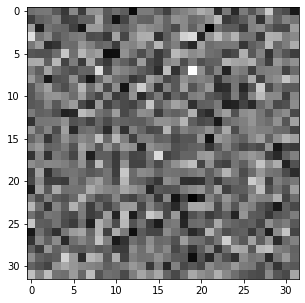

Potato


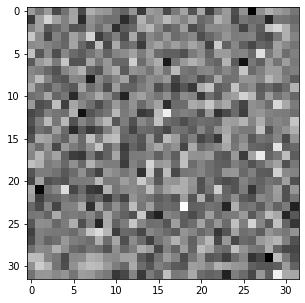

Pumpkin


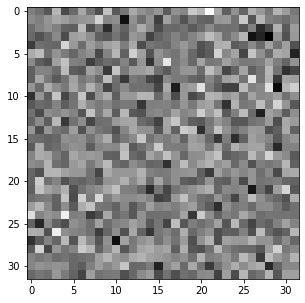

Radish


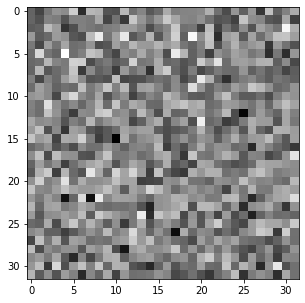

Tomato


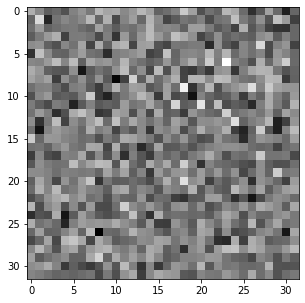

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.005, batch_size = 128, activ_func = ["sigmoid", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.6601459194007555, validation cost = 2.877095186792426
Train Accuracy: 13.113333333333333 Validation Accuracy: 6.466666666666667
Epoch 2: training cost = 2.556100029280004, validation cost = 2.8937735329763465
Train Accuracy: 17.14 Validation Accuracy: 6.5
Epoch 3: training cost = 2.4907897886341095, validation cost = 2.9128536943170427
Train Accuracy: 20.32 Validation Accuracy: 6.633333333333333
Epoch 4: training cost = 2.4451261557307418, validation cost = 2.9292392964335074
Train Accuracy: 22.8 Validation Accuracy: 6.7
Epoch 5: training cost = 2.4110466656131604, validation cost = 2.942112486891607
Train Accuracy: 24.526666666666667 Validation Accuracy: 6.9
Epoch 6: training cost = 2.384977952034572, validation cost = 2.95239556684045
Train Accuracy: 25.793333333333337 Validation Accuracy: 6.933333333333333
Epoch 7: training cost = 2.364684509721691, validation cost = 2.9607215619994838
Train Accuracy: 26.919999999999998 Validation Accuracy: 7.3
Epoch 8: tr

              precision    recall  f1-score   support

           0      0.356     0.290     0.320       200
           1      0.024     0.020     0.022       200
           2      0.034     0.025     0.029       200
           3      0.055     0.050     0.052       200
           4      0.169     0.075     0.104       200
           5      0.072     0.125     0.092       200
           6      0.039     0.055     0.046       200
           7      0.049     0.060     0.054       200
           8      0.024     0.020     0.022       200
           9      0.027     0.015     0.019       200
          10      0.101     0.115     0.108       200
          11      0.027     0.050     0.035       200
          12      0.031     0.030     0.030       200
          13      0.042     0.035     0.038       200
          14      0.093     0.065     0.076       200

    accuracy                          0.069      3000
   macro avg      0.076     0.069     0.070      3000
weighted avg      0.076   

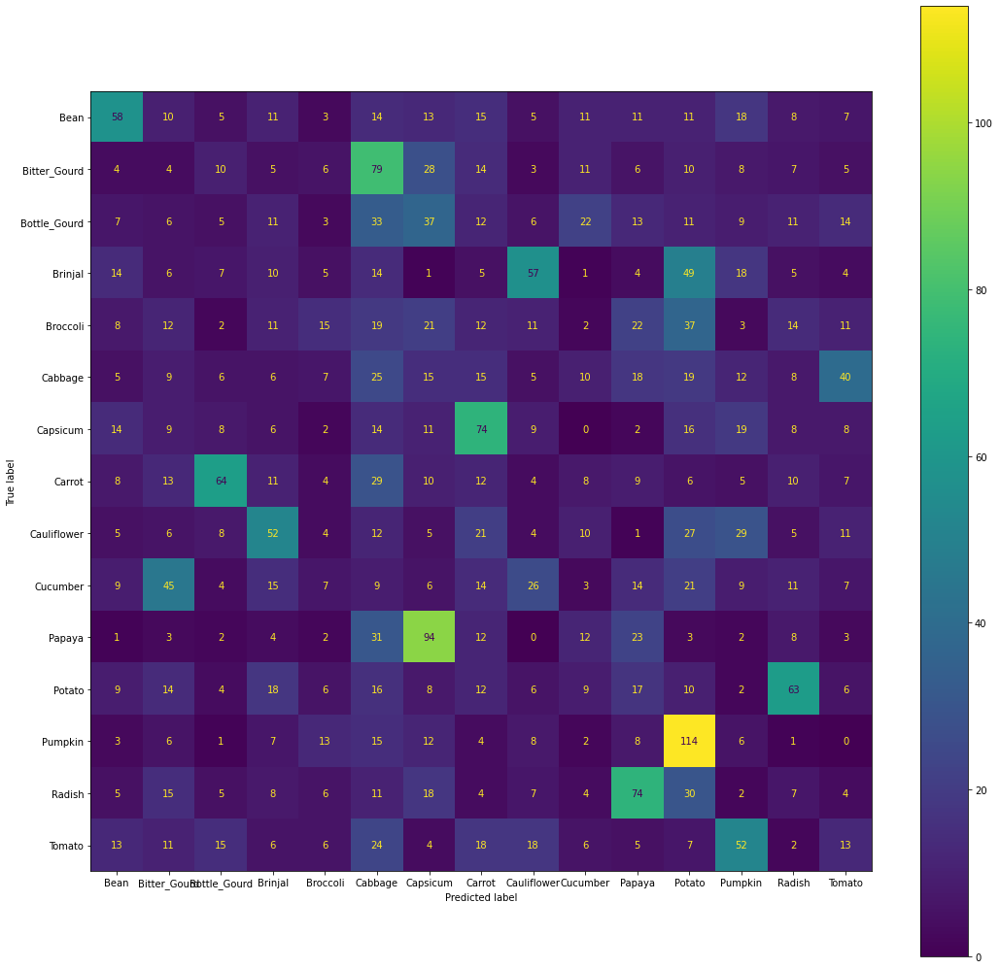

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


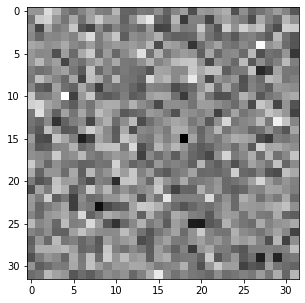

Bitter_Gourd


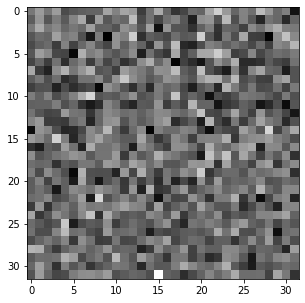

Bottle_Gourd


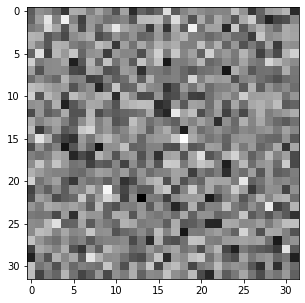

Brinjal


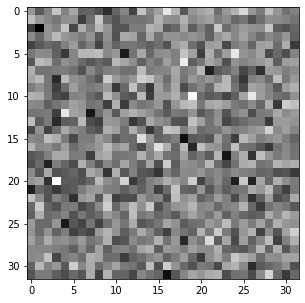

Broccoli


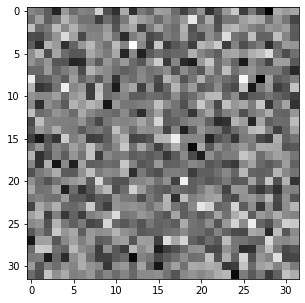

Cabbage


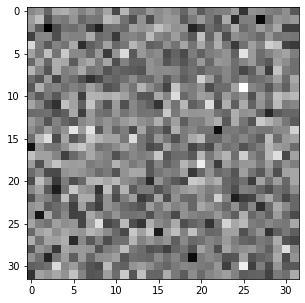

Capsicum


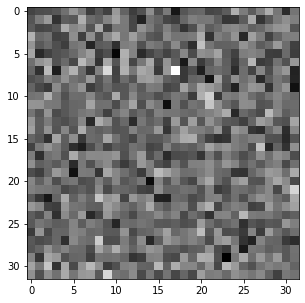

Carrot


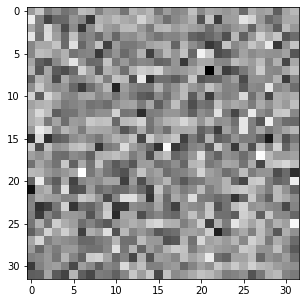

Cauliflower


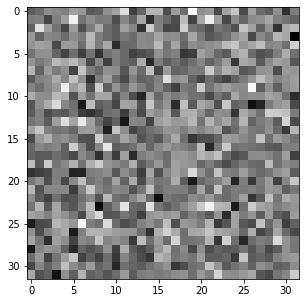

Cucumber


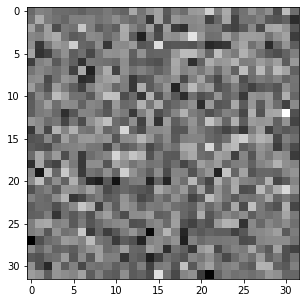

Papaya


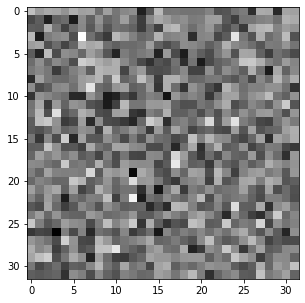

Potato


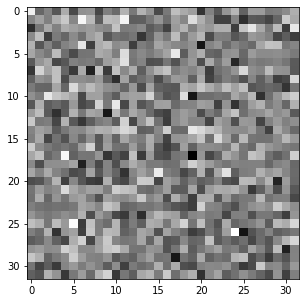

Pumpkin


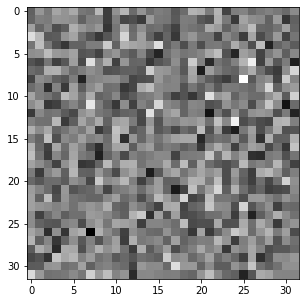

Radish


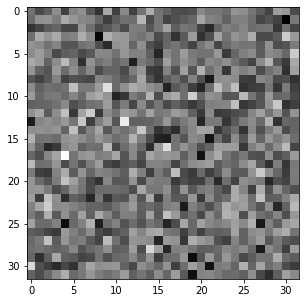

Tomato


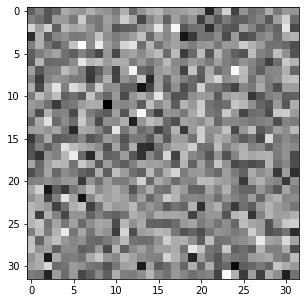

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.005, batch_size = 128, activ_func = ["relu", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 3.6313241384560158, validation cost = 4.639061933191579
Train Accuracy: 15.120000000000001 Validation Accuracy: 5.966666666666667
Epoch 2: training cost = 3.3877968459745937, validation cost = 4.604273351865033
Train Accuracy: 18.92 Validation Accuracy: 6.266666666666667
Epoch 3: training cost = 3.2806810707103913, validation cost = 4.609029525432875
Train Accuracy: 21.060000000000002 Validation Accuracy: 6.6000000000000005
Epoch 4: training cost = 3.268865076124559, validation cost = 4.685635938297779
Train Accuracy: 22.386666666666667 Validation Accuracy: 6.666666666666667
Epoch 5: training cost = 3.255041469009408, validation cost = 4.761063669861874
Train Accuracy: 21.46 Validation Accuracy: 6.9
Epoch 6: training cost = 3.5785646306944208, validation cost = 5.146715340191102
Train Accuracy: 23.080000000000002 Validation Accuracy: 7.1
Epoch 7: training cost = 3.82108372605513, validation cost = 5.495053845827931
Train Accuracy: 21.073333333333334 Validation 

              precision    recall  f1-score   support

           0      0.067     1.000     0.125       200
           1      0.000     0.000     0.000       200
           2      0.000     0.000     0.000       200
           3      0.000     0.000     0.000       200
           4      0.000     0.000     0.000       200
           5      0.000     0.000     0.000       200
           6      0.000     0.000     0.000       200
           7      0.000     0.000     0.000       200
           8      0.000     0.000     0.000       200
           9      0.000     0.000     0.000       200
          10      0.000     0.000     0.000       200
          11      0.000     0.000     0.000       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.000     0.000     0.000       200

    accuracy                          0.067      3000
   macro avg      0.004     0.067     0.008      3000
weighted avg      0.004   

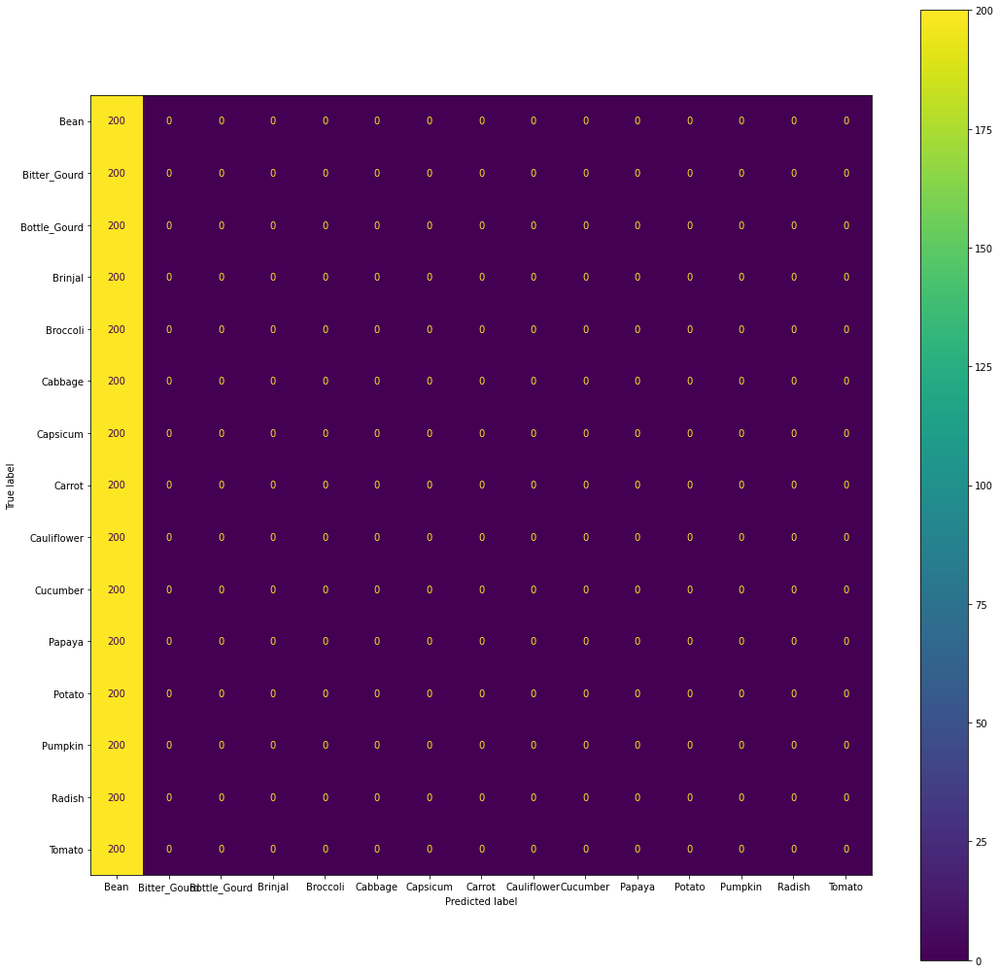

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


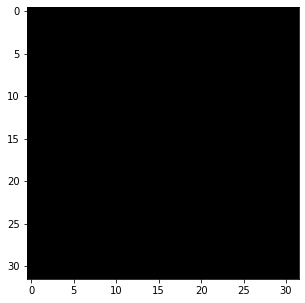

Bitter_Gourd


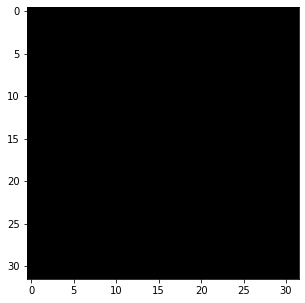

Bottle_Gourd


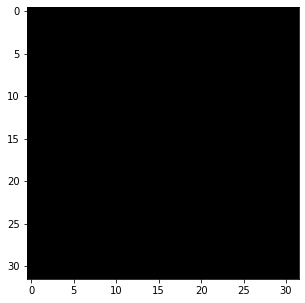

Brinjal


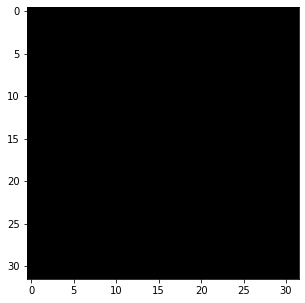

Broccoli


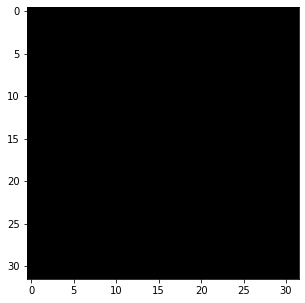

Cabbage


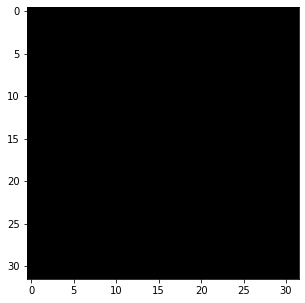

Capsicum


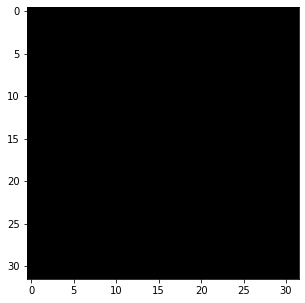

Carrot


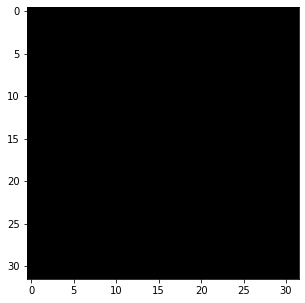

Cauliflower


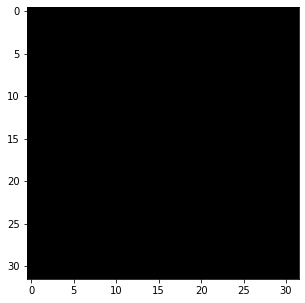

Cucumber


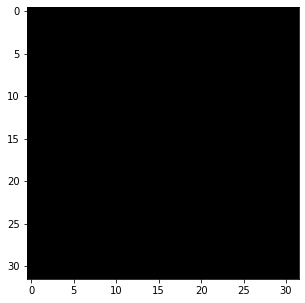

Papaya


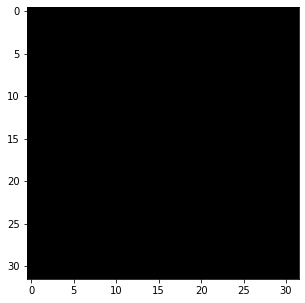

Potato


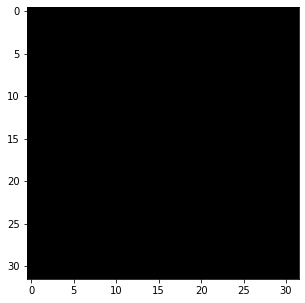

Pumpkin


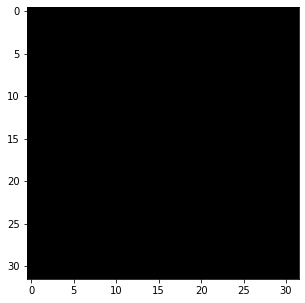

Radish


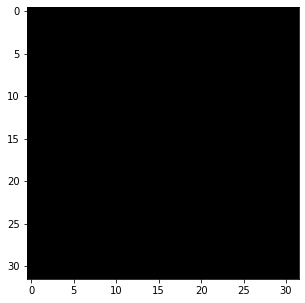

Tomato


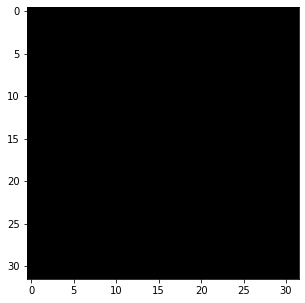

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.005, batch_size = 128, activ_func = ["tanh", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.82559287612246, validation cost = 3.3429520879899095
Train Accuracy: 14.82 Validation Accuracy: 6.766666666666667
Epoch 2: training cost = 2.603134544381243, validation cost = 3.339315623331804
Train Accuracy: 19.46 Validation Accuracy: 7.066666666666667
Epoch 3: training cost = 2.473895909183149, validation cost = 3.3369429577591494
Train Accuracy: 22.7 Validation Accuracy: 7.6
Epoch 4: training cost = 2.3859881005786243, validation cost = 3.3373372438544036
Train Accuracy: 25.21333333333333 Validation Accuracy: 7.833333333333334
Epoch 5: training cost = 2.3206019152848496, validation cost = 3.3393968555107767
Train Accuracy: 27.286666666666665 Validation Accuracy: 7.933333333333334
Epoch 6: training cost = 2.268732409180428, validation cost = 3.3435538771365803
Train Accuracy: 28.96 Validation Accuracy: 7.933333333333334
Epoch 7: training cost = 2.225542729028405, validation cost = 3.349587174116911
Train Accuracy: 30.35333333333333 Validation Accuracy: 7.8

              precision    recall  f1-score   support

           0      0.367     0.275     0.314       200
           1      0.028     0.030     0.029       200
           2      0.037     0.035     0.036       200
           3      0.047     0.035     0.040       200
           4      0.319     0.215     0.257       200
           5      0.078     0.095     0.086       200
           6      0.049     0.070     0.057       200
           7      0.053     0.065     0.058       200
           8      0.021     0.020     0.020       200
           9      0.057     0.040     0.047       200
          10      0.075     0.095     0.084       200
          11      0.018     0.025     0.021       200
          12      0.015     0.015     0.015       200
          13      0.024     0.020     0.022       200
          14      0.050     0.040     0.044       200

    accuracy                          0.072      3000
   macro avg      0.082     0.072     0.075      3000
weighted avg      0.082   

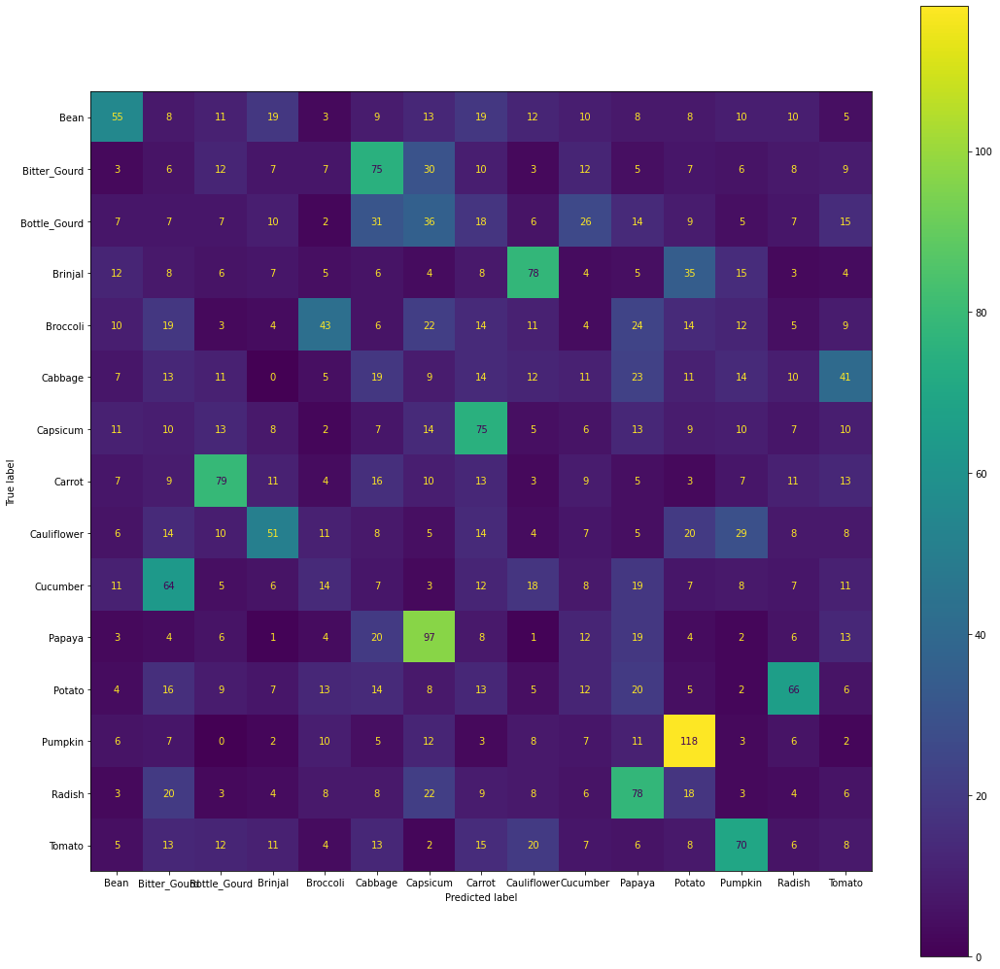

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


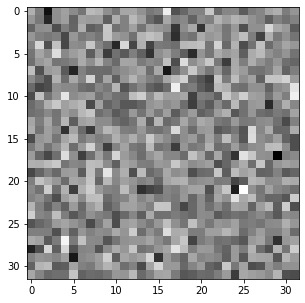

Bitter_Gourd


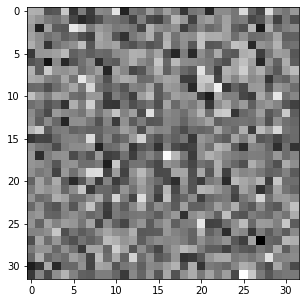

Bottle_Gourd


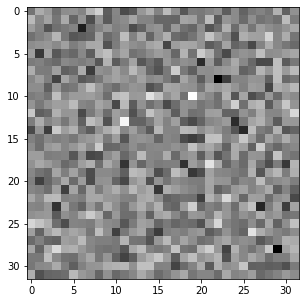

Brinjal


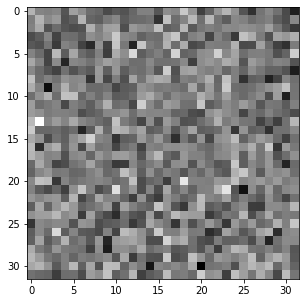

Broccoli


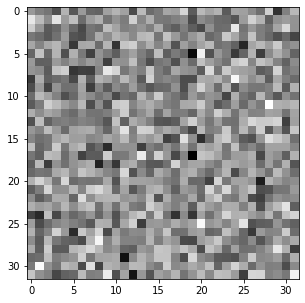

Cabbage


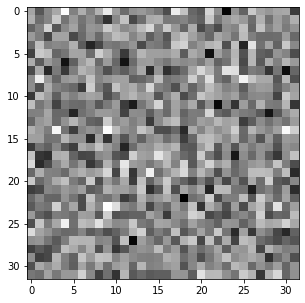

Capsicum


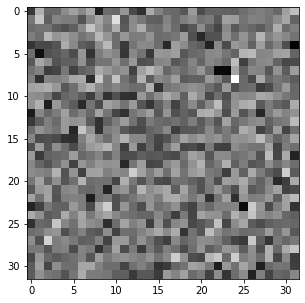

Carrot


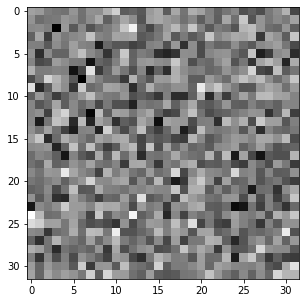

Cauliflower


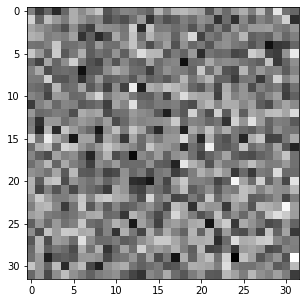

Cucumber


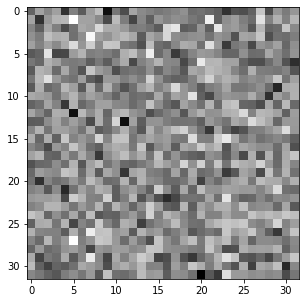

Papaya


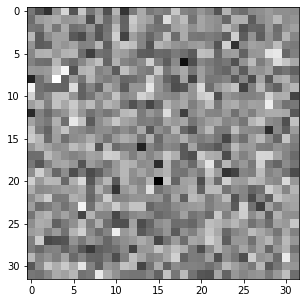

Potato


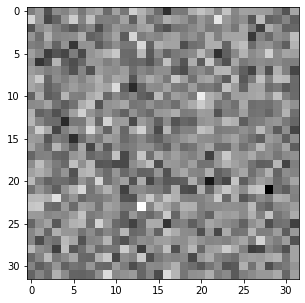

Pumpkin


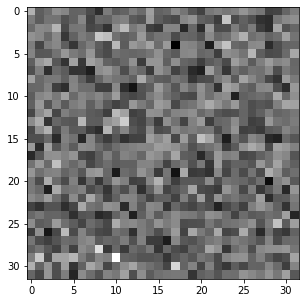

Radish


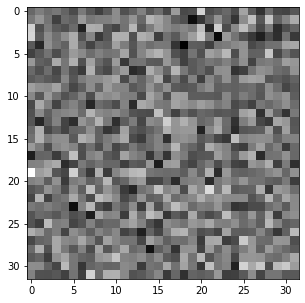

Tomato


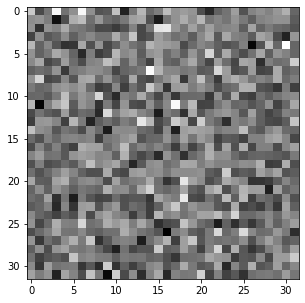

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.01, batch_size = 16, activ_func = ["sigmoid", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.3350824382168165, validation cost = 3.083630636575321
Train Accuracy: 25.806666666666665 Validation Accuracy: 7.366666666666667
Epoch 2: training cost = 2.229417012485091, validation cost = 3.151962219652087
Train Accuracy: 30.12 Validation Accuracy: 7.9
Epoch 3: training cost = 2.151257863817758, validation cost = 3.1981930390745616
Train Accuracy: 33.2 Validation Accuracy: 8.366666666666667
Epoch 4: training cost = 2.0852494513734774, validation cost = 3.240618393187804
Train Accuracy: 35.373333333333335 Validation Accuracy: 8.233333333333333
Epoch 5: training cost = 2.0244734191110187, validation cost = 3.2775228794170785
Train Accuracy: 37.52666666666667 Validation Accuracy: 7.9
Epoch 6: training cost = 1.9715099446285387, validation cost = 3.314264734634145
Train Accuracy: 39.04666666666667 Validation Accuracy: 7.933333333333334
Epoch 7: training cost = 1.9217429170058276, validation cost = 3.3462727697836536
Train Accuracy: 40.86666666666667 Validation 

              precision    recall  f1-score   support

           0      0.564     0.465     0.510       200
           1      0.023     0.025     0.024       200
           2      0.036     0.050     0.042       200
           3      0.022     0.015     0.018       200
           4      0.652     0.215     0.323       200
           5      0.049     0.070     0.058       200
           6      0.051     0.100     0.067       200
           7      0.020     0.015     0.017       200
           8      0.033     0.035     0.034       200
           9      0.017     0.005     0.008       200
          10      0.088     0.065     0.075       200
          11      0.029     0.065     0.040       200
          12      0.000     0.000     0.000       200
          13      0.015     0.015     0.015       200
          14      0.061     0.035     0.044       200

    accuracy                          0.078      3000
   macro avg      0.111     0.078     0.085      3000
weighted avg      0.111   

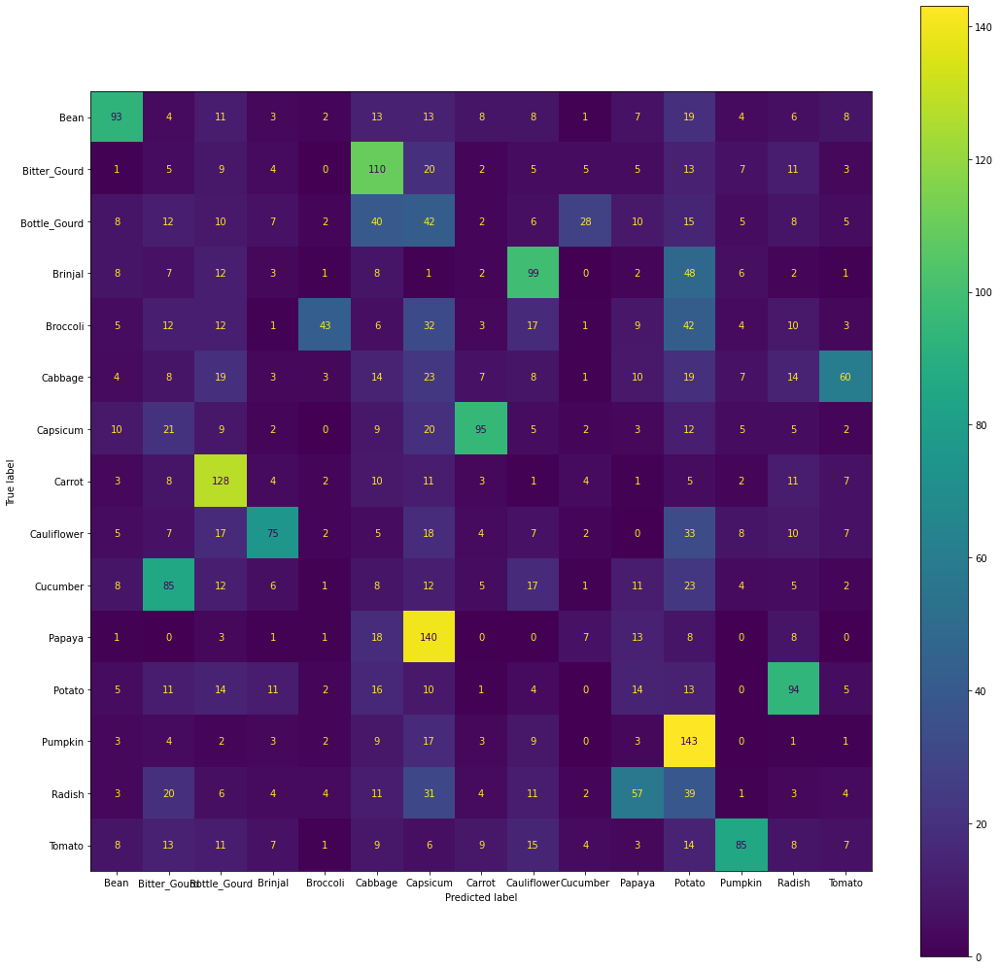

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


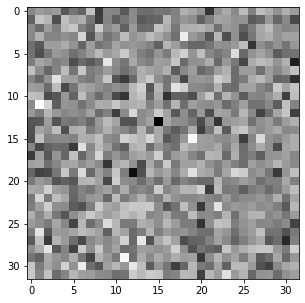

Bitter_Gourd


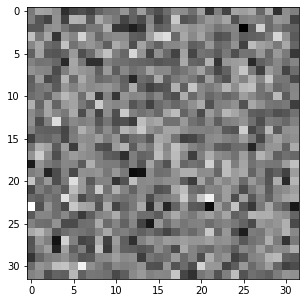

Bottle_Gourd


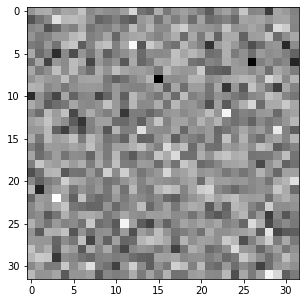

Brinjal


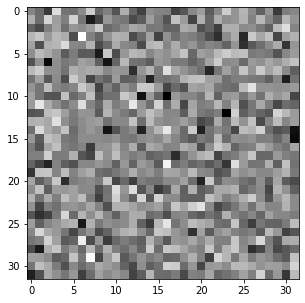

Broccoli


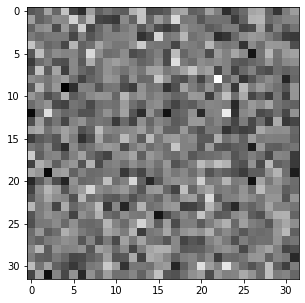

Cabbage


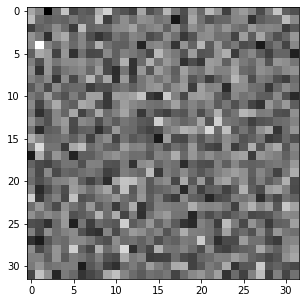

Capsicum


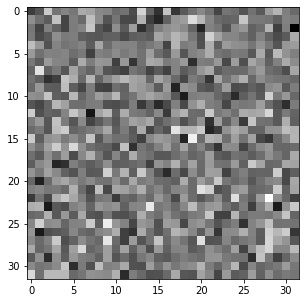

Carrot


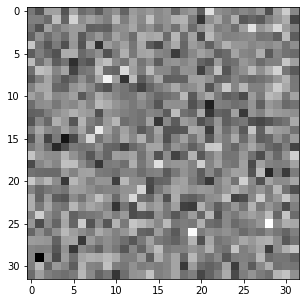

Cauliflower


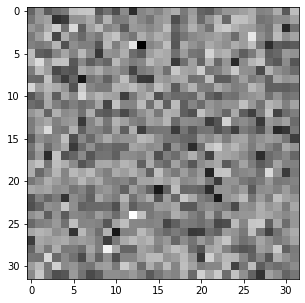

Cucumber


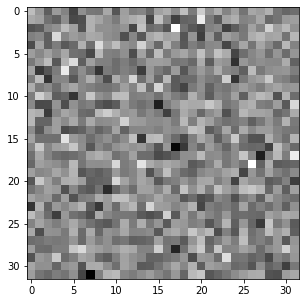

Papaya


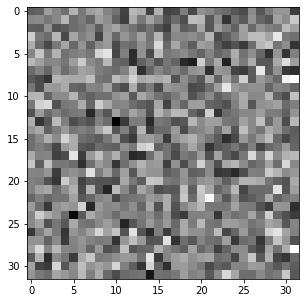

Potato


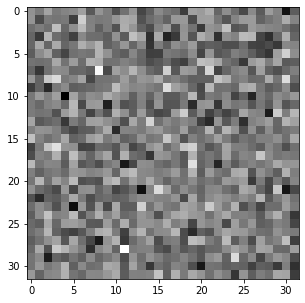

Pumpkin


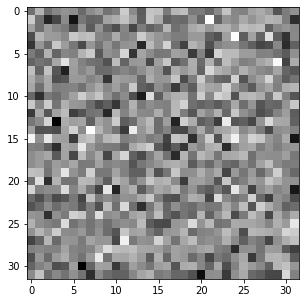

Radish


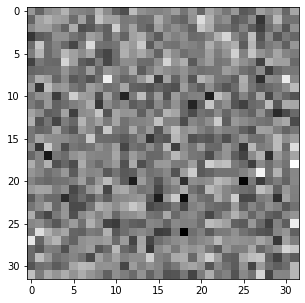

Tomato


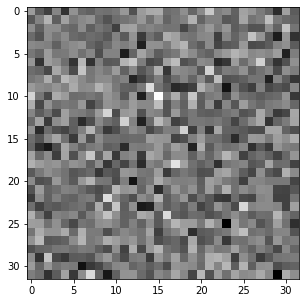

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.01, batch_size = 16, activ_func = ["relu", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

<ipython-input-7-e72be07ccec5>:125: RuntimeWarning: overflow encountered in exp
  expZ = np.exp(self.z)
<ipython-input-7-e72be07ccec5>:126: RuntimeWarning: invalid value encountered in true_divide
  return expZ/(np.sum(expZ, 0))


Epoch 1: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 2: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 3: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 4: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 5: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 6: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 7: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 8: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0      0.067     1.000     0.125       200
           1      0.000     0.000     0.000       200
           2      0.000     0.000     0.000       200
           3      0.000     0.000     0.000       200
           4      0.000     0.000     0.000       200
           5      0.000     0.000     0.000       200
           6      0.000     0.000     0.000       200
           7      0.000     0.000     0.000       200
           8      0.000     0.000     0.000       200
           9      0.000     0.000     0.000       200
          10      0.000     0.000     0.000       200
          11      0.000     0.000     0.000       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.000     0.000     0.000       200

    accuracy                          0.067      3000
   macro avg      0.004     0.067     0.008      3000
weighted avg      0.004   

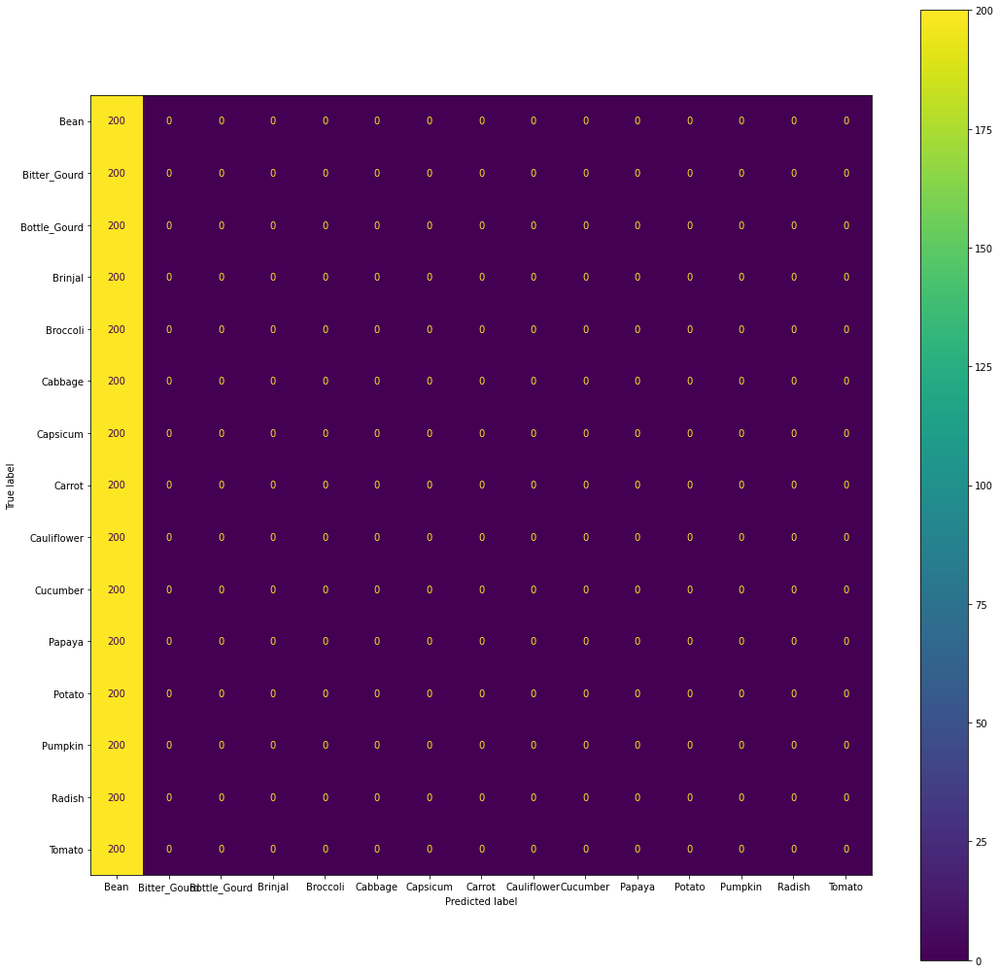

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


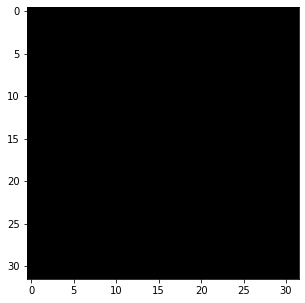

Bitter_Gourd


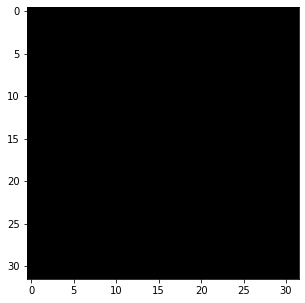

Bottle_Gourd


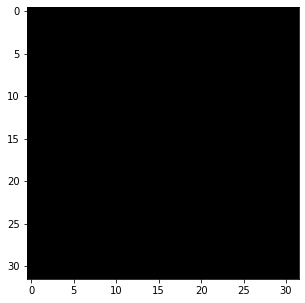

Brinjal


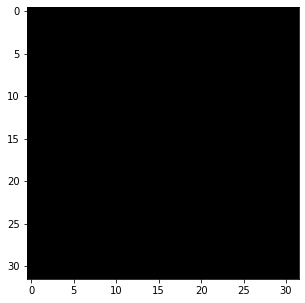

Broccoli


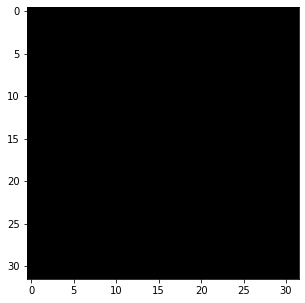

Cabbage


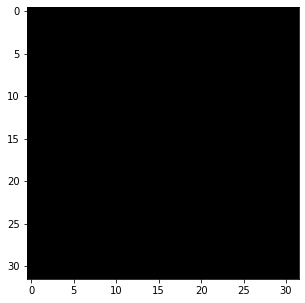

Capsicum


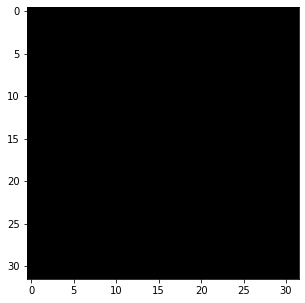

Carrot


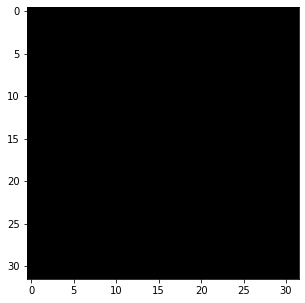

Cauliflower


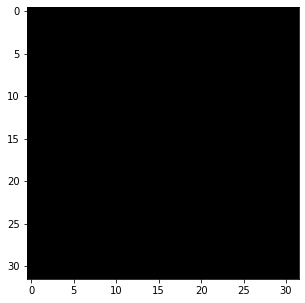

Cucumber


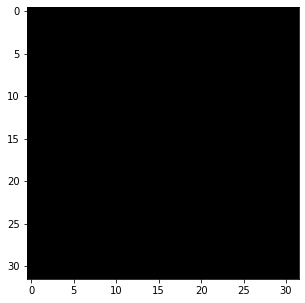

Papaya


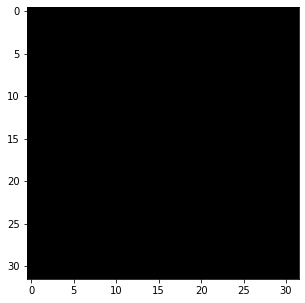

Potato


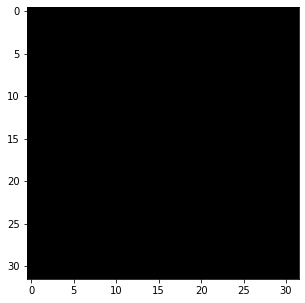

Pumpkin


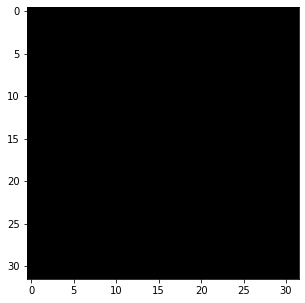

Radish


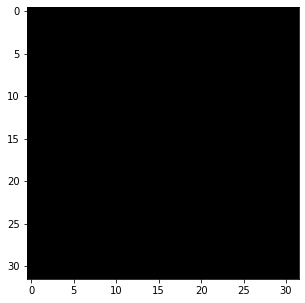

Tomato


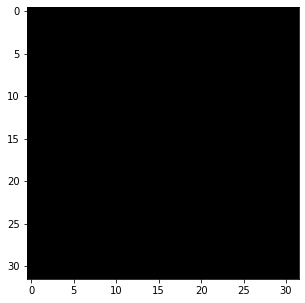

In [ ]:
model.visualize_weights(32)

In [8]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.01, batch_size = 16, activ_func = ["tanh", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.169203059532322, validation cost = 3.3761665899167226
Train Accuracy: 31.36 Validation Accuracy: 7.366666666666667
Epoch 2: training cost = 1.9521057714443757, validation cost = 3.503941724647815
Train Accuracy: 38.36666666666667 Validation Accuracy: 7.6
Epoch 3: training cost = 1.7959581713601902, validation cost = 3.6157719488863616
Train Accuracy: 43.74 Validation Accuracy: 7.6
Epoch 4: training cost = 1.671744347762743, validation cost = 3.720530173942713
Train Accuracy: 47.699999999999996 Validation Accuracy: 8.133333333333333
Epoch 5: training cost = 1.5657152065582787, validation cost = 3.8183372343027058
Train Accuracy: 51.27333333333334 Validation Accuracy: 8.666666666666668
Epoch 6: training cost = 1.4717486547099785, validation cost = 3.910826048907535
Train Accuracy: 54.300000000000004 Validation Accuracy: 8.5
Epoch 7: training cost = 1.3863672685420836, validation cost = 3.9991144595400034
Train Accuracy: 57.446666666666665 Validation Accuracy: 8

              precision    recall  f1-score   support

           0      0.641     0.500     0.562       200
           1      0.016     0.020     0.018       200
           2      0.019     0.020     0.019       200
           3      0.008     0.005     0.006       200
           4      0.495     0.450     0.471       200
           5      0.039     0.040     0.039       200
           6      0.040     0.085     0.054       200
           7      0.007     0.005     0.006       200
           8      0.079     0.115     0.094       200
           9      0.043     0.025     0.032       200
          10      0.014     0.005     0.007       200
          11      0.019     0.030     0.023       200
          12      0.000     0.000     0.000       200
          13      0.065     0.075     0.069       200
          14      0.014     0.010     0.012       200

    accuracy                          0.092      3000
   macro avg      0.100     0.092     0.094      3000
weighted avg      0.100   

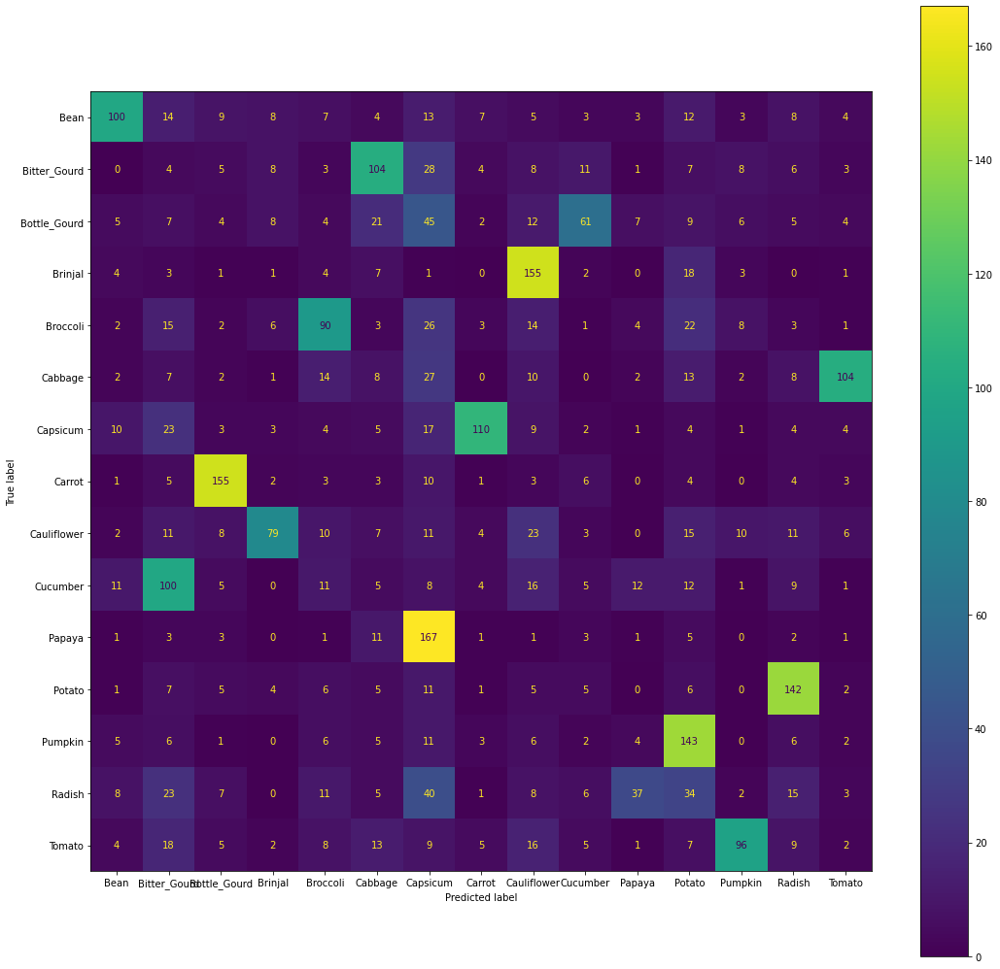

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


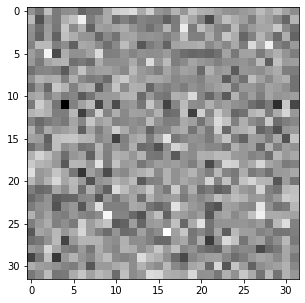

Bitter_Gourd


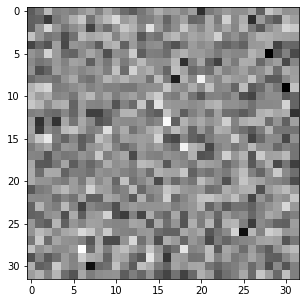

Bottle_Gourd


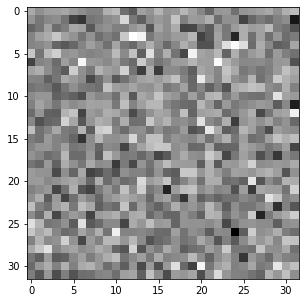

Brinjal


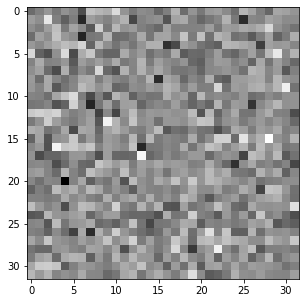

Broccoli


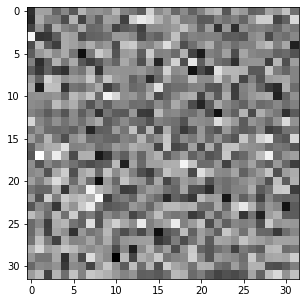

Cabbage


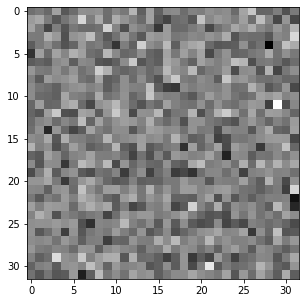

Capsicum


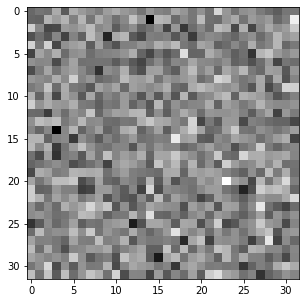

Carrot


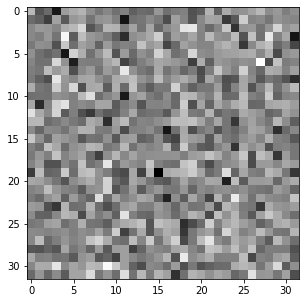

Cauliflower


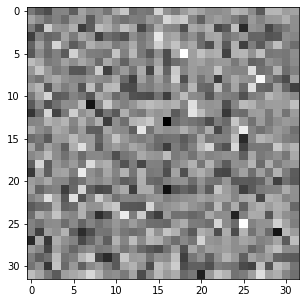

Cucumber


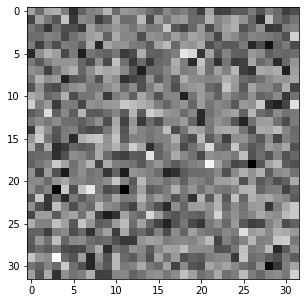

Papaya


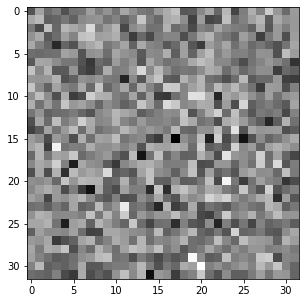

Potato


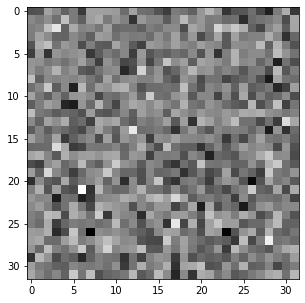

Pumpkin


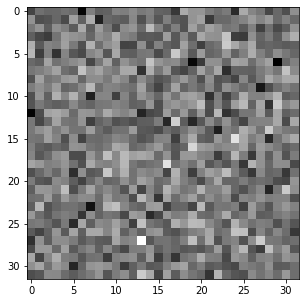

Radish


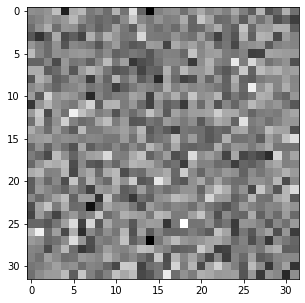

Tomato


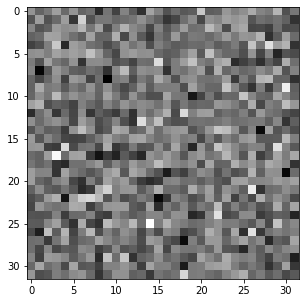

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.01, batch_size = 32, activ_func = ["sigmoid", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.3695141769377117, validation cost = 3.029809360099287
Train Accuracy: 24.933333333333334 Validation Accuracy: 8.133333333333333
Epoch 2: training cost = 2.282483046004103, validation cost = 3.0618162512483917
Train Accuracy: 29.213333333333335 Validation Accuracy: 7.5
Epoch 3: training cost = 2.230738699287752, validation cost = 3.08630654721018
Train Accuracy: 31.533333333333335 Validation Accuracy: 7.766666666666666
Epoch 4: training cost = 2.1844118597394617, validation cost = 3.1152016350225686
Train Accuracy: 33.34666666666667 Validation Accuracy: 7.9
Epoch 5: training cost = 2.1444461634849055, validation cost = 3.1418121916782953
Train Accuracy: 34.846666666666664 Validation Accuracy: 8.0
Epoch 6: training cost = 2.1093018910686396, validation cost = 3.167832900222023
Train Accuracy: 36.120000000000005 Validation Accuracy: 8.066666666666666
Epoch 7: training cost = 2.076413884972778, validation cost = 3.1929469011845466
Train Accuracy: 37.1133333333333

              precision    recall  f1-score   support

           0      0.580     0.290     0.387       200
           1      0.022     0.030     0.025       200
           2      0.034     0.040     0.037       200
           3      0.050     0.065     0.056       200
           4      0.500     0.100     0.167       200
           5      0.050     0.060     0.054       200
           6      0.048     0.060     0.054       200
           7      0.032     0.040     0.036       200
           8      0.036     0.050     0.042       200
           9      0.040     0.035     0.038       200
          10      0.083     0.110     0.095       200
          11      0.017     0.020     0.019       200
          12      0.000     0.000     0.000       200
          13      0.019     0.010     0.013       200
          14      0.077     0.045     0.057       200

    accuracy                          0.064      3000
   macro avg      0.106     0.064     0.072      3000
weighted avg      0.106   

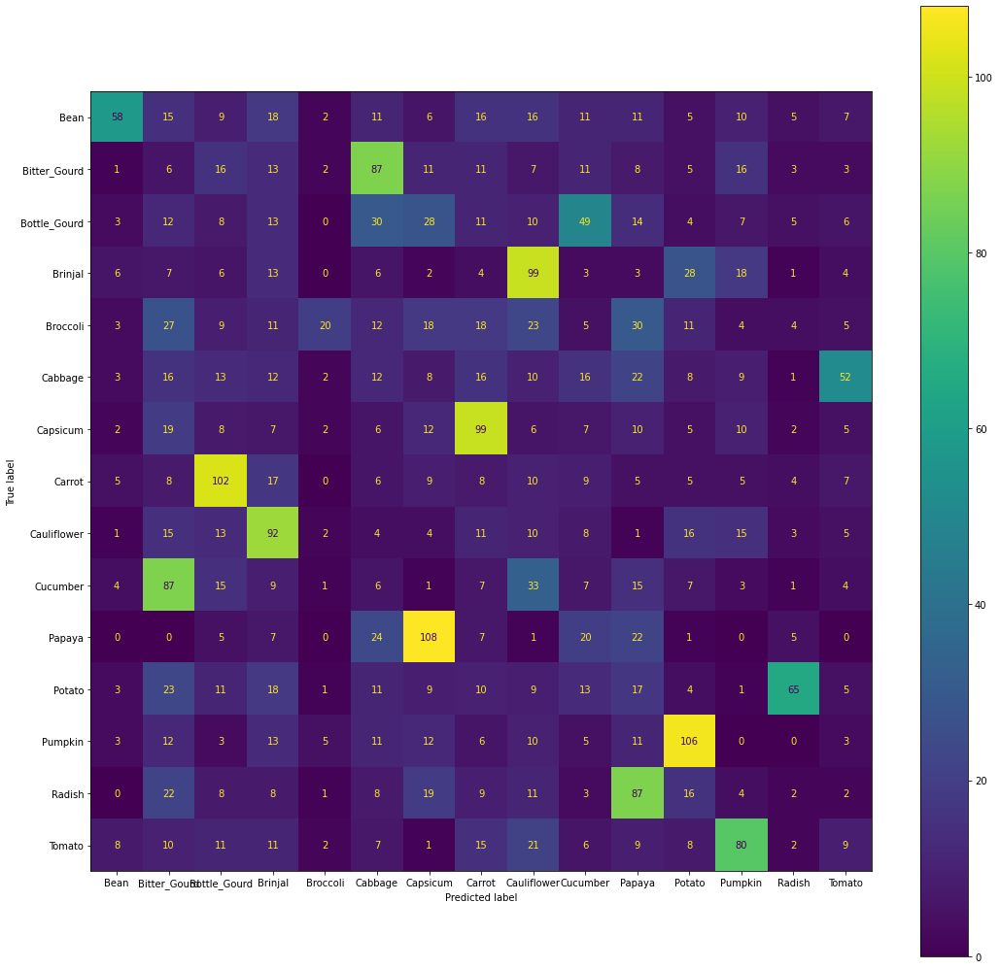

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


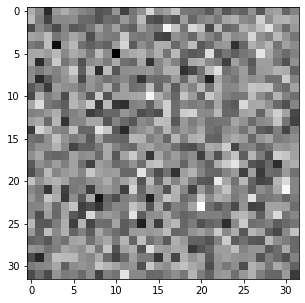

Bitter_Gourd


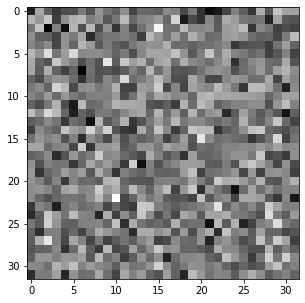

Bottle_Gourd


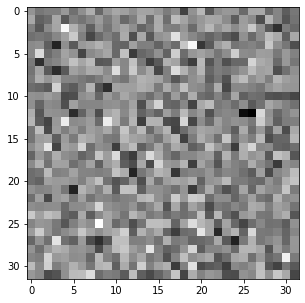

Brinjal


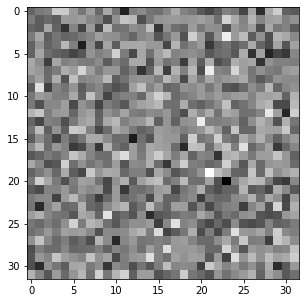

Broccoli


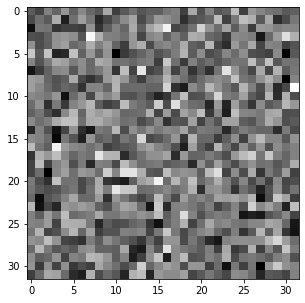

Cabbage


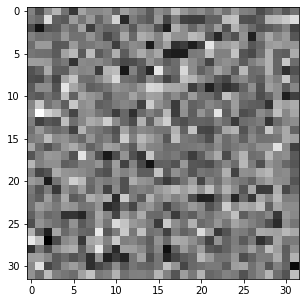

Capsicum


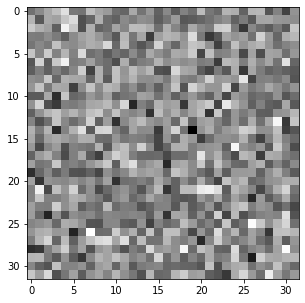

Carrot


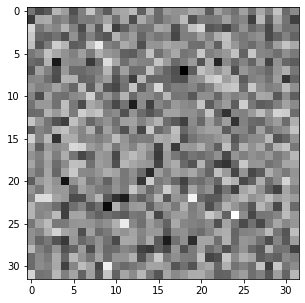

Cauliflower


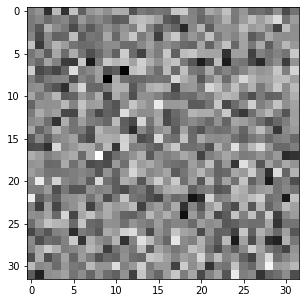

Cucumber


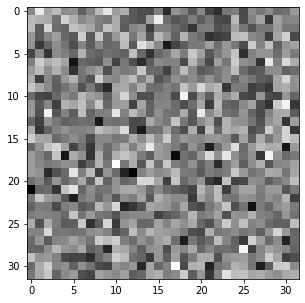

Papaya


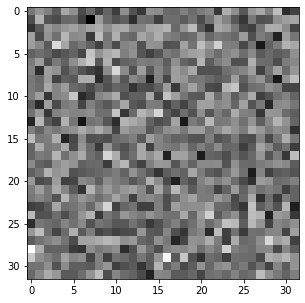

Potato


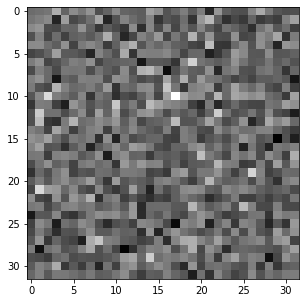

Pumpkin


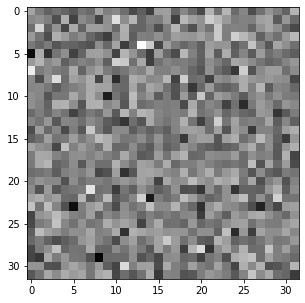

Radish


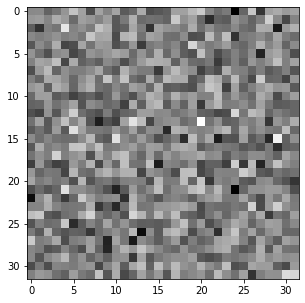

Tomato


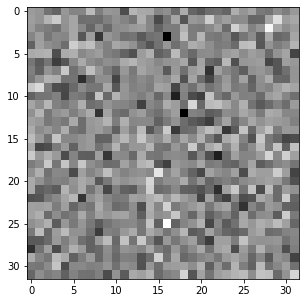

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.01, batch_size = 32, activ_func = ["relu", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 2: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 3: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 4: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 5: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 6: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 7: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 8: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667


              precision    recall  f1-score   support

           0      0.067     1.000     0.125       200
           1      0.000     0.000     0.000       200
           2      0.000     0.000     0.000       200
           3      0.000     0.000     0.000       200
           4      0.000     0.000     0.000       200
           5      0.000     0.000     0.000       200
           6      0.000     0.000     0.000       200
           7      0.000     0.000     0.000       200
           8      0.000     0.000     0.000       200
           9      0.000     0.000     0.000       200
          10      0.000     0.000     0.000       200
          11      0.000     0.000     0.000       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.000     0.000     0.000       200

    accuracy                          0.067      3000
   macro avg      0.004     0.067     0.008      3000
weighted avg      0.004   

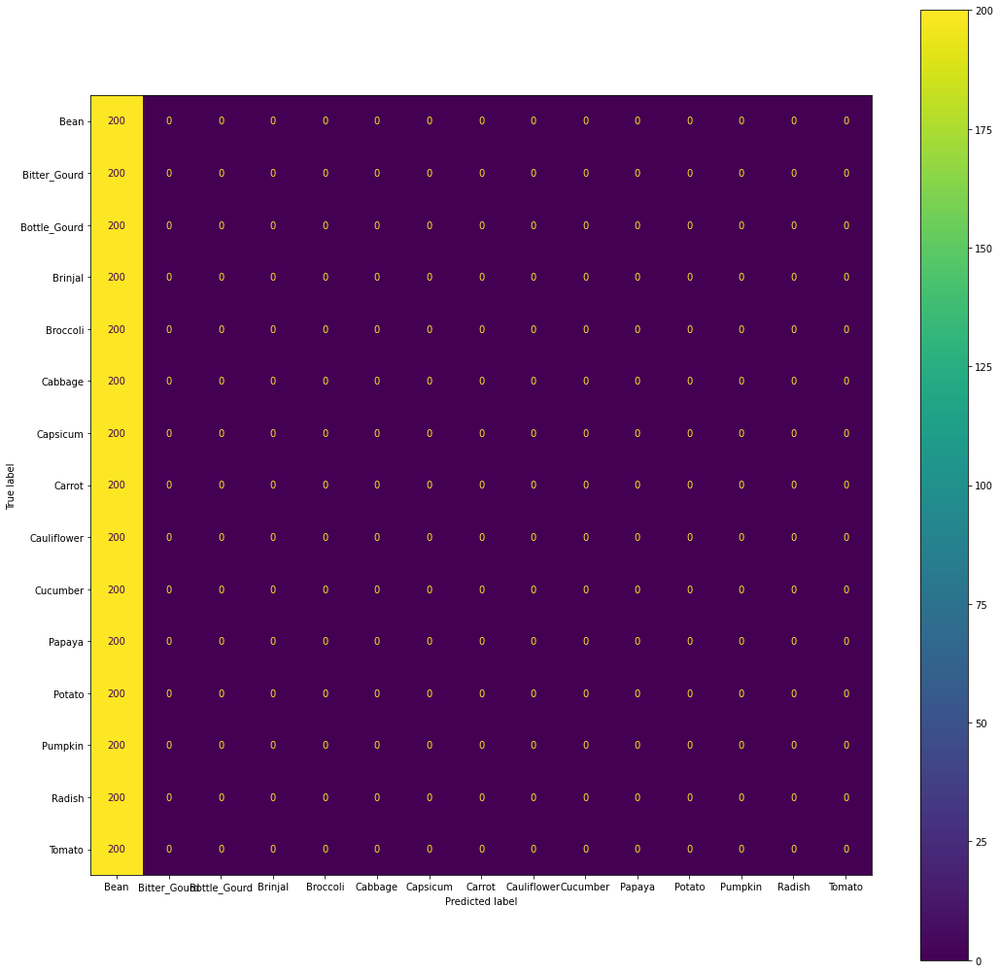

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


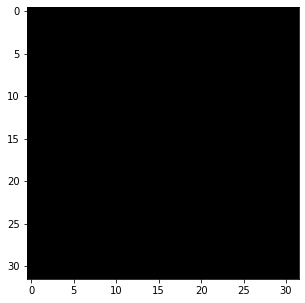

Bitter_Gourd


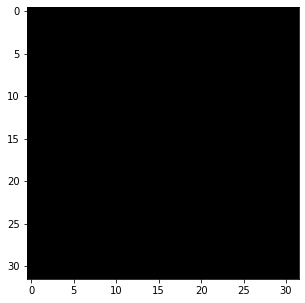

Bottle_Gourd


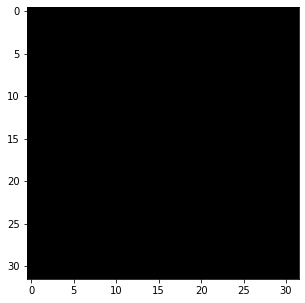

Brinjal


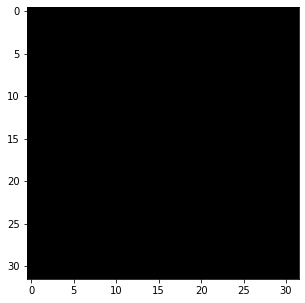

Broccoli


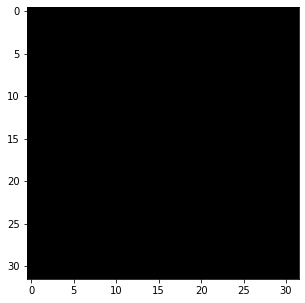

Cabbage


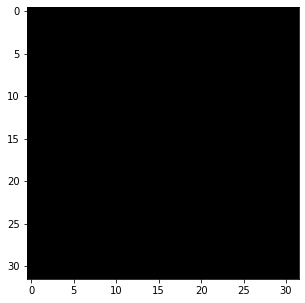

Capsicum


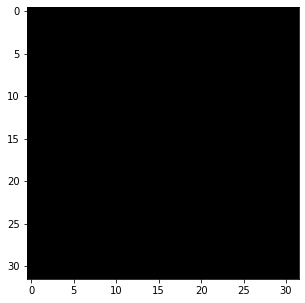

Carrot


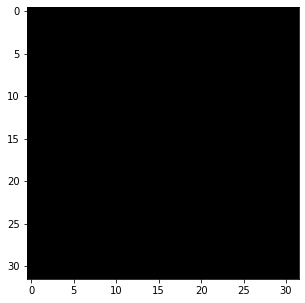

Cauliflower


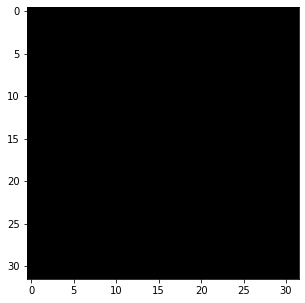

Cucumber


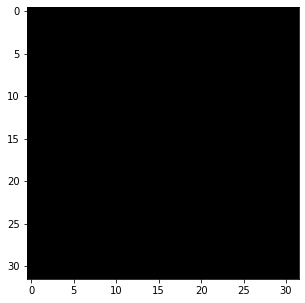

Papaya


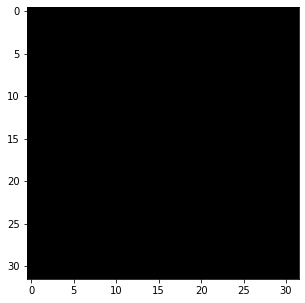

Potato


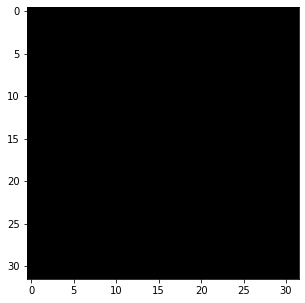

Pumpkin


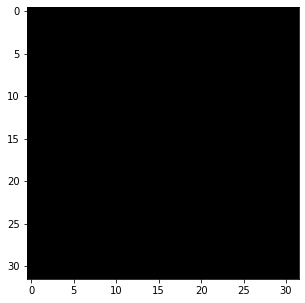

Radish


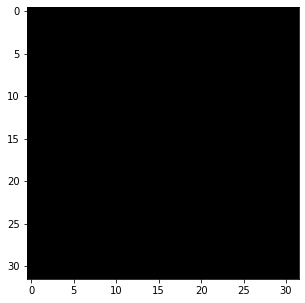

Tomato


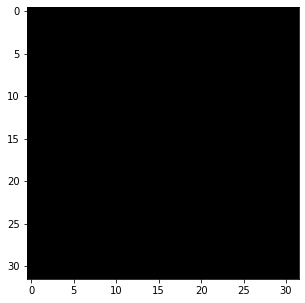

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.01, batch_size = 32, activ_func = ["tanh", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.2819714246464207, validation cost = 3.4704486659618765
Train Accuracy: 28.346666666666664 Validation Accuracy: 7.933333333333334
Epoch 2: training cost = 2.095602530962826, validation cost = 3.520875269733583
Train Accuracy: 34.10666666666667 Validation Accuracy: 8.3
Epoch 3: training cost = 1.9703336932679465, validation cost = 3.5910117142944156
Train Accuracy: 38.086666666666666 Validation Accuracy: 8.5
Epoch 4: training cost = 1.8683515202444043, validation cost = 3.654967476763765
Train Accuracy: 41.513333333333335 Validation Accuracy: 8.5
Epoch 5: training cost = 1.7813520676135364, validation cost = 3.7129186398513214
Train Accuracy: 44.49333333333333 Validation Accuracy: 8.633333333333333
Epoch 6: training cost = 1.7042010700078225, validation cost = 3.767426337551126
Train Accuracy: 47.06 Validation Accuracy: 8.833333333333334
Epoch 7: training cost = 1.6343255713286278, validation cost = 3.8197594975728935
Train Accuracy: 49.39333333333333 Validatio

              precision    recall  f1-score   support

           0      0.731     0.395     0.513       200
           1      0.032     0.060     0.042       200
           2      0.028     0.045     0.034       200
           3      0.041     0.050     0.045       200
           4      0.479     0.290     0.361       200
           5      0.041     0.040     0.040       200
           6      0.026     0.030     0.028       200
           7      0.006     0.005     0.005       200
           8      0.057     0.075     0.065       200
           9      0.011     0.010     0.011       200
          10      0.088     0.055     0.068       200
          11      0.012     0.015     0.013       200
          12      0.006     0.005     0.005       200
          13      0.018     0.010     0.013       200
          14      0.037     0.025     0.030       200

    accuracy                          0.074      3000
   macro avg      0.108     0.074     0.085      3000
weighted avg      0.108   

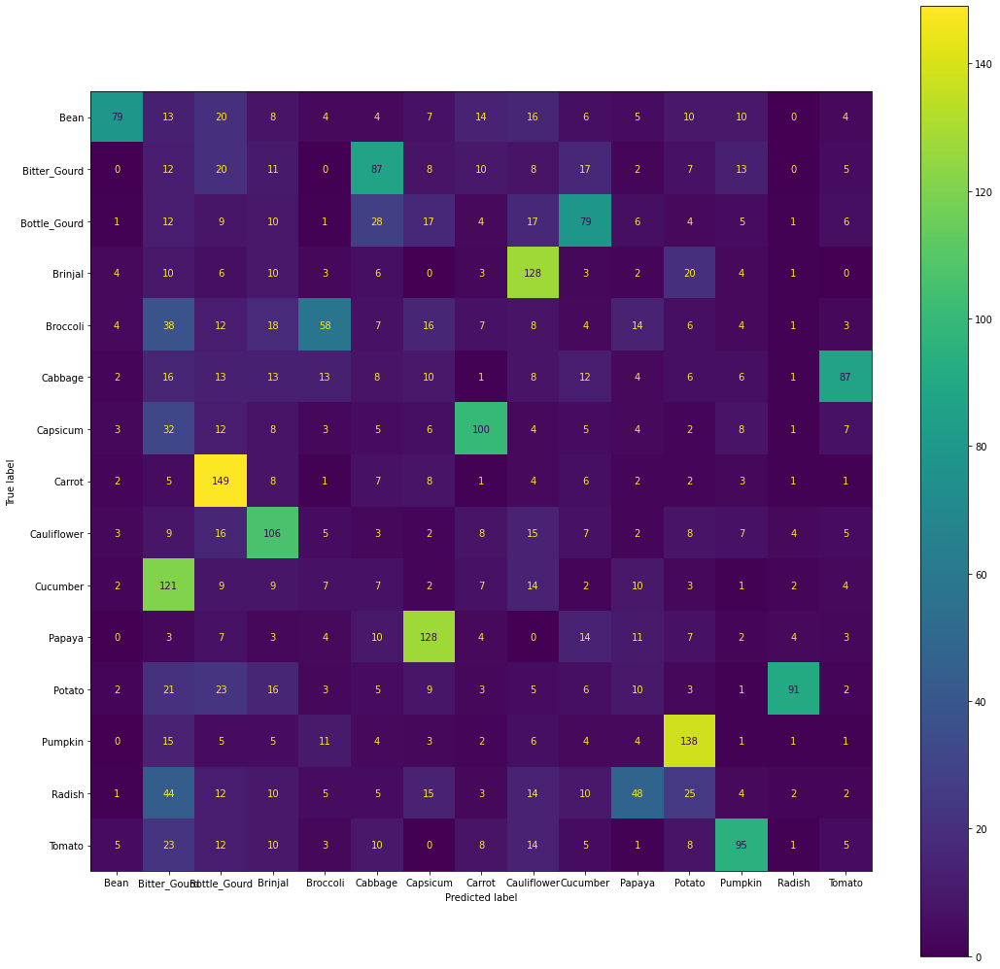

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


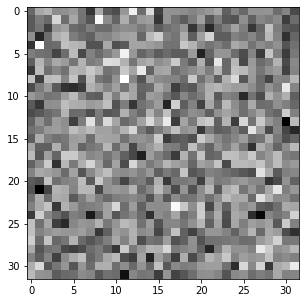

Bitter_Gourd


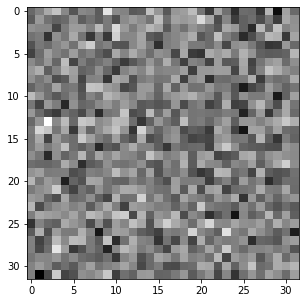

Bottle_Gourd


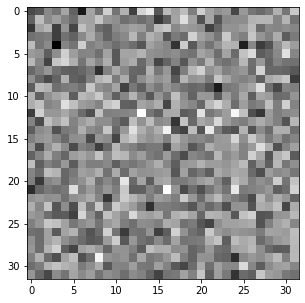

Brinjal


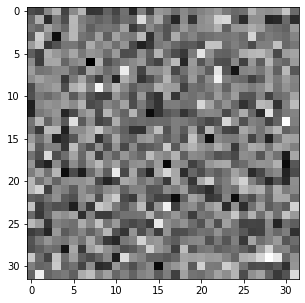

Broccoli


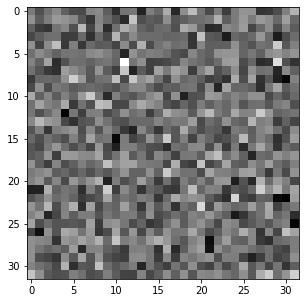

Cabbage


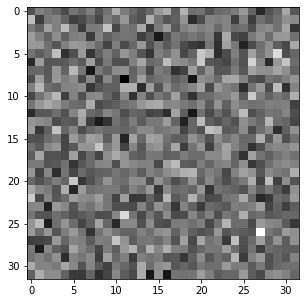

Capsicum


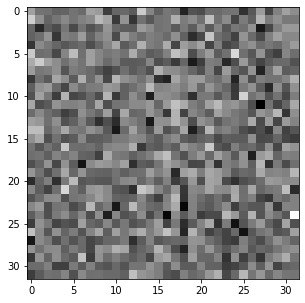

Carrot


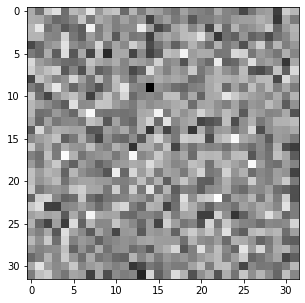

Cauliflower


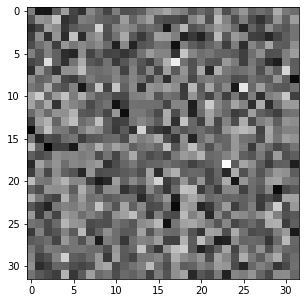

Cucumber


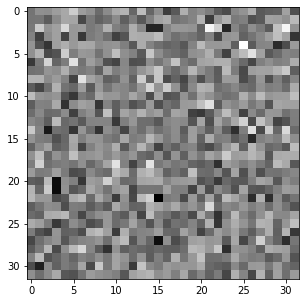

Papaya


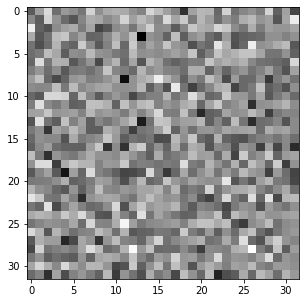

Potato


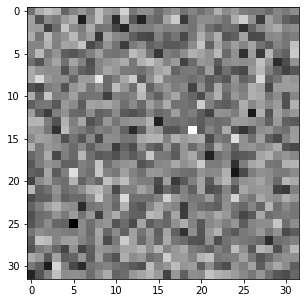

Pumpkin


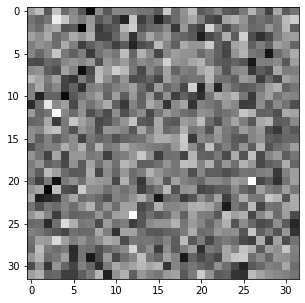

Radish


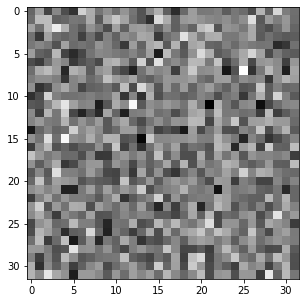

Tomato


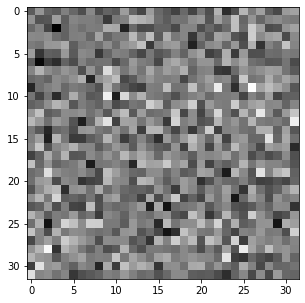

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.01, batch_size = 64, activ_func = ["sigmoid", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.465513328468795, validation cost = 2.9829908581640634
Train Accuracy: 21.42 Validation Accuracy: 7.6
Epoch 2: training cost = 2.3580780332589963, validation cost = 3.02617686286449
Train Accuracy: 26.486666666666665 Validation Accuracy: 7.199999999999999
Epoch 3: training cost = 2.3034444313626437, validation cost = 3.0417931198060346
Train Accuracy: 29.173333333333336 Validation Accuracy: 7.133333333333333
Epoch 4: training cost = 2.269050839513097, validation cost = 3.0459033536365205
Train Accuracy: 30.8 Validation Accuracy: 7.233333333333333
Epoch 5: training cost = 2.24090066649498, validation cost = 3.0585877594005955
Train Accuracy: 32.24 Validation Accuracy: 7.000000000000001
Epoch 6: training cost = 2.216224661974558, validation cost = 3.072834926112135
Train Accuracy: 33.22 Validation Accuracy: 7.000000000000001
Epoch 7: training cost = 2.1938176596904295, validation cost = 3.0870570717461328
Train Accuracy: 34.18 Validation Accuracy: 7.000000000000

              precision    recall  f1-score   support

           0      0.500     0.255     0.338       200
           1      0.032     0.035     0.034       200
           2      0.042     0.040     0.041       200
           3      0.035     0.040     0.037       200
           4      0.286     0.040     0.070       200
           5      0.059     0.080     0.068       200
           6      0.053     0.070     0.060       200
           7      0.024     0.035     0.029       200
           8      0.038     0.055     0.045       200
           9      0.042     0.025     0.031       200
          10      0.067     0.115     0.084       200
          11      0.012     0.015     0.014       200
          12      0.006     0.005     0.006       200
          13      0.015     0.010     0.012       200
          14      0.086     0.050     0.063       200

    accuracy                          0.058      3000
   macro avg      0.086     0.058     0.062      3000
weighted avg      0.086   

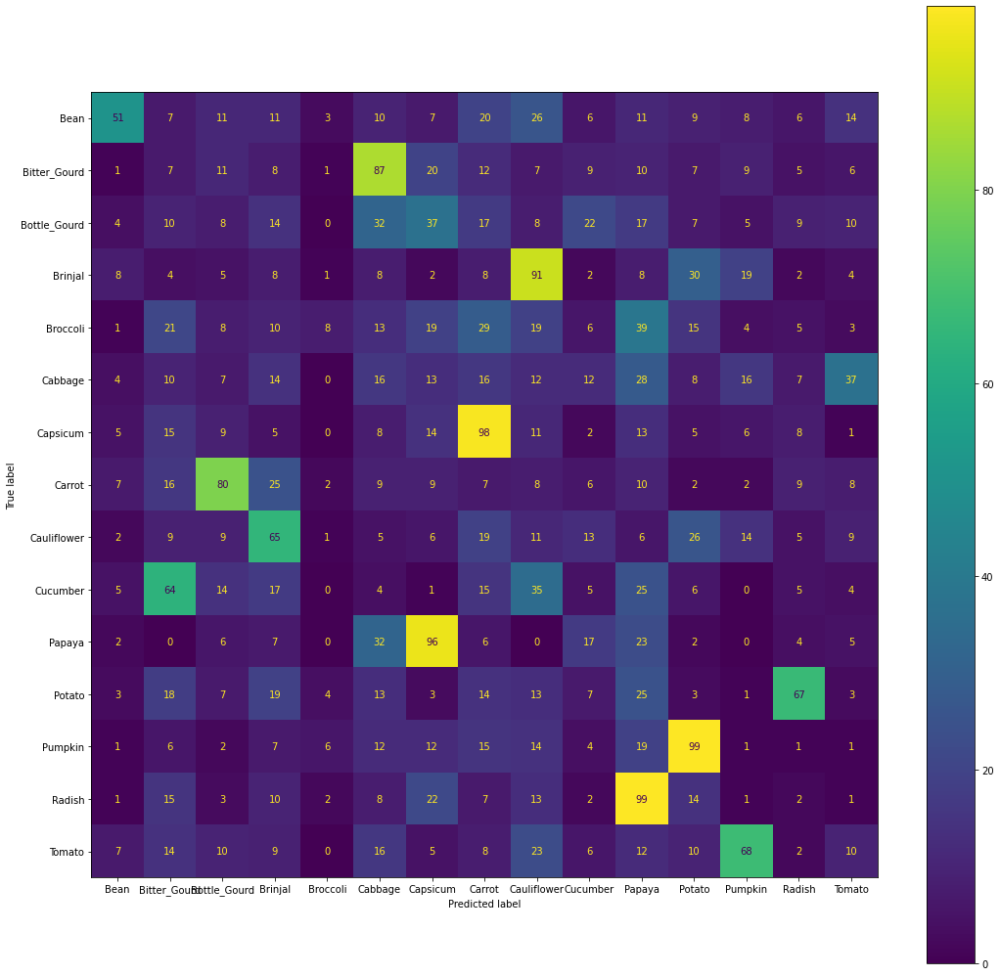

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


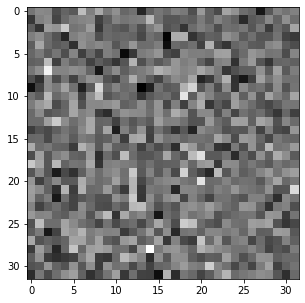

Bitter_Gourd


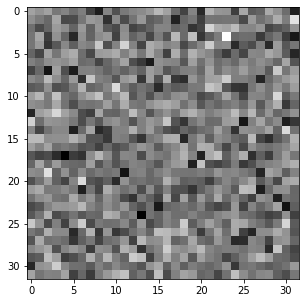

Bottle_Gourd


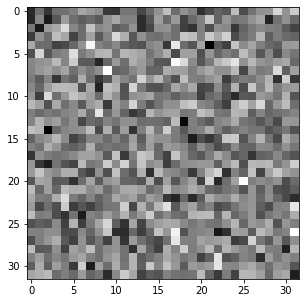

Brinjal


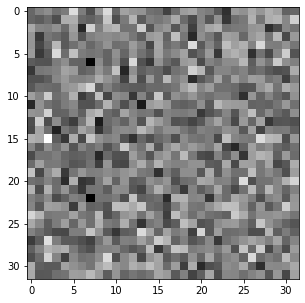

Broccoli


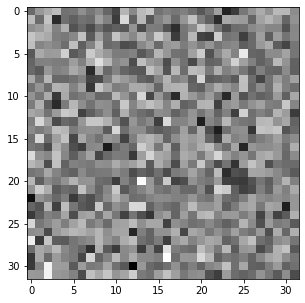

Cabbage


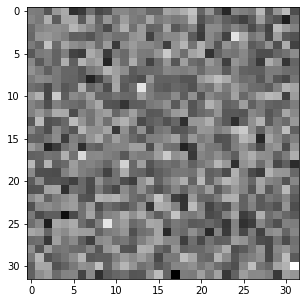

Capsicum


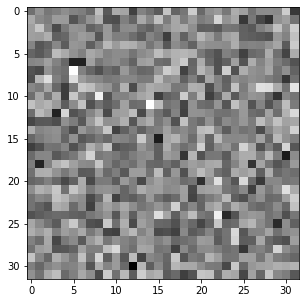

Carrot


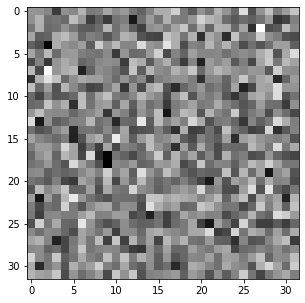

Cauliflower


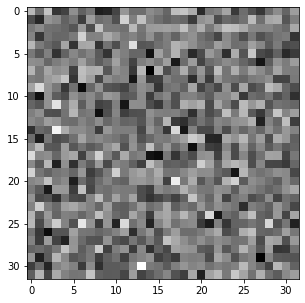

Cucumber


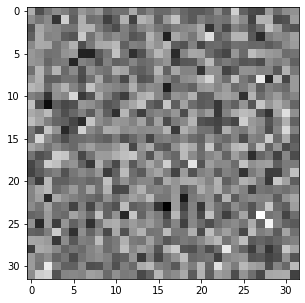

Papaya


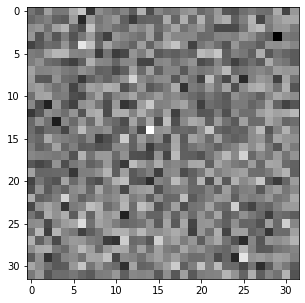

Potato


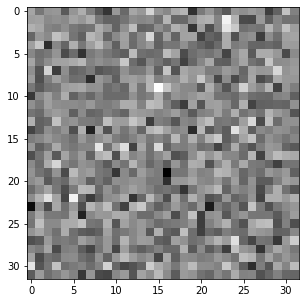

Pumpkin


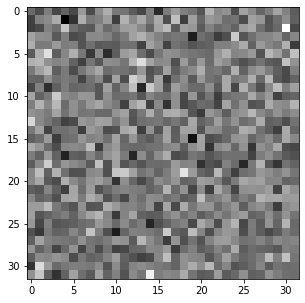

Radish


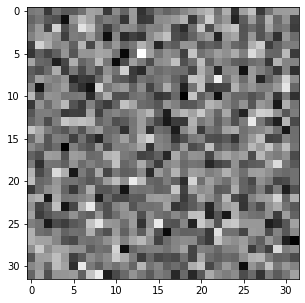

Tomato


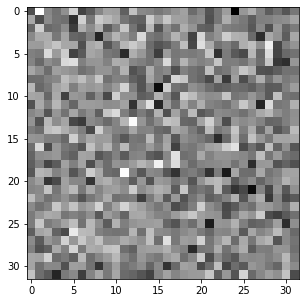

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.01, batch_size = 64, activ_func = ["relu", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 2: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 3: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 4: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 5: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 6: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 7: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 8: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667


              precision    recall  f1-score   support

           0      0.067     1.000     0.125       200
           1      0.000     0.000     0.000       200
           2      0.000     0.000     0.000       200
           3      0.000     0.000     0.000       200
           4      0.000     0.000     0.000       200
           5      0.000     0.000     0.000       200
           6      0.000     0.000     0.000       200
           7      0.000     0.000     0.000       200
           8      0.000     0.000     0.000       200
           9      0.000     0.000     0.000       200
          10      0.000     0.000     0.000       200
          11      0.000     0.000     0.000       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.000     0.000     0.000       200

    accuracy                          0.067      3000
   macro avg      0.004     0.067     0.008      3000
weighted avg      0.004   

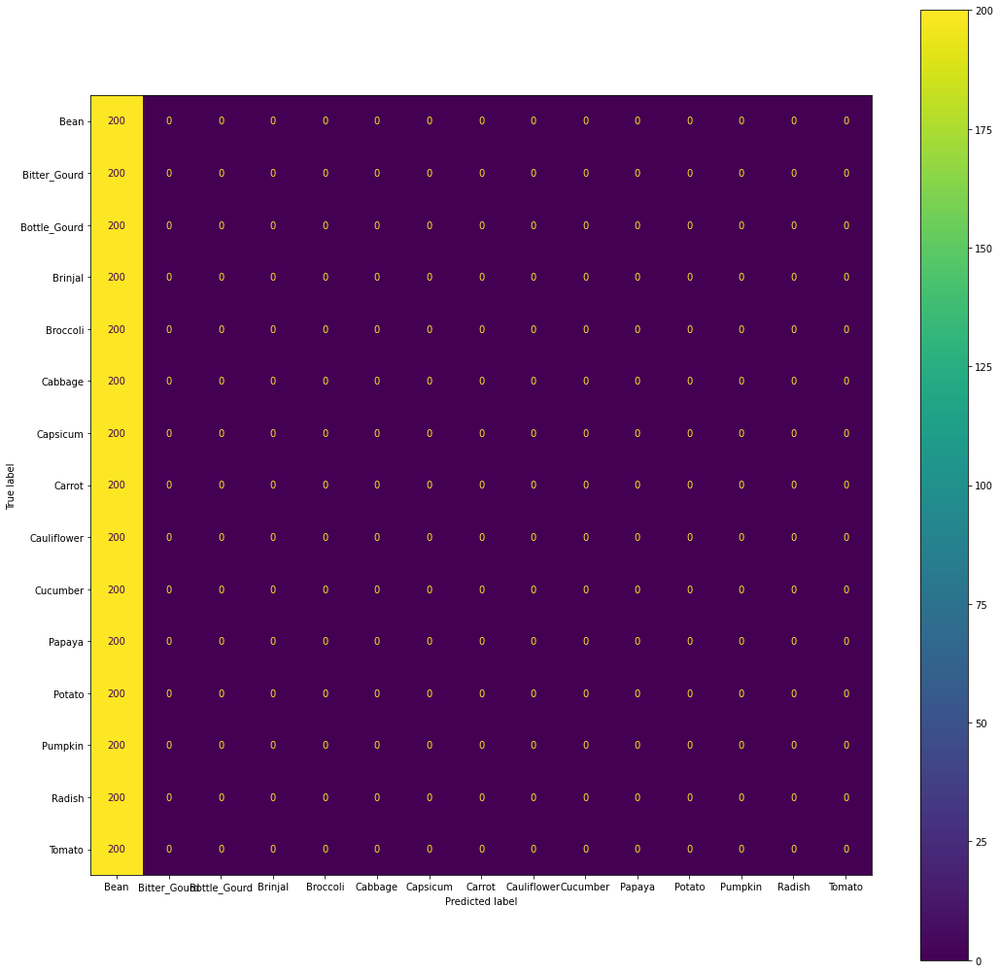

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


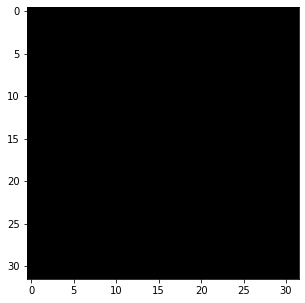

Bitter_Gourd


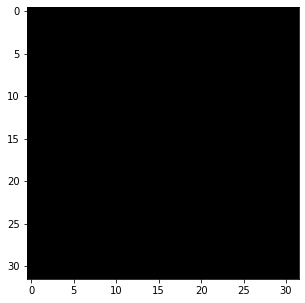

Bottle_Gourd


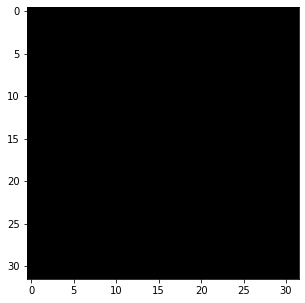

Brinjal


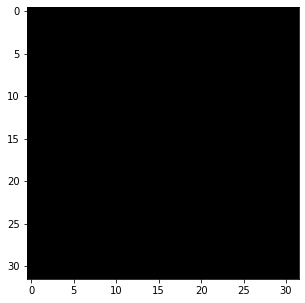

Broccoli


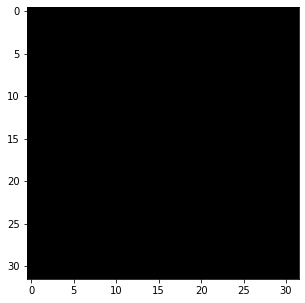

Cabbage


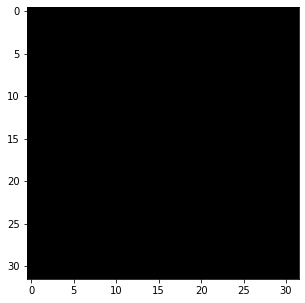

Capsicum


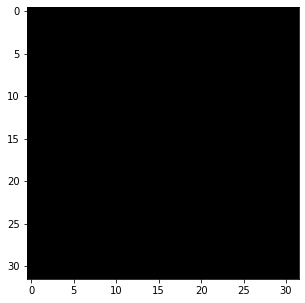

Carrot


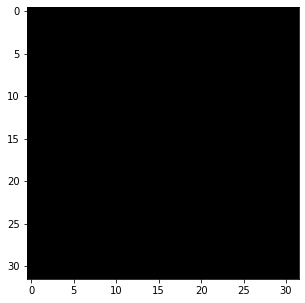

Cauliflower


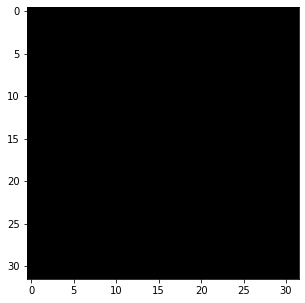

Cucumber


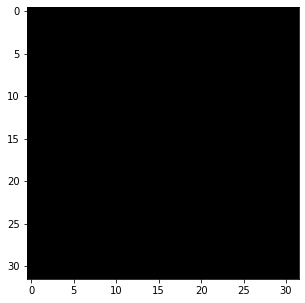

Papaya


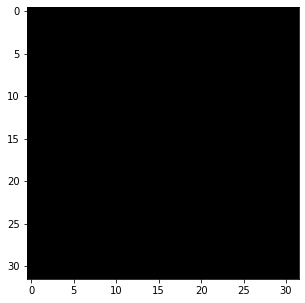

Potato


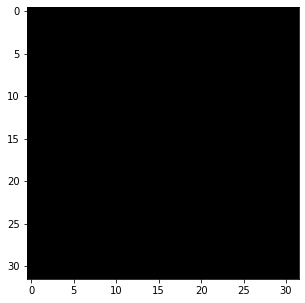

Pumpkin


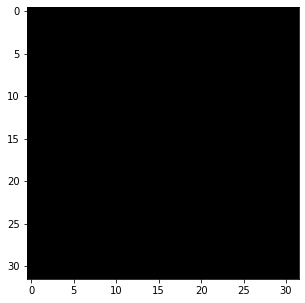

Radish


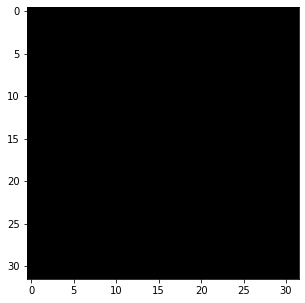

Tomato


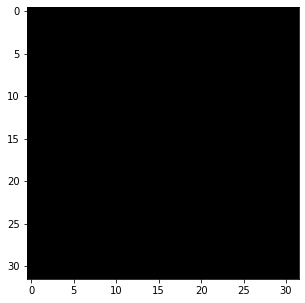

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.01, batch_size = 64, activ_func = ["tanh", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.4079470285472326, validation cost = 3.3731455139465085
Train Accuracy: 25.346666666666668 Validation Accuracy: 7.9
Epoch 2: training cost = 2.216829477325203, validation cost = 3.3815674346684426
Train Accuracy: 31.22666666666667 Validation Accuracy: 7.866666666666666
Epoch 3: training cost = 2.1063419274137845, validation cost = 3.410048713842224
Train Accuracy: 34.74666666666666 Validation Accuracy: 7.533333333333333
Epoch 4: training cost = 2.0216343209374905, validation cost = 3.443277559907066
Train Accuracy: 37.22 Validation Accuracy: 7.466666666666668
Epoch 5: training cost = 1.950370145139984, validation cost = 3.478681726685615
Train Accuracy: 39.766666666666666 Validation Accuracy: 7.6
Epoch 6: training cost = 1.8879102588102556, validation cost = 3.51373856824152
Train Accuracy: 42.086666666666666 Validation Accuracy: 7.6
Epoch 7: training cost = 1.8317999052122742, validation cost = 3.547624959920698
Train Accuracy: 44.07333333333333 Validation Ac

              precision    recall  f1-score   support

           0      0.573     0.355     0.438       200
           1      0.015     0.015     0.015       200
           2      0.037     0.040     0.038       200
           3      0.031     0.035     0.033       200
           4      0.414     0.180     0.251       200
           5      0.060     0.075     0.067       200
           6      0.028     0.035     0.031       200
           7      0.037     0.050     0.043       200
           8      0.048     0.055     0.052       200
           9      0.038     0.035     0.036       200
          10      0.064     0.105     0.079       200
          11      0.026     0.030     0.028       200
          12      0.022     0.015     0.018       200
          13      0.000     0.000     0.000       200
          14      0.041     0.030     0.034       200

    accuracy                          0.070      3000
   macro avg      0.096     0.070     0.078      3000
weighted avg      0.096   

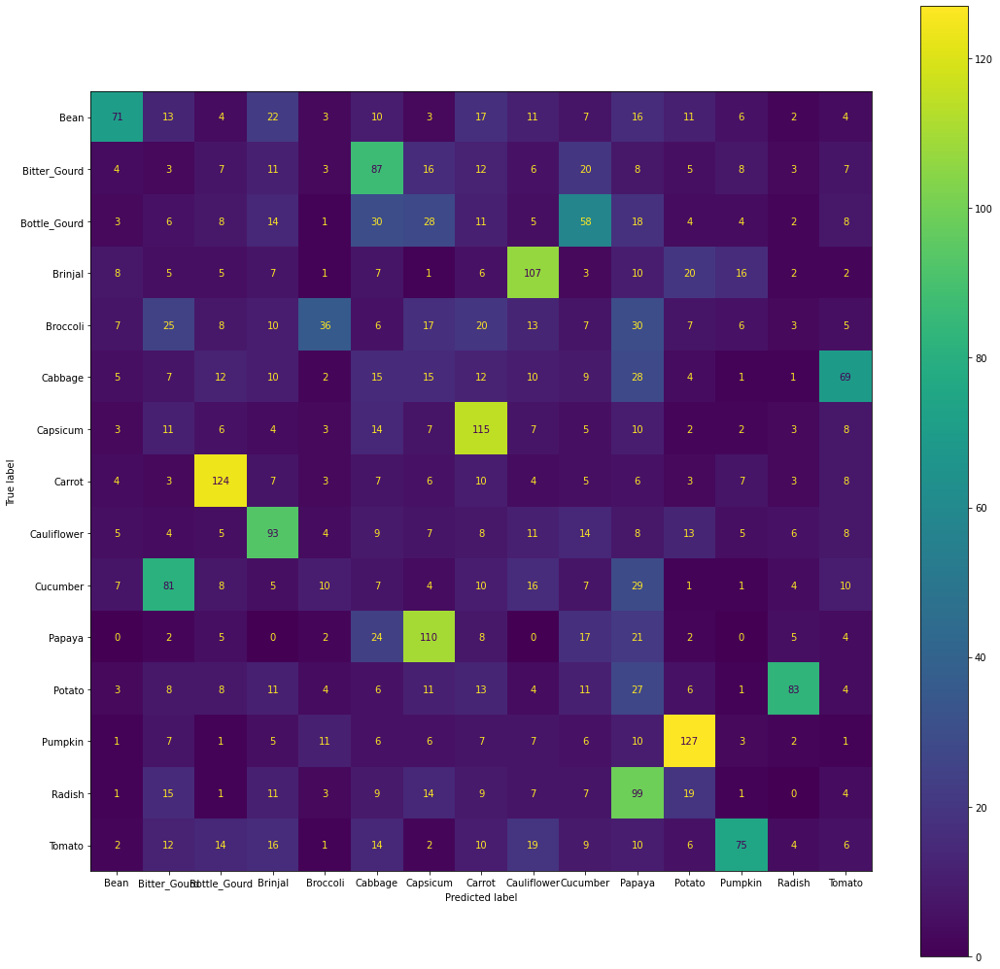

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


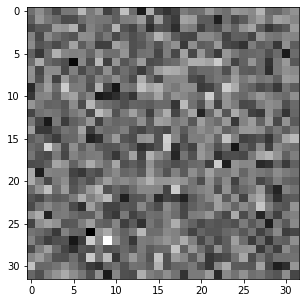

Bitter_Gourd


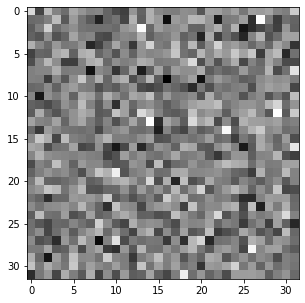

Bottle_Gourd


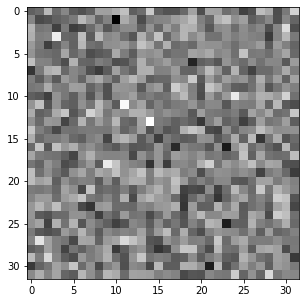

Brinjal


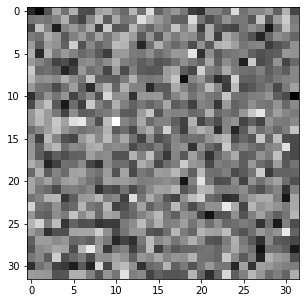

Broccoli


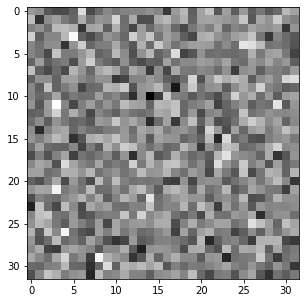

Cabbage


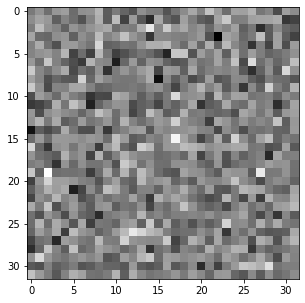

Capsicum


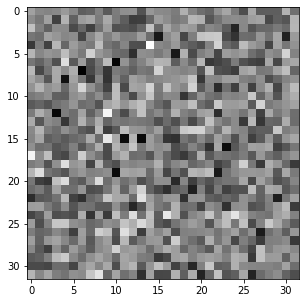

Carrot


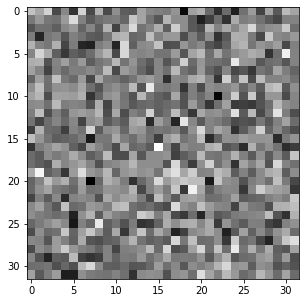

Cauliflower


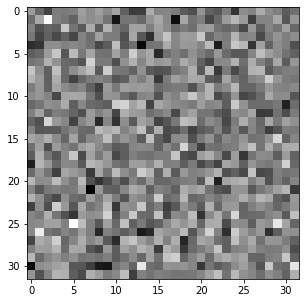

Cucumber


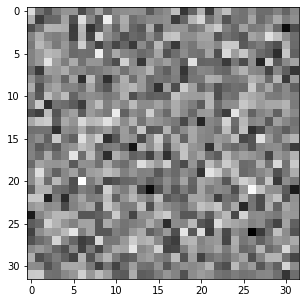

Papaya


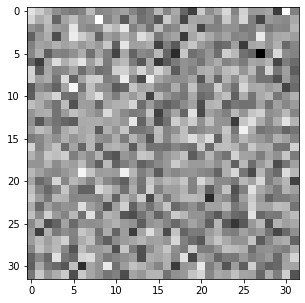

Potato


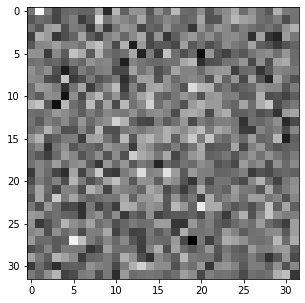

Pumpkin


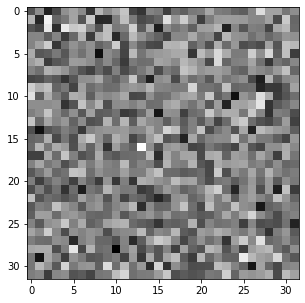

Radish


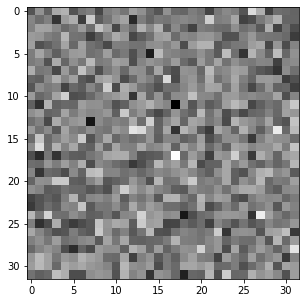

Tomato


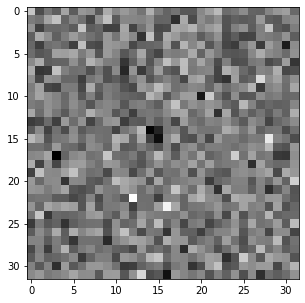

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.01, batch_size = 128, activ_func = ["sigmoid", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.5560749570936756, validation cost = 2.9514058896770687
Train Accuracy: 16.293333333333333 Validation Accuracy: 5.666666666666666
Epoch 2: training cost = 2.4451493001072966, validation cost = 2.9831738896288496
Train Accuracy: 21.933333333333334 Validation Accuracy: 6.1
Epoch 3: training cost = 2.3860762872265235, validation cost = 2.9988954190877424
Train Accuracy: 24.88 Validation Accuracy: 6.7
Epoch 4: training cost = 2.348196759655025, validation cost = 3.004508301220183
Train Accuracy: 27.006666666666668 Validation Accuracy: 6.6000000000000005
Epoch 5: training cost = 2.321788409130856, validation cost = 3.0072179454321084
Train Accuracy: 28.493333333333332 Validation Accuracy: 6.7
Epoch 6: training cost = 2.302699427724704, validation cost = 3.0081886356782404
Train Accuracy: 29.386666666666667 Validation Accuracy: 6.800000000000001
Epoch 7: training cost = 2.2882700587574147, validation cost = 3.007693167288613
Train Accuracy: 29.886666666666667 Valida

              precision    recall  f1-score   support

           0      0.401     0.295     0.340       200
           1      0.044     0.045     0.045       200
           2      0.042     0.030     0.035       200
           3      0.032     0.030     0.031       200
           4      0.237     0.045     0.076       200
           5      0.068     0.110     0.084       200
           6      0.050     0.070     0.058       200
           7      0.046     0.065     0.054       200
           8      0.051     0.055     0.053       200
           9      0.030     0.020     0.024       200
          10      0.095     0.115     0.104       200
          11      0.021     0.035     0.026       200
          12      0.015     0.015     0.015       200
          13      0.014     0.010     0.012       200
          14      0.082     0.045     0.058       200

    accuracy                          0.066      3000
   macro avg      0.082     0.066     0.068      3000
weighted avg      0.082   

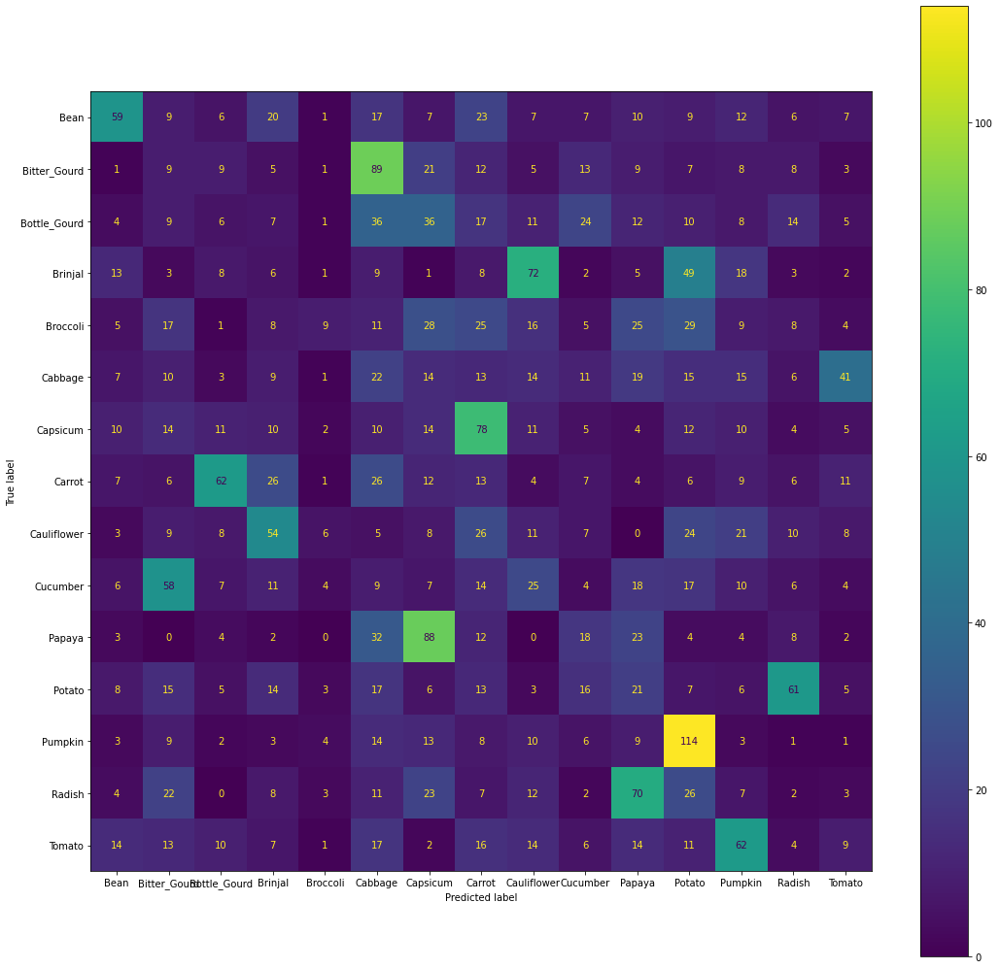

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


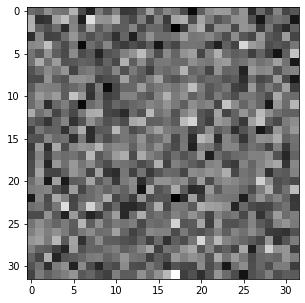

Bitter_Gourd


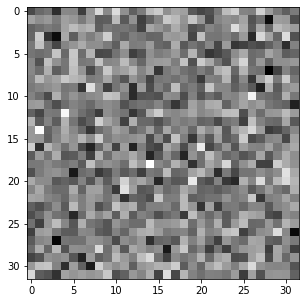

Bottle_Gourd


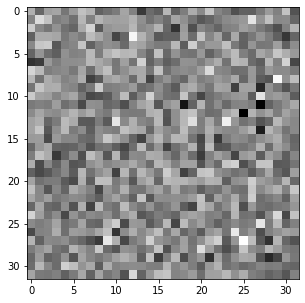

Brinjal


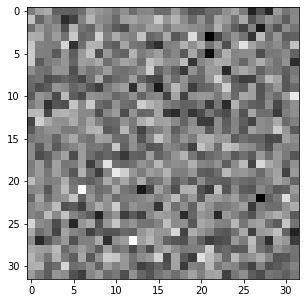

Broccoli


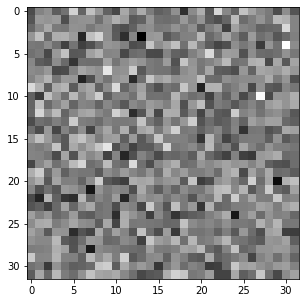

Cabbage


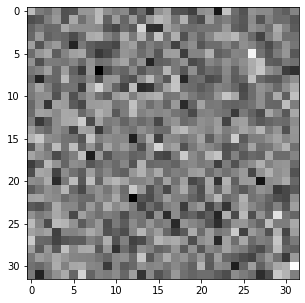

Capsicum


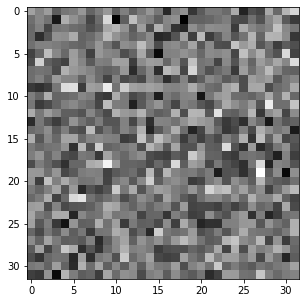

Carrot


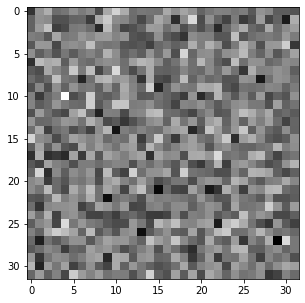

Cauliflower


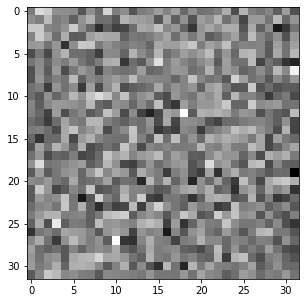

Cucumber


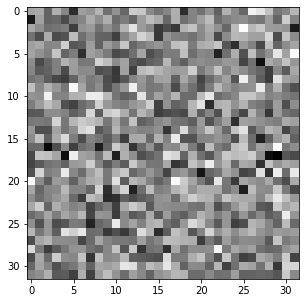

Papaya


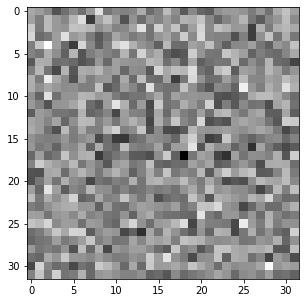

Potato


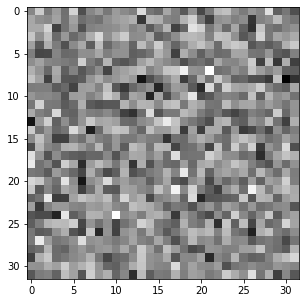

Pumpkin


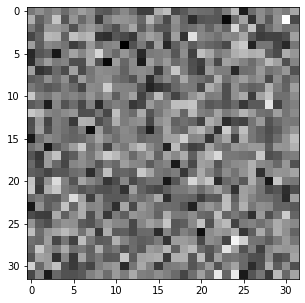

Radish


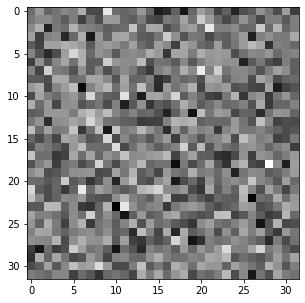

Tomato


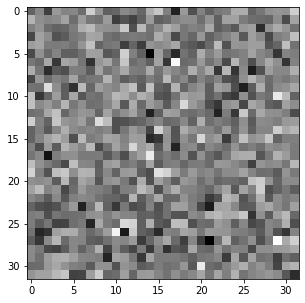

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.01, batch_size = 128, activ_func = ["relu", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 2: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 3: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 4: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 5: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 6: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 7: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 8: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667


              precision    recall  f1-score   support

           0      0.067     1.000     0.125       200
           1      0.000     0.000     0.000       200
           2      0.000     0.000     0.000       200
           3      0.000     0.000     0.000       200
           4      0.000     0.000     0.000       200
           5      0.000     0.000     0.000       200
           6      0.000     0.000     0.000       200
           7      0.000     0.000     0.000       200
           8      0.000     0.000     0.000       200
           9      0.000     0.000     0.000       200
          10      0.000     0.000     0.000       200
          11      0.000     0.000     0.000       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.000     0.000     0.000       200

    accuracy                          0.067      3000
   macro avg      0.004     0.067     0.008      3000
weighted avg      0.004   

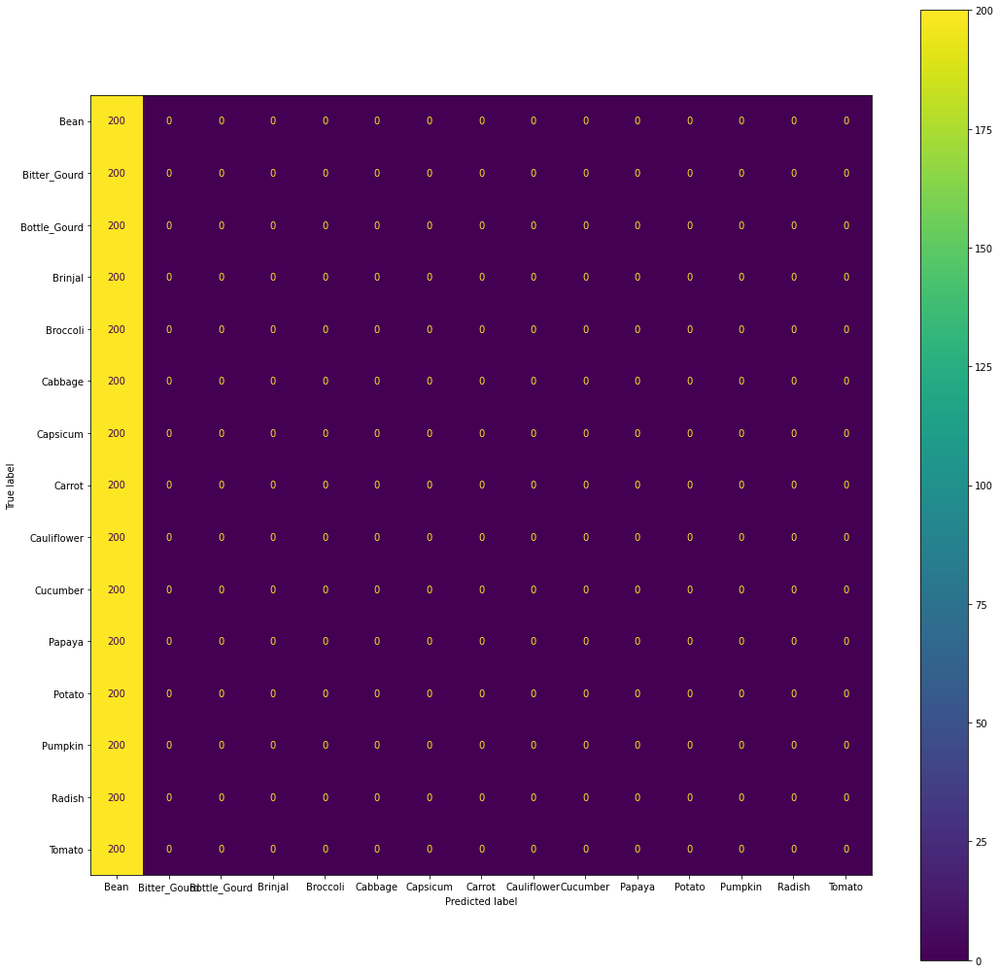

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


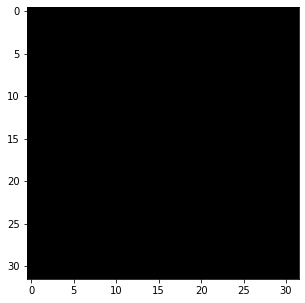

Bitter_Gourd


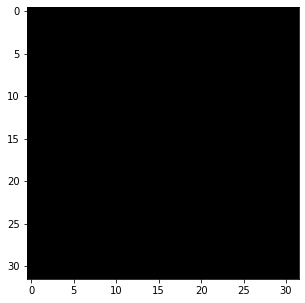

Bottle_Gourd


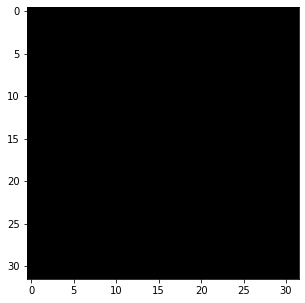

Brinjal


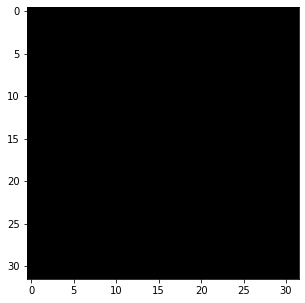

Broccoli


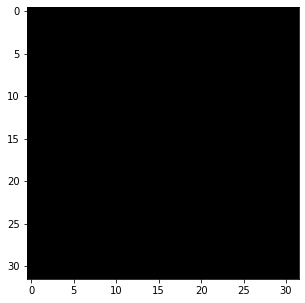

Cabbage


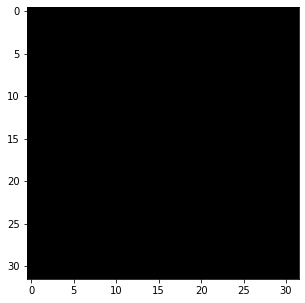

Capsicum


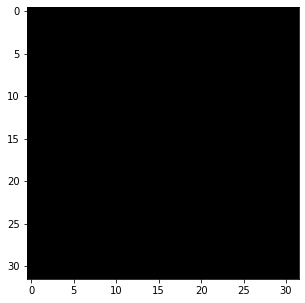

Carrot


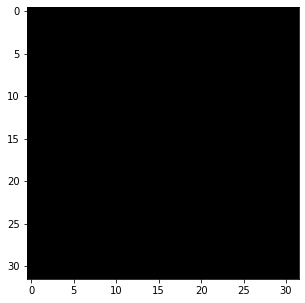

Cauliflower


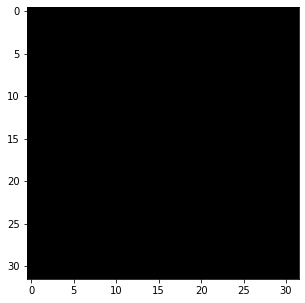

Cucumber


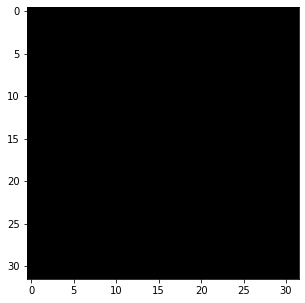

Papaya


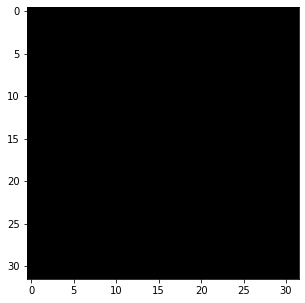

Potato


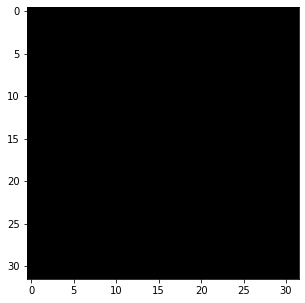

Pumpkin


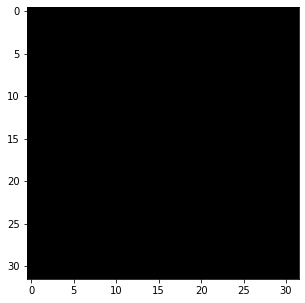

Radish


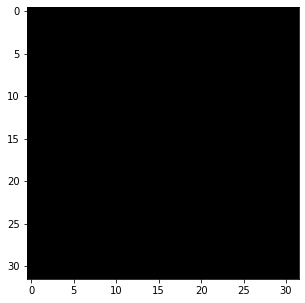

Tomato


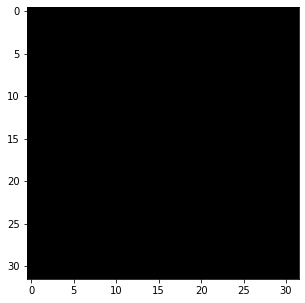

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.01, batch_size = 128, activ_func = ["tanh", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.614664792786973, validation cost = 3.3956864535866127
Train Accuracy: 19.566666666666666 Validation Accuracy: 6.166666666666667
Epoch 2: training cost = 2.39515649894683, validation cost = 3.381294190376575
Train Accuracy: 25.173333333333332 Validation Accuracy: 6.233333333333333
Epoch 3: training cost = 2.280433965968737, validation cost = 3.3784676804796683
Train Accuracy: 28.586666666666666 Validation Accuracy: 6.433333333333334
Epoch 4: training cost = 2.201773827650752, validation cost = 3.3842870494959714
Train Accuracy: 31.14 Validation Accuracy: 6.4
Epoch 5: training cost = 2.1402736880311646, validation cost = 3.3963375001532428
Train Accuracy: 32.99333333333333 Validation Accuracy: 6.466666666666667
Epoch 6: training cost = 2.0887609001946044, validation cost = 3.4112565724925368
Train Accuracy: 34.88666666666666 Validation Accuracy: 6.5
Epoch 7: training cost = 2.0437791405441925, validation cost = 3.4271703567971907
Train Accuracy: 36.566666666666

              precision    recall  f1-score   support

           0      0.508     0.320     0.393       200
           1      0.061     0.065     0.063       200
           2      0.035     0.035     0.035       200
           3      0.039     0.045     0.042       200
           4      0.304     0.120     0.172       200
           5      0.073     0.085     0.079       200
           6      0.032     0.040     0.035       200
           7      0.020     0.025     0.022       200
           8      0.045     0.055     0.050       200
           9      0.031     0.025     0.028       200
          10      0.057     0.080     0.066       200
          11      0.034     0.045     0.039       200
          12      0.000     0.000     0.000       200
          13      0.021     0.015     0.017       200
          14      0.057     0.045     0.050       200

    accuracy                          0.067      3000
   macro avg      0.088     0.067     0.073      3000
weighted avg      0.088   

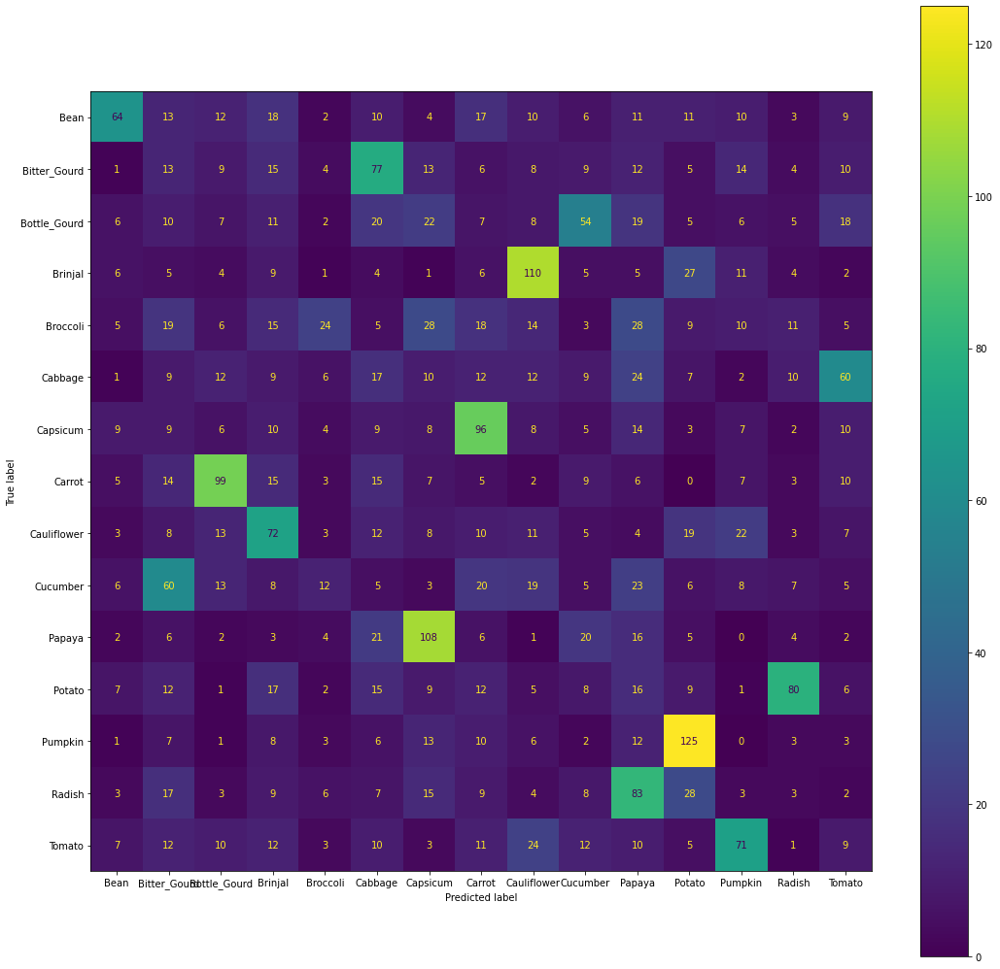

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


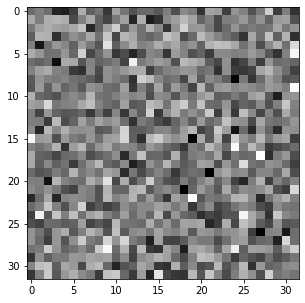

Bitter_Gourd


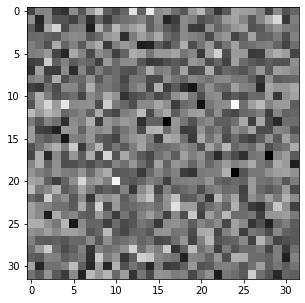

Bottle_Gourd


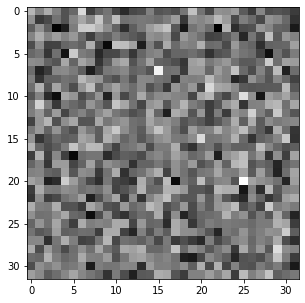

Brinjal


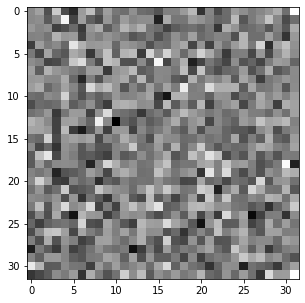

Broccoli


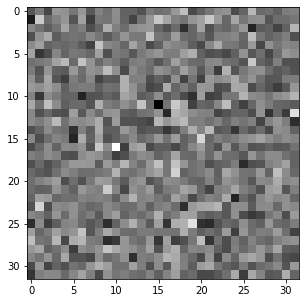

Cabbage


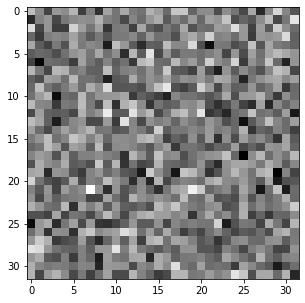

Capsicum


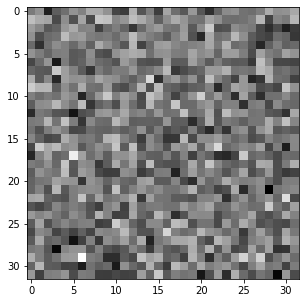

Carrot


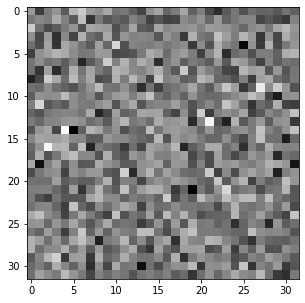

Cauliflower


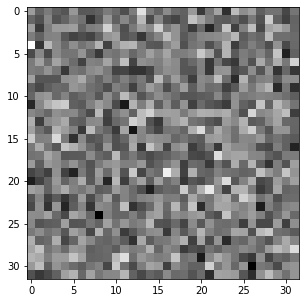

Cucumber


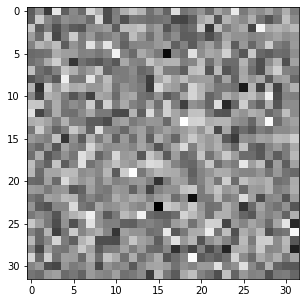

Papaya


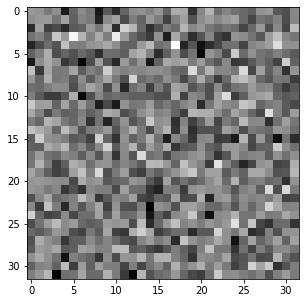

Potato


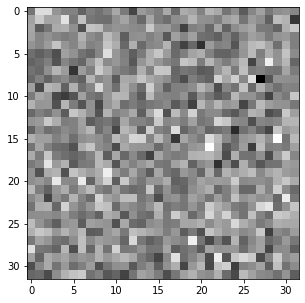

Pumpkin


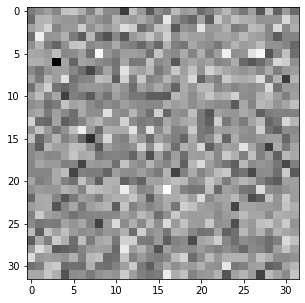

Radish


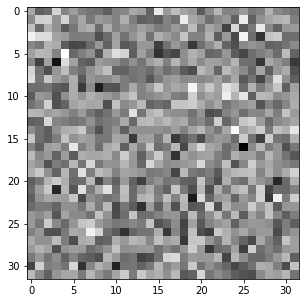

Tomato


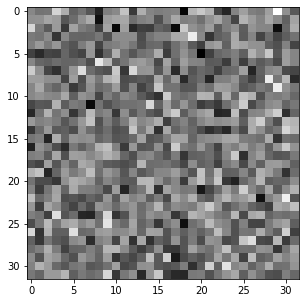

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.02, batch_size = 16, activ_func = ["sigmoid", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.7550203045430712, validation cost = 3.5526446448140065
Train Accuracy: 20.286666666666665 Validation Accuracy: 5.066666666666666
Epoch 2: training cost = 2.4886724434155223, validation cost = 3.612340616799243
Train Accuracy: 23.353333333333335 Validation Accuracy: 4.6
Epoch 3: training cost = 2.3315100276176532, validation cost = 3.677811938422435
Train Accuracy: 26.866666666666667 Validation Accuracy: 4.933333333333334
Epoch 4: training cost = 2.1971686334799645, validation cost = 3.732537280710355
Train Accuracy: 30.813333333333333 Validation Accuracy: 5.3
Epoch 5: training cost = 2.087318173344394, validation cost = 3.7971885722993473
Train Accuracy: 34.68 Validation Accuracy: 5.133333333333334
Epoch 6: training cost = 1.991440725203326, validation cost = 3.8636887389718253
Train Accuracy: 37.45333333333333 Validation Accuracy: 5.2
Epoch 7: training cost = 1.9063582301360955, validation cost = 3.9234835423960077
Train Accuracy: 39.88666666666666 Validatio

              precision    recall  f1-score   support

           0      0.463     0.595     0.521       200
           1      0.010     0.005     0.007       200
           2      0.000     0.000     0.000       200
           3      0.012     0.005     0.007       200
           4      0.335     0.320     0.327       200
           5      0.066     0.115     0.084       200
           6      0.047     0.120     0.068       200
           7      0.022     0.015     0.018       200
           8      0.076     0.095     0.084       200
           9      0.000     0.000     0.000       200
          10      0.077     0.045     0.057       200
          11      0.018     0.025     0.021       200
          12      0.000     0.000     0.000       200
          13      0.043     0.075     0.055       200
          14      0.087     0.050     0.063       200

    accuracy                          0.098      3000
   macro avg      0.084     0.098     0.087      3000
weighted avg      0.084   

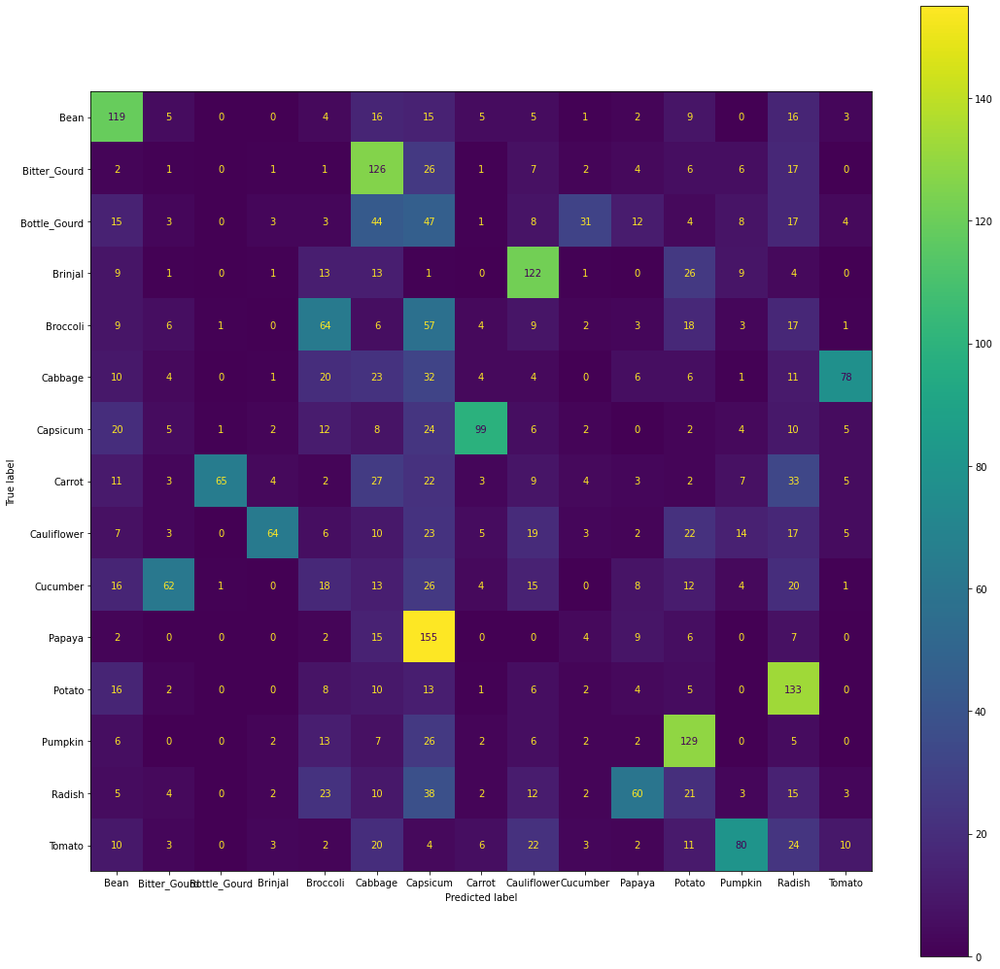

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


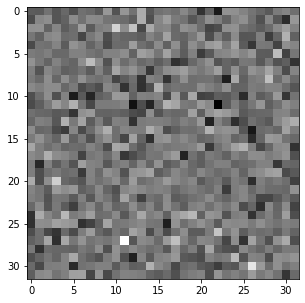

Bitter_Gourd


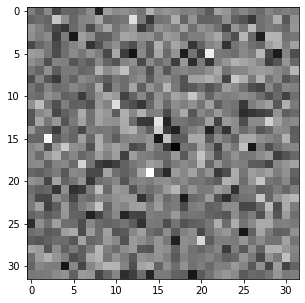

Bottle_Gourd


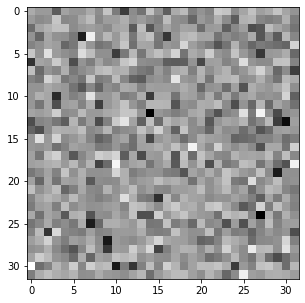

Brinjal


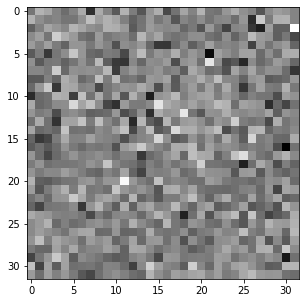

Broccoli


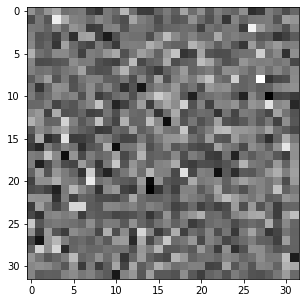

Cabbage


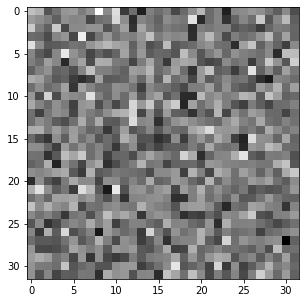

Capsicum


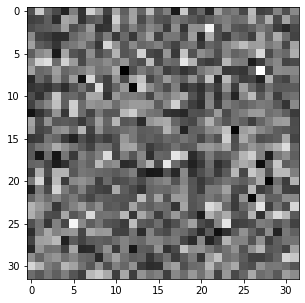

Carrot


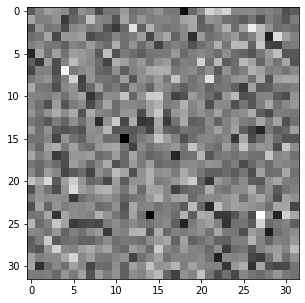

Cauliflower


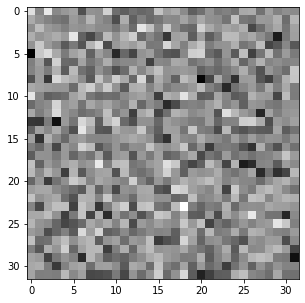

Cucumber


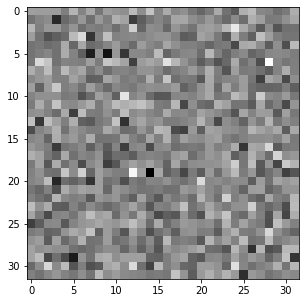

Papaya


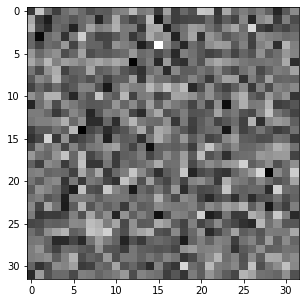

Potato


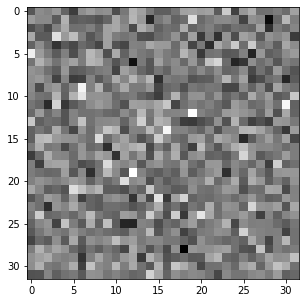

Pumpkin


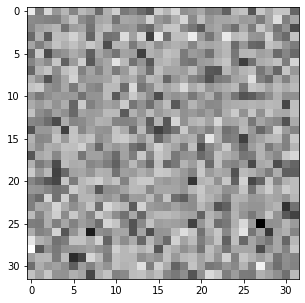

Radish


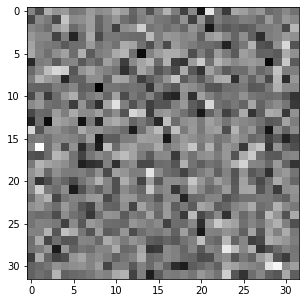

Tomato


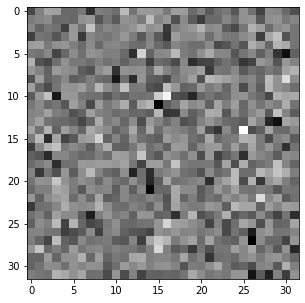

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.02, batch_size = 16, activ_func = ["relu", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 2: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 3: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 4: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 5: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 6: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 7: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 8: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667


              precision    recall  f1-score   support

           0      0.067     1.000     0.125       200
           1      0.000     0.000     0.000       200
           2      0.000     0.000     0.000       200
           3      0.000     0.000     0.000       200
           4      0.000     0.000     0.000       200
           5      0.000     0.000     0.000       200
           6      0.000     0.000     0.000       200
           7      0.000     0.000     0.000       200
           8      0.000     0.000     0.000       200
           9      0.000     0.000     0.000       200
          10      0.000     0.000     0.000       200
          11      0.000     0.000     0.000       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.000     0.000     0.000       200

    accuracy                          0.067      3000
   macro avg      0.004     0.067     0.008      3000
weighted avg      0.004   

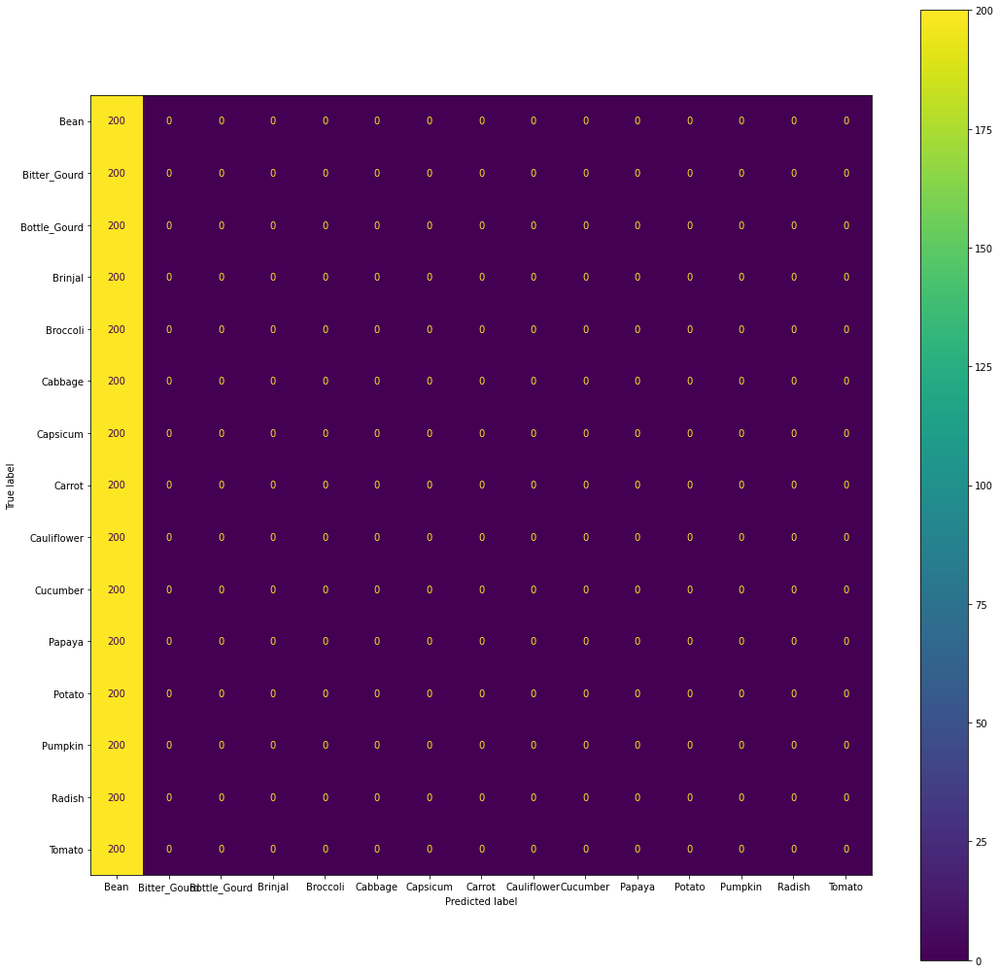

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


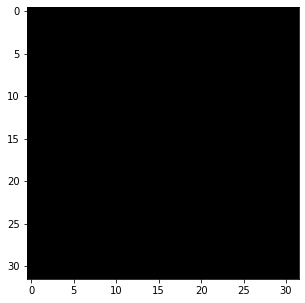

Bitter_Gourd


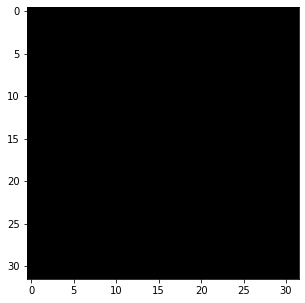

Bottle_Gourd


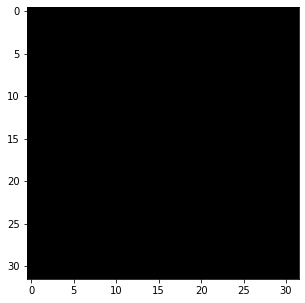

Brinjal


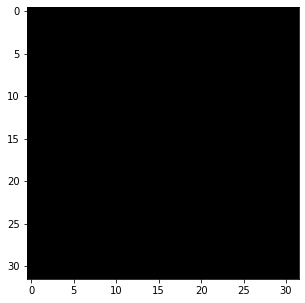

Broccoli


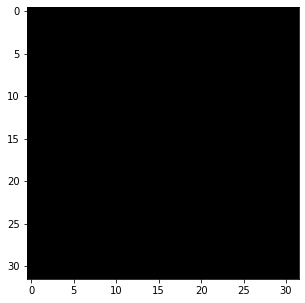

Cabbage


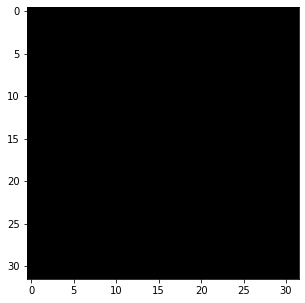

Capsicum


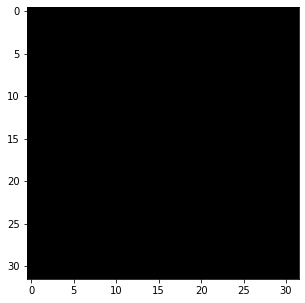

Carrot


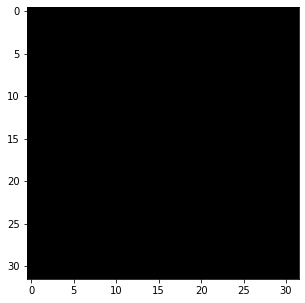

Cauliflower


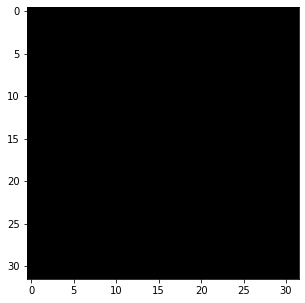

Cucumber


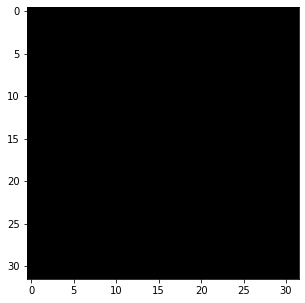

Papaya


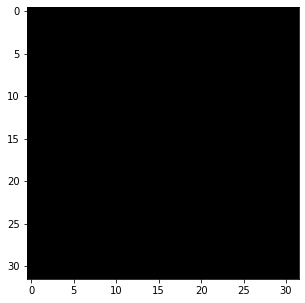

Potato


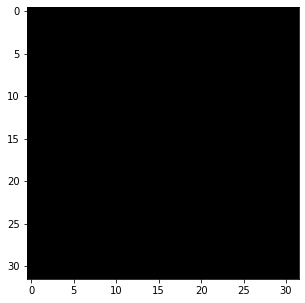

Pumpkin


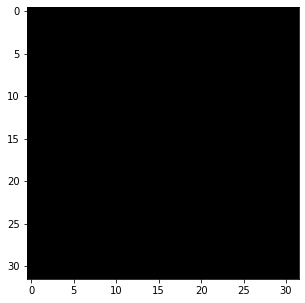

Radish


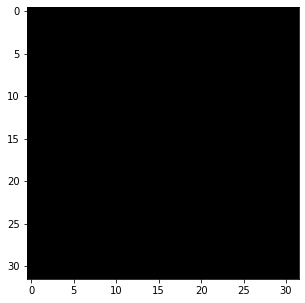

Tomato


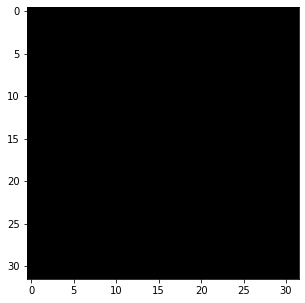

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.02, batch_size = 16, activ_func = ["tanh", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.6084716025510253, validation cost = 3.884182050302418
Train Accuracy: 26.340000000000003 Validation Accuracy: 5.566666666666667
Epoch 2: training cost = 2.244740760877604, validation cost = 4.0146890129906945
Train Accuracy: 29.933333333333334 Validation Accuracy: 5.866666666666666
Epoch 3: training cost = 1.9907292296029344, validation cost = 4.136397720230567
Train Accuracy: 36.74 Validation Accuracy: 6.1
Epoch 4: training cost = 1.7914987098556094, validation cost = 4.277443722469897
Train Accuracy: 42.50666666666667 Validation Accuracy: 6.533333333333332
Epoch 5: training cost = 1.6341087658615536, validation cost = 4.424735882895912
Train Accuracy: 47.86 Validation Accuracy: 7.000000000000001
Epoch 6: training cost = 1.5087922281902009, validation cost = 4.576785106458106
Train Accuracy: 52.0 Validation Accuracy: 7.199999999999999
Epoch 7: training cost = 1.4159227515274557, validation cost = 4.738121388765489
Train Accuracy: 55.29333333333334 Validation

              precision    recall  f1-score   support

           0      0.890     0.365     0.518       200
           1      0.018     0.010     0.013       200
           2      0.033     0.035     0.034       200
           3      0.000     0.000     0.000       200
           4      0.410     0.430     0.420       200
           5      0.029     0.025     0.027       200
           6      0.054     0.185     0.083       200
           7      0.000     0.000     0.000       200
           8      0.059     0.080     0.068       200
           9      0.023     0.010     0.014       200
          10      0.020     0.005     0.008       200
          11      0.004     0.005     0.004       200
          12      0.000     0.000     0.000       200
          13      0.071     0.120     0.089       200
          14      0.023     0.015     0.018       200

    accuracy                          0.086      3000
   macro avg      0.109     0.086     0.086      3000
weighted avg      0.109   

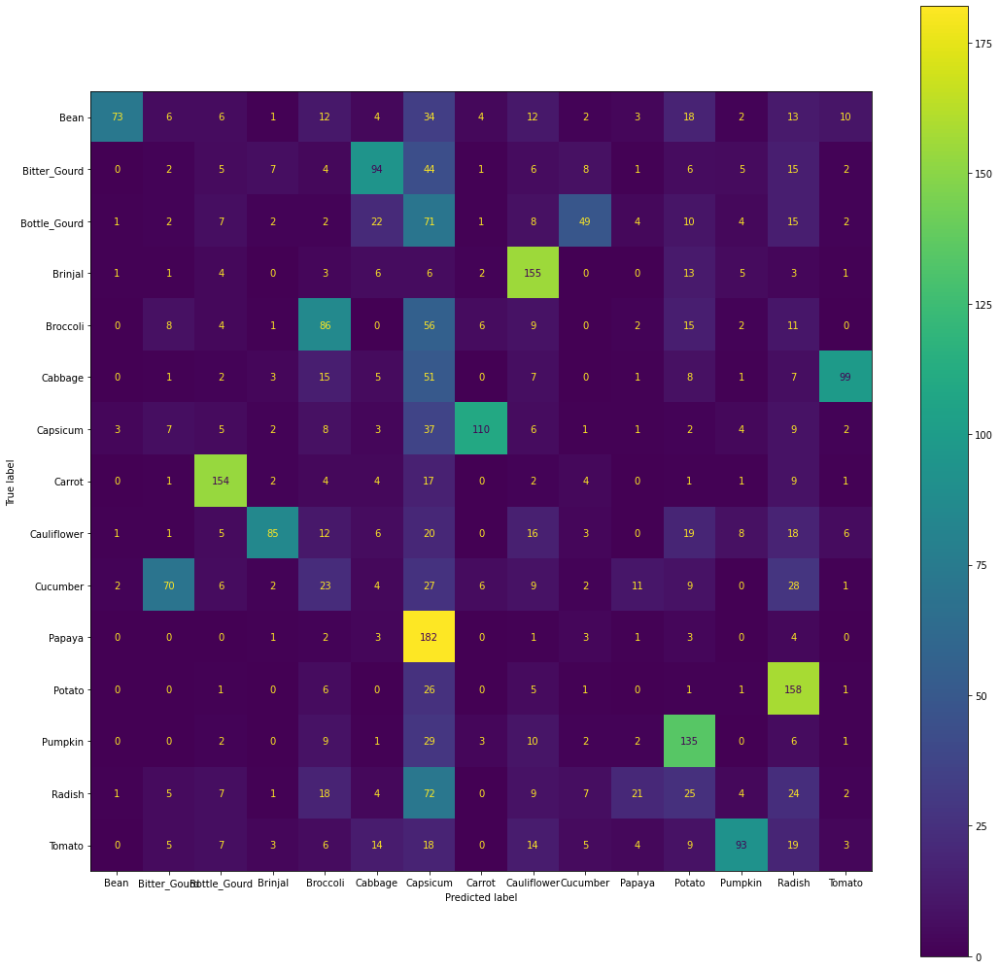

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


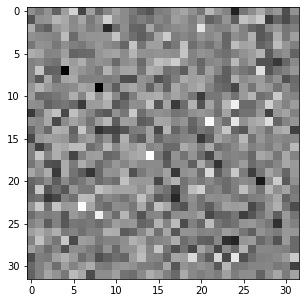

Bitter_Gourd


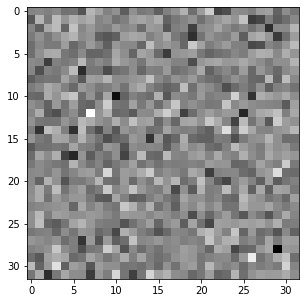

Bottle_Gourd


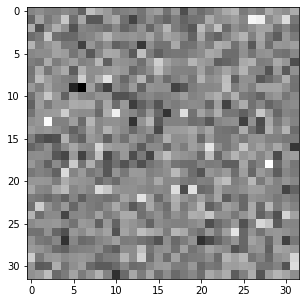

Brinjal


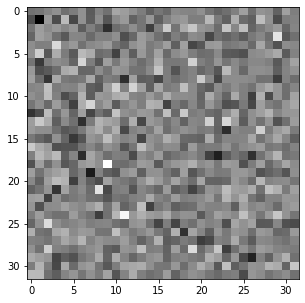

Broccoli


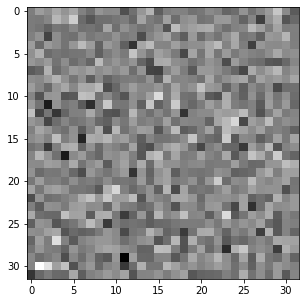

Cabbage


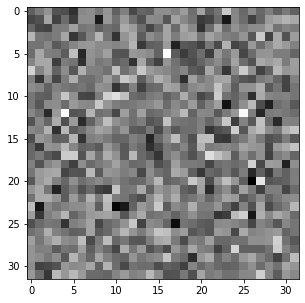

Capsicum


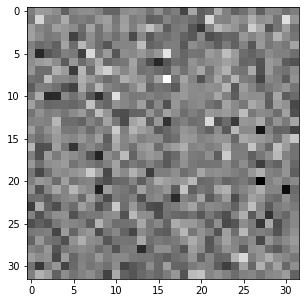

Carrot


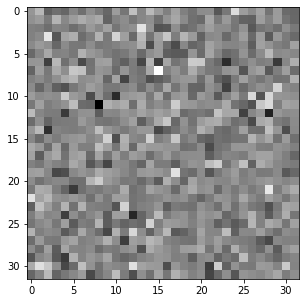

Cauliflower


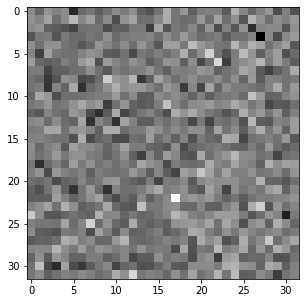

Cucumber


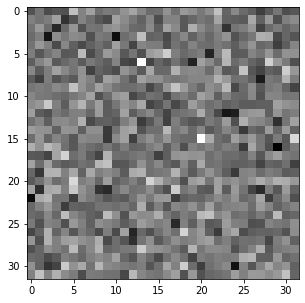

Papaya


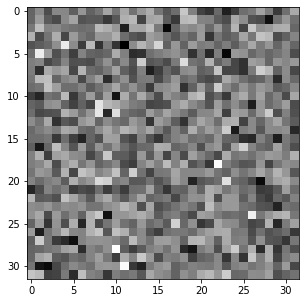

Potato


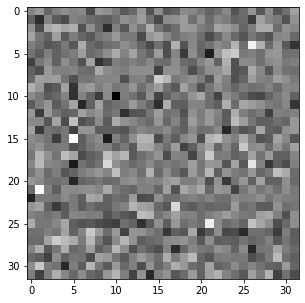

Pumpkin


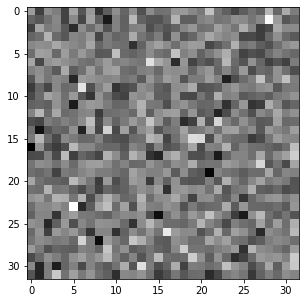

Radish


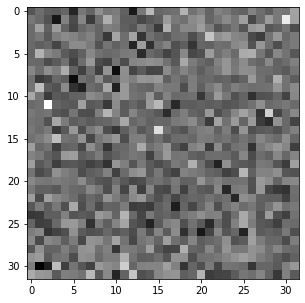

Tomato


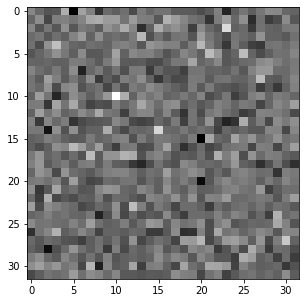

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.02, batch_size = 32, activ_func = ["sigmoid", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.630152658677517, validation cost = 3.3617049922467865
Train Accuracy: 21.5 Validation Accuracy: 8.799999999999999
Epoch 2: training cost = 2.461215496423957, validation cost = 3.3797613357502105
Train Accuracy: 25.779999999999998 Validation Accuracy: 9.4
Epoch 3: training cost = 2.351747675725059, validation cost = 3.4268098957144955
Train Accuracy: 29.080000000000002 Validation Accuracy: 9.333333333333334
Epoch 4: training cost = 2.2564356282503137, validation cost = 3.4616380767819317
Train Accuracy: 31.493333333333336 Validation Accuracy: 9.333333333333334
Epoch 5: training cost = 2.169343784157567, validation cost = 3.485804008792935
Train Accuracy: 33.64 Validation Accuracy: 9.4
Epoch 6: training cost = 2.094414345430713, validation cost = 3.513263368507477
Train Accuracy: 35.38 Validation Accuracy: 9.366666666666665
Epoch 7: training cost = 2.029421383231674, validation cost = 3.539973500235468
Train Accuracy: 37.18 Validation Accuracy: 9.33333333333333

              precision    recall  f1-score   support

           0      0.750     0.270     0.397       200
           1      0.033     0.110     0.050       200
           2      0.055     0.090     0.068       200
           3      0.044     0.095     0.060       200
           4      0.625     0.125     0.208       200
           5      0.058     0.055     0.056       200
           6      0.034     0.035     0.035       200
           7      0.011     0.010     0.010       200
           8      0.007     0.005     0.006       200
           9      0.010     0.005     0.007       200
          10      0.077     0.010     0.018       200
          11      0.024     0.035     0.029       200
          12      0.007     0.005     0.006       200
          13      0.012     0.005     0.007       200
          14      0.088     0.030     0.045       200

    accuracy                          0.059      3000
   macro avg      0.122     0.059     0.067      3000
weighted avg      0.122   

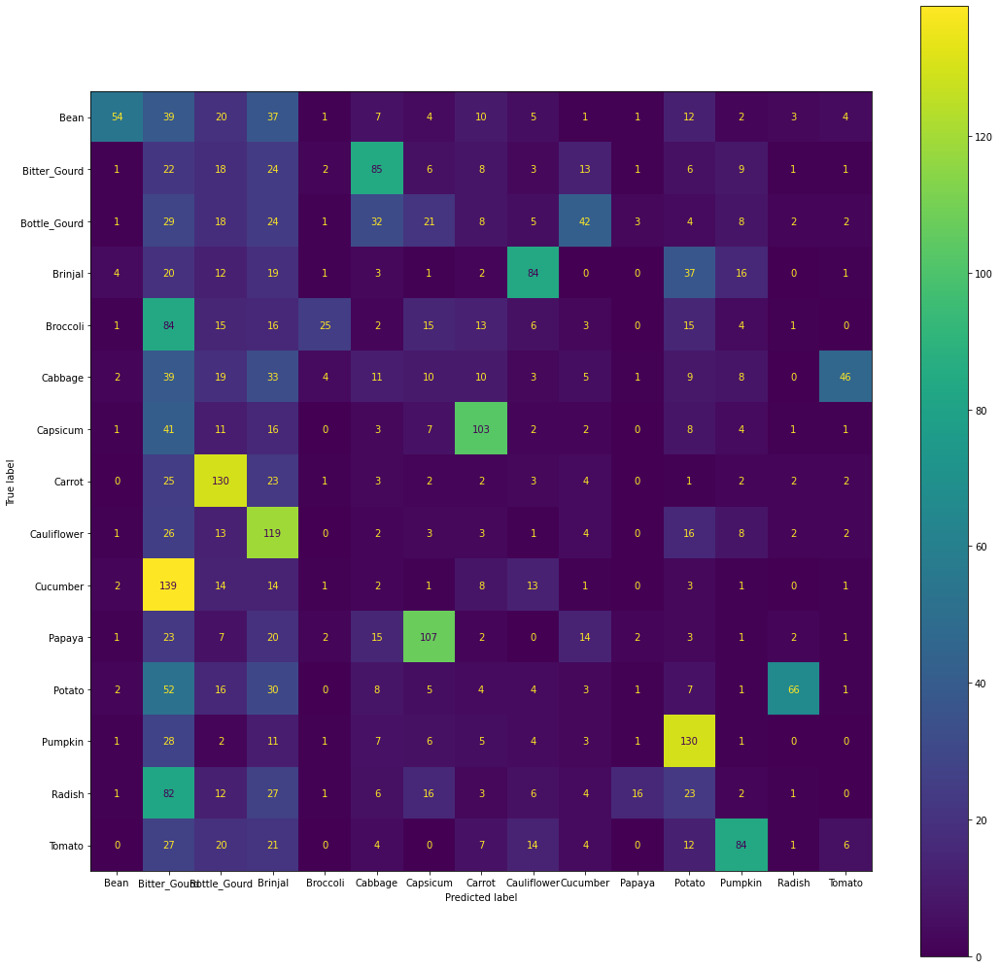

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


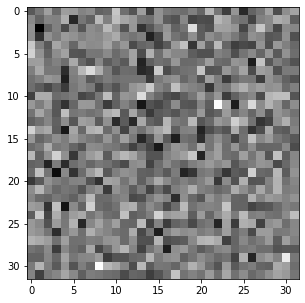

Bitter_Gourd


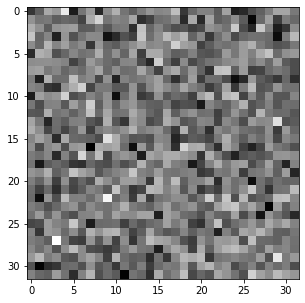

Bottle_Gourd


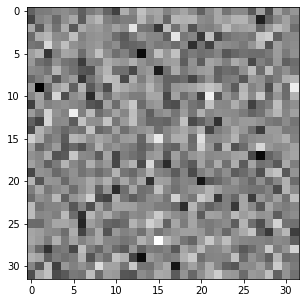

Brinjal


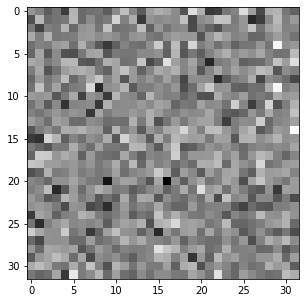

Broccoli


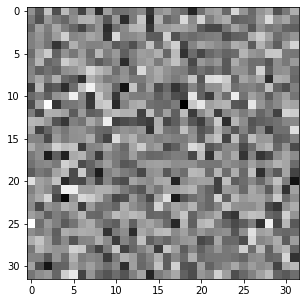

Cabbage


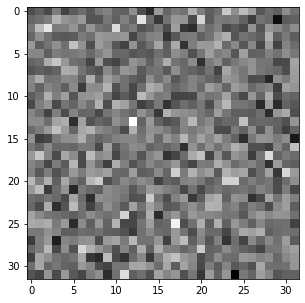

Capsicum


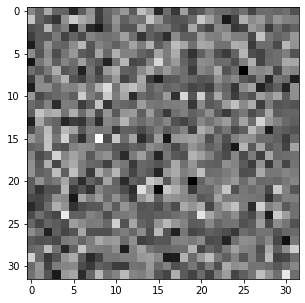

Carrot


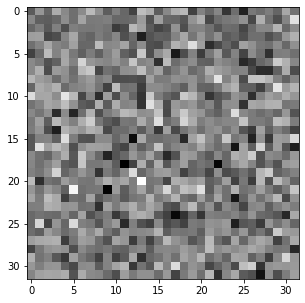

Cauliflower


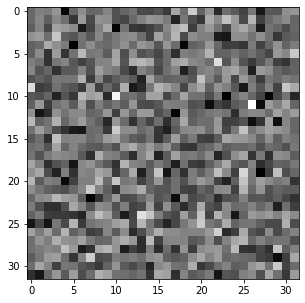

Cucumber


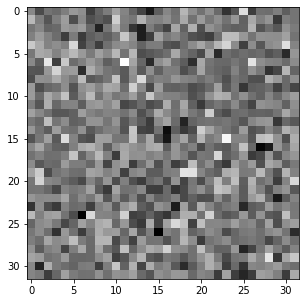

Papaya


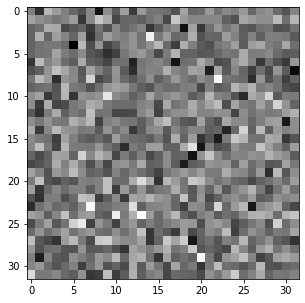

Potato


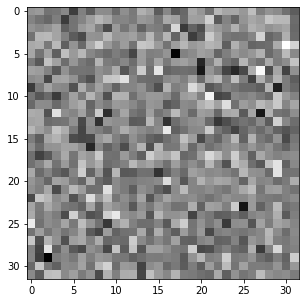

Pumpkin


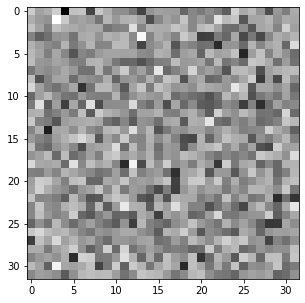

Radish


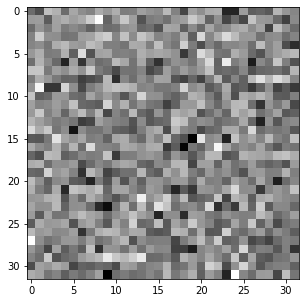

Tomato


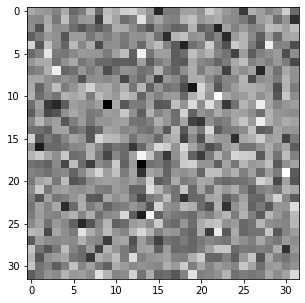

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.02, batch_size = 32, activ_func = ["relu", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 2: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 3: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 4: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 5: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 6: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 7: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 8: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667


              precision    recall  f1-score   support

           0      0.067     1.000     0.125       200
           1      0.000     0.000     0.000       200
           2      0.000     0.000     0.000       200
           3      0.000     0.000     0.000       200
           4      0.000     0.000     0.000       200
           5      0.000     0.000     0.000       200
           6      0.000     0.000     0.000       200
           7      0.000     0.000     0.000       200
           8      0.000     0.000     0.000       200
           9      0.000     0.000     0.000       200
          10      0.000     0.000     0.000       200
          11      0.000     0.000     0.000       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.000     0.000     0.000       200

    accuracy                          0.067      3000
   macro avg      0.004     0.067     0.008      3000
weighted avg      0.004   

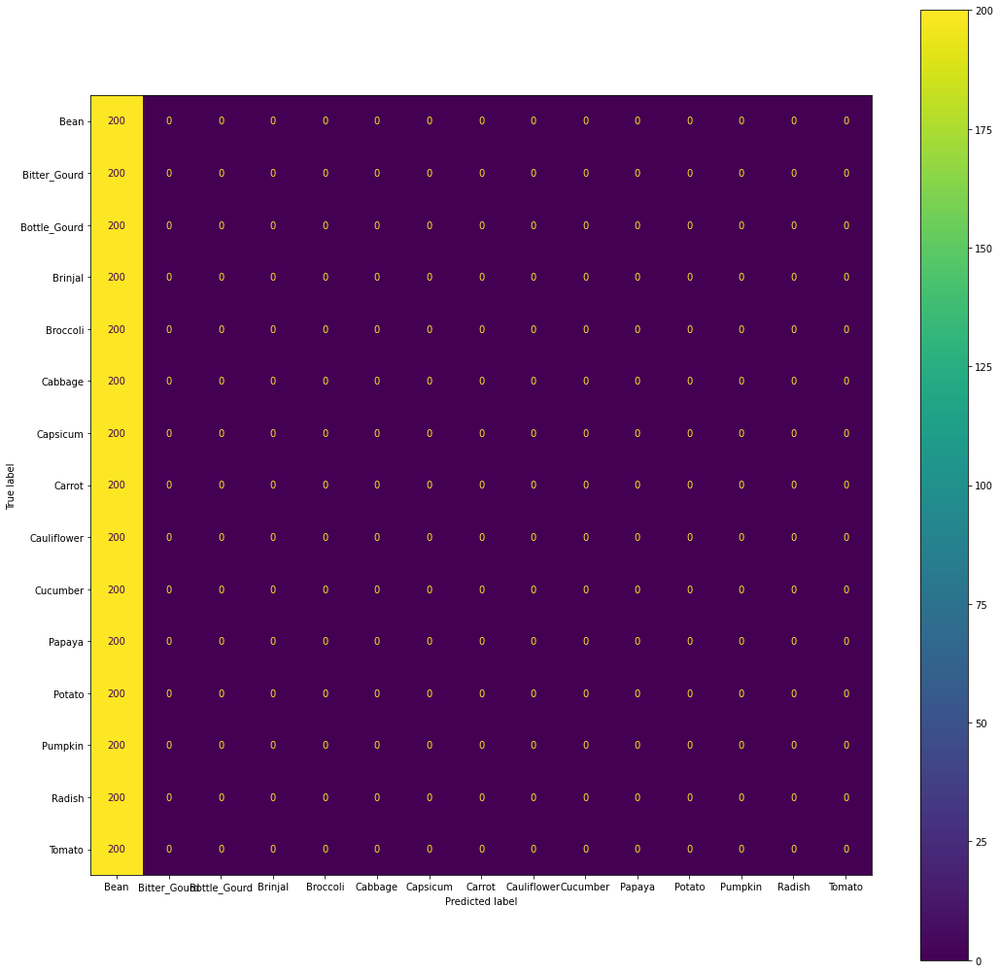

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


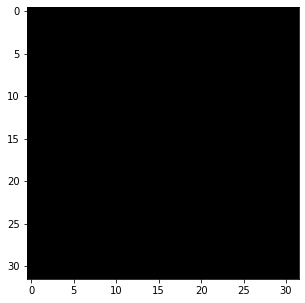

Bitter_Gourd


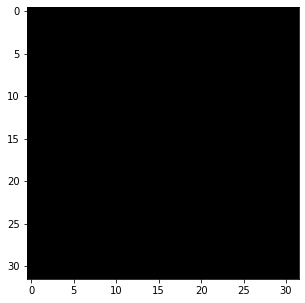

Bottle_Gourd


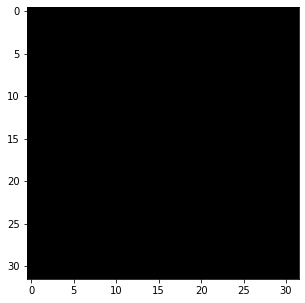

Brinjal


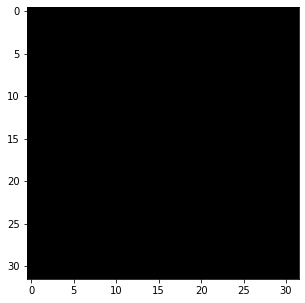

Broccoli


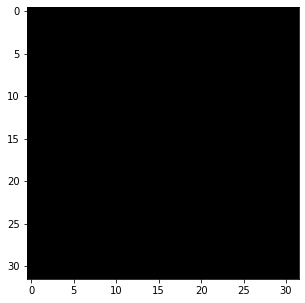

Cabbage


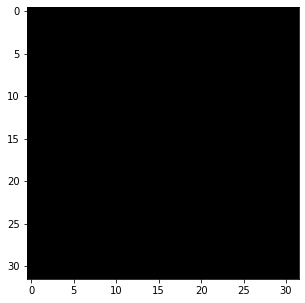

Capsicum


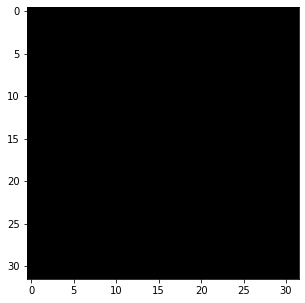

Carrot


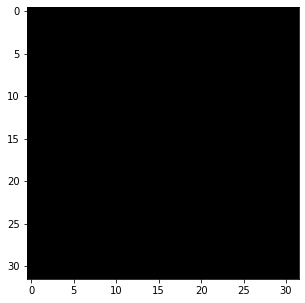

Cauliflower


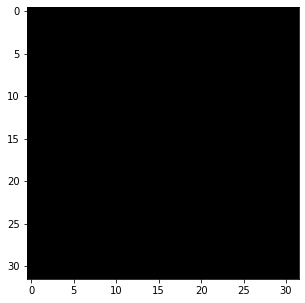

Cucumber


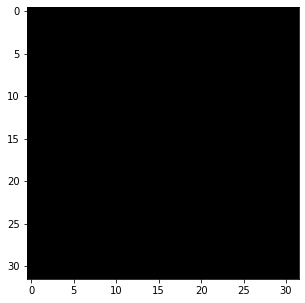

Papaya


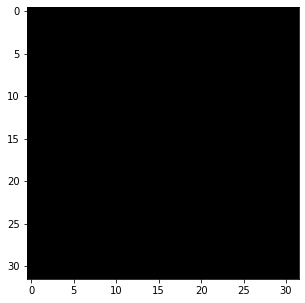

Potato


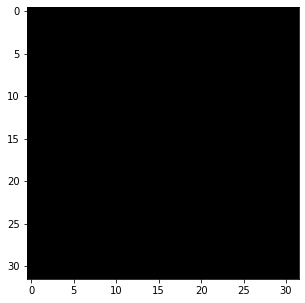

Pumpkin


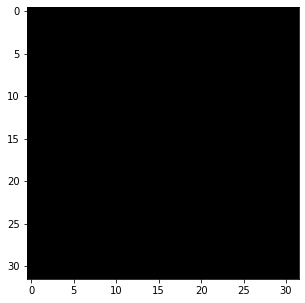

Radish


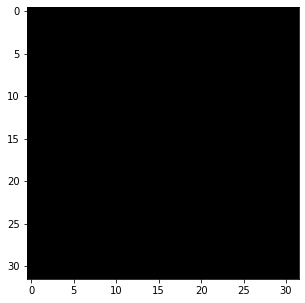

Tomato


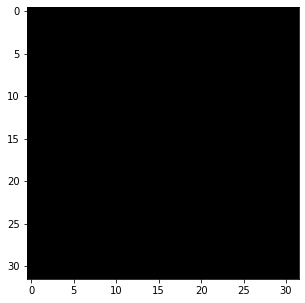

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.02, batch_size = 32, activ_func = ["tanh", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.7274849351988846, validation cost = 3.8331992442997893
Train Accuracy: 24.626666666666665 Validation Accuracy: 8.966666666666667
Epoch 2: training cost = 2.476655427825993, validation cost = 3.926333829149717
Train Accuracy: 32.04666666666667 Validation Accuracy: 9.266666666666666
Epoch 3: training cost = 2.307157481935583, validation cost = 4.0239554424957715
Train Accuracy: 36.78 Validation Accuracy: 9.6
Epoch 4: training cost = 2.1584517900813456, validation cost = 4.10483893011569
Train Accuracy: 40.06666666666667 Validation Accuracy: 9.833333333333332
Epoch 5: training cost = 2.03255445426732, validation cost = 4.184095223766792
Train Accuracy: 43.00666666666667 Validation Accuracy: 10.2
Epoch 6: training cost = 1.9222534389132175, validation cost = 4.262810228253181
Train Accuracy: 45.61333333333334 Validation Accuracy: 10.233333333333333
Epoch 7: training cost = 1.8250795753641098, validation cost = 4.344223636072816
Train Accuracy: 47.82 Validation Ac

              precision    recall  f1-score   support

           0      0.780     0.390     0.520       200
           1      0.020     0.055     0.029       200
           2      0.047     0.120     0.068       200
           3      0.029     0.035     0.031       200
           4      0.518     0.290     0.372       200
           5      0.039     0.030     0.034       200
           6      0.021     0.020     0.020       200
           7      0.005     0.005     0.005       200
           8      0.045     0.060     0.052       200
           9      0.026     0.020     0.023       200
          10      0.000     0.000     0.000       200
          11      0.014     0.015     0.014       200
          12      0.011     0.010     0.011       200
          13      0.011     0.005     0.007       200
          14      0.000     0.000     0.000       200

    accuracy                          0.070      3000
   macro avg      0.104     0.070     0.079      3000
weighted avg      0.104   

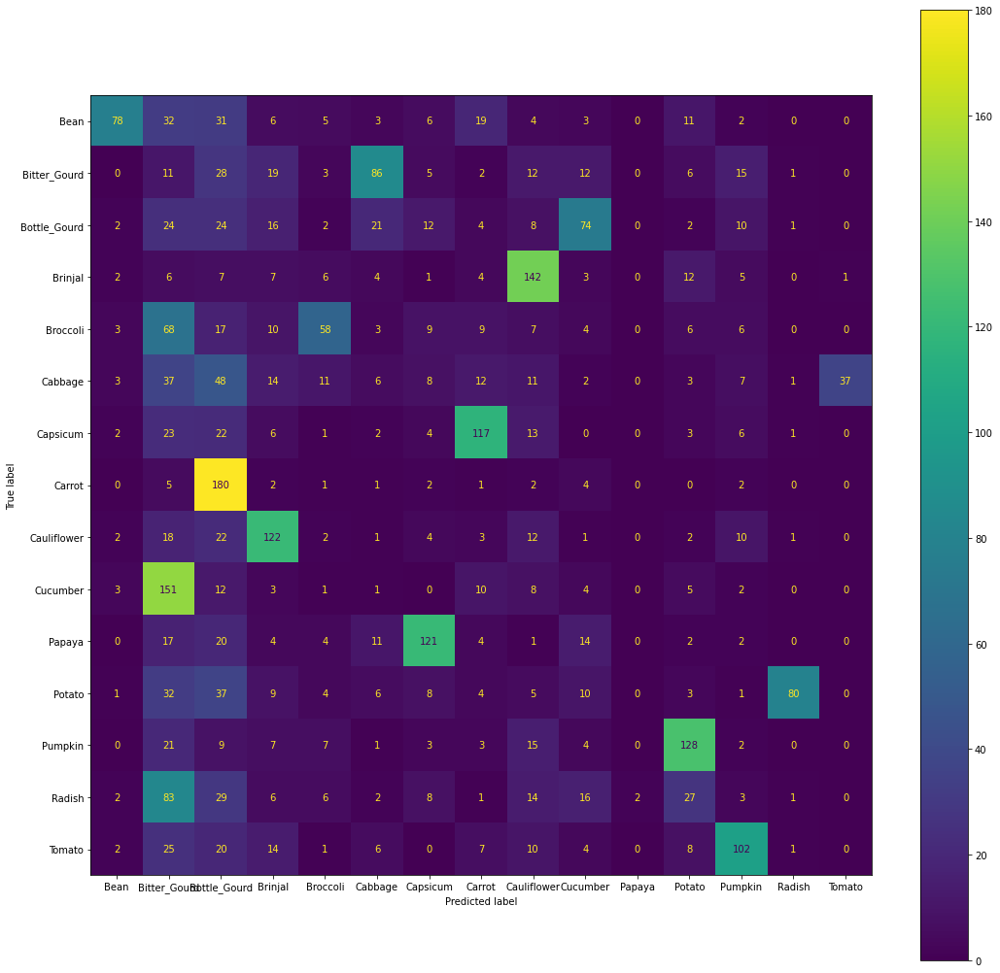

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


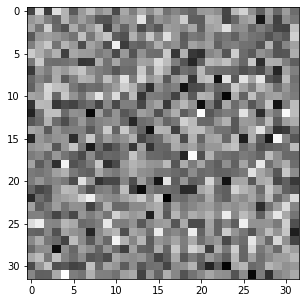

Bitter_Gourd


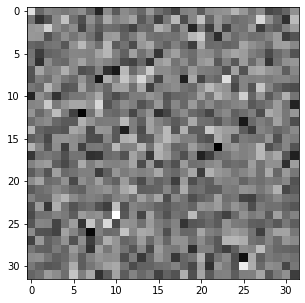

Bottle_Gourd


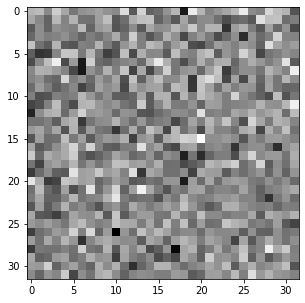

Brinjal


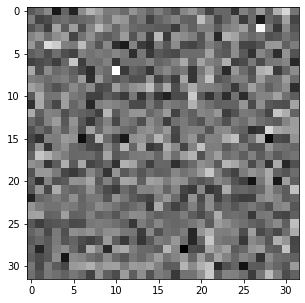

Broccoli


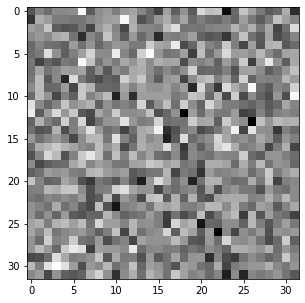

Cabbage


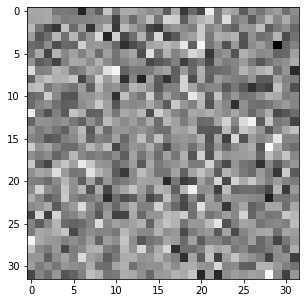

Capsicum


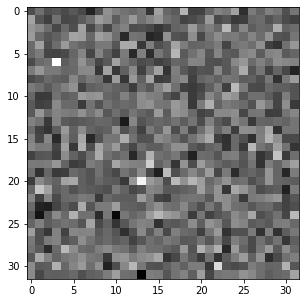

Carrot


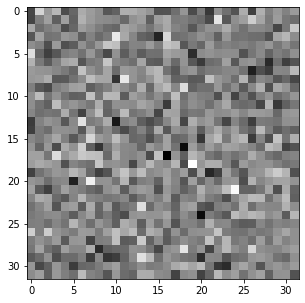

Cauliflower


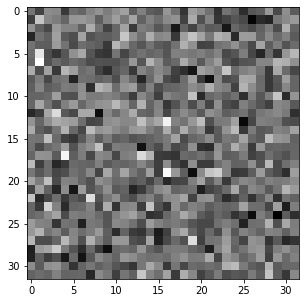

Cucumber


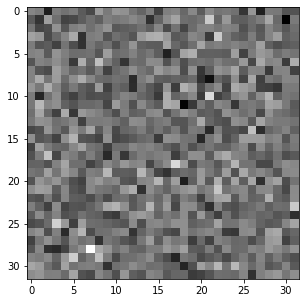

Papaya


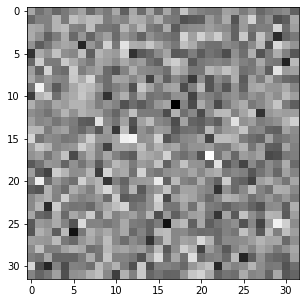

Potato


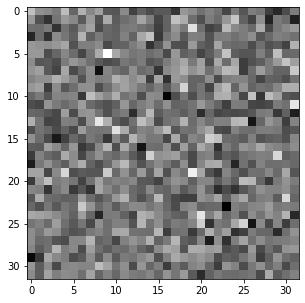

Pumpkin


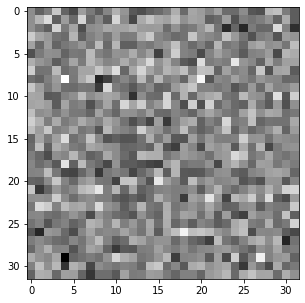

Radish


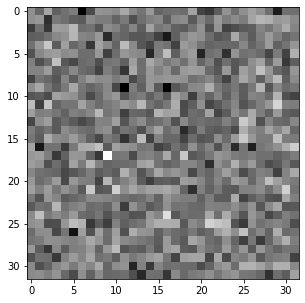

Tomato


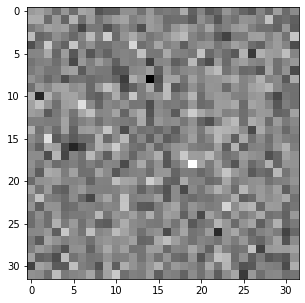

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.02, batch_size = 64, activ_func = ["sigmoid", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.4271677964240617, validation cost = 3.056376562563384
Train Accuracy: 24.113333333333333 Validation Accuracy: 8.133333333333333
Epoch 2: training cost = 2.3268488460334686, validation cost = 3.0912020034551895
Train Accuracy: 28.660000000000004 Validation Accuracy: 7.9
Epoch 3: training cost = 2.2698820042136623, validation cost = 3.1109919250236313
Train Accuracy: 31.34 Validation Accuracy: 7.766666666666666
Epoch 4: training cost = 2.2239314100923333, validation cost = 3.1305991660992936
Train Accuracy: 32.806666666666665 Validation Accuracy: 7.733333333333333
Epoch 5: training cost = 2.183546845585719, validation cost = 3.1484620725018284
Train Accuracy: 34.14666666666666 Validation Accuracy: 7.766666666666666
Epoch 6: training cost = 2.1489885894239555, validation cost = 3.1657422227244356
Train Accuracy: 35.160000000000004 Validation Accuracy: 7.933333333333334
Epoch 7: training cost = 2.114500935396395, validation cost = 3.187461403270326
Train Accuracy

              precision    recall  f1-score   support

           0      0.712     0.260     0.381       200
           1      0.023     0.025     0.024       200
           2      0.034     0.045     0.039       200
           3      0.042     0.065     0.051       200
           4      0.889     0.040     0.077       200
           5      0.052     0.060     0.056       200
           6      0.030     0.030     0.030       200
           7      0.027     0.040     0.032       200
           8      0.013     0.015     0.014       200
           9      0.038     0.030     0.033       200
          10      0.067     0.145     0.091       200
          11      0.023     0.025     0.024       200
          12      0.000     0.000     0.000       200
          13      0.009     0.005     0.007       200
          14      0.054     0.025     0.034       200

    accuracy                          0.054      3000
   macro avg      0.134     0.054     0.060      3000
weighted avg      0.134   

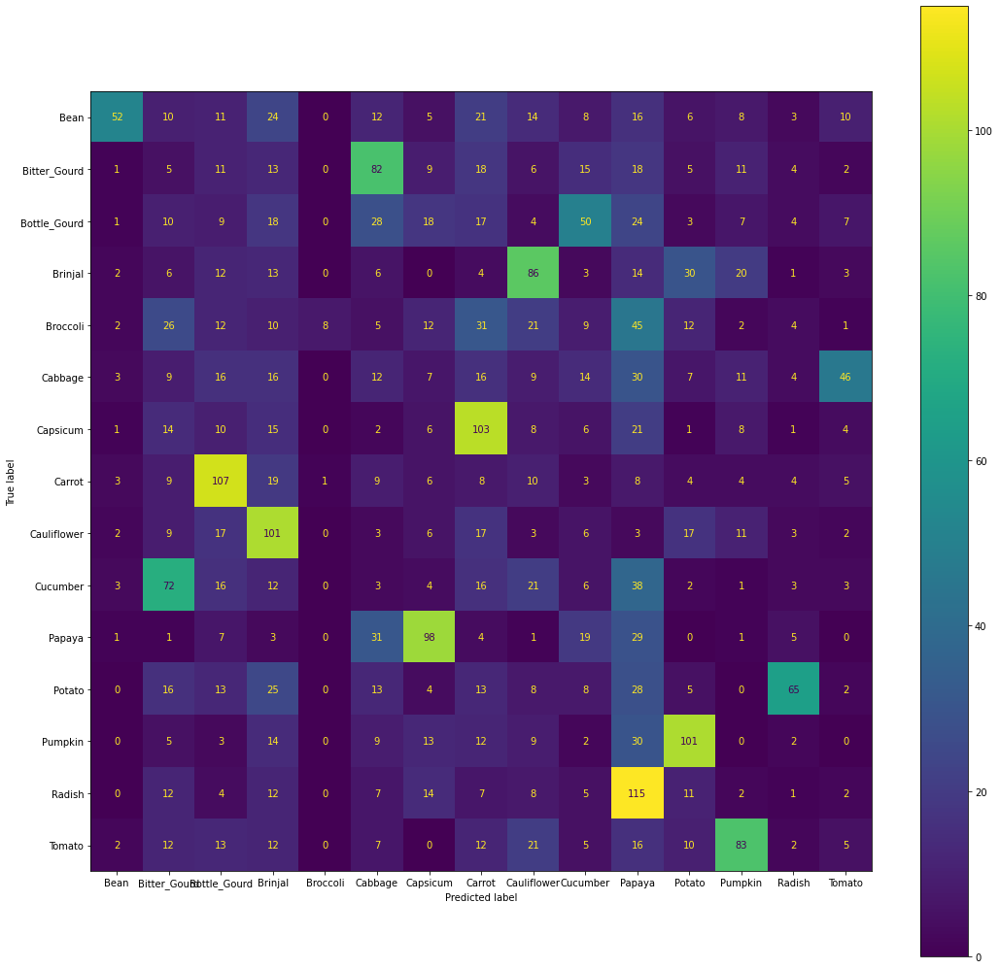

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


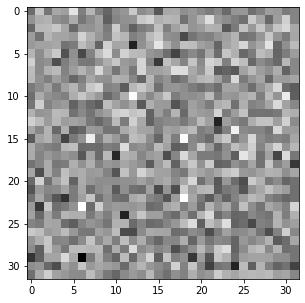

Bitter_Gourd


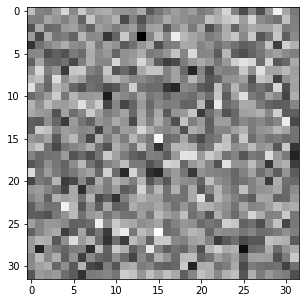

Bottle_Gourd


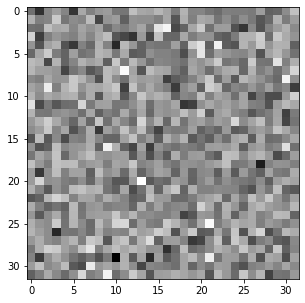

Brinjal


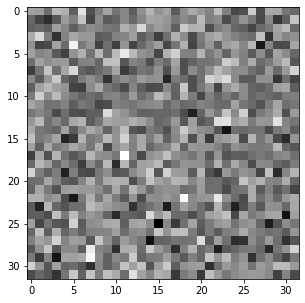

Broccoli


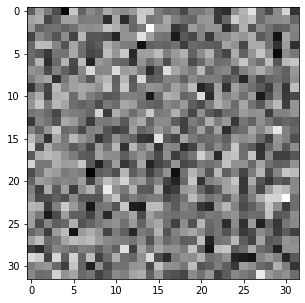

Cabbage


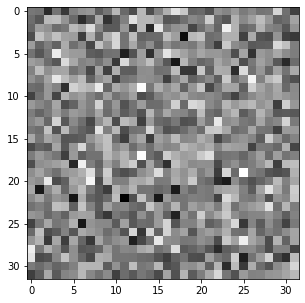

Capsicum


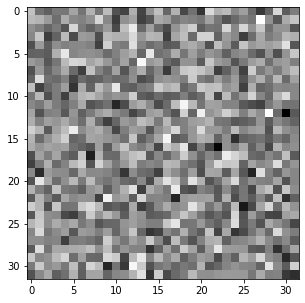

Carrot


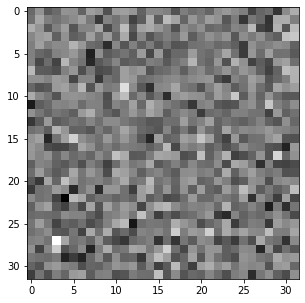

Cauliflower


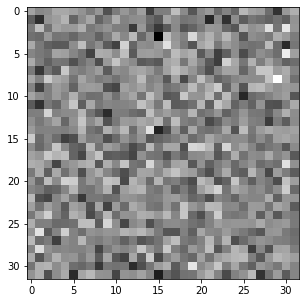

Cucumber


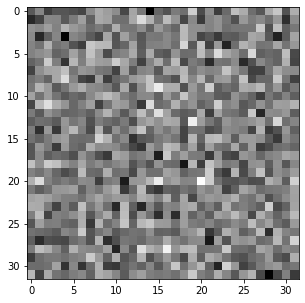

Papaya


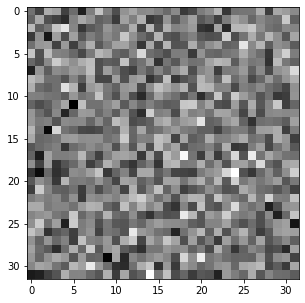

Potato


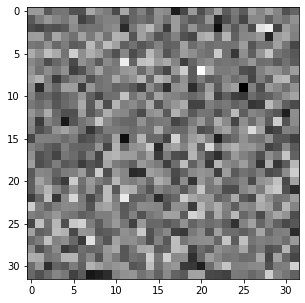

Pumpkin


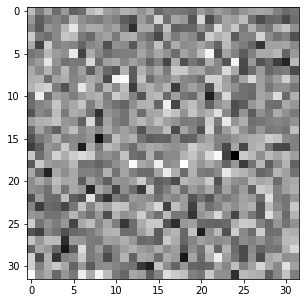

Radish


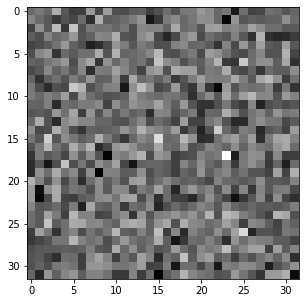

Tomato


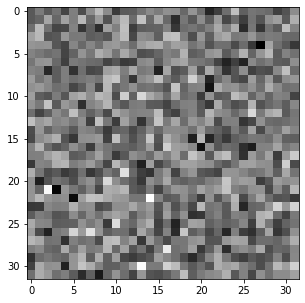

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.02, batch_size = 64, activ_func = ["relu", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 2: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 3: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 4: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 5: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 6: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 7: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 8: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667


              precision    recall  f1-score   support

           0      0.067     1.000     0.125       200
           1      0.000     0.000     0.000       200
           2      0.000     0.000     0.000       200
           3      0.000     0.000     0.000       200
           4      0.000     0.000     0.000       200
           5      0.000     0.000     0.000       200
           6      0.000     0.000     0.000       200
           7      0.000     0.000     0.000       200
           8      0.000     0.000     0.000       200
           9      0.000     0.000     0.000       200
          10      0.000     0.000     0.000       200
          11      0.000     0.000     0.000       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.000     0.000     0.000       200

    accuracy                          0.067      3000
   macro avg      0.004     0.067     0.008      3000
weighted avg      0.004   

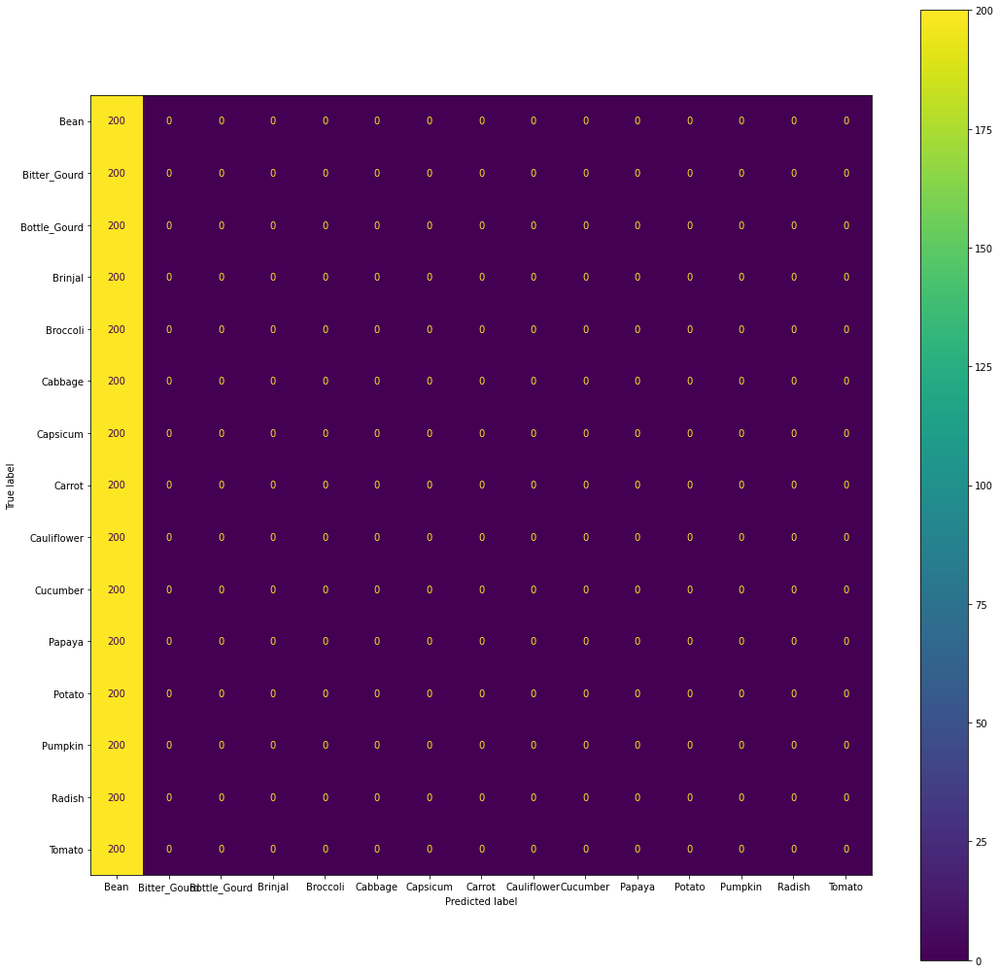

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


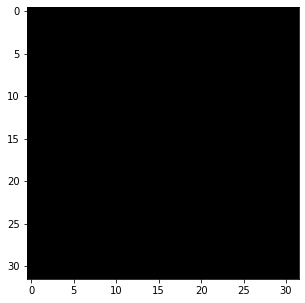

Bitter_Gourd


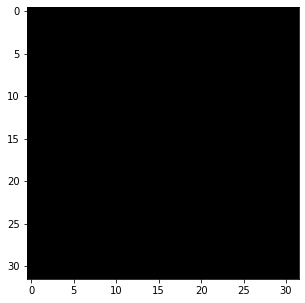

Bottle_Gourd


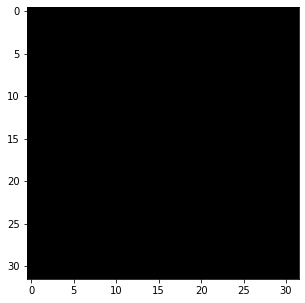

Brinjal


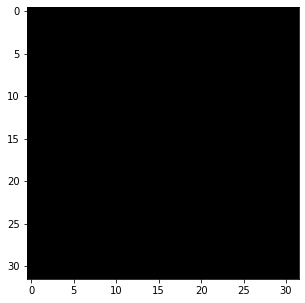

Broccoli


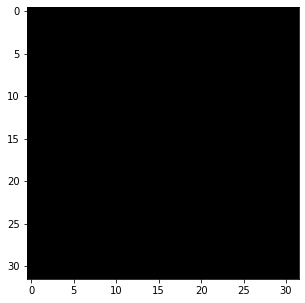

Cabbage


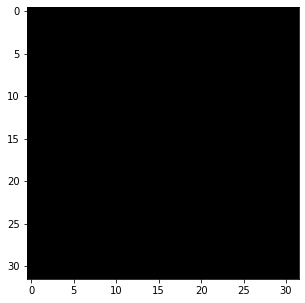

Capsicum


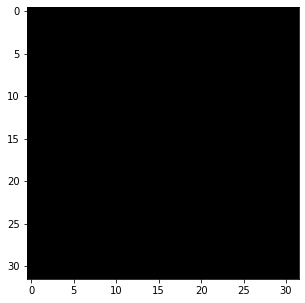

Carrot


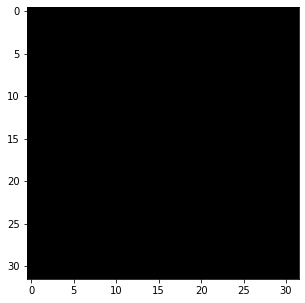

Cauliflower


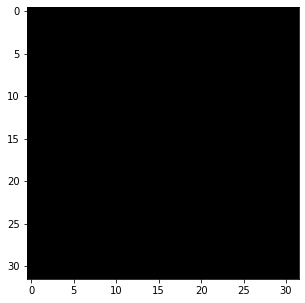

Cucumber


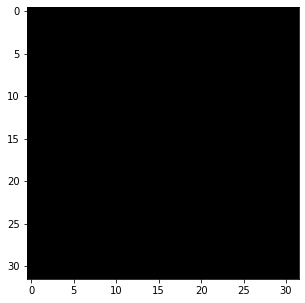

Papaya


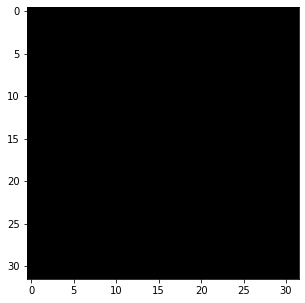

Potato


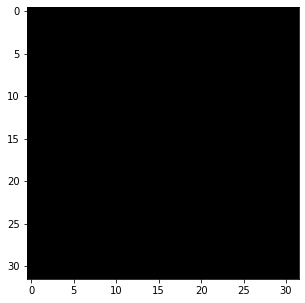

Pumpkin


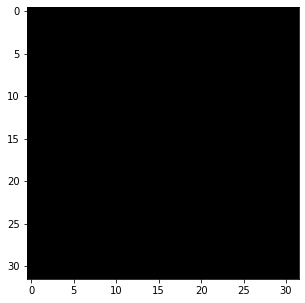

Radish


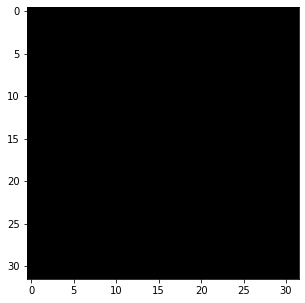

Tomato


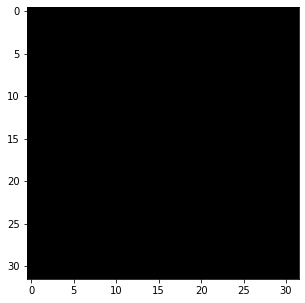

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.02, batch_size = 64, activ_func = ["tanh", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.3502552458695063, validation cost = 3.427833499219853
Train Accuracy: 26.726666666666667 Validation Accuracy: 8.799999999999999
Epoch 2: training cost = 2.1714660406173696, validation cost = 3.4921467189372364
Train Accuracy: 32.7 Validation Accuracy: 8.333333333333332
Epoch 3: training cost = 2.0458710470789145, validation cost = 3.5613395920444084
Train Accuracy: 36.973333333333336 Validation Accuracy: 8.4
Epoch 4: training cost = 1.9432226593433335, validation cost = 3.6257438361950394
Train Accuracy: 40.29333333333333 Validation Accuracy: 8.4
Epoch 5: training cost = 1.855001760532632, validation cost = 3.6885217181176047
Train Accuracy: 42.75333333333333 Validation Accuracy: 8.633333333333333
Epoch 6: training cost = 1.7773037398284166, validation cost = 3.7489857422262083
Train Accuracy: 45.22666666666667 Validation Accuracy: 8.766666666666667
Epoch 7: training cost = 1.706870423274348, validation cost = 3.8067600377359616
Train Accuracy: 47.42 Validati

              precision    recall  f1-score   support

           0      0.744     0.320     0.448       200
           1      0.029     0.050     0.037       200
           2      0.033     0.040     0.036       200
           3      0.056     0.085     0.067       200
           4      0.485     0.160     0.241       200
           5      0.068     0.085     0.076       200
           6      0.027     0.025     0.026       200
           7      0.009     0.010     0.010       200
           8      0.007     0.005     0.006       200
           9      0.009     0.005     0.006       200
          10      0.053     0.130     0.075       200
          11      0.005     0.005     0.005       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.018     0.010     0.013       200

    accuracy                          0.062      3000
   macro avg      0.103     0.062     0.070      3000
weighted avg      0.103   

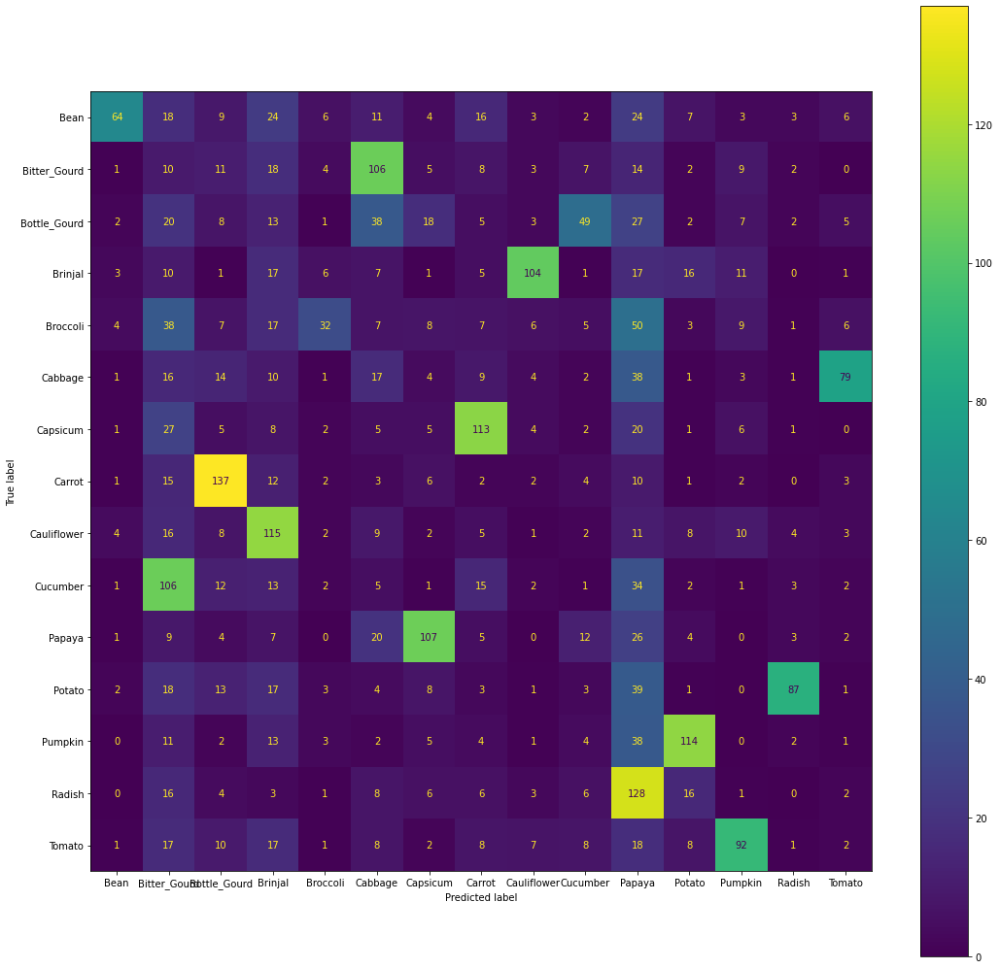

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


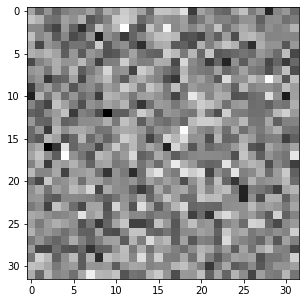

Bitter_Gourd


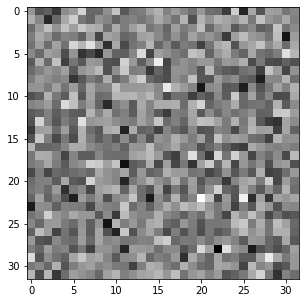

Bottle_Gourd


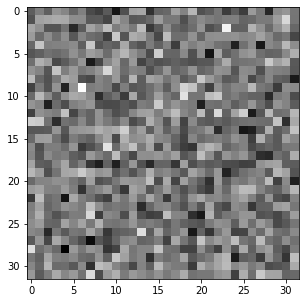

Brinjal


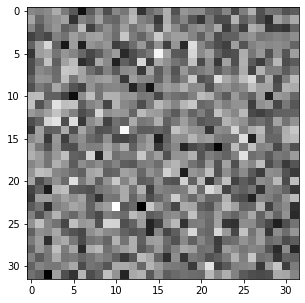

Broccoli


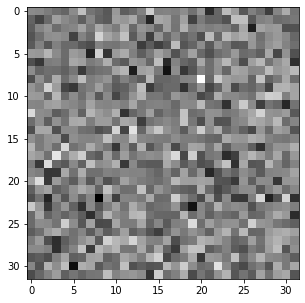

Cabbage


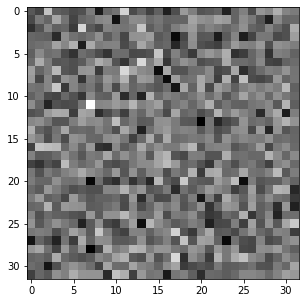

Capsicum


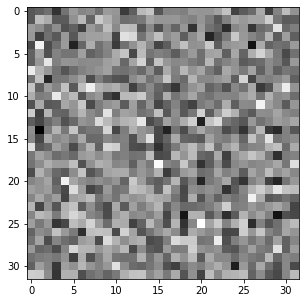

Carrot


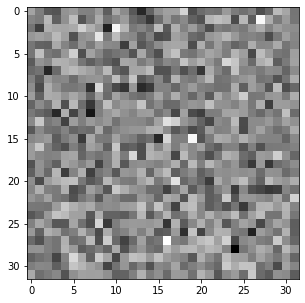

Cauliflower


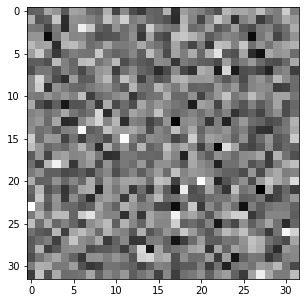

Cucumber


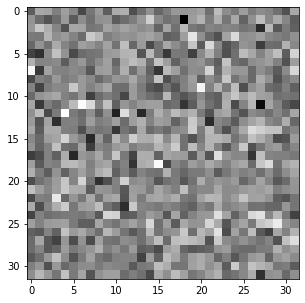

Papaya


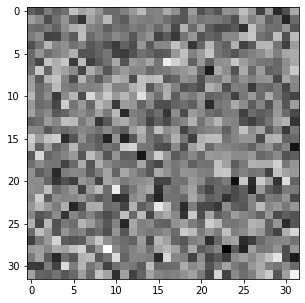

Potato


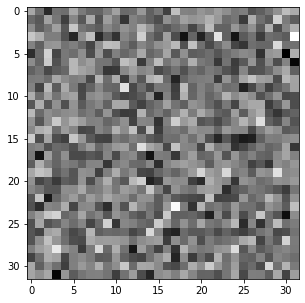

Pumpkin


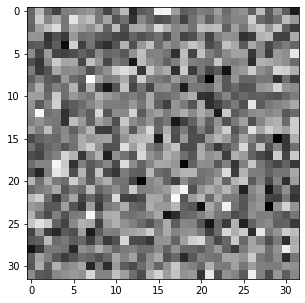

Radish


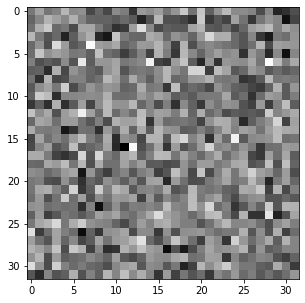

Tomato


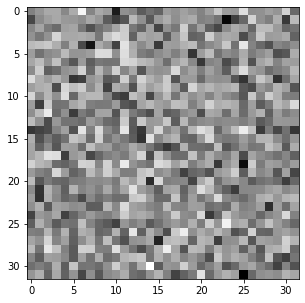

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.02, batch_size = 128, activ_func = ["sigmoid", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.468874866297583, validation cost = 2.977950679103847
Train Accuracy: 21.4 Validation Accuracy: 7.433333333333334
Epoch 2: training cost = 2.3555777337325536, validation cost = 3.0101355843034585
Train Accuracy: 26.953333333333333 Validation Accuracy: 7.366666666666667
Epoch 3: training cost = 2.301486254068376, validation cost = 3.0299811511377905
Train Accuracy: 29.360000000000003 Validation Accuracy: 7.133333333333333
Epoch 4: training cost = 2.2674173315188098, validation cost = 3.040519466587736
Train Accuracy: 31.019999999999996 Validation Accuracy: 6.833333333333333
Epoch 5: training cost = 2.241170464528964, validation cost = 3.0479425276933116
Train Accuracy: 32.04 Validation Accuracy: 6.800000000000001
Epoch 6: training cost = 2.219503753962803, validation cost = 3.0507573760555906
Train Accuracy: 32.60666666666667 Validation Accuracy: 7.066666666666667
Epoch 7: training cost = 2.1986564180622956, validation cost = 3.0603219983301915
Train Accuracy: 

              precision    recall  f1-score   support

           0      0.487     0.285     0.360       200
           1      0.032     0.020     0.025       200
           2      0.020     0.015     0.017       200
           3      0.051     0.065     0.057       200
           4      0.440     0.055     0.098       200
           5      0.063     0.090     0.074       200
           6      0.044     0.075     0.056       200
           7      0.051     0.080     0.063       200
           8      0.036     0.055     0.043       200
           9      0.009     0.005     0.006       200
          10      0.076     0.120     0.093       200
          11      0.018     0.020     0.019       200
          12      0.010     0.010     0.010       200
          13      0.022     0.015     0.018       200
          14      0.069     0.035     0.047       200

    accuracy                          0.063      3000
   macro avg      0.095     0.063     0.066      3000
weighted avg      0.095   

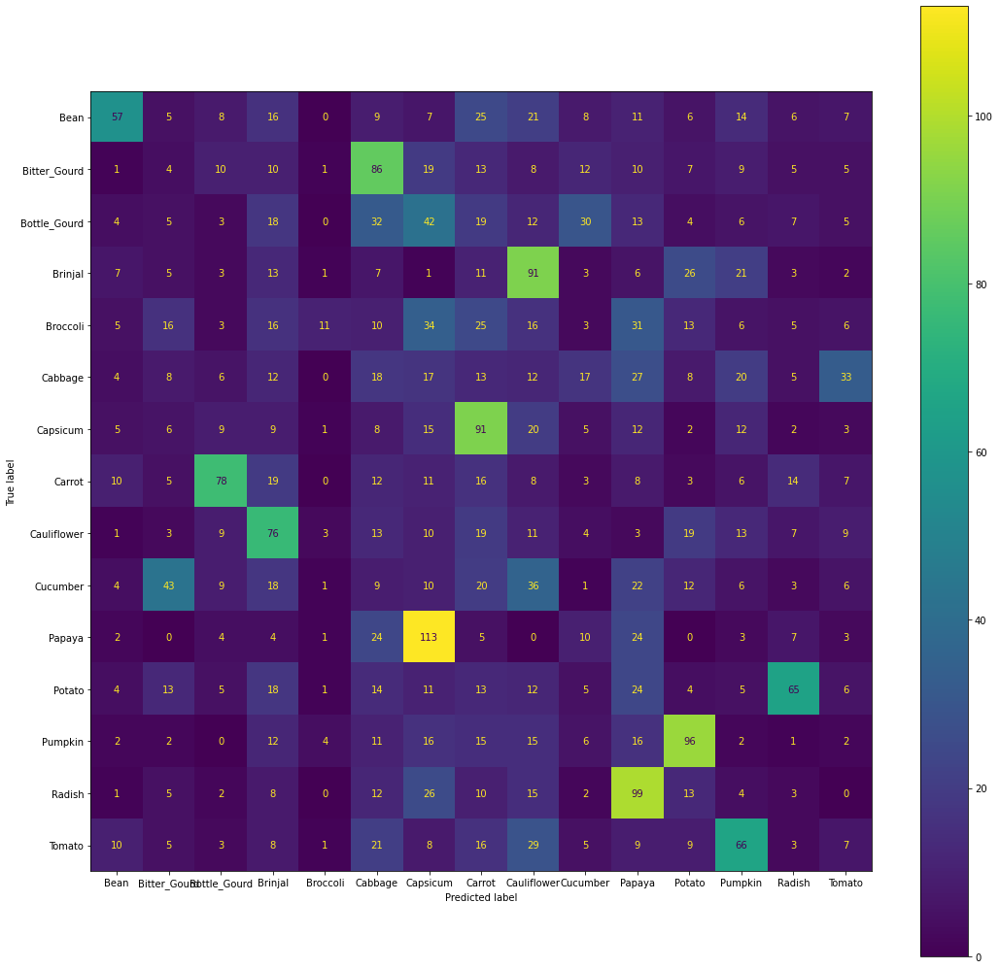

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


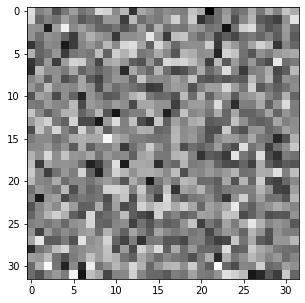

Bitter_Gourd


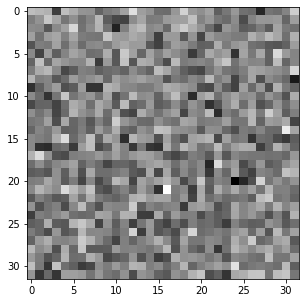

Bottle_Gourd


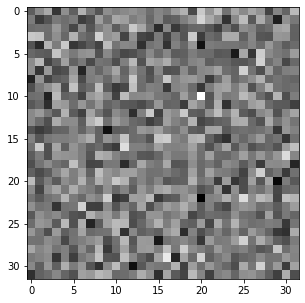

Brinjal


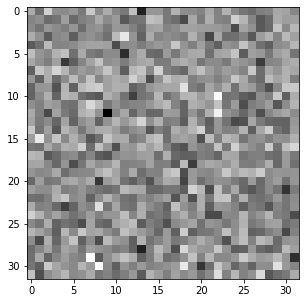

Broccoli


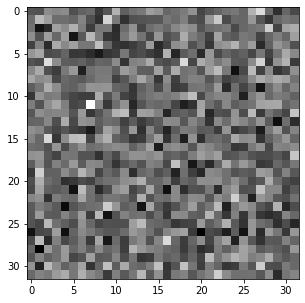

Cabbage


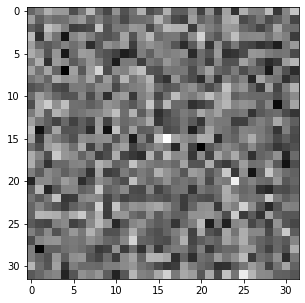

Capsicum


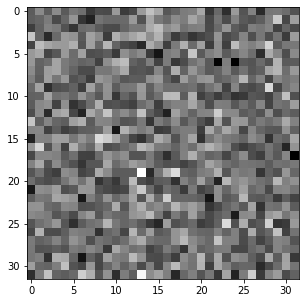

Carrot


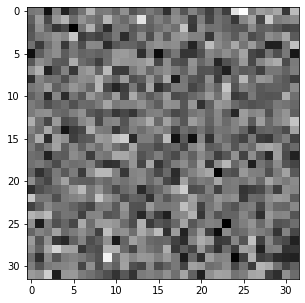

Cauliflower


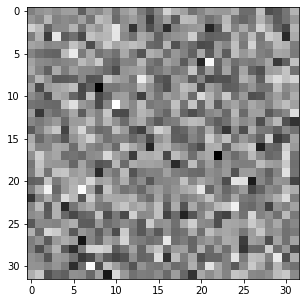

Cucumber


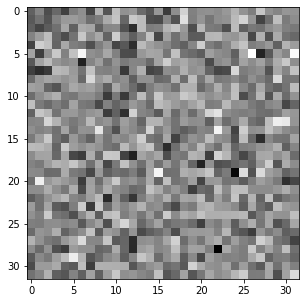

Papaya


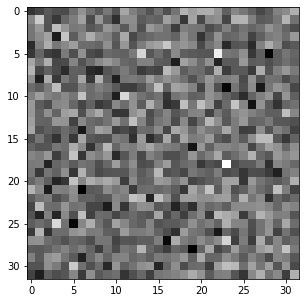

Potato


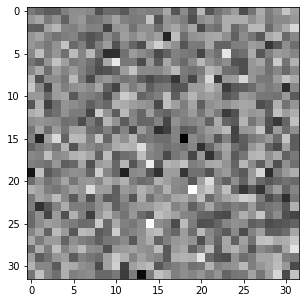

Pumpkin


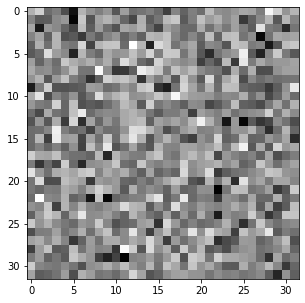

Radish


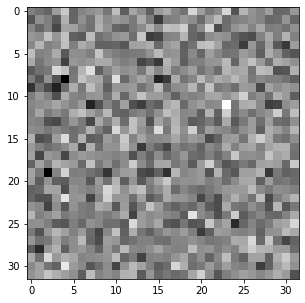

Tomato


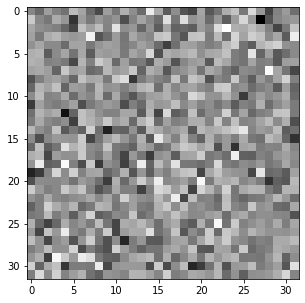

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.02, batch_size = 128, activ_func = ["relu", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 2: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 3: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 4: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 5: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 6: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 7: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667
Epoch 8: training cost = nan, validation cost = nan
Train Accuracy: 6.666666666666667 Validation Accuracy: 6.666666666666667


              precision    recall  f1-score   support

           0      0.067     1.000     0.125       200
           1      0.000     0.000     0.000       200
           2      0.000     0.000     0.000       200
           3      0.000     0.000     0.000       200
           4      0.000     0.000     0.000       200
           5      0.000     0.000     0.000       200
           6      0.000     0.000     0.000       200
           7      0.000     0.000     0.000       200
           8      0.000     0.000     0.000       200
           9      0.000     0.000     0.000       200
          10      0.000     0.000     0.000       200
          11      0.000     0.000     0.000       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.000     0.000     0.000       200

    accuracy                          0.067      3000
   macro avg      0.004     0.067     0.008      3000
weighted avg      0.004   

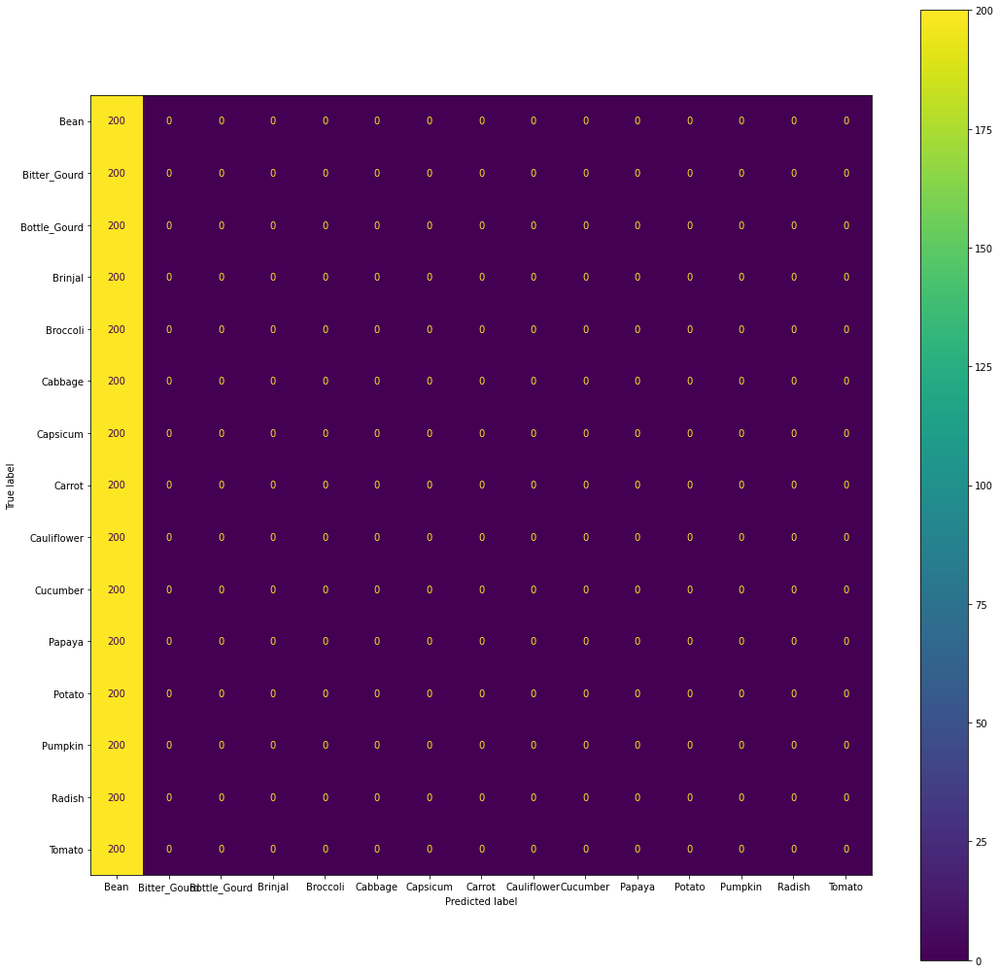

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


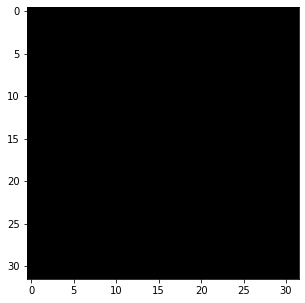

Bitter_Gourd


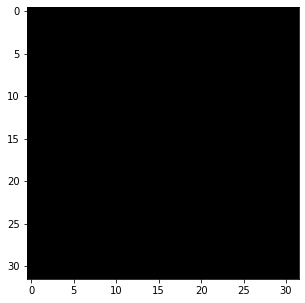

Bottle_Gourd


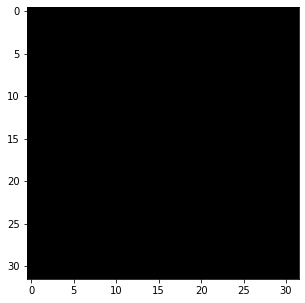

Brinjal


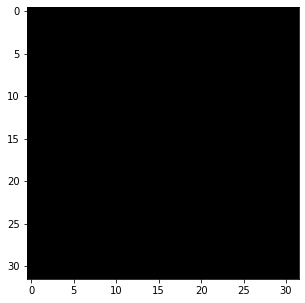

Broccoli


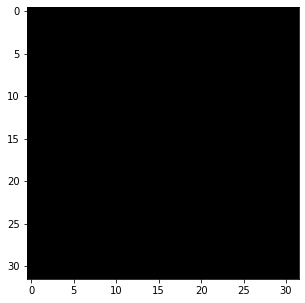

Cabbage


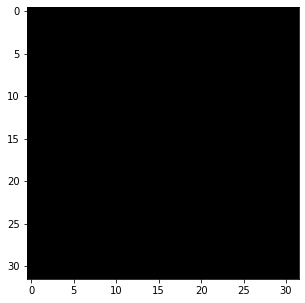

Capsicum


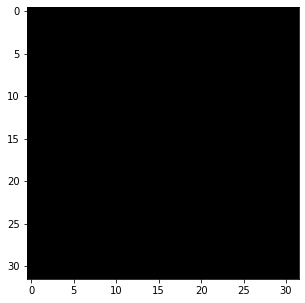

Carrot


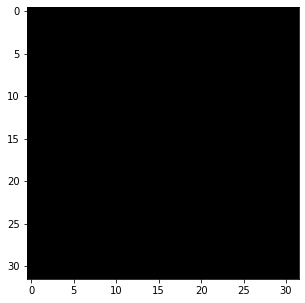

Cauliflower


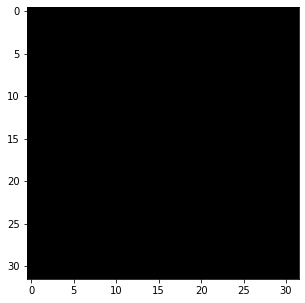

Cucumber


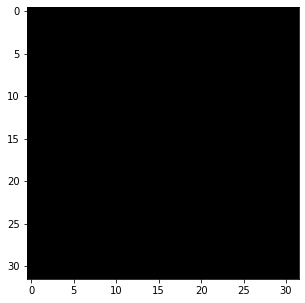

Papaya


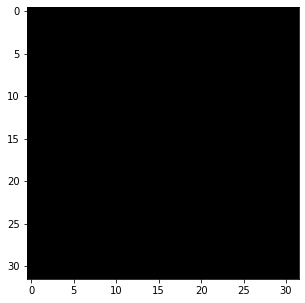

Potato


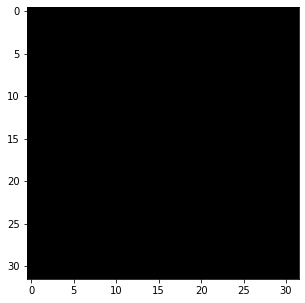

Pumpkin


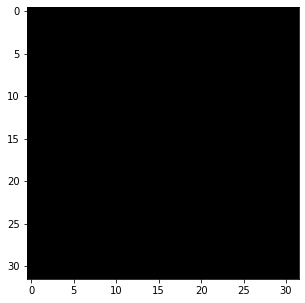

Radish


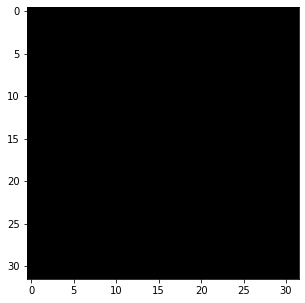

Tomato


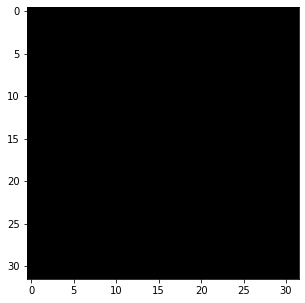

In [ ]:
model.visualize_weights(32)

In [ ]:
model = Neural_Network(hiden_layers = 1, node_sizes = [3600, 1024, 15], LR = 0.02, batch_size = 128, activ_func = ["tanh", "softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = False)

Epoch 1: training cost = 2.4757584068502094, validation cost = 3.43946459125339
Train Accuracy: 23.013333333333332 Validation Accuracy: 6.7
Epoch 2: training cost = 2.270531989383746, validation cost = 3.420950542447256
Train Accuracy: 29.333333333333332 Validation Accuracy: 6.966666666666667
Epoch 3: training cost = 2.1586088795384897, validation cost = 3.4503983223144994
Train Accuracy: 32.626666666666665 Validation Accuracy: 7.166666666666667
Epoch 4: training cost = 2.073063246755933, validation cost = 3.4850742821735685
Train Accuracy: 35.52 Validation Accuracy: 7.000000000000001
Epoch 5: training cost = 2.002409103629284, validation cost = 3.5192427745342894
Train Accuracy: 38.06 Validation Accuracy: 7.199999999999999
Epoch 6: training cost = 1.9410246671279385, validation cost = 3.5514678359692025
Train Accuracy: 40.22666666666667 Validation Accuracy: 7.3
Epoch 7: training cost = 1.886282367731262, validation cost = 3.58199087503755
Train Accuracy: 41.77333333333333 Validation A

              precision    recall  f1-score   support

           0      0.543     0.410     0.467       200
           1      0.021     0.015     0.017       200
           2      0.055     0.050     0.052       200
           3      0.043     0.050     0.046       200
           4      0.493     0.170     0.253       200
           5      0.064     0.085     0.073       200
           6      0.040     0.070     0.051       200
           7      0.034     0.035     0.034       200
           8      0.051     0.085     0.064       200
           9      0.046     0.035     0.040       200
          10      0.048     0.065     0.055       200
          11      0.036     0.035     0.036       200
          12      0.000     0.000     0.000       200
          13      0.000     0.000     0.000       200
          14      0.076     0.080     0.078       200

    accuracy                          0.079      3000
   macro avg      0.103     0.079     0.084      3000
weighted avg      0.103   

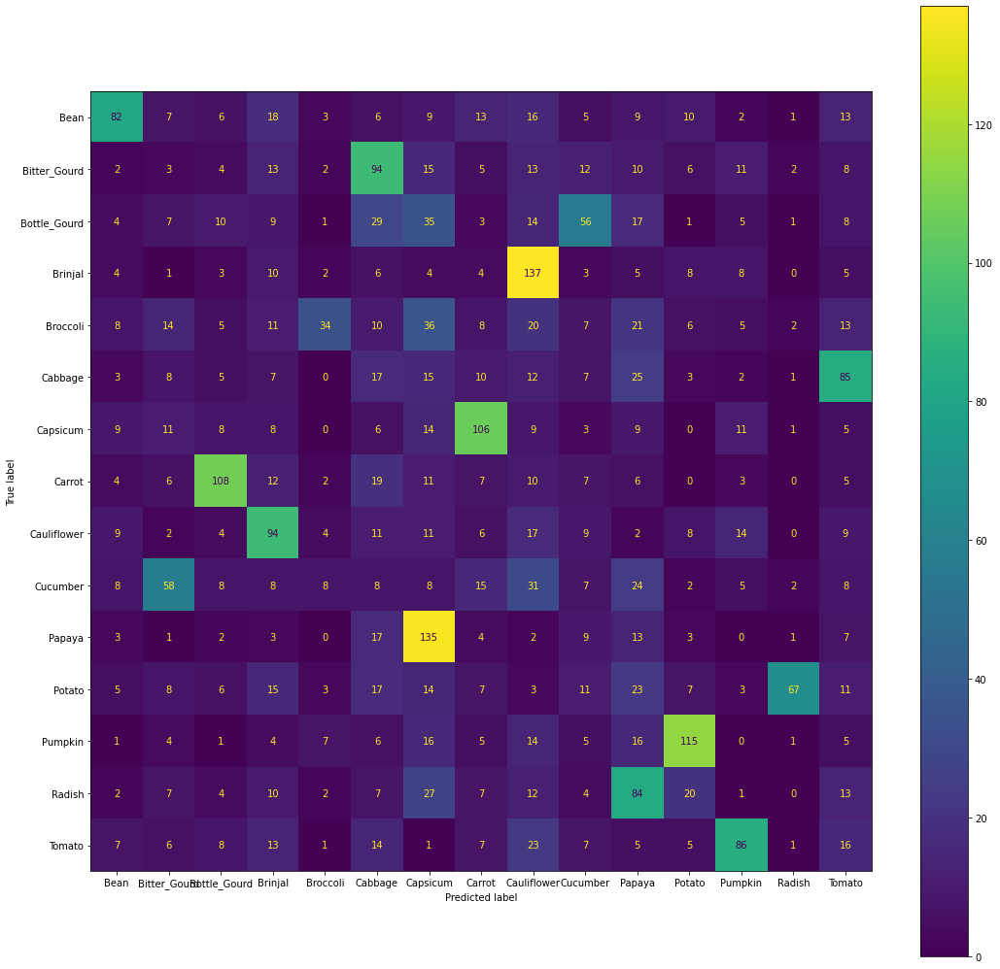

In [ ]:
model.confusion_m(X_test, Y_test)

Bean


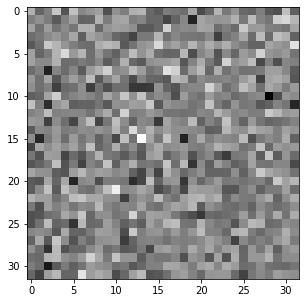

Bitter_Gourd


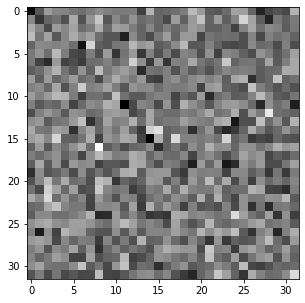

Bottle_Gourd


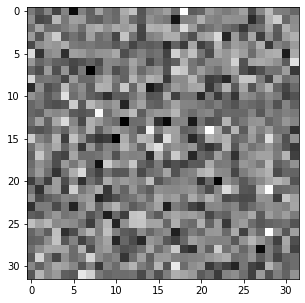

Brinjal


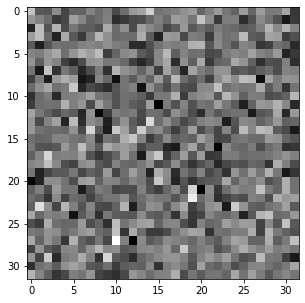

Broccoli


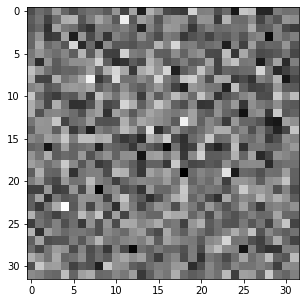

Cabbage


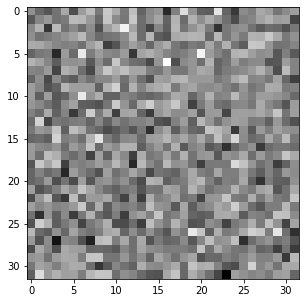

Capsicum


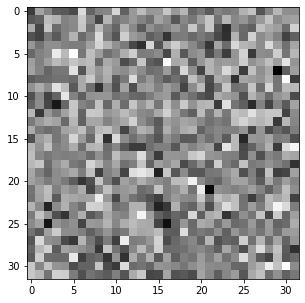

Carrot


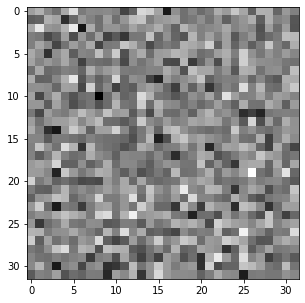

Cauliflower


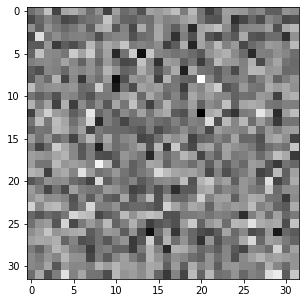

Cucumber


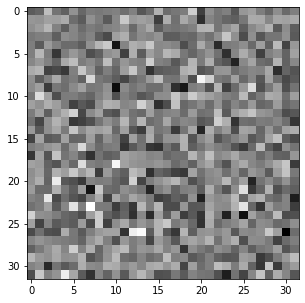

Papaya


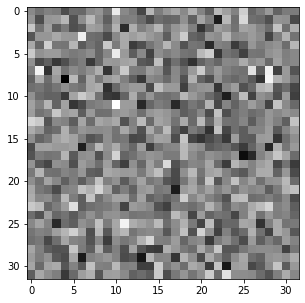

Potato


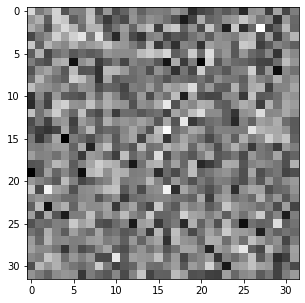

Pumpkin


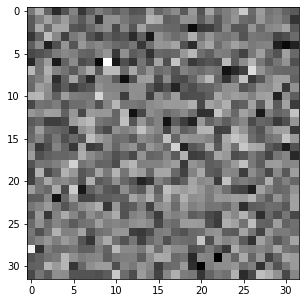

Radish


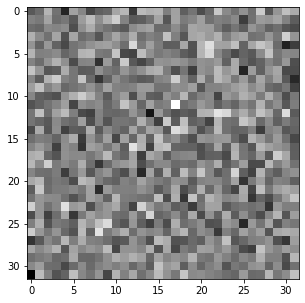

Tomato


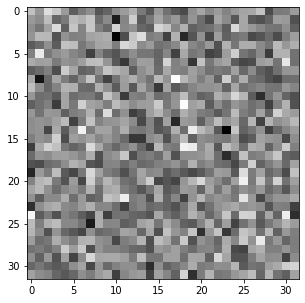

In [ ]:
model.visualize_weights(32)

# Test With Early Stopping

In [15]:
model = Neural_Network(hiden_layers = 0, node_sizes = [3600, 15], LR = 0.02, batch_size = 128, activ_func = ["softmax"] , epoch =15)
model.train(X_train= X_train,Y_train = Y_train, X_val = X_val, Y_val =Y_val, early_stopping = True)

Epoch 1: training cost = 2.8486257091367406, validation cost = 3.341011600304216
Train Accuracy: 13.973333333333333 Validation Accuracy: 5.7


              precision    recall  f1-score   support

           0      0.092     0.040     0.056       200
           1      0.018     0.010     0.013       200
           2      0.024     0.015     0.018       200
           3      0.069     0.120     0.087       200
           4      0.167     0.030     0.051       200
           5      0.076     0.135     0.098       200
           6      0.040     0.060     0.048       200
           7      0.048     0.060     0.053       200
           8      0.035     0.060     0.044       200
           9      0.085     0.070     0.077       200
          10      0.030     0.040     0.035       200
          11      0.024     0.020     0.022       200
          12      0.022     0.015     0.018       200
          13      0.014     0.010     0.012       200
          14      0.048     0.040     0.044       200

    accuracy                          0.048      3000
   macro avg      0.053     0.048     0.045      3000
weighted avg      0.053   

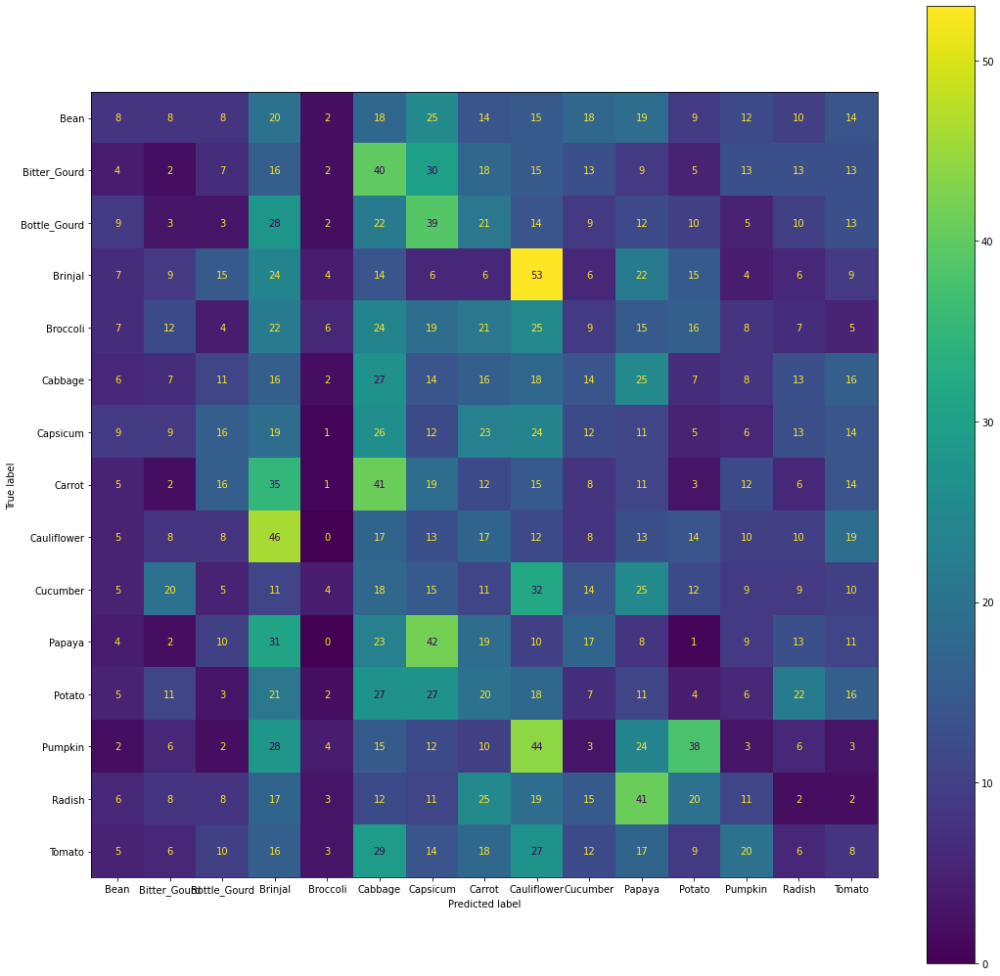

In [16]:
model.confusion_m(X_test, Y_test)

Bean


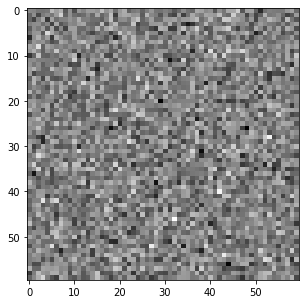

Bitter_Gourd


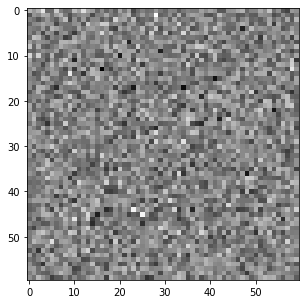

Bottle_Gourd


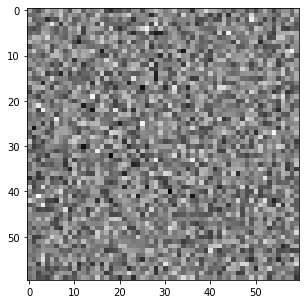

Brinjal


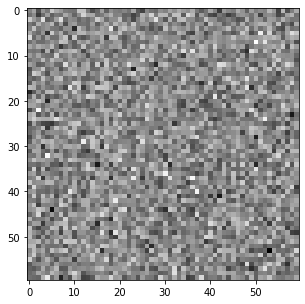

Broccoli


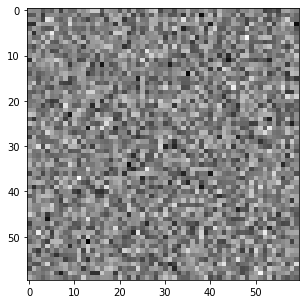

Cabbage


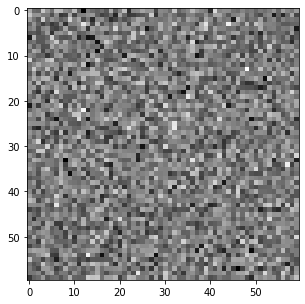

Capsicum


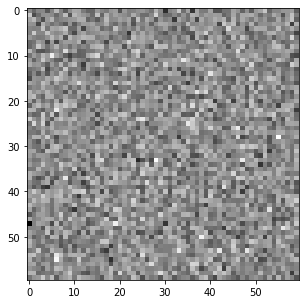

Carrot


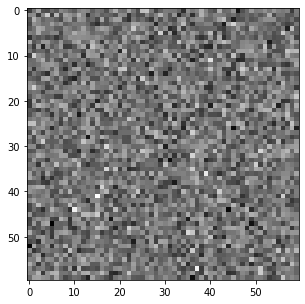

Cauliflower


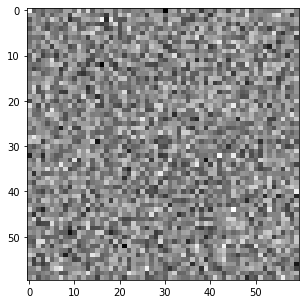

Cucumber


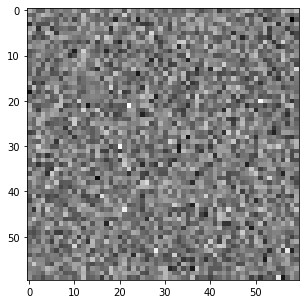

Papaya


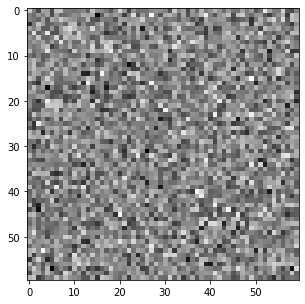

Potato


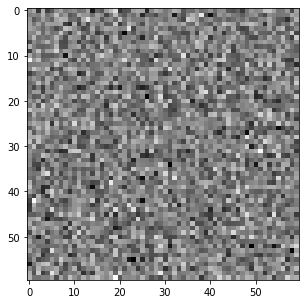

Pumpkin


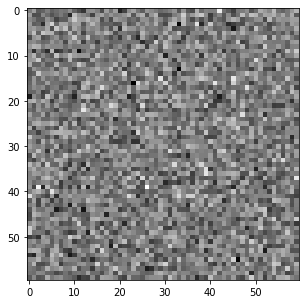

Radish


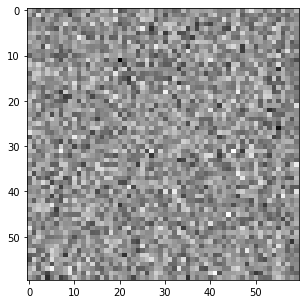

Tomato


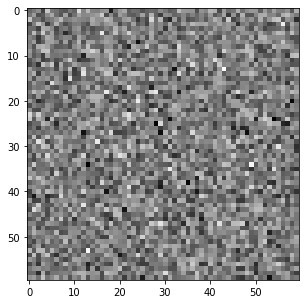

In [17]:
model.visualize_weights(60)